In [3]:
#load package
.libPaths(c("/cluster/home/liuhengxin/software/miniconda3_2/envs/r-kernel/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3/envs/r4.1.2/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3_2/envs/Rsplot/lib/R/library"))
library(data.table)
library(qs)
library(GenomicRanges)
library(GenomicFeatures)
library(rtracklayer)
library(dplyr)
library(ggbio)
library(reshape2)
library(ggsci)
library(viridis)
library(ggpubr)
library(circlize)
library(ggh4x)
library(ggtranscript)
library(khroma)  
library(randomcoloR)
library(bambu)
library(ggdensity)
library(Seurat)
library(scCustomize)
library(ComplexUpset)
library(ComplexHeatmap)

qs 0.25.5

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Loading required package: S4Vectors


Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:data.table’:

    first, second


The following object is masked from ‘package:utils’:

    findMatches


The following objects are masked from ‘package:base’:

    expand.grid, I, unname


Loading required package: I

In [4]:
#load data
setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
MySplit = function(str,sep, n){
  return(unlist(lapply(strsplit(str,sep),"[[",n)))
}
# cellan = read.csv("ref/T44/cell_type_type20230220-macaque1-contour2_v1.csv")
# cellan = unique(cellan[,c("subclass","class")])
# areaan = read.csv("ref/area_annotation.csv")
gtf = rtracklayer::import("../ref/bambu_extended_annotations_novelname.gtf")
# areaan = unique(areaan[c("L0","L3")])
# colnames(areaan) = c("lobe","area")
# areaan[areaan$area == "1/2",]$area = "1|2"
# gtfh = rtracklayer::import("ref/bambu_extended_annotations_novelname.gtf")

In [ ]:
modelcoef2 = qread("data/dtu_analysis/region_subclass_isoform_model_tri_filterlayer_24_11_1.qs")
modelcoef2$group = modelcoef2$areatr
modelcoef2[modelcoef2$areatr == "cellm",]$group = "cell"
modelcoef2[modelcoef2$areatr == "lobem",]$group = "lobe"
modelcoef2[modelcoef2$areatr == "layerm",]$group = "layer"
head(modelcoef2)
colnames(modelcoef2)[4] = "pvalue"
modelcoef.hub = modelcoef2[modelcoef2$group %in% c("cell","lobe","layer"),]
modelcoef.hub = dcast(modelcoef.hub,gene_id~group,value.var = "pvalue",fun.aggregate = sum)
modelmx1.hub = modelcoef.hub
modelmx1.hub$sig <- sapply(1:nrow(modelmx1.hub), function(i) {
  significant_cols <- names(modelmx1.hub)[-1][modelmx1.hub[i, -1] < 0.05]
  paste(significant_cols, collapse = "-")
})
head(modelmx1.hub)
colnames(modelmx1.hub)[5] = "areatr"
unique(modelmx1.hub$areatr)

groupan = data.frame("abv" = c("cb","cortex","HC","mb","p","str","v"),
                       "ano" = c("Cerebellum","Cortex","Hippocampus","Midbrain",
                                 "Pons","Striatum","Ventricle"))
# ngscount$subcortical = ngscount$layer
# ngscount[ngscount$subcortical %in% paste0("l",1:6),]$subcortical = "cortex"
# ngscount = ngscount[ngscount$subcortical != "c",]
# ngscount$subcortical = groupan[match(ngscount$subcortical,groupan$abv),]$ano
# head(ngscount)
# qsave(ngscount,file = "data/spatial_genecount_ngs_bin200_fs_total_25_04_14.qs")

In [3]:
setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")

In [5]:
# fsraw.cor = qread("data/reads_full_anotation/main_data_read_total_annotation_fil_delete_multiread_withsample_25_10_20.qs")
isosigls = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")
isosigi = isosigls$layer
head(isosigi)

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
1,AAAS,AAAS-FS-1,l1,4,24,0.16666667,0.1495626,0.1461418,0.02052482,N,0.0001939086,0.002006998
2,AAAS,AAAS-FS-1,l2,3,41,0.07317073,0.1495626,0.1648410,-0.09167030,N,0.0001939086,0.002006998
3,AAAS,AAAS-FS-1,l3,45,346,0.13005780,0.1495626,0.1534636,-0.02340581,N,0.0001939086,0.002006998
4,AAAS,AAAS-FS-1,l4,14,66,0.21212121,0.1495626,0.1370509,0.07507028,N,0.0001939086,0.002006998
5,AAAS,AAAS-FS-1,l5,10,153,0.06535948,0.1495626,0.1664033,-0.10104381,N,0.0001939086,0.002006998
6,AAAS,AAAS-FS-1,l6,28,112,0.25000000,0.1495626,0.1294752,0.12052482,Up,0.0001939086,0.002006998


In [257]:
summary(unique(isosigi[,c("gene_id","genecount")])$genecount)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   21.0    60.0   151.0   616.2   449.0 86234.0 

In [6]:
refgdf = read.csv("ref/disease_gene/Total_gene_list_summary_25_03_19.csv")

In [15]:
#fsraw.cor = qread("data/reads_full_anotation/main_data_read_total_annotation_fil_delete_multiread_25_10_09.qs")
fsraw.cor = qread("data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_28.qs")
#fsraw.cor = fsraw.cor[fsraw.cor$layer %in% paste0("l",1:6),]
#longbed = qread("ref/long_read_mapping_total_rawnano_total_fil_24_11_12.qs")

In [286]:
longbed = qread("ref/long_read_mapping_total_rawnano_total_fil_24_11_12.qs")

In [10]:
isosigls.t44 = qread("data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")
isosigls.t42 = qread("data/dtu_analysis/T42_dtu_isoform_ls_fsraw_cor_25_12_16.qs")
isosigls.t47 = qread("data/dtu_analysis/T47_dtu_isoform_ls_fsraw_cor_25_12_16.qs")

In [6]:
data6s = list()
data6s$ref = refgdf

In [32]:
suborder = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC',"PVALB",'SST','ASC','OPC','OLG','MG','EC','VLMC')
regionorder = c("29","30","23a","23b","31","23c","1|2","PE","PEa","VIP","LIPv","LIPd","PG","7op","CM","AI","CL","CPB","TPO",
               "PGa","FST","V4t","V4","TEO","TEpd","TEpv","TFO","V3v","V2","v23b")
lobeorder = c('cingulate','somatosensory','parietal','auditory','temporal','occipital')
layerorder = c("l1","l2","l3","l4","l5","l6")
subcororder = c('Cerebellum','Cortex','Hippocampus','Midbrain','Pons','Striatum','Ventricle')

In [8]:
FishEnrich = function(geneset,funcset,total_genes){
    drugovl = intersect(unique(funcset),geneset)
    geneset_size <- length(geneset)    # 感兴趣的基因集大小
    functional_category_size <- length(unique(funcset))  # 特定功能类别中的基因总数
    both <- length(drugovl)  # 两个集合都包含的基因数量
    #total_genes <- 20000  # 整个基因组中的基因总数

    contingency_table <- matrix(c(both, geneset_size - both, 
                              functional_category_size - both, 
                              total_genes - (geneset_size + functional_category_size - both)), 
                            nrow = 2)

    # 进行Fisher精确检验
    fisher_test_result <- fisher.test(contingency_table)
    # 输出p值
    p_value <- fisher_test_result$p.value

    # 计算富集分数（Enrichment Ratio），这通常是感兴趣的基因集中具有特定功能的基因比例与整个基因组中该功能基因比例的比值
    enrichment_ratio <- (both / geneset_size) / (functional_category_size / total_genes)
    res = data.frame("p.value" = p_value,"enrichscore" = enrichment_ratio,"overlap_size" = both,
                     "term_size" = functional_category_size,"query_size" = geneset_size,
                    "overlap_ratio" = both/functional_category_size)
    return(res)
}


In [8]:
#case plot
BuildPlotBed = function(npclf,nanobed,groupname,geneex,sigtr = NULL){
    readgroup = npclf[npclf$gene_id == geneex,]
    # readgroup = readgroup[readgroup$arealayer %in% paste0("l",1:6),]
    readgroup = unique(readgroup[c("readid","transcript_id","gene_id",
                                   groupname)])
    # readgroup = readgroup %>% group_by(readid) %>% 
    #   mutate(transgroup = 
    #            paste(unique(transcript_id)[order(unique(transcript_id))],
    #                              collapse = "|"))
    readgrt = nanobed[nanobed$name %in% readgroup$readid,]
    readgrt$group = readgroup[match(readgrt$name,
                                    readgroup$readid),
                              groupname]
    # readgrt$transcript_id = readgroup[match(readgrt$name,readgroup$readid),
    #                                   "transcript_id"]
    # readgrt$transgroup = readgroup[match(readgrt$name,readgroup$readid),
    #                                   "transgroup"]
    
    grtdfl = as.data.frame(readgrt)
    colnames(grtdfl)[ncol(grtdfl)] = "group"
    colnames(grtdfl)[6] = "readid"
    grtdfl = merge(grtdfl,readgroup[c("readid",
                              "transcript_id")],
          by = "readid")
    grtdfl = grtdfl[order(grtdfl$transcript_id,
                          grtdfl$start,grtdfl$end),]
    grtdfl = grtdfl[!is.na(grtdfl$group) &
                      grtdfl$group != "",]
    grtdfl
    grtdfl$readord = paste0(grtdfl$transcript_id,"-",grtdfl$readid)
    grtdfl = grtdfl %>% group_by(group) %>% 
      mutate(orid = as.numeric(factor(readord,
                                      levels = unique(readord)))) %>%
      mutate(oridnorm = orid/max(orid))
    grtdfl$sig = "black"
    grtdfl[grtdfl$group %in% sigtr, "sig"] = "red"
    return(grtdfl)
}

IsoformReadPlot = function(gtfp, grtdfl, geneex, onlyhub = T,mycolor = NULL){
    library(randomcoloR)
    library(ggbio)
    library(ggtranscript)
    tartrans = gtfp[which(gtfp$gene_id == geneex),]
    tartrans = as.data.frame(tartrans)
    tartrans = tartrans[tartrans$type == "exon",]
    tartrans = tartrans[order(tartrans$transcript_id),]
    tartrans$orid = as.numeric(factor(tartrans$transcript_id,levels = unique(tartrans$transcript_id)))
    tartrans$group = NA
    if(onlyhub){
      grtdfl = grtdfl %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
      grtdfl$readord = paste0(grtdfl$transcript_id,"-",grtdfl$readid)
      grtdfl = grtdfl %>% group_by(group) %>% 
        mutate(orid = as.numeric(factor(readord,
                                        levels = unique(readord)))) %>%
        mutate(oridnorm = orid/max(orid))
      tartrans = tartrans[tartrans$transcript_id %in% grtdfl$transcript_id,]
    }
    # tartrans = merge(tartrans,unique(grtdfl[c("transcript_id",
    #                                           "transgroup")]),
    #                  by = "transcript_id")
    tartranstx = tartrans %>% group_by(transcript_id,orid) %>% 
      summarise(start = min(start),end = max(end))
    tartranstx$group = NA
    mylim = c(min(tartranstx$start)-1000,max(tartranstx$end)+1000)
    library(ggh4x)
    
    #facetcol = list()
    #facetcoldf = unique(grtdfl[c("group","sig")])
    #facetcoldf = facetcoldf[order(facetcoldf$group,decreasing = F),]
    #for (i in 1:nrow(facetcoldf)) {
    #  facetcol[[i]] = element_text(color = facetcoldf[i,]$sig)
    #}
    #facetcol[[nrow(facetcoldf)+1]] = element_text(color = "black")
    grtdflin = to_intron(grtdfl,
                     "readord")
    no_of_colors = length(unique(grtdfl$transcript_id)) 
    colorful_palette = distinctColorPalette(no_of_colors) 
    names(colorful_palette) = unique(grtdfl$transcript_id)
    if(!is.null(mycolor)){
        colorful_palette = mycolor
    }

    
    pc = ggplot(grtdfl,aes(x = start,xend = end,
                      y = orid,
                      yend = orid,
                      fill = transcript_id,color = transcript_id)) +
      geom_segment(size = 0.5) +
      geom_segment(data = grtdflin,
                   aes(x = start,xend = end,
                       y = orid,
                       yend = orid),
                   size = 0.03,alpha = 0.5,color = "grey") +
      geom_range(data = tartrans,
                 aes(xstart = start,xend = end,
                     y = orid,
                     fill = transcript_id,color = transcript_id),
                 size = 0.2) +
      geom_intron(data = to_intron(tartrans,
                                   "transcript_id"),
                  aes(xstart = start,xend = end,strand = strand),
                  size = 0.2,
                  arrow.min.intron.length = 200,
                  arrow = arrow(length=unit(0.3,"cm"))) +
      geom_text(data = tartranstx,
                aes(x = (start + end) / 2,y = orid,
                    label = transcript_id),
                size = 3, vjust = -0.1, color = "black") +
     # facet_grid2(group~.,scales = "free",
     #             strip = strip_themed(
     #               text_y = facetcol
    #            )) +
      facet_wrap(group~.,scales = "free",ncol = 1,strip.position = "top") +
      scale_x_continuous(limits = mylim)+
      scale_color_manual(values = colorful_palette) +
      scale_fill_manual(values = colorful_palette) +
      # scale_fill_discreterainbow() +
      # scale_color_discreterainbow() +
      theme_void() + 
      ggtitle(geneex) +
      theme(legend.position = "none",
            panel.spacing = unit(0,'lines'),
            strip.background = element_rect(fill = NA,color = NA),
           strip.placement = "outside",
           plot.title = element_text(hjust = 0.5))
    pc
    
    return(pc)
}
#fsraw.cor = fsraw[fsraw$layer %in% paste0("l",1:6),]
#
IsoformReadPlotTotal = function(fsraw,isosigi,longbed,gtf,geneex,hubtrans = NULL,onlyhub = F,mycolors =NULL){
    transname = unique(isosigi[isosigi$gene_id %in% geneex,]$transcript_id)
    if(!is.null(hubtrans)){
        transname = hubtrans
    }
    if(is.null(mycolors)){
        mycolors = distinctColorPalette(length(transname))
        names(mycolors) = transname
    }
    grtdfl = BuildPlotBed(fsraw,longbed,'areatr',geneex,NULL)
    grtdfl = grtdfl[grtdfl$transcript_id %in% transname,]
    
    pci1 = IsoformReadPlot(gtf, grtdfl, geneex,onlyhub,mycolors)
    pci1
    return(pci1)
}

CaseCountPlotBox = function(fsraw,geneex,transname,mycolors = NULL){
    npcase1 = fsraw[fsraw$gene_id == geneex,]
    npcase1 = npcase1[npcase1$transcript_id %in% transname,]
    if(is.null(mycolors)){
        mycolors = distinctColorPalette(length(unique(npcase1$transcript_id)))
    }
    npcase1 = npcase1 %>% 
        group_by(areatr,chunk) %>%
        mutate(genecount = length(unique(readid))) %>% 
        filter(genecount > 10) %>%
        group_by(areatr,chunk,transcript_id) %>%
        summarise(count = length(unique(readid)),genecount = genecount[1])
    npcase1 = npcase1[npcase1$areatr != "",]
    
    npcase1$rate = npcase1$count/npcase1$genecount

    npcase1$transid = as.numeric(as.factor(npcase1$transcript_id))
    npcase1$cmpgroup = paste0(substr(npcase1$transid,1,1),
                            "-",npcase1$areatr)
    comparisons = list()
    classid = as.character(unique(npcase1$areatr))
    n = 1
    for(i in 1:length(classid)){
        for(j in (i+1):length(classid)){
            comparisons[[n]] = c(classid[i],classid[j])
            n = n + 1
        }
    }
    
    npcase1m = npcase1 %>% group_by(areatr,transcript_id) %>% summarise(mean = mean(rate))
    
    pci2 = ggplot(npcase1,
                  aes(x = areatr, y = rate, color = transcript_id)) +
      geom_boxplot() +
      geom_point(data = npcase1m,aes(x = areatr, y = mean,
                                    color = transcript_id),
                 position = position_dodge(0.75)) +
      # geom_line(data = npcase1m,aes(x = areatr, y = mean,
      #                              group = transcript_id),
      #           position = position_dodge(0.75)) +
      stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,ref.group = ".all.") + 
      scale_color_manual(values = mycolors) +
      theme_pubr() + 
    theme(axis.text.x = element_text(angle = 45,vjust = 0.5)) +
    xlab("") + ylab("Isoform read ratio")
    return(pci2)
}

CasePlotTotalClass = function(fsraw,isosigi,gtf,geneex,hubtrans = NULL,markdfb,edgesdf){
    transname = unique(isosigi[isosigi$gene_id %in% geneex,]$transcript_id)
    if(!is.null(hubtrans)){
        transname = hubtrans
    }
    mycolors = distinctColorPalette(length(transname))
    print(mycolors)
    names(mycolors) = transname
    grtdfl = BuildPlotBed(fsraw,longbed,'areatr',geneex,NULL)
    print(head(grtdfl))
    grtdfl = grtdfl[grtdfl$transcript_id %in% transname,]
    
    pci1 = IsoformReadPlot(gtf, grtdfl, geneex,onlyhub = F,mycolors)
    pci1
#ggexport(p0c1,filename = "processed/figures/f3/bambu_cell_case_NNvsNeuron_CDC42.pdf",
#           width = 6,height = 5)

    npcase1 = fsraw[fsraw$gene_id == geneex,]
    npcase1 = npcase1 %>% 
        group_by(areatr,chunk) %>%
        mutate(genecount = length(unique(readid))) %>% 
        filter(genecount > 10) %>%
        group_by(areatr,chunk,transcript_id) %>%
        summarise(count = length(unique(readid)),genecount = genecount[1])
    npcase1 = npcase1[npcase1$areatr != "",]
    npcase1 = npcase1[npcase1$transcript_id %in% transname,]
    npcase1$rate = npcase1$count/npcase1$genecount

    npcase1$transid = as.numeric(as.factor(npcase1$transcript_id))
    npcase1$cmpgroup = paste0(substr(npcase1$transid,1,1),
                            "-",npcase1$areatr)
    comparisons = list()
    classid = as.character(unique(npcase1$areatr))
    n = 1
    for(i in 1:length(classid)){
        for(j in (i+1):length(classid)){
            comparisons[[n]] = c(classid[i],classid[j])
            n = n + 1
        }
    }


    
    npcase1m = npcase1 %>% group_by(areatr,transcript_id) %>% summarise(mean = mean(rate))
    
#library(ggstatsplot)

    pci2 = ggplot(npcase1,
                  aes(x = areatr, y = rate, color = transcript_id)) +
      geom_boxplot() +
      geom_point(data = npcase1m,aes(x = areatr, y = mean,
                                    color = transcript_id),
                 position = position_dodge(0.75)) +
      geom_line(data = npcase1m,aes(x = areatr, y = mean,
                                   group = transcript_id),
                position = position_dodge(0.75)) +
      stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,ref.group = ".all.") + 
      scale_color_manual(values = mycolors) +
      theme_pubr() + xlab("") + ylab("Isoform read ratio")
    
#     pci2 = ggbarplot(npcase1,
#                     x = "areatr", y = "rate", 
#                     fill = "areatr",size = 0.5,
#                     width = 0.7,facet.by = "transcript_id",
#                     add = c("mean_se")) +
#         geom_jitter(data = npcase1,
#                 aes(x = areatr, y = rate),size = 0.3,
#                     width = 0.25) +
#         scale_fill_flatui() +
# #        scale_fill_manual(values = mycolors) +
#         stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,
#                            ref.group = ".all.") + 
#         xlab("") + ylab("Isoform ratio") + labs(fill = "") +
#         theme_pubr() + 
#     theme(axis.text.x = element_blank(),
#          axis.ticks.x = element_blank(),
#           legend.position = "bottom")
#     pci2
    pci3 = MarkerSpPlot(fsraw.cor,markdfb,geneex,hubtrans,edgesdf,200)
    #pci3 = MarkerSpPlot(fsrawdp.cell,fsrawdp.cellb,geneex,mycolors,hubtrans)
    
    pci = ggarrange(ggarrange(pci1,pci2,widths = c(1.5,2),ncol = 1),pci3,nrow = 1)
    return(pci)
}



In [9]:
theme_presentation<- function(base_size = 16, base_family = "") {
  # Starts with theme_grey and then modify some parts
  theme_bw(base_size = base_size, base_family = base_family) %+replace%
    theme(
      strip.background = element_blank(),
      strip.text.x = element_text(size=16,colour="white"),
      strip.text.y = element_text(size=16,colour="white"),
      axis.text.x = element_blank(),
      axis.text.y = element_blank(),
      axis.ticks =  element_blank(), 
      axis.title.x= element_blank(),
      axis.title.y= element_blank(),
      panel.background = element_rect(fill="black"), 
      panel.border =element_blank(),  
      panel.grid.major = element_blank(), 
      panel.grid.minor = element_blank(), 
      panel.margin = unit(1.0, "lines"), 
      plot.background = element_rect(fill="black"), 
      plot.title =element_text(size=16,colour="white"), 
      # plot.margin = unit(c(1,  1, 1, 1), "lines"),
      legend.background=element_rect(fill='black'),
      legend.title=element_text(size=12,colour="white"),
      legend.text=element_text(size=12,colour="white"),
      legend.key = element_rect( fill = 'black'),
      # legend.key.size = unit(c(0, 0), "lines"),
      axis.line.x = element_blank(),
      axis.line.y = element_blank()
    )
}


### Disease gene list build

In [9]:
library(readxl)    
  multiplesheets <- function(fname) {
    
    # getting info about all excel sheets
    sheets <- readxl::excel_sheets(fname)
    tibble <- lapply(sheets, function(x) readxl::read_excel(fname, sheet = x))
    data_frame <- lapply(tibble, as.data.frame)
    
    # assigning names to data frames
    names(data_frame) <- sheets
    
    # print data frame
    #print(data_frame)
    return(data_frame)
  }

In [459]:
library(readxl)
df.ASD.ra = read_excel("ref/disease_gene/41588_2022_1104_MOESM3_ESM.xlsx", sheet = 15)
colnames(df.ASD.ra)

df.SCZ.ra = read_excel("ref/disease_gene/41586_2022_4556_MOESM3_ESM.xlsx", sheet = 3)
colnames(df.SCZ.ra)
df.ASD = read.table("ref/disease_gene/ASC_gene_results.tsv",header = T)
colnames(df.ASD)
df.DDD = read_excel("ref/disease_gene/41586_2020_2832_MOESM4_ESM.xlsx")
colnames(df.DDD)
path = "ref/disease_gene/science.aat8127/aat8127_table_s4.xlsx"
disref = multiplesheets(path)
colnames(disref$SCZ.SMR)

[1] "gene"                      "gene_gencodeV33"          
 [3] "gene_id"                   "chromosome"               
 [5] "pLI"                       "LOEUF"                    
 [7] "FDR_ASD"                   "FDR_DD"                   
 [9] "DN_count_asd"              "DN_count_dd"              
[11] "C statistic"               "Posterior_probability_ASD"
[13] "Expressed"

[1] "Gene Symbol"                   "Gene Name"                    
 [3] "Case PTV"                      "Ctrl PTV"                     
 [5] "Case mis3"                     "Ctrl mis3"                    
 [7] "Case mis2"                     "Ctrl mis2"                    
 [9] "P ca/co (Class 1)"             "P ca/co (Class 2)"            
[11] "P ca/co (comb)"                "De novo PTV"                  
[13] "De novo mis3"                  "De novo mis2"                 
[15] "P de novo"                     "P meta"                       
[17] "Q meta"                        "OR (PTV)"                     
[19] "OR (Class I)"                  "OR (Class II)"                
[21] "Case syn"                      "Ctrl syn"                     
[23] "P ca/co (syn)"                 "P meta, no gnomAD"            
[25] "Case/Ctrl PTV, no gnomAD"      "Case/Ctrl mis3, no gnomAD"    
[27] "Case/Ctrl mis2, no gnomAD"     "P ca/co (Class I), no gnomAD" 
[29] "P ca/co (Class II), no gnomAD" "P ca/co (comb), no gnomAD"

[1] "gene_id"       "group"         "xcase_dn_ptv"  "xcont_dn_ptv" 
 [5] "xcase_dn_misb" "xcont_dn_misb" "xcase_dn_misa" "xcont_dn_misa"
 [9] "xcase_dbs_ptv" "xcont_dbs_ptv" "xcase_swe_ptv" "xcont_swe_ptv"
[13] "xcase_tut"     "xcont_tut"     "qval"

[1] "symbol"                  "hgnc_id"                
 [3] "chr"                     "diagnostic_category"    
 [5] "coding_sequence_variant" "frameshift_variant"     
 [7] "inframe_deletion"        "inframe_insertion"      
 [9] "initiator_codon_variant" "missense_variant"       
[11] "splice_acceptor_variant" "splice_donor_variant"   
[13] "stop_gained"             "stop_lost"              
[15] "stop_retained_variant"   "synonymous_variant"     
[17] "PTV_enrichment_p"        "power_median"           
[19] "s_het"                   "observed_full"          
[21] "expected_full"           "enrich_all_p_full"      
[23] "enrich_mis_p_full"       "cluster_p_full"         
[25] "denovoWEST_p_full"       "observed_ud"            
[27] "expected_ud"             "enrich_all_p_ud"        
[29] "enrich_mis_p_ud"         "cluster_p_ud"           
[31] "denovoWEST_p_ud"         "denovoWEST_p_ud_synmod" 
[33] "gnomad_oe_syn"           "significant"

New names:
• `` -> `...2`
Warning message:
"Expecting numeric in T5551 / R5551C20: got '7.71236473158186e-321'"
Warning message:
"Expecting numeric in T5875 / R5875C20: got '1.77863632502849e-322'"
Warning message:
"Expecting numeric in T9464 / R9464C20: got '1.76999017622627e-319'"
Warning message:
"Expecting numeric in T12786 / R12786C20: got '8.80999999191014e-316'"
Warning message:
"Expecting numeric in AB12817 / R12817C28: got 'NA'"
Warning message:
"Expecting numeric in AC12817 / R12817C29: got 'NA'"
Warning message:
"Expecting numeric in T13232 / R13232C20: got '6.8399999999901e-313'"
Warning message:
"Expecting numeric in T4935 / R4935C20: got '7.71236473158186e-321'"
Warning message:
"Expecting numeric in T5248 / R5248C20: got '1.77863632502849e-322'"
Warning message:
"Expecting numeric in T8688 / R8688C20: got '1.76999017622627e-319'"
Warning message:
"Expecting numeric in T9903 / R9903C20: got '3.35e-310'"
Warning message:
"Expecting numeric in T11857 / R11857C20: got '8.809

[1] "GWAS"        "probeID"     "ProbeChr"    "Gene"        "Probe_bp"   
 [6] "topSNP"      "topSNP_chr"  "topSNP_bp"   "A1"          "A2"         
[11] "Freq"        "b_GWAS"      "se_GWAS"     "p_GWAS"      "b_eQTL"     
[16] "se_eQTL"     "p_eQTL"      "b_SMR"       "se_SMR"      "p_SMR"      
[21] "p_SMR_multi" "p_HEIDI"     "nsnp_HEIDI"

In [ ]:
colnames(disref$SCZ.TWAS)

In [460]:
#ASD & NDD

Dsgdf = NULL
df.ASD.ra = read_excel("ref/disease_gene/41588_2022_1104_MOESM3_ESM.xlsx", sheet = 15)
#head(df.ASD.ra)
Dsgdf.ASD.talk = data.frame("gene_id" = unique(df.ASD.ra[df.ASD.ra$FDR_ASD < 0.01,]$gene),
                            #"source" = "ASD.PTV",
                            "source" = "ASD.Talkowski",
                            "group" = "ASD")

Dsgdf.NDD.talk = data.frame("gene_id" = unique(df.ASD.ra[df.ASD.ra$FDR_DD < 0.01,]$gene),
                           # "source" = "NDD.PTV",
                            "source" = "NDD.Talkowski",
                            "group" = "NDD")
#SCZ
df.SCZ.ra = read_excel("ref/disease_gene/41586_2022_4556_MOESM3_ESM.xlsx", sheet = 3)
Dsgdf.SCZ = data.frame("gene_id" = df.SCZ.ra[1:10,]$`Gene Symbol`,
                      # "source" = "SCZ.PTV",
                       "source" = "SCZ.Daly",
                       "group" = "SCZ")

#BIP
df.BIP = read.csv("ref/disease_gene/Bipolar_Disorder_results_2024_10_30_10_36_25.csv")
library(org.Hs.eg.db)
gene_info = AnnotationDbi::select(org.Hs.eg.db, keys = df.BIP$Gene, columns = c("SYMBOL"), keytype = "ENSEMBL")
head(gene_info)
colnames(gene_info) = c("Gene","gene_symbol")
df.BIP = merge(df.BIP,gene_info,by = "Gene")
#head(df.BIP)
hubgenei1 = df.BIP[df.BIP$`Damaging.Missense.Fisher.p.val` < 0.01 & !is.na(df.BIP$`Damaging.Missense.Fisher.p.val`),]$gene_symbol
hubgenei2 = df.BIP[df.BIP$`PTV.Fisher.p.val` < 0.01 & !is.na(df.BIP$`PTV.Fisher.p.val`),]$gene_symbol
hubgenei = c(hubgenei1,hubgenei2)
Dsgdf.BIP = data.frame("gene_id" = hubgenei,
                       #"source" = "BIP.PTV",
                       "source" = "BIP.Neale",
                       "group" = "BIP")
#EPI
df.EPI = read.table("ref/disease_gene/Epi25_gene_results.tsv",header = T)
head(df.EPI)
gene_info = AnnotationDbi::select(org.Hs.eg.db, keys = df.EPI$gene_id, columns = c("SYMBOL"), keytype = "ENSEMBL")
colnames(gene_info) = c("gene_id","gene_symbol")
df.EPI = merge(df.EPI,gene_info,by = "gene_id")
df.EPI = df.EPI[df.EPI$group == "EPI",]
hubgenei1 = df.EPI[df.EPI$`damaging_missense_pval` < 0.01 & !is.na(df.EPI$`damaging_missense_pval`),]$gene_symbol
hubgenei2 = df.EPI[df.EPI$`ptv_pval` < 0.01 & !is.na(df.EPI$`ptv_pval`),]$gene_symbol
hubgenei = unique(c(hubgenei1,hubgenei2))
length(hubgenei)
Dsgdf.EPI= data.frame("gene_id" = hubgenei,
                     # "source" = "EPI.PTV",
                      "source" = "EPI.Neale",
                      "group" = "EPI")
#ASC 2
df.ASD = read.table("ref/disease_gene/ASC_gene_results.tsv",header = T)
gene_info = AnnotationDbi::select(org.Hs.eg.db, keys = df.ASD$gene_id, columns = c("SYMBOL"), keytype = "ENSEMBL")
colnames(gene_info) = c("gene_id","gene_symbol")
df.ASD = merge(df.ASD,gene_info,by = "gene_id")
head(df.ASD)
hubgenei = unique(df.ASD[df.ASD$qval < 0.01 & !is.na(df.ASD$qval),]$gene_symbol)
length(hubgenei)
Dsgdf.ASD = data.frame("gene_id" = hubgenei,
                       #"source" = "ASD.PTV",
                       "source" = "ASD.Buxbaum",
                       "group" = "ASD")
#DDD
df.DDD = read_excel("ref/disease_gene/41586_2020_2832_MOESM4_ESM.xlsx")
df.DDD = df.DDD[df.DDD$significant == TRUE, ]
hubgenei = unique(df.DDD$symbol)
length(unique(hubgenei))
Dsgdf.DDD = data.frame("gene_id" = hubgenei,
                       #"source" = "DDD.PTV",
                       "source" = "DDD.Retterer",
                       "group" = "DDD")
Dsgdf = rbind(Dsgdf.ASD.talk,Dsgdf.NDD.talk,Dsgdf.SCZ,Dsgdf.BIP,Dsgdf.EPI,Dsgdf.ASD,Dsgdf.DDD)
Dsgdf %>% group_by(group,source) %>% summarise(genenum = length(unique(gene_id)))
write.csv(Dsgdf,file = "ref/disease_gene/Disease_gene_list_summary_24_10_30.csv",quote = F,row.names = F)

 
path = "ref/disease_gene/science.aat8127/aat8127_table_s4.xlsx"
disref = multiplesheets(path)

disgwas = NULL
#arrange sheets
{
    disrefgls = list()
    disrefgls[[1]] = unique(disref$SCZ.TWAS[disref$SCZ.TWAS$TWAS.P < 0.05 & disref$SCZ.TWAS$DGE.fdr < 0.05,]$gene_name)
    disrefgls[[2]] = unique(disref$ASD.TWAS[disref$ASD.TWAS$TWAS.P < 0.05 & disref$ASD.TWAS$DGE.fdr < 0.05,]$gene_name)
    disrefgls[[3]] = unique(disref$BD.SCZ[disref$BD.SCZ$TWAS.P < 0.05 & disref$BD.SCZ$DGE.fdr < 0.05,]$gene_name)
    disrefgls[[4]] = unique(disref$SCZ.SMR[disref$SCZ.SMR$p_SMR_multi < 0.01 & disref$SCZ.SMR$p_GWAS < 0.01,]$Gene)
    disrefgls[[5]] = unique(disref$BD.SMR[disref$BD.SMR$p_SMR_multi < 0.01 & disref$BD.SMR$p_GWAS < 0.01,]$Gene)
    disrefgls[[6]] = unique(disref$ASD.SMR[disref$ASD.SMR$p_SMR_multi < 0.01 & disref$ASD.SMR$p_GWAS < 0.01,]$Gene)
    names(disrefgls) = c(
    unique(disref$SCZ.TWAS$GWAS)[1],
    unique(disref$ASD.TWAS$GWAS)[1],
    unique(disref$BD.SCZ$GWAS)[1],
    unique(disref$SCZ.SMR$GWAS)[1],
    unique(disref$BD.SCZ$GWAS)[1],
    unique(disref$ASD.SMR$GWAS)[1]
    )
    dgdf = NULL
    sourceid = c("SCZ.TWAS","ASD.TWAS","BD.TWAS","SCZ.GWAS","BD.GWAS","ASD.GWAS")
    diseaseid = c("SCZ","ASD","BD","SCZ","ASD","BD")
    for (i in 1:6) {
      d1i = data.frame("gene_id" = disrefgls[[i]], "source" = sourceid[i],
                       "group" = diseaseid[i])
      disgwas = rbind(disgwas,d1i)
    }
    # queryg = finalsig$combine_df[finalsig$combine_df$group == "subclass",]
    # querygls = list()
    # for (i in unique(queryg$areatr)) {
    #   querygls[[i]] = unique(queryg[queryg$areatr == i,]$gene)
    # }
    # #gene group
    # num_groups1 = length(disrefgls)
    # num_groups2 = length(querygls)
    # jaccard_matrix <- matrix(0, nrow = num_groups1, ncol = num_groups2)
    # for (i in 1:num_groups1) {
    #   for (j in 1:num_groups2) {
    #     jaccard_matrix[i, j] <- calculate_jaccard(disrefgls[[i]], querygls[[j]])
    #   }
    # }
    
    # rownames(jaccard_matrix) <- names(disrefgls)
    # colnames(jaccard_matrix) <- names(querygls)
    # library(pheatmap)
    # pheatmap(jaccard_matrix)
    
}

path = "ref/disease_gene/science.aat8127/aat8127_table_s1.xlsx"
disref = multiplesheets(path)
disdgt = NULL              
{
    d1 = disref$DGE
    d2 = disref$DTU
    d3 = disref$DTE
    d1g = list()
    d2g = list()
    d3g = list()
    d1g$ASD = d1[abs(d1$ASD.log2FC )>0.25 & 
                   d1$ASD.fdr < 0.05,]$gene_name
    d1g$SCZ = d1[abs(d1$SCZ.log2FC)>0.25 & 
                   d1$SCZ.fdr < 0.05,]$gene_name
    d1g$BD = d1[abs(d1$BD.log2FC)>0.25 & 
                  d1$BD.fdr < 0.05,]$gene_name
    
    # d2g$ASD = d2[abs(d2$DTU.ASD.Value)>1 & 
    #                d2$DTU.ASD.FDR < 0.05,]$external_gene_id
    # d2g$SCZ = d2[abs(d2$DTU.SCZ.Value)>1 & 
    #                d2$DTU.SCZ.FDR < 0.05,]$external_gene_id
    # d2g$BD = d2[abs(d2$DTU.BD.Value)>1 & 
    #               d2$DTU.BD.FDR < 0.05,]$external_gene_id

    
    d2g$ASD = d2[abs(d2$DTU.ASD.Value)>1 & 
                   d2$DTU.ASD.p.value < 0.01,]$external_gene_id
    d2g$SCZ = d2[abs(d2$DTU.SCZ.Value)>1 & 
                   d2$DTU.SCZ.p.value < 0.01,]$external_gene_id
    d2g$BD = d2[abs(d2$DTU.BD.Value)>1 & 
                  d2$DTU.BD.p.value < 0.01,]$external_gene_id
    
    d3g$ASD = d3[abs(d3$ASD.log2FC)>1 & 
                   d3$ASD.fdr < 0.05,]$external_gene_id
    d3g$SCZ = d3[abs(d3$SCZ.log2FC)>1 & 
                   d3$SCZ.fdr < 0.05,]$external_gene_id
    d3g$BD = d3[abs(d3$BD.log2FC)>1 & 
                  d3$BD.fdr < 0.05,]$external_gene_id
    
    sourceid = c("ASD","SCZ","BD")
    
    for (i in 1:3) {
      # d1i = data.frame("gene_id" = d1g[[i]], "source" = paste0(sourceid[i],".DGE"),
      #                  "group" = sourceid[i])
      d2i = data.frame("gene_id" = d2g[[i]], "source" = paste0(sourceid[i],".DTU"),
                       "group" = sourceid[i])
      # d3i = data.frame("gene_id" = d3g[[i]], "source" = paste0(sourceid[i],".DTE"),
      #                  "group" = sourceid[i])
      disdgt = rbind(disdgt,d2i)
    }
    
  }
head(disdgt)
disdgt = disdgt[!is.na(disdgt$gene),]  

#load disease splicing gene
# disas = NULL
# {
#     ref.schiz = multiplesheets("ref/disease_gene/Schizophrenia/ncomms14519-s2.xlsx")
#     ref.schiz = ref.schiz$Suppl_Data1
#     colnames(ref.schiz) = ref.schiz[1,]
#     ref.schiz = ref.schiz[-1,] 
      
#     ref.als = list.files(path = "ref/disease_gene/ALS/",pattern = "supp_gr.265298.120_Supplemental_Data*",full.names = T)
#     ref.als = lapply(ref.als, read_xlsx)
#     ref.als = Reduce(function(x,y){return(rbind(x[c("Gene","qvalue")],
#                                                 y[c("Gene","qvalue")]))},ref.als)
    
#     ref.alz1 = multiplesheets("ref/disease_gene/ASD1/NIHMS654938-supplement-10.xlsx")
#     ref.alz1h = ref.alz1$`TableS2-Human`
#     ref.alz1m = ref.alz1$`TableS2-Mouse`
#     colnames(ref.alz1h) = ref.alz1h[1,]
#     ref.alz1h = ref.alz1h[-1,]

#     colnames(ref.alz1m) = ref.alz1m[1,]
#     ref.alz1m = ref.alz1m[-1,]
    
#     ref.alz2 = read.csv("ref/disease_gene/ASD2/SFARI-Gene_genes_07-17-2023release_09-12-2023export.csv")
#     head(ref.alz2)
    
#     diseasels = list("SCZ.AS" = unique(ref.schiz$Gene),
#                      "ALS.AS" = unique(ref.als$Gene),
#                      "ASD.Human.AS" = unique(ref.alz1h$GENE),
#                      "ASD.Mouse.AS" = unique(ref.alz1m$GENE))
#     library(ggvenn)
#     ggvenn(diseasels)
#     groupid = c("SCZ","ALS","ASD","ASD")
#     for (i in 1:4) {
#       disas = rbind(disas,data.frame("gene_id" = diseasels[[i]],
#                                              "source" = names(diseasels)[i],
#                                              "group" = groupid[i]))
#     }
# }
# head(disas)
head(disdgt)
head(disgwas)
#write.csv(diseasedf,file = "ref/disease/disease_gene_arrange.csv",row.names = F)




'select()' returned 1:many mapping between keys and columns



,ENSEMBL,SYMBOL
,<chr>,<chr>
1,ENSG00000023516,AKAP11
2,ENSG00000083097,DOP1A
3,ENSG00000253767,PCDHGA8
4,ENSG00000161681,SHANK1
5,ENSG00000173769,TOPAZ1
6,ENSG00000054793,ATP9A


,gene_id,group,n_cases,n_controls,damaging_missense_case_count,damaging_missense_control_count,damaging_missense_pval,damaging_missense_OR,ptv_case_count,ptv_control_count,ptv_pval,ptv_OR
,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,ENSG00000000003,DEE,1938,33444,0,0,NA,NA,0,4,0.81663,1.44020
2,ENSG00000000003,EPI,20979,33444,0,0,NA,NA,1,4,0.35264,0.43023
3,ENSG00000000003,GGE,5499,33444,0,0,NA,NA,0,4,0.70914,0.59502
4,ENSG00000000003,NAFE,9219,33444,0,0,NA,NA,1,4,0.94254,1.07330
5,ENSG00000000005,DEE,1938,33444,0,0,NA,NA,1,2,0.11354,7.16540
6,ENSG00000000005,EPI,20979,33444,0,0,NA,NA,1,2,0.92038,1.12100


'select()' returned many:many mapping between keys and columns



[1] 195

'select()' returned 1:many mapping between keys and columns



,gene_id,group,xcase_dn_ptv,xcont_dn_ptv,xcase_dn_misb,xcont_dn_misb,xcase_dn_misa,xcont_dn_misa,xcase_dbs_ptv,xcont_dbs_ptv,xcase_swe_ptv,xcont_swe_ptv,xcase_tut,xcont_tut,qval,gene_symbol
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<chr>
1,.,All,0,0,0,0,0,0,0,0,0,0,0,2,0.91586,NA
2,0,All,0,0,0,0,0,0,0,0,0,0,0,0,0.90572,NA
3,ENSG00000000419,All,0,0,0,0,0,0,1,2,0,0,0,5,0.92150,DPM1
4,ENSG00000000457,All,0,0,0,0,0,0,1,1,0,0,1,2,0.92924,SCYL3
5,ENSG00000000460,All,0,0,0,0,0,0,0,2,1,2,10,5,0.86686,FIRRM
6,ENSG00000000938,All,0,0,0,0,0,1,0,0,0,0,0,0,0.92270,FGR


[1] 47

[1] 285

`summarise()` has grouped output by 'group'. You can override using the
`.groups` argument.


group,source,genenum
<chr>,<chr>,<int>
ASD,ASD.Buxbaum,47
ASD,ASD.Talkowski,83
BIP,BIP.Neale,87
DDD,DDD.Retterer,285
EPI,EPI.Neale,195
NDD,NDD.Talkowski,341
SCZ,SCZ.Daly,10


New names:
• `` -> `...2`
Warning message:
"Expecting numeric in T5551 / R5551C20: got '7.71236473158186e-321'"
Warning message:
"Expecting numeric in T5875 / R5875C20: got '1.77863632502849e-322'"
Warning message:
"Expecting numeric in T9464 / R9464C20: got '1.76999017622627e-319'"
Warning message:
"Expecting numeric in T12786 / R12786C20: got '8.80999999191014e-316'"
Warning message:
"Expecting numeric in AB12817 / R12817C28: got 'NA'"
Warning message:
"Expecting numeric in AC12817 / R12817C29: got 'NA'"
Warning message:
"Expecting numeric in T13232 / R13232C20: got '6.8399999999901e-313'"
Warning message:
"Expecting numeric in T4935 / R4935C20: got '7.71236473158186e-321'"
Warning message:
"Expecting numeric in T5248 / R5248C20: got '1.77863632502849e-322'"
Warning message:
"Expecting numeric in T8688 / R8688C20: got '1.76999017622627e-319'"
Warning message:
"Expecting numeric in T9903 / R9903C20: got '3.35e-310'"
Warning message:
"Expecting numeric in T11857 / R11857C20: got '8.809

,gene_id,source,group
,<chr>,<chr>,<chr>
1,CAMK1G,ASD.DTU,ASD
2,MGST1,ASD.DTU,ASD
3,SS18L2,ASD.DTU,ASD
4,RTFDC1,ASD.DTU,ASD
5,TNIP3,ASD.DTU,ASD
6,RELT,ASD.DTU,ASD


,gene_id,source,group
,<chr>,<chr>,<chr>
1,CAMK1G,ASD.DTU,ASD
2,MGST1,ASD.DTU,ASD
3,SS18L2,ASD.DTU,ASD
4,RTFDC1,ASD.DTU,ASD
5,TNIP3,ASD.DTU,ASD
6,RELT,ASD.DTU,ASD


,gene_id,source,group
,<chr>,<chr>,<chr>
1,TRIM27,SCZ.TWAS,SCZ
2,SETD8,SCZ.TWAS,SCZ
3,ZNF192P2,SCZ.TWAS,SCZ
4,SF3B1,SCZ.TWAS,SCZ
5,FXR1,SCZ.TWAS,SCZ
6,MDK,SCZ.TWAS,SCZ


In [461]:
library(readxl)
all_sheets <- read_excel("ref/human_Brain_drug_target_and_GPCR_20240826.xlsx", sheet = 1)
dggenedf1 = data.frame("gene_id" = unlist(all_sheets[,1]),"source" = "HumanGPCR","group" = "hGPCR")
dggenedf2 = data.frame("gene_id" = unlist(all_sheets[,2]),"source" = "Opentarget-Drugs","group" = "OPD")

tfgene = read.delim("ref/Macaca_fascicularis_TF.txt")
tfgenedf = data.frame("gene_id" = unique(tfgene$Symbol),"source" = "TF.guolab","group" = "TF")
spgene = read.delim("ref/splicing_factor_gene_in_macaca_fas.txt")
spgenedf = data.frame("gene_id" = unique(spgene$Symbol),"source" = "SP","group" = "SP")

rbpgene = read.csv("ref/RBPDB_v1.3.1_proteins_human_2012-11-21.csv",header = F)
rbpgenedf = data.frame("gene_id" = unique(rbpgene$V5),"source" = "RBP.ccbr","group" = "RBP")

Vipgdf = rbind(dggenedf1,dggenedf2,tfgenedf,rbpgenedf,spgenedf)
write.csv(Vipgdf,file = "ref/disease_gene/Other_gene_list_summary_25_03_19.csv",quote = F,row.names = F)
refgdf = rbind(Dsgdf[,c("gene_id","source","group")],Vipgdf)
refgdf = refgdf[!is.na(refgdf$gene_id),]
write.csv(refgdf,file = "ref/disease_gene/Total_gene_list_summary_25_03_19.csv",quote = F,row.names = F)

In [462]:
refgdf = rbind(refgdf,disdgt,disgwas)
write.csv(refgdf,file = "ref/disease_gene/Total_gene_list_summary_25_03_19.csv",quote = F,row.names = F)

In [463]:
refgdf %>% group_by(source) %>% summarise(genen = length(unique(gene_id)))

source,genen
<chr>,<int>
ASD.Buxbaum,47
ASD.DTU,1659
ASD.GWAS,191
ASD.TWAS,77
ASD.Talkowski,82
BD.DTU,1005
BD.GWAS,292
BD.TWAS,62
BIP.Neale,87


In [ ]:
refGWAS = read.delim("ref/disease_gene/Brain disease-gene associations.txt")
head(refGWAS)
refGWAS = refGWAS[refGWAS$Source %in% c("GWAS Catalog",'EWAS Atlas'),]
refGWAS.st = refGWAS %>% group_by(Disease) %>% summarise(genen = length(unique(Gene.symbol)))
refGWAS.st = refGWAS.st[refGWAS.st$genen > 10,]
refGWAS = refGWAS[refGWAS$Disease %in% refGWAS.st$Disease,]
colnames(refGWAS)[1:2] = c("source","gene_id")
head(refGWAS)

In [ ]:
refGWAS.st

In [ ]:
table(refGWAS[refGWAS$source == "Glioma",]$Source)
# "Intellectual Disability"
#refGWAS[refGWAS$source == "Glioma",]$

### WGCNA

In [ ]:
table(modelmx1.hub[modelmx1.hub$gene_id %in% isosigi1$gene_id,]$areatr)
length(modelmx1.hub[modelmx1.hub$lobe < 0.05,]$gene_id)
nrow(modelmx1.hub[modelmx1.hub$gene_id %in% isosigi1$gene_id,])

In [ ]:
transfil = fsraw.cor %>% group_by(gene_id,transcript_id) %>% summarise(count = length(readid))
transfil = transfil %>% group_by(gene_id) %>% mutate(genecount = sum(count),relative = count/genecount)
head(transfil)

In [ ]:
fsraw.cor$areatr = fsraw.cor$subclass
isortdf1 = fsraw.cor %>% group_by(areatr,gene_id,transcript_id) %>% summarise(count = length(readid)) %>%
group_by(areatr,gene_id) %>% mutate(genecount = sum(count),relative = count/genecount)
isortdf1 = isortdf1 %>% group_by(gene_id,transcript_id) %>% mutate(meanrelative = mean(relative),dr = relative - meanrelative)
                                
fsraw.cor$areatr = fsraw.cor$layer
isortdf2 = fsraw.cor %>% group_by(areatr,gene_id,transcript_id) %>% summarise(count = length(readid)) %>%
group_by(areatr,gene_id) %>% mutate(genecount = sum(count),relative = count/genecount)
isortdf2 = isortdf2 %>% group_by(gene_id,transcript_id) %>% mutate(meanrelative = mean(relative),dr = relative - meanrelative)

fsraw.cor$areatr = fsraw.cor$lobe
isortdf3 = fsraw.cor %>% group_by(areatr,gene_id,transcript_id) %>% summarise(count = length(readid)) %>%
group_by(areatr,gene_id) %>% mutate(genecount = sum(count),relative = count/genecount)
isortdf3 = isortdf3 %>% group_by(gene_id,transcript_id) %>% mutate(meanrelative = mean(relative),dr = relative - meanrelative)

isortdf = rbind(isortdf1,isortdf2,isortdf3)

In [ ]:
isortdf = rbind(isortdf2,isortdf3)

In [ ]:
library(WGCNA)
isortdf = isortdf[isortdf$areatr != "",]
#construct data structure
# isodf = fsraw.cor[fsraw.cor$class != "",] %>% group_by(gene_id,transcript_id,subclass) %>% summarise(count = length(readid))
# isodf = isodf %>% group_by(gene_id,subclass) %>% mutate(genecount = sum(count),relative = count/genecount)
# isodf = isodf %>% group_by(gene_id,transcript_id) %>% mutate(meanrelative = mean(relative),)
# isodf = isodf[isodf$genecount > 20,]
isosigi1 = isosigls$lobe;isosigi1 = isosigi1[isosigi1$sig != "N",]
isosigi2 = isosigls$layer;isosigi2 = isosigi2[isosigi2$sig != "N",]
# stgene = c(unique(isosigi1$gene_id,isosigi2$gene_id))
# length(stgene)
isosigi3 = isosigls$subclass;isosigi3 = isosigi3[isosigi3$sig != "N",]
dtumkdf.hub = qread("result/figure3/class_DTU_by_subclass_ttest_24_11_05.qs")
isosig.wg = rbind(isosigi1,isosigi2,isosigi3)
hubtrans = unique(c(isosig.wg$transcript_id,modelmx1.hub[modelmx1.hub$areatr != "",]$transcript_id,
                   dtumkdf.hub$transcript_id))

transfilf = transfil[transfil$transcript_id %in% hubtrans,]
transfilf = transfilf %>% group_by(gene_id) %>% filter(relative == max(relative))
hubtrans = unique(transfilf$transcript_id)

# for(i in length(isosigls.cl)){
#     isosigi = isosigls.cl[[i]]
#     hubtransi = isosigi[isosigi$sig != "N",]$transcript_id
#     hubtrans = c(hubtrans,hubtransi)
# }

MyWGCNA = function(isodf){
    isodf = isodf[isodf$count > 5,]
    #isodf = isodf %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
    isodat = dcast(isodf,areatr~gene_id,value.var = "relative",fun.aggregate = sum)
    rownames(isodat) = isodat$areatr;isodat = isodat[,-1]
    isodatf = isodat
    isodatf = isodatf[rowSums(isodatf > 0) > 1700,]
    isodatf = isodatf[ ,colSums(isodatf > 0) == nrow(isodatf)]
    rownames(isodatf)
    print(dim(isodat))
    print(dim(isodatf))
    return(isodatf)
}

ProcessWGCNA = function(isodatf){
    powers = c(seq(from = 1, to=30, by=1));
    sft = pickSoftThreshold(isodatf, powerVector = powers,corFnc = cor,corOptions = list(use = 'p'),networkType = "unsigned")
    # Plot the results
    cex1 = 0.7;
    # Scale-free topology fit index as a function of the soft-thresholding power
    # plot(sft$fitIndices[,1], -sign(sft$fitIndices[,3])*sft$fitIndices[,2],xlab="Soft Threshold (power)",ylab="Scale Free Topology Model Fit, signed R^2",type="n", main = paste("Scale independence"));
    # text(sft$fitIndices[,1], -sign(sft$fitIndices[,3])*sft$fitIndices[,2],labels=powers,cex=cex1,col="red");
    # # Red line corresponds to using an R^2 cut-off
    # abline(h=0.80,col="red")
    # # Mean connectivity as a function of the soft-thresholding power
    # plot(sft$fitIndices[,1], sft$fitIndices[,5],xlab="Soft Threshold (power)",ylab="Mean Connectivity", type="n",main = paste("Mean connectivity"))
    # text(sft$fitIndices[,1], sft$fitIndices[,5], labels=powers, cex=cex1,col="red")

    library(flashClust)
    TOMType = "unsigned"
    softPower = 30;
    adjacency = adjacency(isodatf, power = softPower)
    TOM= TOMsimilarityFromExpr(isodatf,networkType = "unsigned", TOMType = "unsigned", power = softPower);
    colnames(TOM) = rownames(TOM) = colnames(isodatf)
    dissTOM = 1-TOM
    geneTree = flashClust(as.dist(dissTOM),method="average");
    minModuleSize = 20;
    dynamicMods = cutreeDynamic(dendro = geneTree,  method="tree", minClusterSize = minModuleSize);
    table(dynamicMods)
    dynamicColors = labels2colors(dynamicMods)
    table(dynamicColors)
    plotDendroAndColors(geneTree, dynamicColors, "Isoform usage", dendroLabels = FALSE, hang = 0.03, addGuide = TRUE, 
                    guideHang = 0.05, main = "Gene dendrogram and module colors")
#plot the resulting clustering tree (dendrogram)

#Create the dataframe since the beginning
    netinfo.iso = data.frame(trans_id = colnames(isodatf),
                       moduleColor = dynamicColors)
    netinfo.iso$gene_id = MySplit(netinfo.iso$trans_id,"-",1)
    wgcnasum = list("isodatf" = isodatf,"TOM" = TOM,"genetree" = geneTree,"netinfo.iso" = netinfo.iso,"dynamicColors" = dynamicColors)
    return(wgcnasum)
}
# isodf = rbind(isosigls$lobe,isosigls$layer,isosigls$subclass)
# isodf = isodf[isodf$transcript_id %in% hubtrans,]

isodf = isortdf[isortdf$transcript_id %in% hubtrans,]
isodat = MyWGCNA(isodf)
wg.t = ProcessWGCNA(isodat)
head(wg.t$netinfo.iso)

# #isodf$transcript_id = paste0(isodf$gene_id, "-", isodf$transcript_id)
# hubgene = unique(c(isosigls$lobe[isosigls$lobe$sig != "N",]$gene_id,modelmx1.hub[modelmx1.hub$areatr != "",]$gene_id))
# hubtrans = unique(transfil[transfil$gene_id %in% hubgene,]$transcript_id)
# isodfb = isosigls$lobe[isosigls$lobe$transcript_id %in% hubtrans,]
# isodatb = MyWGCNA(isodfb)
# wg.lb = ProcessWGCNA(isodatb)

# hubgene = isosigls$layer[isosigls$layer$sig != "N",]$gene_id
# hubtrans = unique(transfil[transfil$gene_id %in% hubgene,]$transcript_id)
# isodfl = isosigls$layer[isosigls$layer$transcript_id %in% hubtrans,]
# isodatl = MyWGCNA(isodfl)
# wg.ly = ProcessWGCNA(isodatl)

# hubgene = isosigls$subclass[isosigls$subclass$sig != "N",]$gene_id
# hubtrans = unique(transfil[transfil$gene_id %in% hubgene,]$transcript_id)
# isodfc = isosigls$subclass[isosigls$subclass$transcript_id %in% hubtrans,]
# isodatc = MyWGCNA(isodfc)
# wg.lc = ProcessWGCNA(isodatc)
# head(wg.lc$netinfo.iso)



In [ ]:
isodatf = wg.t$isodatf
genetree = wg.t$genetree
dynamicColors = wg.t$dynamicColors
restGenes = (dynamicColors != "grey")
diss1=1-TOMsimilarityFromExpr(isodatf[,restGenes], power = 20)
hier1=flashClust(as.dist(diss1), method="average" )

diag(diss1) = NA;
sizeGrWindow(7,7)
TOMplot(diss1, hier1, as.character(dynamicColors[restGenes]))
pdf("result/figure5/WGCNA_cluster_total_24_11_10.pdf",width = 6,height = 6)
TOMplot(diss1, hier1, as.character(dynamicColors[restGenes]))
dev.off()

In [ ]:
pdf("result/figure5/WGCNA_cluster_total_24_11_10.pdf",width = 6,height = 6)
TOMplot(diss1, hier1, as.character(dynamicColors[restGenes]))
dev.off()

In [ ]:
isosigt = wg.t$netinfo.iso
colnames(isosigt)[2] = "areatr"
isosigt = isosigt[isosigt$areatr != "grey",]
areatrs = unique(isosigt$areatr)
goana = NULL
#refgdfi = refgdf
refgdfi = refgdf
sourceid = unique(refgdfi$source)
for(i in 1:length(areatrs)){
    isosigii = isosigt[isosigt$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    for(j in 1:length(sourceid)){
        refgene = unique(refgdfi[refgdfi$source == sourceid[j],]$gene_id)
        goanai = FishEnrich(hubgene,refgene,30000)
        goanai$group = sourceid[j]
        goanai$areatr = areatrs[i]
        goana = rbind(goana,goanai)
    }
}
maxp = max(-log10(goana$p.value))

ph = ggplot(goana,aes(x = areatr,y = group, color = -log10(p.value),size = enrichscore)) + geom_point() + theme_bw() + 
theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1,size = 10),
     axis.text.y = element_text(size = 10)) +
#facet_wrap(~class,scale = "free") +
#scale_color_gradient2(low = "blue", mid = "white",high = "red",midpoint = -log10(0.05)) + 
scale_color_gradientn(colours = rev(brewer.pal(5,"RdBu")),
                        values = c(0, 1/maxp,(-log10(0.05))/maxp,2.5/maxp,1)) +
#coord_fixed() + 
xlab("") + ylab("")
ph
#ggexport(ph,filename = "result/figure5/WGCNA_Disease_analysis.pdf",width = 5,height = 5)

In [ ]:
goanaf = goana[goana$group %in% c("ASD.PTV","DDD.PTV","NDD.PTV","SCZ.PTV","SP","TF.guolab","RBP.ccbr"),]
goanaf$stars <- cut(goanaf$p.value, breaks=c(-Inf, 0.001, 0.01, 0.05, Inf), label=c("***", "**", "*", ""))  # Create column of significance labels
ph = ggplot(goanaf,aes(x = areatr,y = group, fill = -log10(p.value),size = enrichscore)) + 
    geom_tile() + 
    geom_text(aes(label=stars), color="black", size=4) + 
    theme_bw() + 
    theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1,size = 10),
     axis.text.y = element_text(size = 10)) +
    coord_fixed() + 
#facet_grid(class~.,scale = "free",space = "free") +
#scale_color_gradient2(low = "blue", mid = "white",high = "red",midpoint = -log10(0.05)) + 
    scale_fill_gradientn(colours = rev(brewer.pal(5,"RdBu")),
                        values = c(0, 1/maxp,(-log10(0.05))/maxp,2.5/maxp,1)) +
xlab("") + ylab("")
ph

In [ ]:
#moduel and areatr jaccard overlap
MyJaccard = function(genels1,genels2){
    calculate_jaccard <- function(list1, list2) {
      intersection <- length(intersect(list1, list2))
      union <- length(union(list1, list2))
      jaccard_score <- intersection / union
      return(jaccard_score)
    }
    num_groups1 = length(genels1)
    num_groups2 = length(genels2)
    jaccard_matrix <- matrix(0, nrow = num_groups1, ncol = num_groups2)
    
    for (i in 1:num_groups1) {
      for (j in 1:num_groups2) {
        jaccard_matrix[i, j] <- calculate_jaccard(genels1[[i]], genels2[[j]])
      }
    }
    rownames(jaccard_matrix) <- names(genels1)
    colnames(jaccard_matrix) <- names(genels2)
    return(jaccard_matrix)
}
MyJaccarddf = function(isosig1, isosig2){
    sigglscl = list()
    areatrs = unique(isosig1$areatr)
    for (i in 1:length(areatrs)) {
      sigglscli = isosig1[isosig1$sig!="N" & isosig1$sig != "Y" &
                            isosig1$areatr == areatrs[i],]
      sigglscl[[i]] = sigglscli$gene_id
    }
    names(sigglscl) = areatrs
    
    sigglscl2 = list()
    areatrs = unique(isosig2$areatr)
    for (i in 1:length(areatrs)) {
      sigglscl2i = isosig2[isosig2$sig!="N" & isosig2$sig != "Y" &
                            isosig2$areatr == areatrs[i],]
      sigglscl2[[i]] = sigglscl2i$gene_id
    }
    names(sigglscl2) = areatrs
    
    subclcor = MyJaccard(sigglscl,sigglscl2)
    subclcor[subclcor == 1] = NA
    return(subclcor)
}
isosigi1 = isosigls$lobe;isosigi1 = isosigi1[isosigi1$sig != "N",]
isosigi2 = isosigls$layer;isosigi2 = isosigi2[isosigi2$sig != "N",]
isosigi3 = isosigls$subclass;isosigi3 = isosigi3[isosigi3$sig != "N",]
isosig.wg = rbind(isosigi1,isosigi2,isosigi3)
isosig.wg = isosig.wg %>% group_by(transcript_id) %>% filter(length(areatr) == 1)
isosig.md = wg.t$netinfo.iso
colnames(isosig.md)[2] = "areatr"
isosig.md$sig = "Up"
#isosig.md = isosig.md[isosig.md$gene_id %in% isosigi1$gene_id,]
mdarjc = MyJaccarddf(isosig.wg,isosig.md)
pheatmap::pheatmap(mdarjc,cluster_rows = F,cluster_cols = F)
#table(isosig.wgi[,c("sig","areatr")])

In [ ]:
# 选择模块，例如："turquoise"
# library(igraph)
# module = "turquoise"
# inModule = which(dynamicColors == module)
# modGenes = colnames(isodatf)[inModule]
# modAdjacency = adjacency(isodatf[,modGenes], power = softPower)
# # 创建图对象
# g <- graph.adjacency(modAdjacency, mode = "undirected", weighted = TRUE)
# plot(g, vertex.label = V(g)$name, vertex.size = 5, edge.width = E(g)$weight)


#hubtrans = netinfo.iso[netinfo.iso$moduleColor == "blue",]$trans_id
netinfo.iso = wg.t$netinfo.iso
isodatf = wg.t$isodatf
hubgenes = unique(netinfo.iso[netinfo.iso$moduleColor %in% c("black","blue","purple","red"),]$gene_id)
isosig.wgi = isodf[isodf$gene_id %in% hubgenes,]
isosig.wgi = isosig.wgi[isosig.wgi$count > 10,]
#turquoise
#table(isosig.wgi[,c("sig","areatr")])
isosigimx = dcast(isosig.wgi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigimx) = isosigimx$gene_id;isosigimx = isosigimx[,-1]
#isosigimx = isosigimx[,colSums(isosigimx > 0) > 0.2*ncol(isosigimx)]
splitc = colnames(isosigimx)
names(splitc) = splitc
splitc[splitc %in% layerorder] = "layer"
splitc[splitc %in% lobeorder] = "lobe"
splitc[splitc %in% suborder] = "subclass"

splitr =  rownames(isosigimx)
names(splitr) = splitr
splitr = netinfo.iso[match(names(splitr),netinfo.iso$gene_id),]$moduleColor
library(circlize)
#pdf("result/figure5/WGCNA_cluster_red_detail_24_11_10.pdf",width = 6,height = 10)

Heatmap(isosigimx,show_row_names = F,column_split = splitc,row_split = splitr,
        show_row_dend = F,show_column_dend = F,
        left_annotation = rowAnnotation(foo = anno_block(gp = gpar(fill = 2:4),
        labels = c("black","blue","purple","red"), 
        labels_gp = gpar(col = "white", fontsize = 10))),
        top_annotation = HeatmapAnnotation(foo = anno_block(gp = gpar(fill = 2:4),
        labels = c("lobe","layer","subclass"), 
        labels_gp = gpar(col = "white", fontsize = 10))),
       colorRamp2(c(-0.3,0,0.3), c("#08306B", "white", "red")))
#dev.off()

# hubgenes = unique(netinfo.iso[netinfo.iso$moduleColor == "turquoise",]$gene_id)
# isosig.wgi = isodf[isodf$gene_id %in% hubgenes,]
# #turquoise
# table(isosig.wgi[,c("sig","areatr")])
# isosigimx = dcast(isosig.wgi[isosig.wgi$areatr %in% rownames(isodatf),],transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
# rownames(isosigimx) = isosigimx$trans_id;isosigimx = isosigimx[,-1]
# isosigimx = isosigimx[,colSums(isosigimx > 0) > 0.3*ncol(isosigimx)]
# splitc = colnames(isosigimx)
# names(splitc) = splitc
# splitc[splitc %in% isosigls$layer$areatr] = "layer"
# splitc[splitc %in% isosigls$lobe$areatr] = "lobe"
# splitc[splitc %in% isosigls$subclass$areatr] = "subclass"
# library(circlize)
# pdf("result/figure5/WGCNA_cluster_turquoise_detail_24_11_10.pdf",width = 5,height = 5)
# Heatmap(isosigimx,show_row_names = F,column_split = splitc,
#        colorRamp2(c(-0.3,0,0.3), c("#08306B", "white", "red")))
# dev.off()

In [ ]:
head(isosig.wgi)

In [ ]:
#Relating modules to characteristics and identifying important genes
#Defining the number of genes and samples
# nGenes = ncol(wg.t$isodatf)
# nSamples = nrow(wg.t$isodatf)
# MEs0 = moduleEigengenes(wg.t$isodatf, wg.t$netinfo.iso$moduleColor)$eigengenes
# MEs = orderMEs(MEs0)
# Heatmap(MEs)
module = "black"
datexpr_green = isodatf[,dynamicColors == module]
TOM_green = TOMsimilarityFromExpr(datexpr_green, power = 15, networkType = "signed", TOMType="signed");
probes = names(datexpr_green)
dimnames(TOM_green) = list(probes, probes)
cyt = exportNetworkToCytoscape(TOM_green,
                               edgeFile = paste("result/figure5/CytoscapeInput-edges-", paste(module, collapse="-"), ".txt", sep=""),
                               nodeFile = paste("result/figure5/CytoscapeInput-nodes-", paste(module, collapse="-"), ".txt", sep=""),
                               weighted = TRUE,
                               threshold = 0.02,
                               nodeNames = probes,
                               altNodeNames = probes);


#ggplot(isosigi,aes(x = areatr,y = dr)) + geom_boxplot()
# library(igraph)
# module = "black"
# inModule = which(dynamicColors == module)
# modGenes = colnames(isodatf)[inModule]
# modAdjacency = adjacency(isodatf[,modGenes], power = softPower)
# # 创建图对象
# g <- graph.adjacency(modAdjacency, mode = "undirected", weighted = TRUE)
# plot(g, vertex.label = V(g)$name, vertex.size = 5, edge.width = E(g)$weight)

coreGenes = chooseTopHubInEachModule(
   isodatf, 
   dynamicColors, 
   omitColors = "grey", 
   power = 20, 
   type = "unsigned")
coreGenes

In [ ]:
hubgenes = unique(netinfo.iso[netinfo.iso$moduleColor %in% c("brown","turquoise","green"),]$gene_id)
isosig.wgi = merge(isodf,netinfo.iso,by = "gene_id")
isosig.wgi = isosig.wgi[isosig.wgi$sig != "N",]
isosig.wgi$group = "none"
isosig.wgi[isosig.wgi$areatr %in% isosigls$layer$areatr,]$group = "layer"
isosig.wgi[isosig.wgi$areatr %in% isosigls$lobe$areatr,]$group = "lobe"
isosig.wgi[isosig.wgi$areatr %in% isosigls$subclass$areatr,]$group = "subclass"
isosig.st = isosig.wgi %>% group_by(moduleColor,group) %>% mutate(genenumt = length(unique(gene_id)))
isosig.st = isosig.st %>% group_by(moduleColor,areatr,group) %>% mutate(genenum = length(unique(gene_id)),genenumt = genenumt[1])
isosig.st$geneprop = isosig.st$genenum/isosig.st$genenumt
isosig.st$areatr = factor(isosig.st$areatr,levels = c(lobeorder,layerorder,suborder))
pc = ggplot(isosig.st[isosig.st$group =="subclass",],aes(y = moduleColor,x = areatr,color = geneprop,size = geneprop)) + geom_point(na.rm = F) + 
coord_fixed() +
scale_color_viridis() +
#facet_grid(group~.,scales = "free",space = "free") + 
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) + xlab("")
pc
ggexport(pc,filename = "result/figure5/WGCNA_module_cell_prop_24_11_10.pdf",width = 5,height = 5)

In [ ]:
summary(isosig.st$geneprop)

In [ ]:
wgcnasum = list("isodatf" = isodatf,"TOM" = TOM,"genetree" = geneTree,"netinfo.iso" = netinfo.iso)
#qsave(wgcnasum,file = "result/figure4/WGCNA_df_24_11_06.qs")

In [ ]:
isosigt = isosigls$lobe;isosigt = isosigt[isosigt$sig != "N",]
length(unique(isosigt$gene_id))
length(unique(isosigt[isosigt$count > 50,]$gene_id))

In [ ]:
modelmx1.hub[modelmx1.hub$areatr == "cell-lobe" & modelmx1.hub$gene_id %in% refgdf[refgdf$source == "SCZ.Daly",]$gene_id,]
isosigi = isosigls$lobe;isosigi = isosigi[isosigi$sig != "N",]
modelmx1.hub[modelmx1.hub$areatr == "cell-lobe" & modelmx1.hub$gene_id %in% isosigi$gene_id,]

In [ ]:
isosigt = NULL
isosigi = isosigls$lobe;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "lobe";isosigt = rbind(isosigt,isosigi)
isosigi = isosigls$layer;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "layer";isosigt = rbind(isosigt,isosigi)
isosigi = isosigls$subclass;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "subclass";isosigt = rbind(isosigt,isosigi)
isosigi = isosigls$class;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "class";isosigt = rbind(isosigt,isosigi)
isosigi = isosigls$subcortical;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "subcortical";isosigt = rbind(isosigt,isosigi)

isosigi1 = isosigls$lobe;isosigi1 = isosigi1[isosigi1$sig != "N",]
isosigi2 = isosigls$layer;isosigi2 = isosigi2[isosigi2$sig != "N",]
isosigi = rbind(isosigi1,isosigi2)
isosigt = isosigls$subclass;isosigt = isosigt[isosigt$sig != "N",]
#isosigt = isosigt[isosigt$gene_id %in% isosigi1$gene_id,]
# isosigt = modelmx1.hub
# isosigt = netinfo.iso
# colnames(isosigt)[2] = "areatr"
# isosigt = isosigt[isosigt$areatr != "grey",]

# isosigt = isosigls$subclass;isosigt = isosigt[isosigt$sig != "N",];
#isosigt = isosigt %>% group_by(gene_id,transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
#isosigt = subcldf
areatrs = unique(isosigt$areatr)


areatrs = unique(isosigt$areatr)
goana = NULL
sourceid = unique(refgdf$source)
for(i in 1:length(areatrs)){
    isosigii = isosigt[isosigt$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    for(j in 1:length(sourceid)){
        refgene = unique(refgdf[refgdf$source == sourceid[j],]$gene_id)
        goanai = FishEnrich(hubgene,refgene,20000)
        goanai$group = sourceid[j]
        goanai$areatr = areatrs[i]
        goana = rbind(goana,goanai)
    }
}
ph = ggplot(goana,aes(x = areatr,y = group, color = -log10(p.value),size = enrichscore)) + geom_point() + theme_bw() + 
theme(axis.text.x = element_text(angle = 90,vjust = 0.5)) +
scale_color_gradient2(low = "blue", mid = "white",high = "red",midpoint = 2) + coord_fixed()
ph

In [ ]:
#try GO analysis
library(gprofiler2)
MyGOPlot = function(hubgenei,ni,mytitle,mycolor = NULL){
    goi = gost(query = hubgenei,
               organism = "mfascicularis")
#godfi = CalOddRate(goi$result,5)
    godfi = goi$result
    godfi$gene_ratio = godfi$intersection_size/godfi$term_size
#godfi = godfi[godfi$p_value < 0.05,]
    godfi = godfi[godfi$intersection_size > 2,] %>% group_by(source) %>% arrange(gene_ratio) %>% 
    top_n(wt = gene_ratio,n = ni)
    godfi$term_name = factor(godfi$term_name,levels = unique(godfi$term_name))
    print(nrow(godfi))

    if(is.null(mycolor)){
        mycolor = pal_flatui("default")(length(unique(godfi$source)))
    }
    godfi = godfi[!godfi$term_name %in% c("cell junction","cytoplasm","cytosol","cytoskeleton"),]
    if(nrow(godfi) > 0){
        pgi = ggplot(godfi,
               aes(x = gene_ratio, y=term_name,fill = source)) + 
        geom_point(aes(size = intersection_size),shape = 21) +
        geom_bar(stat = "identity",width = 0.03) +
        geom_text(aes(label = term_name,x = 0),hjust = -0.01,vjust = -0.5) +
        scale_fill_manual(values = mycolor) +
 #       scale_fill_viridis(direction = 1,option = "A") +
        #scale_fill_distiller(direction = 1,palette = "Greens") +
    # scale_y_discrete(labels = rev(unique(godftf$term_name))) +
    #facet_grid(source~.,scales = "free",space = "free") + 
        xlab("gene counts") +
        theme_pubr() + theme(legend.position = "top",axis.text.y = element_blank()) +
        ggtitle(mytitle)
    }
    return(pgi)
    
}

MyGOCal = function(hubgenei,ni){
    goi = gost(query = hubgenei,
               organism = "mfascicularis")
#godfi = CalOddRate(goi$result,5)
    godfi = goi$result
    godfi$gene_ratio = godfi$intersection_size/godfi$term_size
#godfi = godfi[godfi$p_value < 0.05,]
    godfi = godfi[godfi$source %in% c("GO:BP","HP","KEGG"),]
    godfi = godfi[godfi$intersection_size > 2,] %>% arrange(-p_value) %>% 
    top_n(wt = gene_ratio,n = ni)
    godfi$term_name = factor(godfi$term_name,levels = unique(godfi$term_name))
    print(nrow(godfi))

    godfi = godfi[!godfi$term_name %in% c("cell junction","cytoplasm","cytosol","cytoskeleton"),]

    return(godfi)
    
}


#ggexport(pgi,filename = "result/figure3/sigiso_class_transcript_dr_cluster_heatmap_NN_GO_24_04_21.pdf",width = 4,height = 8)


In [ ]:
areatrs = unique(isosigt$areatr)
areatrs
godf = NULL
for(i in 1:length(areatrs)){
    isosigii = isosigt[isosigt$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    godfi = tryCatch(MyGOCal(hubgene,10),error = function(e) 0)
    if(!is.null(nrow(godfi))){
        if(nrow(godfi) > 0){
            godfi$areatr = areatrs[i]
            godf = rbind(godf,godfi)
        }
    }
}


In [ ]:
pgi = ggplot(godf,
               aes(x = -log10(p_value), y=term_name,fill = source)) + 
        geom_point(aes(size = intersection_size),shape = 21) +
        geom_bar(stat = "identity",width = 0.03) +
        geom_text(aes(label = term_name,x = 0),hjust = -0.01,vjust = -0.5) +
        scale_fill_aaas() + 
        scale_color_aaas() + 
 #       scale_fill_viridis(direction = 1,option = "A") +
        #scale_fill_distiller(direction = 1,palette = "Greens") +
    # scale_y_discrete(labels = rev(unique(godftf$term_name))) +
        facet_grid(areatr~.,scales = "free",space = "free") + 
        xlab("-log10(pvalue)") +
        theme_pubr() + theme(legend.position = "top",axis.text.y = element_blank())
#        ggtitle(mytitle)
pgi
#ggexport(pgi,filename = "result/figure5/WGCNA_module_GO_analysis.pdf",width = 5,height = 12)

### Atlas disease analysis

In [10]:
gtf.hp = rtracklayer::import("ref/cross_species/gencode.v19.annotation.gtf")

In [16]:
cmgeneid = intersect(gtf.hp$gene_name,gtf$gene_id)
cmgeneid = cmgeneid[cmgeneid %in% fsraw.cor$gene_id]
cmgenen = length(cmgeneid)
cmgenen

[1] 11998

In [12]:
head(refgdf)
refgdf[refgdf$source %in% c('ASD.Talkowski','ASD.Buxbaum'),]$source = "ASD.GWAS"
refgdf[refgdf$source %in% c('NDD.Talkowski'),]$source = "NDD.GWAS"
refgdf[refgdf$source %in% c('DDD.Retterer'),]$source = "DDD.GWAS"
refgdf[refgdf$source %in% c('BIP.Neale'),]$source = "BIP.GWAS"
refgdf[refgdf$source %in% c('EPI.Neale'),]$source = "EPI.GWAS"
refgdf[refgdf$source %in% c('SCZ.Daly'),]$source = "SCZ.GWAS"
refgdf[refgdf$source %in% c('ASD.GWAS'),]$group = "ASD"
refgdf[refgdf$source %in% c('BD.GWAS'),]$group = "BD"
refgdf = unique(refgdf)
head(refgdf)

,gene_id,source,group
,<chr>,<chr>,<chr>
1,MED13,ASD.Talkowski,ASD
2,SYNGAP1,ASD.Talkowski,ASD
3,TRIP12,ASD.Talkowski,ASD
4,GRIN2B,ASD.Talkowski,ASD
5,ASH1L,ASD.Talkowski,ASD
6,MED13L,ASD.Talkowski,ASD


,gene_id,source,group
,<chr>,<chr>,<chr>
1,MED13,ASD.GWAS,ASD
2,SYNGAP1,ASD.GWAS,ASD
3,TRIP12,ASD.GWAS,ASD
4,GRIN2B,ASD.GWAS,ASD
5,ASH1L,ASD.GWAS,ASD
6,MED13L,ASD.GWAS,ASD


[1] "ASD.GWAS"         "NDD.GWAS"         "SCZ.GWAS"         "BIP.GWAS"        
 [5] "EPI.GWAS"         "DDD.GWAS"         "HumanGPCR"        "Opentarget-Drugs"
 [9] "TF.guolab"        "RBP.ccbr"         "SP"               "ASD.DTU"         
[13] "SCZ.DTU"          "BD.DTU"           "SCZ.TWAS"         "ASD.TWAS"        
[17] "BD.TWAS"          "BD.GWAS"

`summarise()` has grouped output by 'source'. You can override using the
`.groups` argument.
file saved to result/figure6_snp_analysis/Disease_datasets_genestat_25_12_09.pdf



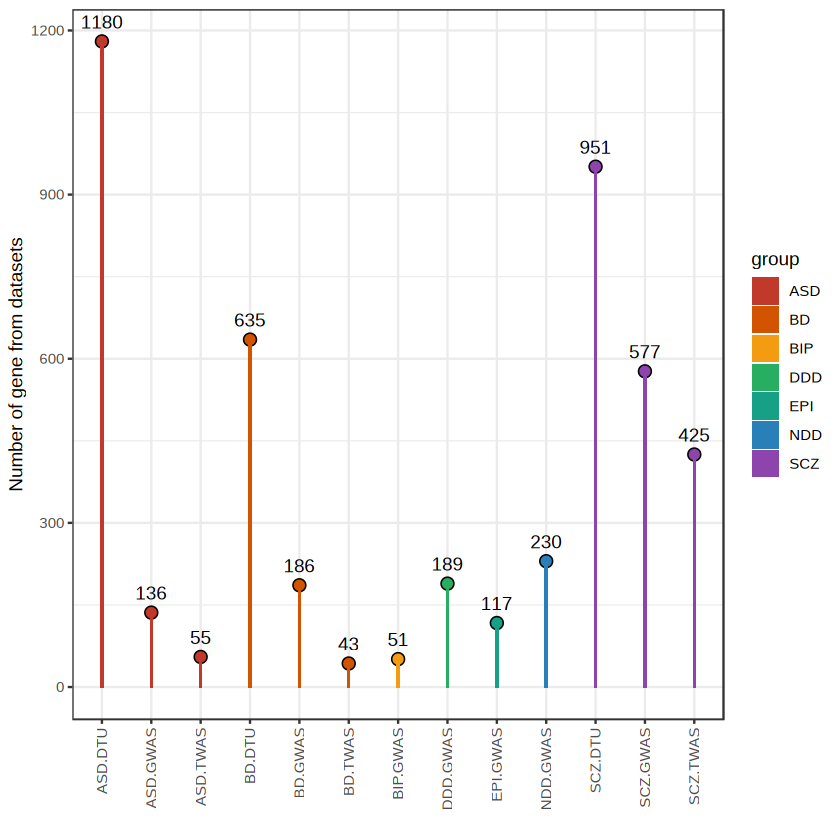

In [24]:
unique(refgdf$source)
hubsource = c('ASD.DTU','BD.DTU','SCZ.DTU','ASD.GWAS','BD.GWAS','SCZ.GWAS','NDD.GWAS','DDD.GWAS','BIP.GWAS','EPI.GWAS','ASD.TWAS','BD.TWAS',"SCZ.TWAS")
refgdf = refgdf[refgdf$gene_id %in% cmgeneid,]
refgdf.hub = refgdf[refgdf$source %in% hubsource,]
refgdf.hubst = refgdf.hub %>% group_by(source,group) %>% summarise(genen = length(unique(gene_id)))
p1.1 = ggplot(refgdf.hubst,aes(x = source,fill = group, y = genen)) + 
        geom_point(shape = 21,size = 3,position = position_dodge(0.5)) +
        geom_text(aes(label = genen),vjust = -1) +
        geom_bar(stat = "identity",width = 0.05,color = NA,position = position_dodge(0.5)) +
        scale_fill_flatui() +
        theme_bw() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) + xlab("") + 
        ylab("Number of gene from datasets")
p1.1
ggexport(p1.1,filename = "result/figure6_snp_analysis/Disease_datasets_genestat_25_12_09.pdf",width = 5,height = 4)

In [60]:
#total DTU stat
dtumkdf.hub = qread("result/figure3/class_DTU_by_subclass_ttest_24_11_05.qs")
head(dtumkdf.hub)
colnames(dtumkdf.hub)[5] = "areatr"
head(dtumkdf.hub)

,gene_id,transcript_id,pvalue,dr,cluster,qvalue
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>
16,ABCC5,XM_005546512.2,0.001969214,0.1571313,GLU,1
182,ANAPC4,XM_005554612.2,0.014178056,0.1214028,GLU,1
248,APBB3,XM_005557979.2,0.048700128,-0.1000114,GLU,1
286,ARFIP2,XM_005578789.2,0.000655739,-0.1232940,GLU,1
350,ARVCF,XM_005567964.2,0.017739128,-0.1075129,GLU,1
357,ASH2L,XM_005563066.2,0.000149255,-0.1061145,GLU,1


,gene_id,transcript_id,pvalue,dr,areatr,qvalue
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>
16,ABCC5,XM_005546512.2,0.001969214,0.1571313,GLU,1
182,ANAPC4,XM_005554612.2,0.014178056,0.1214028,GLU,1
248,APBB3,XM_005557979.2,0.048700128,-0.1000114,GLU,1
286,ARFIP2,XM_005578789.2,0.000655739,-0.1232940,GLU,1
350,ARVCF,XM_005567964.2,0.017739128,-0.1075129,GLU,1
357,ASH2L,XM_005563066.2,0.000149255,-0.1061145,GLU,1


In [13]:
# summary(dtumkdf.hub$dr)
names(isosigls)

[1] "layer"       "region"      "lobe"        "subclass"    "class"      
[6] "subcortical"

In [14]:
#total DTU stat
isosigst = NULL
for(i in c(1:6)){
    isosigt = isosigls[[i]]
    isosigt = isosigt[isosigt$sig != "N",]
    isosigst = rbind(isosigst,isosigt[,c("gene_id","transcript_id","dr")])
    
}
# isosigst = rbind(isosigst,dtumkdf.hub[,c("gene_id","transcript_id","dr")])
length(unique(isosigst$gene_id))
length(unique(isosigst$transcript_id))

[1] 2933

[1] 5560

In [11]:
mkls = qread(file = "result/figure2/gene_marker_list_25_04_14.qs")
mkls.cl = qread(file = "result/figure3/gene_marker_list_cell_24_12_09.qs")
names(mkls.cl)
mkgenet = NULL
for(i in 1:length(mkls)){
    mklsi = mkls[[i]]
    colnames(mklsi)[6:7] = c("areaid","gene_id")
    mklsi = mklsi[mklsi$avg_log2FC > 1 & mklsi$p_val_adj < 0.05 & mklsi$pct.1 > 0.1, ]
    mkgenet = c(mkgenet,unique(mklsi$gene_id))
}
for(i in 1:length(mkls.cl)){
    mklsi = mkls.cl[[i]]
    colnames(mklsi)[6:7] = c("areaid","gene_id")
    mklsi = mklsi[mklsi$avg_log2FC > 1 & mklsi$p_val_adj < 0.05 & mklsi$pct.1 > 0.1, ]
    mkgenet = c(mkgenet,unique(mklsi$gene_id))
}
mkgenet = unique(mkgenet)
length(mkgenet)

[1] "subclass" "class"

[1] 6063

In [ ]:
length(unique(isosigst[isosigst$gene_id %in% mkgenet,]$gene_id))

In [466]:
#refGWAS = refGWAS[refGWAS$source %in% c(""),]

#isosigls = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_dedup_24_09_04.qs")

In [17]:
hubsource = c('ASD.DTU','BD.DTU','SCZ.DTU','ASD.GWAS','BD.GWAS','SCZ.GWAS','NDD.GWAS','DDD.GWAS',
              'BIP.GWAS','EPI.GWAS','ASD.TWAS','BD.TWAS',"SCZ.TWAS")

DiseaseEnrich = function(isosigt,refgdf){
    isosigt = isosigt[substr(isosigt$gene_id,1,9) != "BambuGene",]
    areatrs = unique(isosigt$areatr)
    goana = NULL
    refgdfi = refgdf
    sourceid = unique(refgdfi$source)
    for(i in 1:length(areatrs)){
        isosigii = isosigt[isosigt$areatr == areatrs[i],]
        hubgene = unique(isosigii$gene_id)
        for(j in 1:length(sourceid)){
            refgene = unique(refgdfi[refgdfi$source == sourceid[j],]$gene_id)
            goanai = FishEnrich(hubgene,refgene,cmgenen)
            goanai$group = sourceid[j]
            goanai$areatr = areatrs[i]
            goana = rbind(goana,goanai)
        }
    }
    goana$fdr = p.adjust(goana$p.value)
    goanaf = goana[goana$group %in% hubsource,]
    #goanaf
    #goanaf$group = MySplit(goanaf$group,"\\.",1)
    goanaf$group = factor(goanaf$group,levels = hubsource)
    goanaf$stars <- cut(goanaf$p.value, breaks=c(-Inf, 0.001, 0.01, 0.05, Inf), label=c("***", "**", "*", ""))  # Create column of significance labels
    return(goanaf)
}
#subclass
isosigt = isosigls$subclass
isosigt = isosigt[isosigt$sig != "N",]
isosigt = isosigt %>% group_by(transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
isosigt = isosigt[isosigt$gene_id %in% cmgeneid,]
goanaf.subuni = DiseaseEnrich(isosigt,refgdf)
goanaf.subuni$sample = "subclass"
#class
isosigt = isosigls$class
isosigt = isosigt[isosigt$sig != "N",]
isosigt = isosigt %>% group_by(transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
goanaf.class = DiseaseEnrich(isosigt,refgdf)
goanaf.class$sample = "class"

#layer
isosigt = isosigls$layer
isosigt = isosigt[isosigt$sig != "N",]
isosigt = isosigt %>% group_by(transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
goanaf.layer = DiseaseEnrich(isosigt,refgdf)
goanaf.layer$sample = "layer"

#lobe
isosigt = isosigls$lobe
isosigt = isosigt[isosigt$sig != "N",]
isosigt = isosigt %>% group_by(transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
isosigt = isosigt[isosigt$gene_id %in% cmgeneid,]
goanaf.lobe = DiseaseEnrich(isosigt,refgdf)
goanaf.lobe$sample = "lobe"

#subcortical
isosigt = isosigls$subcortical
isosigt = isosigt[isosigt$sig != "N",]
isosigt = isosigt %>% group_by(transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
isosigt = isosigt[isosigt$gene_id %in% cmgeneid,]
goanaf.subc = DiseaseEnrich(isosigt,refgdf)
goanaf.subc$sample = "subcortical"

goanaft = rbind(goanaf.subuni,goanaf.class,goanaf.layer,goanaf.lobe,goanaf.subc)


In [27]:
data6s$ref = refgdf
data6s$enrich = goanaft

file saved to result/figure5/Disease_enrich_analysis_25_12_09.pdf



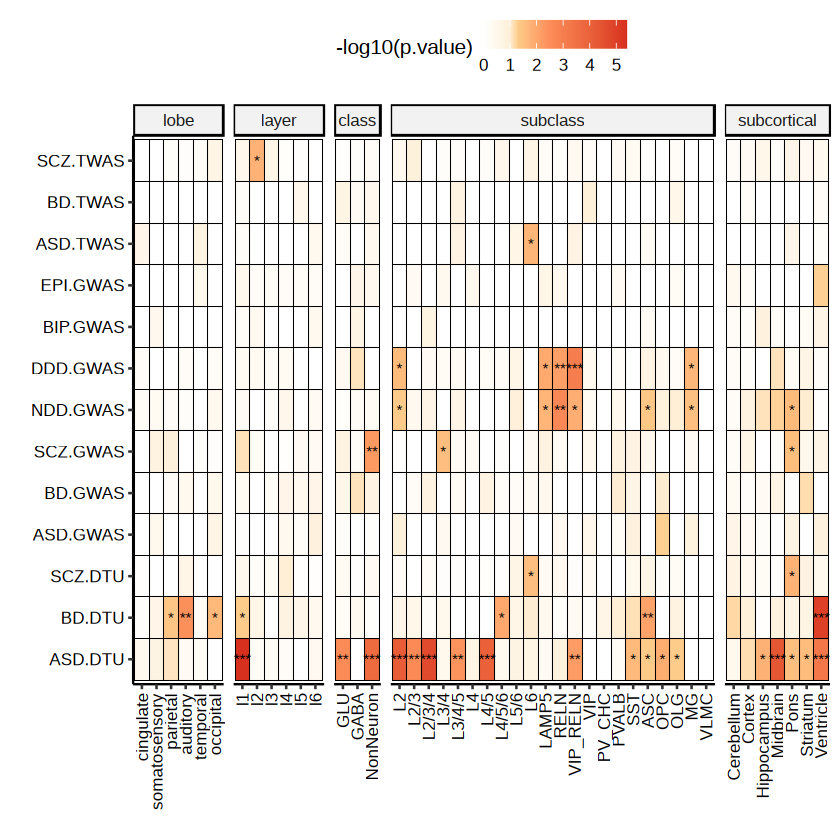

In [28]:
library(RColorBrewer)
goanaft$areatr = factor(goanaft$areatr,levels = c(lobeorder,layerorder,suborder,subcororder,"GLU","GABA","NonNeuron"))
goanaft$sample = factor(goanaft$sample,levels = c("lobe","layer","class","subclass","subcortical"))
goanaft$group = factor(goanaft$group,levels = hubsource)
maxp = max(-log10(goanaft$p.value))
ph = ggplot(goanaft,aes(x = areatr,y = group, fill = -log10(p.value))) + 
    geom_tile(color = "black") + 
    geom_text(aes(label=stars), color="black", size=3) + 
    theme_pubr() + 
    theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1,size = 10),
     axis.text.y = element_text(size = 10)) +
#    
    facet_grid(~sample,scale = "free",space = "free") +
#scale_color_gradient2(low = "blue", mid = "white",high = "red",midpoint = -log10(0.05)) + 
    scale_fill_gradientn(colours = c("white",brewer.pal(4,"OrRd")),
                        values = c(0, 1/maxp,(-log10(0.05))/maxp,2.5/maxp,1)) +
    xlab("") + ylab("")
ph
ggexport(ph,filename = "result/figure5/Disease_enrich_analysis_25_12_09.pdf",width = 8.5,height = 4)

In [184]:
head(goanaft)

,p.value,enrichscore,overlap_size,term_size,query_size,overlap_ratio,group,areatr,fdr,stars,sample
,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<fct>,<fct>,<dbl>,<fct>,<fct>
1,2.889816e-01,1.555954,6,193,321,0.03108808,ASD.GWAS,ASC,1.00000000,,subclass
2,9.002813e-04,2.456434,16,326,321,0.04907975,NDD.GWAS,ASC,0.35200999,***,subclass
3,5.783390e-01,1.147274,16,698,321,0.02292264,SCZ.GWAS,ASC,1.00000000,,subclass
4,4.072431e-01,0.000000,0,72,321,0.00000000,BIP.GWAS,ASC,1.00000000,,subclass
5,2.240593e-03,2.944108,10,170,321,0.05882353,EPI.GWAS,ASC,0.86710936,**,subclass
6,3.842924e-05,3.105282,17,274,321,0.06204380,DDD.GWAS,ASC,0.01521798,***,subclass


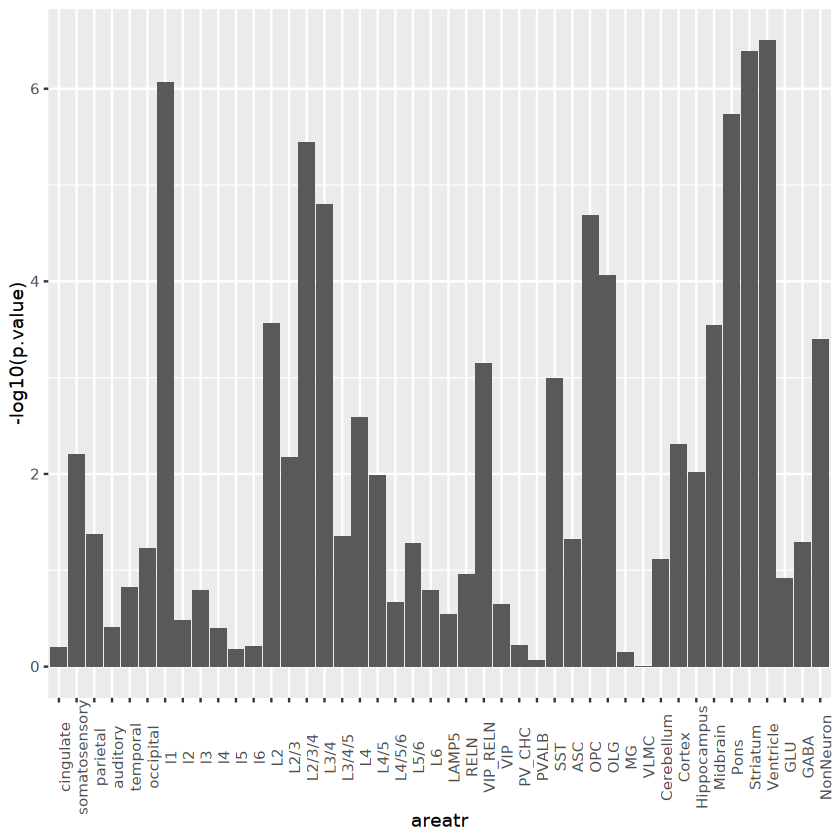

In [470]:
goanaft.hub = goanaft[goanaft$group %in% "ASD.DTU",]
ggplot(goanaft.hub,aes(x = areatr, y = -log10(p.value))) + geom_bar(stat = "identity") + 
    theme(axis.text.x = element_text(angle = 90))

#### Module explain

In [ ]:
isosigt = NULL
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
isosigi = isosigi %>% group_by(transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
isosigi$group = "subclass"
isosigt = rbind(isosigt,isosigi[,c("gene_id","areatr","group")])

dtumkdf.hub$group = "class"
isosigt = rbind(isosigt,dtumkdf.hub[,c("gene_id","areatr","group")])

isosigi = isosigls$layer
isosigi = isosigi[isosigi$sig != "N",]
isosigi = isosigi %>% group_by(transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
isosigi$group = "layer"
isosigt = rbind(isosigt,isosigi[,c("gene_id","areatr","group")])

isosigi = isosigls$lobe
isosigi = isosigi[isosigi$sig != "N",]
isosigi = isosigi %>% group_by(transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
isosigi$group = "lobe"
isosigt = rbind(isosigt,isosigi[,c("gene_id","areatr","group")])

isosigi = isosigls$subcortical
isosigi = isosigi[isosigi$sig != "N",]
isosigi = isosigi %>% group_by(transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
isosigi$group = "subcortical"
isosigt = rbind(isosigt,isosigi[,c("gene_id","areatr","group")])

[1] "FXR1"     "PSMA4"    "SETD6"    "GLYCTK"   "DNAJA3"   "JKAMP"   
  [7] "ASPHD1"   "MPPED2"   "TYW5"     "AKT3"     "PARD6A"   "CLCN3"   
 [13] "LMAN2L"   "NDUFAF2"  "FNDC4"    "DYNC1I2"  "NOL4"     "LY6H"    
 [19] "GGNBP2"   "RABEP1"   "AGA"      "STAU2"    "GOPC"     "YIPF1"   
 [25] "ZNF112"   "EIF4B"    "SUGP2"    "SLC12A2"  "FAM107B"  "ELOVL1"  
 [31] "ST6GAL1"  "MAP2"     "PCDHB4"   "ITGAE"    "MRPS33"   "NUDC"    
 [37] "HSP90AB1" "SDR39U1"  "EFS"      "CINP"     "GGA2"     "MPP6"    
 [43] "AIMP2"    "NSMCE4A"  "ACBD5"    "DHRS11"   "LAMTOR3"  "DNAJC4"  
 [49] "ARPC3"    "HMGCR"    "NPRL2"    "RTN4"     "SPR"      "RBBP5"   
 [55] "MED28"    "PCDH17"   "CCDC92"   "HSDL2"    "LRIF1"    "SLC25A51"
 [61] "STAMBP"   "FAM98C"   "OSBPL2"   "RAMP2"    "PPP1R1B"  "DCLK1"   
 [67] "DYDC2"    "DUSP26"   "PSRC1"    "DZIP1"    "SDS"      "NAT10"   
 [73] "B4GALNT1" "KDELR2"   "TUBB2B"   "ARHGAP20" "THUMPD2"  "TDG"     
 [79] "ZSCAN29"  "GTF2A2"   "EMP3"     "CHAC2"    "ST6GAL2"  "CPLX2"   
 [85] "HOMER1"   "ZSCAN1"   "GRM1"     "GDPD1"    "PLCL2"    "ATP2B2"  
 [91] "FAIM"     "RLTPR"    "CCDC117"  "FDPS"     "PAQR6"    "ACOX1"   
 [97] "TNFSF13"  "ARHGEF3"  "GRM2"     "GRPEL2"   "CAMLG"    "REEP3"   
[103] "ZNF641"   "SRR"      "GNG4"     "CHTF8"    "NTSR2"    "METTL15" 
[109] "KCNAB3"   "PAIP1"    "FAM192A"  "SNX32"    "WDR25"    "PSMG4"   
[115] "NPM1"     "GPR3"     "LIMK2"    "HMCES"    "METTL7A"  "GLDN"    
[121] "CD47"     "MVB12B"   "KPNA5"    "PDLIM7"   "ZNF470"   "EME2"    
[127] "ZNF583"   "ECI2"     "PRMT6"    "RUFY2"    "BAG6"     "ACOT6"   
[133] "SRA1"     "TMEM110"  "ZSWIM7"   "ZNF883"   "B3GALT4"  "GATSL3"  
[139] "ZNF512"

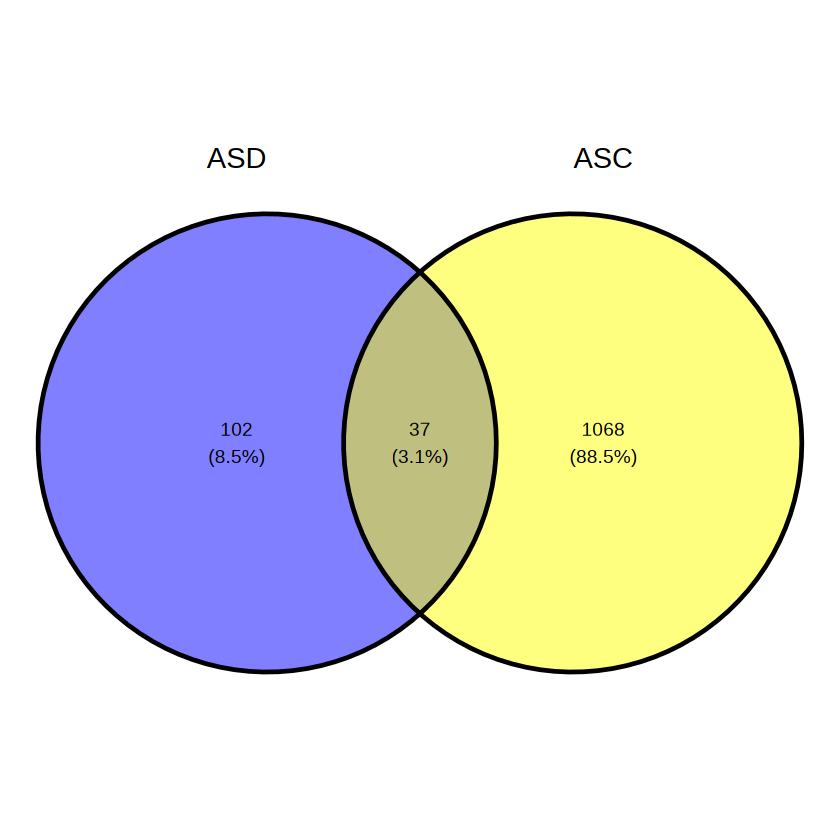

In [276]:
library(ggvenn)
isosigi = isosigls$subclass
hubgene1 = refgdf[refgdf$source == "SCZ.TWAS",]$gene_id
hubgene1 = hubgene1[hubgene1 %in% isosigi$gene_id]
hubgene1
#hubgene1
hubgene = isosigi[isosigi$sig != "N",]$gene_id
ggvenn(list("ASD" = hubgene1,"ASC" = hubgene))

In [26]:
casect = fsraw.cor[fsraw.cor$subclass != "" & fsraw.cor$subcortical %in% "Cortex",] %>% group_by(class,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(class,subclass,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)

`summarise()` has grouped output by 'class', 'subclass', 'gene_id'. You can
override using the `.groups` argument.


In [12]:
#stat top gene
isosigi = isosigls$subclass
hubgene = isosigi[isosigi$sig != "N",]$gene_id
hubsource2 = c('ASD.GWAS','SCZ.GWAS','NDD.GWAS','DDD.GWAS','BIP.GWAS','EPI.GWAS',"SCZ.TWAS",'ASD.TWAS','BD.TWAS')
refgdf.hub = refgdf[refgdf$gene_id %in% hubgene & refgdf$source %in% hubsource2,]
genest = refgdf.hub %>% group_by(gene_id) %>% summarise(sourcenum = length(unique(source)))
genest = genest[order(-genest$sourcenum),]
genest
# hubgene1 = unique(refgdf[refgdf$source %in% c("NDD.GWAS","DDD.GWAS"),]$gene_id)
# genest = genest[genest$gene_id %in% hubgene1,]
# genest
# isosigt = isosigt[isosigt$gene_id %in% hubgene1,]

# genest = isosigt %>% group_by(gene_id) %>% summarise(sourcenum = length(unique(group)))
# genest = genest[order(-genest$sourcenum),]
# genest

gene_id,sourcenum
<chr>,<int>
AKT3,2
CD47,2
DYNC1I2,2
FAM192A,2
FXR1,2
GGNBP2,2
HOMER1,2
JMJD6,2
MAPT,2


In [14]:
# hubgene = isosigt[isosigt$areatr == "l4" & isosigt$gene_id %in% refgdf$gene_id,]$gene_id
# hubgene
isosigi = isosigls$subclass
hubgene = isosigi[isosigi$sig != "N" & isosigi$areatr %in% c("RELN","ASC"),]$gene_id
genest = genest[genest$gene_id %in% hubgene,]
genest
caseg = genest[1:20,]$gene_id
caseg
caseg = c('CD47','BIN1','DNAJC4','FAM192A','CUTA','SETD5','SYT1','CDC42')

gene_id,sourcenum
<chr>,<int>
AKT3,2
CD47,2
DYNC1I2,2
FAM192A,2
FXR1,2
GGNBP2,2
JMJD6,2
MAPT,2
TYW5,2


[1] "AKT3"    "CD47"    "DYNC1I2" "FAM192A" "FXR1"    "GGNBP2"  "JMJD6"  
 [8] "MAPT"    "TYW5"    "CAMLG"   "CENPM"   "CNPPD1"  "DCLK1"   "DNAJC4" 
[15] "DZIP1"   "FAIM"    "FEZ2"    "GOSR1"   "GTF2A2"  "HP1BP3"

,class,subclass,gene_id,1,2,3,4,groupid,geneidn
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,GABA,LAMP5,CD47,0.8750000,0.0625000,0,0.00,11,1
2,GABA,LAMP5,CDC42,0.8536585,0.1463415,0,0.00,11,8
3,GABA,LAMP5,CUTA,0.2439024,0.7195122,0,0.00,11,5
4,GABA,LAMP5,DNAJC4,0.3125000,0.3750000,0,0.25,11,3
5,GABA,LAMP5,SYT1,0.6105675,0.3855186,0,0.00,11,7
6,GABA,PVALB,BIN1,0.3846154,0.3846154,0,0.00,15,2


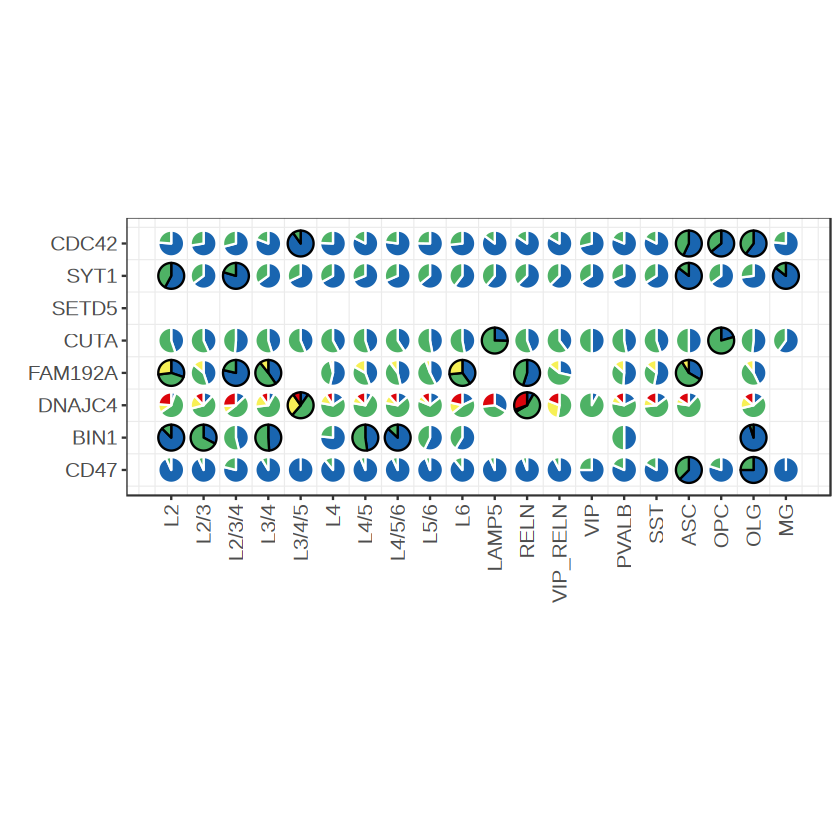

In [27]:
#caseg = genest[1:20,]$gene_id
#caseg = colnames(isosigimx)
caseg = c('CD47','BIN1','DNAJC4','FAM192A','CUTA','SETD5','SYT1','CDC42')
isosigi = rbind(isosigls$subclass,isosigls$layer,isosigls$lobe,isosigls$subcortical)
isosigi = isosigi[isosigi$sig != "N",]
isosigi2 = rbind(isosigls$subclass,isosigls$layer,isosigls$lobe,isosigls$subcortical)
isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]

casecti = casect[casect$gene_id %in% caseg & casect$transcript_id %in% isosigi2$transcript_id,]

casecti = casecti[casecti$genecount > 10,]
casecti = casecti[!casecti$subclass %in% c("PV_CHC"),]

casecti = casecti %>% group_by(gene_id) %>% mutate(id = as.character(as.numeric(as.factor(transcript_id))))
casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,class+subclass+gene_id~id,value.var = "rate")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$class,casectl$subclass),]
casectl$groupid = as.numeric(factor(casectl$subclass,levels = suborder[suborder %in% casectl$subclass]))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = caseg))
head(casectl)

library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$sig = 'N'
casectl[paste0(casectl$subclass,casectl$gene_id) %in% paste0(isosigi$areatr,isosigi$gene_id),]$sig = "Y"
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
casectl$gene_id = factor(casectl$gene_id,levels = caseg)
plt = ggplot() + 
      geom_scatterpie(data = casectl[casectl$gene_id %in% caseg, ],
                      aes(x = groupid, y = geneidn, group = groupid,color = sig,
                                           r = 0.4),
                      cols=colnames(casectl)[4:(4+ison-1)]) + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$subclass))),labels = suborder[suborder %in% casectl$subclass]) +
      scale_y_continuous(breaks = c(1:length(caseg)),labels = caseg) +
      scale_color_manual(values = c("white","black")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_discreterainbow() +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
#ggexport(plt,filename = "result/figure4/case_subclass_isoform_rate_stat_pie_24_12_09.pdf",width = 6,height = 8)

In [510]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
#refgdf = refgdf[refgdf$gene_id %in% fsraw.cor$gene_id,]
length(unique(refgdf[refgdf$source %in% c("NDD.GWAS","DDD.GWAS"),]$gene_id))
length(unique(refgdf[refgdf$source %in% c("ASD.DTU"),]$gene_id))

hubgene = refgdf[refgdf$source %in% c("NDD.GWAS","DDD.GWAS"),]$gene_id
isosig.wgi = isosigi[isosigi$gene_id %in% hubgene,]
length(unique(isosig.wgi$gene_id))
unique(isosig.wgi$gene_id)

hubgene = refgdf[refgdf$source %in% c("ASD.DTU"),]$gene_id
isosig.wgi = isosigi[isosigi$gene_id %in% hubgene,]
length(unique(isosig.wgi$gene_id))


[1] 387

[1] 1437

[1] 98

[1] "ADNP"      "AKT3"      "ALG13"     "ANK3"      "AUTS2"     "BCL11A"   
 [7] "CAMK2B"    "CAMTA1"    "CASK"      "CBX5"      "CDC42"     "CLTC"     
[13] "CNKSR2"    "COL4A3BP"  "CTBP1"     "CTNNB1"    "DDX3X"     "DNM1"     
[19] "DNM1L"     "DYRK1A"    "EHMT1"     "EIF5A"     "EP300"     "ERF"      
[25] "FBXW7"     "FGF12"     "FGFR1"     "GNAO1"     "GNB1"      "GRIN1"    
[31] "GSK3B"     "HDAC8"     "HNRNPU"    "HRAS"      "IQSEC2"    "JAG1"     
[37] "KAT6B"     "KDM5C"     "KIDINS220" "KIF1A"     "KLHL20"    "KMT2C"    
[43] "KMT2E"     "KRAS"      "MARK2"     "MBD5"      "MEF2C"     "MFN2"     
[49] "MYT1L"     "NF1"       "NFIB"      "NFIX"      "NSD1"      "PAK1"     
[55] "PCBP2"     "PDE4D"     "PIK3CA"    "PIK3R1"    "POGZ"      "PPP2CA"   
[61] "PRKAR1A"   "PSMC5"     "PTPRD"     "QRICH1"    "RERE"      "RFX3"     
[67] "RORA"      "SETBP1"    "SETD5"     "SLC35A2"   "SMARCB1"   "SMARCE1"  
[73] "SMC1A"     "SON"       "SPEN"      "SPTAN1"    "SPTBN1"    "SRRM2"    
[79] "SYNCRIP"   "SYT1"      "TAF1"      "TANC2"     "TCF12"     "TCF7L2"   
[85] "TLK2"      "TMEM106B"  "TRPM3"     "TRRAP"     "UBE3A"     "USP9X"    
[91] "WDR37"     "ZBTB20"    "ZC4H2"     "ZEB2"      "ZMYND8"    "ZNF292"   
[97] "ZNF462"    "ZNF644"

[1] 284

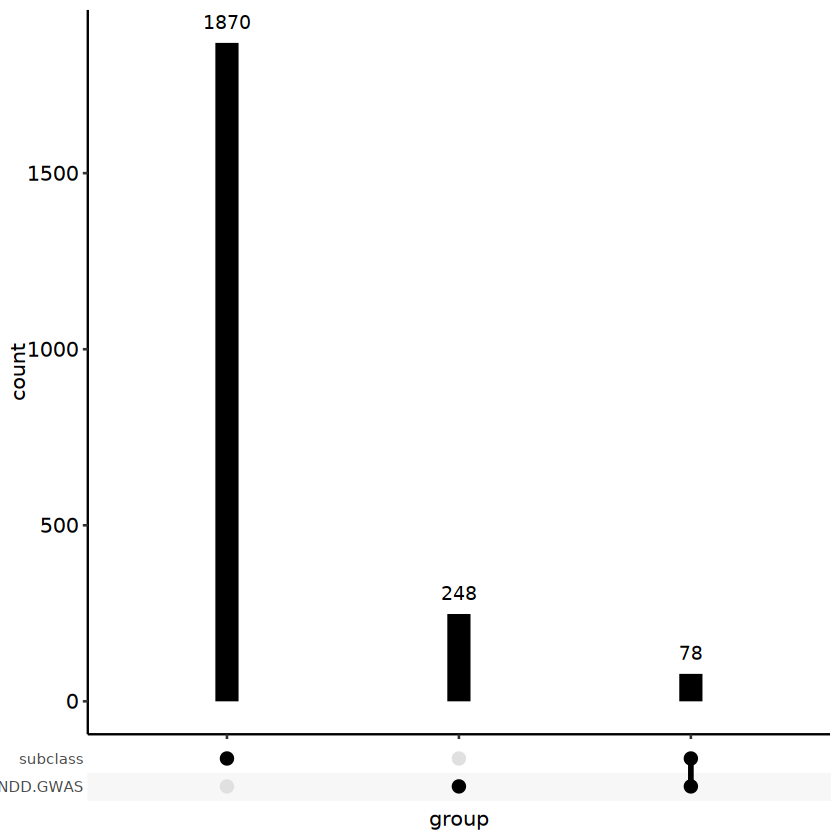

In [511]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",];isosigi = unique(isosigi[,c("gene_id","areatr")]);colnames(isosigi)[2] = "group"
isosigi$group = "subclass";isosigi1 = isosigi
# isosigi = isosigls$subcortical
# isosigi = isosigi[isosigi$sig != "N",];isosigi = unique(isosigi[,c("gene_id","areatr")]);colnames(isosigi)[2] = "group"
# isosigi$group = "subcortical";isosigi2 = isosigi
# isosigi = isosigls$region
# isosigi = isosigi[isosigi$sig != "N",];isosigi = unique(isosigi[,c("gene_id","areatr")]);colnames(isosigi)[2] = "group"
# isosigi$group = "region";isosigi3 = isosigi

refgdf.hub = refgdf[refgdf$source %in% c("NDD.GWAS"),]

refgdf.hub = refgdf.hub[,c("gene_id","source")]
colnames(refgdf.hub)[2] = "group"
dtustdf = rbind(refgdf.hub,isosigi1)
library(ggupset)
dtustdfup = unique(dtustdf[,c("gene_id","group")])
dtustdfup = dtustdfup %>%
  group_by(gene_id) %>%
  summarize(group = list(group))

pisonup2 = ggplot(data = dtustdfup,
            aes(x = group)) +
  scale_x_upset() + 
 geom_bar(fill = "black",width = 0.1) + 
 geom_text(stat = "count",aes(label=after_stat(count)),vjust = -1) + 
    theme_pubr()
pisonup2

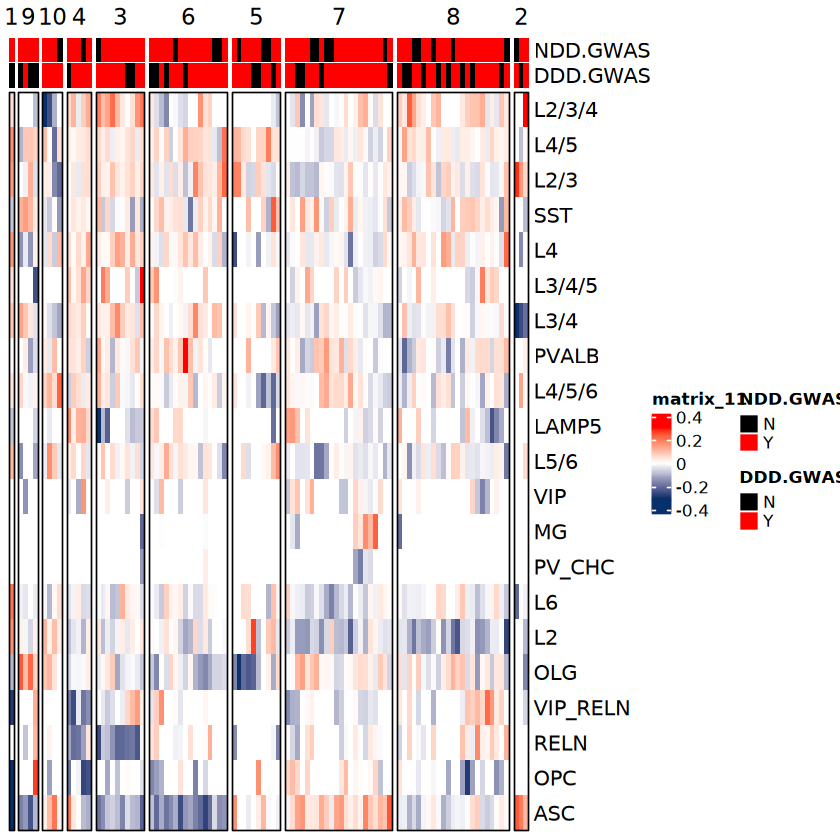

In [197]:
#DTU analysis of ASD
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
#isosigi = isosigi %>% group_by(transcript_id) %>% filter(length(unique(areatr)) == 1)
hubtrans = isosigi$transcript_id
hubgene = refgdf[refgdf$source %in% c("NDD.GWAS","DDD.GWAS"),]$gene_id
#hubgene = refgdf[refgdf$source %in% c("NDD.Talkowski","DDD.Retterer"),]$gene_id
#c("BD.DTU","SCZ.DTU")
isosigi = isosigls$subclass
isosig.wgi = isosigi[isosigi$gene_id %in% hubgene & isosigi$transcript_id %in% hubtrans,]
isosig.wgi = isosig.wgi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
#isosig.wgi = isosig.wgi[isosig.wgi$count > 10,]

# isosigi = isosigls$layer
# isosig.wgi2 = isosigi[isosigi$gene_id %in% hubgene & isosigi$transcript_id %in% hubtrans,]
# isosig.wgi2 = isosig.wgi2 %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
# isosig.wgi2 = isosig.wgi2[isosig.wgi2$count > 10,]
# isosig.wgi = rbind(isosig.wgi,isosig.wgi2)
#turquoise
#table(isosig.wgi[,c("sig","areatr")])
isosigimx = dcast(isosig.wgi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigimx) = isosigimx$gene_id;isosigimx = isosigimx[,-1]
#isosigimx = isosigimx[,c("NonNeuron","GLU","GABA",paste0("l",1:6))]
#isosigimx = isosigimx[order(isosigimx$NonNeuron,isosigimx$GLU,isosigimx$GABA,isosigimx$l1),]
isosigimx = t(isosigimx)


myType = data.frame("gene_id" = colnames(isosigimx),
                    "NDD.GWAS" = "N",
                   "DDD.GWAS" = "N")
myType[myType$gene_id %in% refgdf[refgdf$source %in% c("NDD.GWAS"),]$gene_id,]$NDD.GWAS = "Y"
myType[myType$gene_id %in% refgdf[refgdf$source %in% c("DDD.GWAS"),]$gene_id,]$DDD.GWAS = "Y"
#myType[myType$gene_id %in% refgdf[refgdf$source %in% c("ASD.DTU"),]$gene_id,]$ASD.DTU = "Y"
rownames(myType) = myType$gene_id;myType = myType[,-1]
# 绘制热图
#pdf(outFile,height=5,width=8)
ha = HeatmapAnnotation(
    NDD.GWAS = myType$NDD.GWAS, 
    DDD.GWAS = myType$DDD.GWAS,
    col = list(NDD.GWAS = c("Y" = "red", "N" = "black"),
               DDD.GWAS = c("Y" = "red", "N" = "black"))
)
#pdf("result/figure5/ASD_disease_dtu_cases_24_11_21.pdf",width = 10,height = 3)
Heatmap(isosigimx,show_column_names = F,border = TRUE,column_km = 10,
        show_row_dend = F,show_column_dend = F,top_annotation = ha,
       colorRamp2(c(-0.3,0,0.3), c("#08306B", "white", "red")))

#dev.off()

In [ ]:
cellan[cellan$class == "GABA",]$subclass

In [28]:
#DTU analysis of DDD
#DTU analysis of ASD
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
nrow(isosigi)
isosigi = isosigi %>% group_by(transcript_id,sig) %>% filter(length(areatr) == 1)
isosigi = isosigi[isosigi$areatr %in% cellan[cellan$class == "GABA",]$subclass & isosigi$count > 20,]
nrow(isosigi)
#isosigi = isosigi[isosigi$areatr %in% cellan[cellan$class == "GABA",]$subclass & isosigi$count > 40,]
hubtrans = unique(isosigi$transcript_id)
hubgene = refgdf[refgdf$source %in% c("NDD.Talkowski","DDD.Retterer","EPI.Neale"),]$gene_id
#hubgene = refgdf[refgdf$source %in% c("NDD.Talkowski","DDD.Retterer"),]$gene_id
#c("BD.DTU","SCZ.DTU")
isosigi = isosigls$subclass
isosig.wgi = isosigi[isosigi$gene_id %in% hubgene & isosigi$transcript_id %in% hubtrans,]
isosig.wgi = isosig.wgi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isosig.wgi = isosig.wgi[isosig.wgi$count > 10,]
#turquoise
#table(isosig.wgi[,c("sig","areatr")])
isosigimx = dcast(isosig.wgi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigimx) = isosigimx$gene_id;isosigimx = isosigimx[,-1]
#isosigimx = isosigimx[,c("NonNeuron","GLU","GABA",paste0("l",1:6))]
#isosigimx = isosigimx[order(isosigimx$GABA,isosigimx$NonNeuron,isosigimx$GLU,isosigimx$l1),]
isosigimx = t(isosigimx)

myType = data.frame("gene_id" = colnames(isosigimx),
                    "NDD.Talkowski" = "N",
                   "DDD.Retterer" = "N",
                   "EPI.Neale" = "N")
myType[myType$gene_id %in% refgdf[refgdf$source %in% c("NDD.Talkowski"),]$gene_id,]$NDD.Talkowski = "Y"
myType[myType$gene_id %in% refgdf[refgdf$source %in% c("DDD.Retterer"),]$gene_id,]$DDD.Retterer = "Y"
myType[myType$gene_id %in% refgdf[refgdf$source %in% c("EPI.Neale"),]$gene_id,]$EPI.Neale = "Y"
rownames(myType) = myType$gene_id;myType = myType[,-1]
# 绘制热图
#pdf(outFile,height=5,width=8)
ha = HeatmapAnnotation(
    NDD.Talkowski = myType$NDD.Talkowski, 
    DDD.Retterer = myType$DDD.Retterer,
    EPI.Neale = myType$EPI.Neale,
    col = list(NDD.Talkowski = c("Y" = "red", "N" = "black"),
               DDD.Retterer = c("Y" = "red", "N" = "black"),
              EPI.Neale = c("Y" = "red", "N" = "black"))
)
#pdf("result/figure5/ASD_disease_dtu_cases_24_11_21.pdf",width = 10,height = 3)
pt2 = Heatmap(isosigimx,show_column_names = F,cluster_columns = F,border = TRUE,cluster_rows = F,
        show_row_dend = F,show_column_dend = F,top_annotation = ha,
       colorRamp2(c(-0.3,0,0.3), c("#08306B", "white", "red")))

#dev.off()


[1] 4499

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'table' in selecting a method for function '%in%': object 'cellan' not found


In [ ]:
# pt2 = Heatmap(isosigimx,show_column_names = F,cluster_columns = F,border = TRUE,cluster_rows = F,
#         show_row_dend = F,show_column_dend = F,top_annotation = ha,
#        colorRamp2(c(-0.3,0,0.3), c("#08306B", "white", "red")))
pt2 = Heatmap(isosigimx,show_column_names = F,border = TRUE,
        show_row_dend = F,show_column_dend = F,top_annotation = ha,
       colorRamp2(c(-0.3,0,0.3), c("#08306B", "white", "red")))
pt2

In [36]:
casect = fsraw.cor[fsraw.cor$subclass != "" & fsraw.cor$subcortical %in% "Cortex",] %>% group_by(class,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(class,subclass,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)

`summarise()` has grouped output by 'class', 'subclass', 'gene_id'. You can
override using the `.groups` argument.


In [269]:
casect2 = fsraw.cor[fsraw.cor$subclass != "",] %>% group_by(lobe,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(lobe,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)

`summarise()` has grouped output by 'lobe', 'gene_id'. You can override using
the `.groups` argument.


,class,subclass,gene_id,1,2,3,4,groupid,geneidn
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,GABA,LAMP5,CD47,0.8750000,0.0625000,0,0.00,11,1
2,GABA,LAMP5,CDC42,0.8536585,0.1463415,0,0.00,11,7
3,GABA,LAMP5,CUTA,0.2439024,0.7195122,0,0.00,11,5
4,GABA,LAMP5,DNAJC4,0.3125000,0.3750000,0,0.25,11,3
5,GABA,LAMP5,SYT1,0.6105675,0.3855186,0,0.00,11,6
6,GABA,PVALB,BIN1,0.3846154,0.3846154,0,0.00,15,2


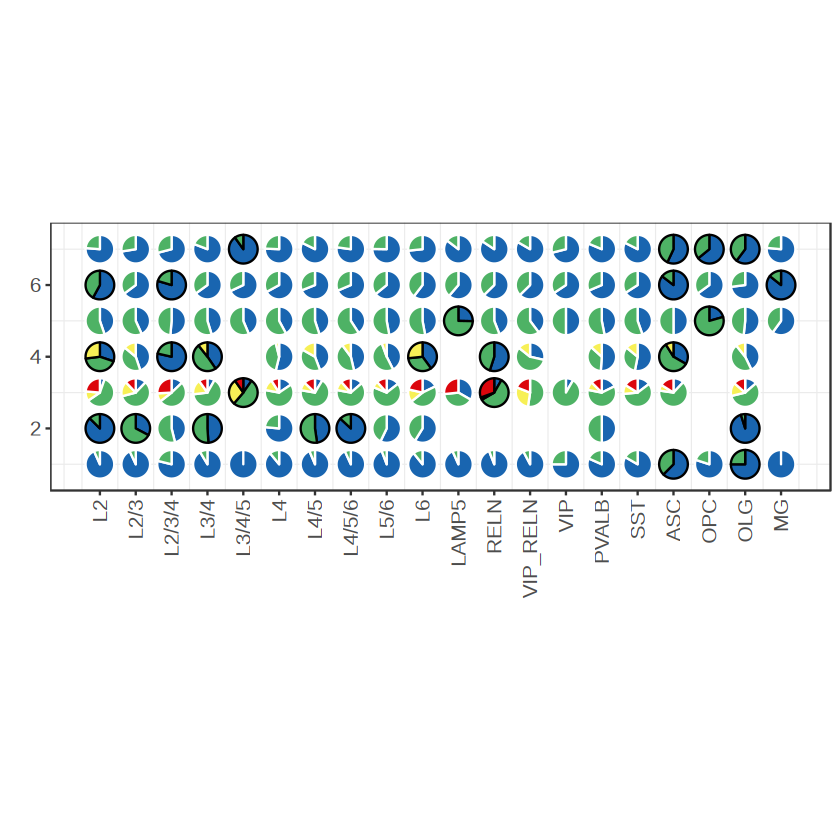

In [37]:
caseg = c('CD47','BIN1','DNAJC4','FAM192A','CUTA','SYT1','CDC42')
#caseg = colnames(isosigimx)
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
isosigi2 = isosigls$subclass
isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casect = casect[!is.na(casect$subclass),]
casecti = casect[casect$gene_id %in% caseg & casect$transcript_id %in% isosigi2$transcript_id,]

casecti = casecti[casecti$genecount > 10,]
casecti = casecti[!casecti$subclass %in% c("PV_CHC"),]

casecti = casecti %>% group_by(gene_id) %>% mutate(id = as.character(as.numeric(as.factor(transcript_id))))
casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,class+subclass+gene_id~id,value.var = "rate")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$class,casectl$subclass),]
casectl$groupid = as.numeric(factor(casectl$subclass,levels = suborder[suborder %in% casectl$subclass]))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = caseg))
head(casectl)

library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$sig = 'N'
casectl[paste0(casectl$subclass,casectl$gene_id) %in% paste0(isosigi$areatr,isosigi$gene_id),]$sig = "Y"
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
casectl$gene_id = factor(casectl$gene_id,levels = caseg)
plt = ggplot() + 
      geom_scatterpie(data = casectl[casectl$gene_id %in% caseg, ],
                      aes(x = groupid, y = geneidn, group = groupid,color = sig,
                                           r = 0.4),
                      cols=colnames(casectl)[4:(4+ison-1)]) + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$subclass))),labels = suborder[suborder %in% casectl$subclass]) +
      # scale_y_continuous(breaks = c(1:length(caseg)),labels = caseg) +
      scale_color_manual(values = c("white","black")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_discreterainbow() +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
#ggexport(plt,filename = "result/figure6/case_subclass_isoform_rate_stat_pie_25_03_16.pdf",width = 6,height = 8)

In [33]:
suborder

[1] "L2"       "L2/3"     "L2/3/4"   "L3/4"     "L3/4/5"   "L4"      
 [7] "L4/5"     "L4/5/6"   "L5/6"     "L6"       "LAMP5"    "RELN"    
[13] "VIP_RELN" "VIP"      "PV_CHC"   "PVALB"    "SST"      "ASC"     
[19] "OPC"      "OLG"      "MG"       "EC"       "VLMC"

Using gene_id as id variables



gene_id,variable,value,sig,group
<fct>,<fct>,<int>,<chr>,<chr>
BIN1,ASD.DTU,0,N,source
CD47,ASD.DTU,1,Y,source
CDC42,ASD.DTU,0,N,source
CUTA,ASD.DTU,0,N,source
DNAJC4,ASD.DTU,0,N,source
FAM192A,ASD.DTU,0,N,source
SYT1,ASD.DTU,0,N,source
BIN1,ASD.GWAS,0,N,source
CD47,ASD.GWAS,0,N,source


file saved to result/figure5/NDD_DTU_GABA_case_pieplot_25_12_23.pdf



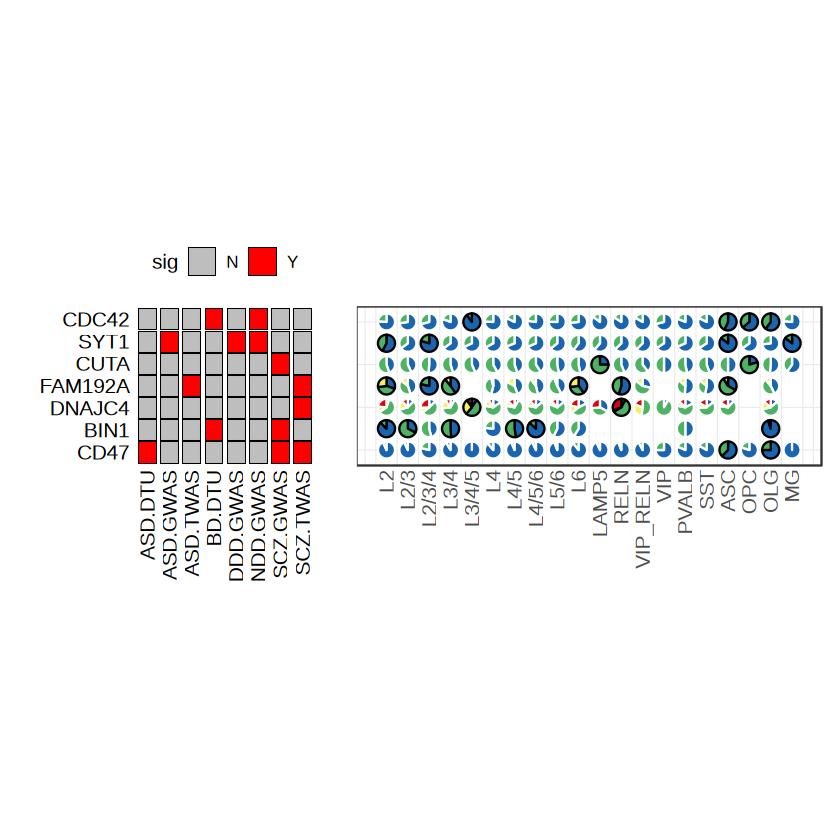

In [39]:
hubsource = c('ASD.DTU','BD.DTU','SCZ.DTU','ASD.GWAS','BD.GWAS','SCZ.GWAS','NDD.GWAS','DDD.GWAS',
              'BIP.GWAS','EPI.GWAS','ASD.TWAS','BD.TWAS',"SCZ.TWAS")
refgdf.hub = refgdf[refgdf$source %in% hubsource,]
refgdf.hubp = refgdf.hub[refgdf.hub$gene_id %in% caseg,]
refgdf.hubp = dcast(refgdf.hubp,gene_id~source, value.var = "source", 
                        fun.aggregate = function(x) length(unique(x)))
refgdf.hubp = melt(refgdf.hubp)
refgdf.hubp$sig = "N"
refgdf.hubp[refgdf.hubp$value > 0,]$sig = "Y"
refgdf.hubp$group = "source"
refgdf.hubp$gene_id = factor(refgdf.hubp$gene_id,levels = caseg)
refgdf.hubp
p1.0 = ggplot(refgdf.hubp,aes(x = variable,y = gene_id,fill = sig)) + 
    geom_tile(width = 0.8,height = 0.95,color = "black") + 
#scale_x_discrete(position = "top") +
    scale_fill_manual(values = c("grey","red")) +
    theme_pubr() + 
    theme(axis.line=element_blank(),axis.ticks = element_blank(),axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
     strip.text.x = element_text(margin = margin(0.5,0,0.5,0, "cm"))) +
coord_fixed() + 
    xlab("") + ylab("")
plt2 = p1.0 + plt + theme(axis.line=element_blank(),axis.ticks = element_blank(),
     axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),axis.text.y = element_blank()) + 
    xlab("") + ylab("")
plt2
ggexport(plt2,filename = "result/figure5/NDD_DTU_GABA_case_pieplot_25_12_23.pdf",width = 8,height = 6)

In [ ]:
genels = unique(refgdf.hub[refgdf.hub$sourcen > 3,]$gene_id)
pcls = list()
for(i in 1:length(genels)){
    grtdfl = BuildPlotBed(fsraw.cor,longbed,"layer",genels[i],NULL)
    pcls[[i]] = tryCatch(IsoformReadPlot(gtf, grtdfl,genels[i],onlyhub = T), 
                                                  error = function(e) NULL)
}
ggexport(pcls,filename = "result/figure5/dtu_case_ls_disease_25_12_18.pdf",
           width = 5,height = 6)

In [ ]:
# hubgene = isosigt[isosigt$areatr == "l4" & isosigt$gene_id %in% refgdf$gene_id,]$gene_id
# hubgene
isosigi = isosigls$subclass
hubgene = isosigi[isosigi$sig != "N",]$gene_id
hubgene1 = refgdf[refgdf$gene_id %in% hubgene & refgdf$group == "NDD",]$gene_id
hubgene2 = refgdf[refgdf$gene_id %in% hubgene & refgdf$group == "DDD",]$gene_id
hubgene3 = refgdf[refgdf$gene_id %in% hubgene & refgdf$source == "EPI.Neale",]$gene_id
hubgene1[order(hubgene1)]
hubgene2[order(hubgene2)]
hubgene3[order(hubgene3)]

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 19 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 15 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."


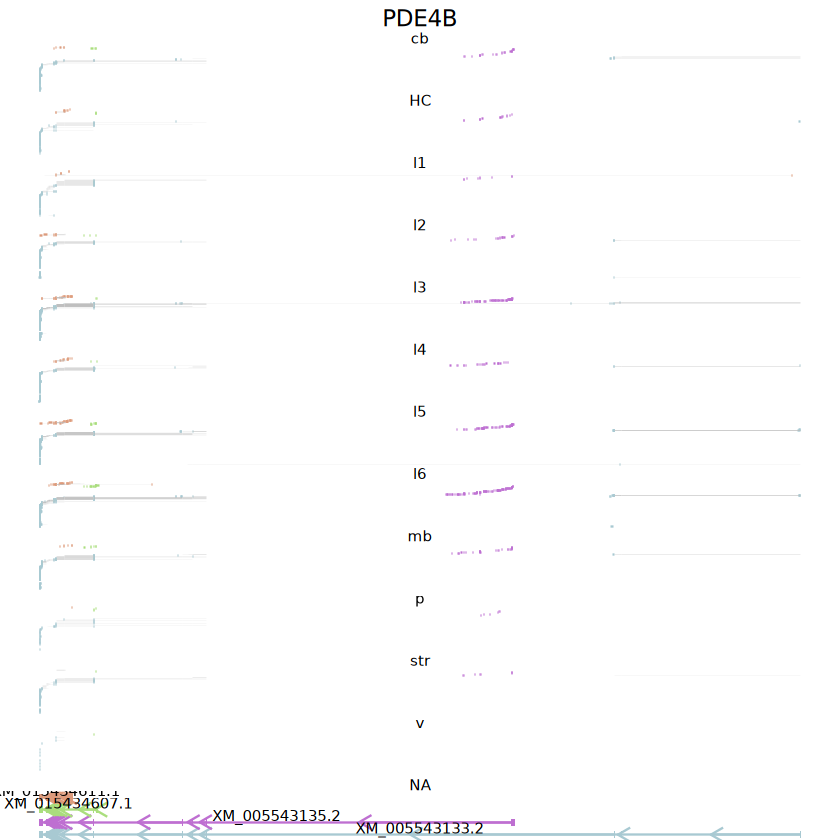

In [541]:
geneex = "PDE4B"
#fsraw.cor.hub = fsraw.cor[fsraw.cor$subclass %in% c("L4","VIP","ASC","OPC","OLG"),]
grtdfl = BuildPlotBed(fsraw.cor,longbed,"layer",geneex,NULL)
#grtdfl = grtdfl[grtdfl$transcript_id %in% c("NM_001283865.1","XM_005571070.2"),]
#grtdfl = grtdfl %>% group_by(readid) %>% filter(n()> 3)
pci = tryCatch(IsoformReadPlot(gtf, grtdfl,geneex,onlyhub = T), error = function(e) NULL)
pci
 # ggexport(pci,filename = "result/figure5/dtu_case_ls_disease_RBP_gene_readsplice_24_11_17.pdf",
 #           width = 5,height = 3)

In [ ]:
# black'INTS1'blue'TMEM56'brown'BambuGene53716'green'MAU2'greenyellow'SPRYD3'magenta'SMARCB1'pink'EEF1E1'purple'TPD52'red'SLC12A5'tan'ZRANB2'turquoise'ITSN2'yellow'ALS2'
geneex = c('AUTS2','CAMTA1','CBX5','CDC42','CLTC','CTNNB1','DYRK1A','EHMT1')

RefCase = function(isosig.wgi,refgdf.hub,geneex,hubtrans){
    refgdf.hubp = refgdf.hub[refgdf.hub$gene_id %in% geneex,]
    refgdf.hubp = dcast(refgdf.hubp,gene_id~group, value.var = "source", 
                        fun.aggregate = function(x) length(unique(x)))
    refgdf.hubp = melt(refgdf.hubp)
    refgdf.hubp$sig = "N"
    refgdf.hubp[refgdf.hubp$value > 0,]$sig = "Y"
    refgdf.hubp$group = "source"
    p1.0 = ggplot(refgdf.hubp,aes(x = variable,y = gene_id,fill = sig)) + 
    geom_tile(width = 0.8,height = 0.95) + 
#scale_x_discrete(position = "top") +
    scale_fill_manual(values = c("grey","red")) +
    facet_grid(~group) +
    theme_pubr() + 
    theme(axis.line=element_blank(),axis.ticks = element_blank(),axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
     strip.text.x = element_text(margin = margin(0.5,0,0.5,0, "cm"))) +
#coord_fixed() + 
    xlab("") + ylab("")
    p1.0

   # isosig.wgi = merge(isodf,netinfo.iso,by = "gene_id")
    isosig.wgi = isosig.wgi[isosig.wgi$gene_id %in% geneex,]
    isosig.wgi$group = "none"
    isosig.wgi[isosig.wgi$areatr %in% isosigls$layer$areatr,]$group = "layer"
    isosig.wgi[isosig.wgi$areatr %in% isosigls$lobe$areatr,]$group = "lobe"
    #isosig.wgi[isosig.wgi$areatr %in% isosigls$subclass$areatr,]$group = "subclass"
    isosig.wgi = isosig.wgi[isosig.wgi$transcript_id %in% hubtrans,]
    isosig.wgi = isosig.wgi %>% group_by(group,gene_id) %>% filter(meanrelative == max(meanrelative))
    
    suborder = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC',"PVALB",'SST','ASC','OPC','OLG','MG','EC','VLMC')
    lobeorder = c('cingulate','somatosensory','parietal','auditory','temporal','occipital')
    layerorder = paste0("l",1:6)
    isosig.hub = isosig.wgi[isosig.wgi$gene_id %in% geneex,]
    isosig.hub$areatr = factor(isosig.hub$areatr,levels = c(lobeorder,layerorder,suborder))
    isosig.hub$group = factor(isosig.hub$group,levels = c("lobe","layer","subclass"))
    p1.1 = ggplot(isosig.hub,aes(y = gene_id,x = areatr,fill = dr)) + geom_tile()+
    facet_grid(~group,scales = "free",space = "free") + 
    scale_fill_gradient2(low = "#08306B",mid = "white", high = "red",midpoint = 0,na.value = "grey") + 
    theme_pubr()  +
    theme(axis.line=element_blank(),axis.ticks = element_blank(),
     axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),axis.text.y = element_blank()) + 
    xlab("") + ylab("")
    p1.1
    
    pt = ggarrange(p1.0,p1.1,nrow = 1,widths = c(0.5,1),heights = c(0.5,1))
    return(pt)
}
geneex = c("BCL11A","SPEN","GPR137","THRA","CTNNB1","ZSCAN26","KRAS","SRSF7","FASTKD1","HNRNPA2B1")
isosig.wgi = rbind(isosigls$layer,isosigls$lobe)
hubgene = unique(refgdf[refgdf$source %in% c("NDD.Talkowski","DDD.Retterer"),]$gene_id)
#geneex = c('SMARCC2','ADNP','CTNNB1','CTBP1','GPR137','KCNA6','HNRNPA2B1')
# prc1 = RefCase(refgdf.hub,geneex)
# prc1
# geneex = c('HNRNPA1','HNRNPA2B1','HNRNPA3','HNRNPF','HNRNPH2')
isosigi = isosigls$layer[isosigls$layer$sig == "Up",]
hubgene = hubgene[hubgene %in% isosigi$gene_id]
geneex = hubgene
isosig.wgi = isosig.wgi[isosig.wgi$gene_id %in% hubgene,]
hubtrans = isosigi$transcript_id
refgdf.hub = refgdf
prc2 = RefCase(isosig.wgi,refgdf.hub,geneex,hubtrans)
prc2

In [ ]:
geneex = "SOX5"
#fsraw.cor.hub = fsraw.cor[!fsraw.cor$subclass %in% c("PV_CHC","VLMC"),]
grtdfl = BuildPlotBed(fsraw.cor,longbed,"layer",geneex,NULL)
#grtdfl = grtdfl %>% group_by(readid) %>% filter(n()> 1)
#grtdfl$group = factor(grtdfl$group,levels = suborder)
pci = tryCatch(IsoformReadPlot(gtf, grtdfl,geneex,onlyhub = F), error = function(e) NULL)
pci

In [ ]:
geneex = c('HNRNPA1','HNRNPA2B1','HNRNPA3','HNRNPF','HNRNPH2')
isodft = rbind(isosigls$lobe,isosigls$layer,isosigls$subclass)
isosig.wgi = merge(isodft,netinfo.iso,by = "gene_id")
#isosig.wgi = isosig.wgi[isosig.wgi$transcript_id %in% hubtrans,]
isosig.wgi$group = "none"
isosig.wgi[isosig.wgi$areatr %in% isosigls$layer$areatr,]$group = "layer"
isosig.wgi[isosig.wgi$areatr %in% isosigls$lobe$areatr,]$group = "lobe"
isosig.wgi[isosig.wgi$areatr %in% isosigls$subclass$areatr,]$group = "subclass"


suborder = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC',"PVALB",'SST','ASC','OPC','OLG','MG','EC','VLMC')
lobeorder = c('cingulate','somatosensory','parietal','auditory','temporal','occipital')
layerorder = paste0("l",1:6)
isosig.hub = isosig.wgi[isosig.wgi$gene_id %in% geneex,]
isosig.hub$areatr = factor(isosig.hub$areatr,levels = c(lobeorder,layerorder,suborder))
isosig.hub$group = factor(isosig.hub$group,levels = c("lobe","layer","subclass"))
head(isosig.hub)

isosig.hub = isosig.hub %>% group_by(gene_id) %>% 
mutate(transid = as.character(as.numeric(as.factor(transcript_id))))
p1.1 = ggplot(isosig.hub,aes(y = relative,x = areatr,fill = transid,color = sig)) + 
    geom_bar(stat = "identity",size = 0.5)+
    facet_grid(gene_id~group,scales = "free",space = "free") + 
    scale_color_manual(values = c("red","grey","blue")) + 
    scale_fill_discreterainbow()  + 
    theme_pubr()  +
    theme(axis.line=element_blank(),axis.ticks = element_blank(),
     axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),axis.text.y = element_blank()) + 
    xlab("") + ylab("")
p1.1
ggexport(p1.1,filename = "result/figure5/dtu_case_ls_disease_RBP_gene_24_11_17.pdf",
           width = 6,height = 6)

In [ ]:
geneex = c('SF1','SRRM1','SRSF10','SRSF3','SRSF4','SRSF7' )
isodft = rbind(isosigls$lobe,isosigls$layer,isosigls$subclass)
isosig.wgi = merge(isodft,netinfo.iso,by = "gene_id")
#isosig.wgi = isosig.wgi[isosig.wgi$transcript_id %in% hubtrans,]
isosig.wgi$group = "none"
isosig.wgi[isosig.wgi$areatr %in% isosigls$layer$areatr,]$group = "layer"
isosig.wgi[isosig.wgi$areatr %in% isosigls$lobe$areatr,]$group = "lobe"
isosig.wgi[isosig.wgi$areatr %in% isosigls$subclass$areatr,]$group = "subclass"


suborder = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC',"PVALB",'SST','ASC','OPC','OLG','MG','EC','VLMC')
lobeorder = c('cingulate','somatosensory','parietal','auditory','temporal','occipital')
layerorder = paste0("l",1:6)
isosig.hub = isosig.wgi[isosig.wgi$gene_id %in% geneex,]
isosig.hub$areatr = factor(isosig.hub$areatr,levels = c(lobeorder,layerorder,suborder))
isosig.hub$group = factor(isosig.hub$group,levels = c("lobe","layer","subclass"))
head(isosig.hub)

isosig.hub = isosig.hub %>% group_by(gene_id) %>% 
mutate(transid = as.character(as.numeric(as.factor(transcript_id))))
p1.1 = ggplot(isosig.hub,aes(y = relative,x = areatr,fill = transid,color = sig)) + 
    geom_bar(stat = "identity",size = 0.5)+
    facet_grid(gene_id~group,scales = "free",space = "free") + 
    scale_color_manual(values = c("red","grey","blue")) + 
    scale_fill_discreterainbow()  + 
    theme_pubr()  +
    theme(axis.line=element_blank(),axis.ticks = element_blank(),
     axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),axis.text.y = element_blank()) + 
    xlab("") + ylab("")
p1.1
# ggexport(p1.1,filename = "result/figure5/dtu_case_ls_disease_SP_gene_24_11_17.pdf",
#            width = 6,height = 6)

#### Cross species cases

In [ ]:
cd /cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/ref/cross_species/
liftoff -g gencode.v19.annotation.gtf GCF_000364345.1_Macaca_fascicularis_5.0_genomic.fa GRCh37.p13.genome.fa  -o gencode.v19.annotation.liftover.gtf -p 10
gffcompare -R  bambu_extended_annotations_novelname_fil_04_30.gtf -r gencode.v19.annotation.liftover.gtf -o bambu_macaca_vs_hg19lifted_25_03_16.gtf


In [244]:
###compare human and mac5 isoform make modified mcaque gtf
# 人类GRCh38的注释文件路径
human_gtf <- "../../software/refdata/GRCh38_gencode/genes/genes.gtf"
# 鼠mm10的注释文件路径
mouse_gtf <- "../../software/refdata/refdata-gex-mm10-2020-A/genes/genes.gtf"
# 读取注释文件
human_txdb <- makeTxDbFromGFF(file = human_gtf,format = "gtf")
mouse_txdb <- makeTxDbFromGFF(file = mouse_gtf,format = "gtf")

GRanges object with 6 ranges and 8 metadata columns:
         seqnames    ranges strand |   source       type     score     phase
            <Rle> <IRanges>  <Rle> | <factor>   <factor> <numeric> <integer>
  [1] NC_012670.1  620-2452      + |    Bambu transcript        NA      <NA>
  [2] NC_012670.1  620-1566      + |    Bambu exon              NA      <NA>
  [3] NC_012670.1 1633-2452      + |    Bambu exon              NA      <NA>
  [4] NC_012670.1 1637-2483      - |    Bambu transcript        NA      <NA>
  [5] NC_012670.1 1637-2300      - |    Bambu exon              NA      <NA>
  [6] NC_012670.1 2354-2483      - |    Bambu exon              NA      <NA>
              gene_id          transcript_id        transcript_name exon_number
          <character>            <character>            <character> <character>
  [1] BambuGene146379 BambuGene146379-WeiL.. BambuGene146379-WeiL..        <NA>
  [2] BambuGene146379 BambuGene146379-WeiL.. BambuGene146379-WeiL..           1
  [3] Bambu

,V1,V2,V3,V4,V5,V6
,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>
1,chr1,CM001919.1,NC_022272.1,"227,556,264",41.5,28
2,chr2,CM001920.1,NC_022273.1,"192,460,366",39.5,20
3,chr3,CM001921.1,NC_022274.1,"192,294,377",40.5,41
4,chr4,CM001922.1,NC_022275.1,"170,955,103",39.5,69
5,chr5,CM001923.1,NC_022276.1,"189,454,096",38.0,22
6,chr6,CM001924.1,NC_022277.1,"181,584,905",39.5,15


[1] 1152247

[1] 1137349

ERROR: Error in getSeqlevelsReplacementMode(value, seqlevels(x)): the supplied 'seqlevels' must be a character vector with no NAs and no
  duplicates


In [27]:
library(readxl)
path = "ref/disease_gene/science.aat8127/aat8127_table_s1.xlsx"
disref = multiplesheets(path)
names(disref)

New names:
• `` -> `...2`
• `` -> `...3`
• `` -> `...4`
• `` -> `...5`
• `` -> `...6`
• `` -> `...7`
• `` -> `...8`
• `` -> `...9`
• `` -> `...10`
• `` -> `...11`
• `` -> `...12`
• `` -> `...13`
• `` -> `...14`
Warning message:
"Expecting numeric in N22318 / R22318C14: got 'NA'"
Warning message:
"Expecting numeric in O22318 / R22318C15: got 'NA'"
Warning message:
"Expecting numeric in P22318 / R22318C16: got 'NA'"
Warning message:
"Expecting numeric in Q22318 / R22318C17: got 'NA'"
Warning message:
"Expecting numeric in R22318 / R22318C18: got 'NA'"
Warning message:
"Expecting numeric in S22318 / R22318C19: got 'NA'"
Warning message:
"Expecting numeric in T22318 / R22318C20: got 'NA'"
Warning message:
"Expecting numeric in U22318 / R22318C21: got 'NA'"
Warning message:
"Expecting numeric in V22318 / R22318C22: got 'NA'"
Warning message:
"Expecting numeric in W22318 / R22318C23: got 'NA'"
Warning message:
"Expecting numeric in X22318 / R22318C24: got 'NA'"
Warning message:
"Expecting nu

[1] "README"               "DGE"                  "DTE"                 
[4] "DTU"                  "isoformOnlyDE"        "CellTypeEnrichment"  
[7] "RiskGeneEnrichment"   "sLDSR"                "CrossDisorderOverlap"

In [24]:
gtf.fil = rtracklayer::import("ref/cross_species/bambu_extended_annotations_novelname_fil_04_30.gtf")

In [25]:
#load human vs macaque
hgvmac.tmap = read.table("ref/cross_species/bambu_macaca_vs_hg19lifted_25_03_16.gtf.bambu_extended_annotations_novelname_fil_04_30.gtf.tmap",
                        header = T)
hgvmac.tmapf = hgvmac.tmap[hgvmac.tmap$class_code == "=",]
hgvmac.tmapf$ref_id = substr(hgvmac.tmapf$ref_id,1,nchar(hgvmac.tmapf$ref_id)-2)
trnumt = length(unique(gtf.fil$transcript_id))
trnumhit = length(unique(hgvmac.tmapf$qry_id))
trnumhit
trnumhit/trnumt
# hgvmac.tmapf[hgvmac.tmapf$qry_gene_id == "MYL6",]
# hgvmac.tmapf[hgvmac.tmapf$qry_gene_id == "CDC42",]
# hgvmac.tmapf[hgvmac.tmapf$qry_gene_id == "RWDD1",]

[1] 20837

[1] 0.2215901

In [25]:
data6s$cross_species = hgvmac.tmapf

In [476]:
d2[d2$external_gene_id == "DDRGK1",
            c("external_gene_id","ensembl_transcript_id",
              "external_transcript_id","DTU.ASD.Value","DTU.SCZ.Value","DTU.BD.Value","DTU.ASD.p.value","DTU.BD.p.value"
             ,"DTU.SCZ.p.value")]
hgvmac.tmapf[hgvmac.tmapf$qry_gene_id == "DDRGK1",]

,external_gene_id,ensembl_transcript_id,external_transcript_id,DTU.ASD.Value,DTU.SCZ.Value,DTU.BD.Value,DTU.ASD.p.value,DTU.BD.p.value,DTU.SCZ.p.value
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1299,DDRGK1,ENST00000354488,DDRGK1-001,0.3942321,-1.50258025,-0.60588201,0.7882769,0.3824556,0.002004574
8521,DDRGK1,ENST00000380201,DDRGK1-004,0.5527702,0.95504345,0.49712410,0.4976270,0.1752681,0.000263401
34889,DDRGK1,ENST00000470203,DDRGK1-003,-0.4007986,-0.06528516,-0.06394686,0.5639960,0.8514045,0.782172352
48296,DDRGK1,ENST00000496781,DDRGK1-002,-0.5988560,0.63804902,0.18541196,0.5307475,0.6482499,0.031630395


,ref_gene_id,ref_id,class_code,qry_gene_id,qry_id,num_exons,FPKM,TPM,cov,len,major_iso_id,ref_match_len
,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
49035,ENSG00000198171.8,ENST00000354488,=,DDRGK1,XM_005568473.2,9,0,0,0,1318,XM_005568473.2,1306


[1] NA                "ENST00000496781" "ENST00000354488" "ENST00000470203"
[5] "ENST00000380201"

`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.


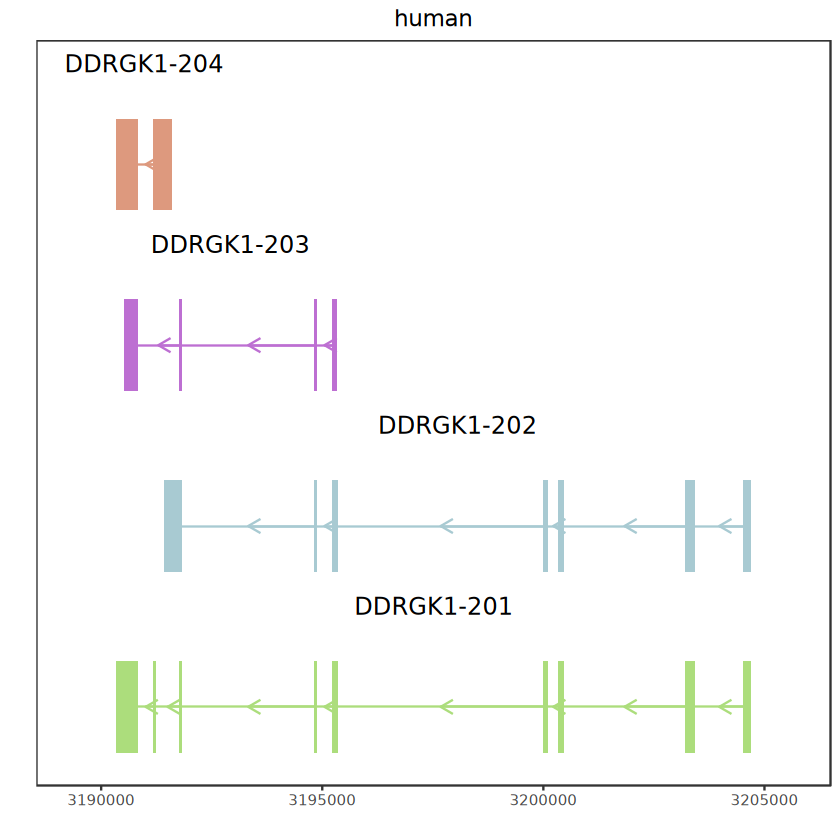

In [485]:
#hubtrans = c("ENST00000354488","ENST00000380201")
gtf.hp$transcript_id_st = substr(gtf.hp$transcript_id,1,15)
gtfdf.hp = as.data.frame(gtf.hp[gtf.hp$gene_name == "DDRGK1",])
gtfdf.hp$transcript_name = as.factor(gtfdf.hp$transcript_name)
unique(gtfdf.hp$transcript_id_st)
groupid = "human"
pc3 = Txrefplot(gtfdf.hp,groupid)
pc3

In [28]:
d2 = disref$DTU
d2g.ASD = d2[abs(d2$DTU.ASD.Value)> 1 & d2$DTU.ASD.p.value< 0.01,]$ensembl_transcript_id
d2g.SCZ = d2[abs(d2$DTU.SCZ.Value)> 1 & d2$DTU.SCZ.p.value < 0.01,]$ensembl_transcript_id
d2g.BD = d2[abs(d2$DTU.BD.Value)> 1 & d2$DTU.BD.p.value < 0.01,]$ensembl_transcript_id
length(d2g.ASD)
d2g.ASD = d2g.ASD[d2g.ASD %in% hgvmac.tmapf$ref_id]
length(d2g.ASD)
d2g.SCZ = d2g.SCZ[d2g.SCZ %in% hgvmac.tmapf$ref_id]
d2g.BD = d2g.BD[d2g.BD %in% hgvmac.tmapf$ref_id]
d2gls = list("ASD" = d2g.ASD,"SCZ" = d2g.SCZ, "BD" = d2g.BD)

Mydtuvsref = function(isosigi,d2gls){
    isosigi = merge(isosigi,hgvmac.tmapf[,c("ref_id","qry_id")],by.x = "transcript_id",by.y = "qry_id")
    isosigi.hub = isosigi[isosigi$sig != "N",]
    isosigi = isosigi[isosigi$transcript_id %in% isosigi.hub$transcript_id,]
    isosigcmp = NULL
    for(i in 1:length(d2gls)){
        isosigj = isosigi[isosigi$ref_id %in% d2gls[[i]],]
        d2.hub = d2[d2$ensembl_transcript_id %in% d2gls[[i]],
            c("external_gene_id","ensembl_transcript_id","DTU.ASD.Value",
              "DTU.SCZ.Value","DTU.BD.Value","DTU.ASD.p.value")]
        isosigcmpi = merge(d2.hub,isosigj,by.x = "ensembl_transcript_id",by.y = "ref_id")
        isosigcmpi$group = names(d2gls)[i]
        isosigcmp = rbind(isosigcmp,isosigcmpi)
    }
    return(isosigcmp)
}
isosigi = isosigls$subclass
isosigcmp.sb = Mydtuvsref(isosigi,d2gls)
isosigcmp.sb$level = "subclass"
isosigi = isosigls$subcortical
isosigcmp.sbc = Mydtuvsref(isosigi,d2gls)
isosigcmp.sbc$level = "subcortical"
isosigi = isosigls$layer
isosigcmp.ly = Mydtuvsref(isosigi,d2gls)
isosigcmp.ly$level = "layer"
isosigi = isosigls$region
isosigcmp.rg = Mydtuvsref(isosigi,d2gls)
isosigcmp.rg$level = "region"
isosigi = isosigls$lobe
isosigcmp.lb = Mydtuvsref(isosigi,d2gls)
isosigcmp.lb$level = "lobe"

length(unique(isosigcmp.rg$gene_id))
#isosigcmpt = rbind(isosigcmp.sb,isosigcmp.sbc)
isosigcmpt = rbind(isosigcmp.sb,isosigcmp.sbc,isosigcmp.ly,isosigcmp.rg,isosigcmp.lb)
length(unique(isosigcmpt$gene_id))
isosigcmpt %>% group_by(group) %>% summarise(genenum = length(unique(gene_id)))
isosigcmpt %>% group_by(level) %>% summarise(genenum = length(unique(gene_id)))
isosigcmpt.st2 = isosigcmpt %>% group_by(gene_id) %>% summarise(groupn = length(unique(group)))
nrow(isosigcmpt.st2[isosigcmpt.st2$groupn > 1,])
isosigcmpt.st2[isosigcmpt.st2$groupn > 2,]
##length(unique(isosigcmp$gene_id))
# isosigcmp.st = isosigcmp %>% group_by(areatr) %>% summarise(cor = cor(DTU.ASD.Value,dr),trannum = length(unique(transcript_id)))
# isosigcmp.st
unique(isosigcmpt$gene_id)

[1] 1991

[1] 543

[1] 142

[1] 265

group,genenum
<chr>,<int>
ASD,90
BD,83
SCZ,117


level,genenum
<chr>,<int>
layer,47
lobe,26
region,142
subclass,108
subcortical,137


[1] 23

gene_id,groupn
<chr>,<int>
MDK,3
PLPP2,3


[1] "LTA4H"        "RPN2"         "AP4B1"        "TATDN1"       "MED21"       
  [6] "RPL22L1"      "MFSD3"        "DDX54"        "SNX32"        "MRFAP1L1"    
 [11] "CRADD"        "TCAIM"        "SMARCE1"      "COPS8"        "SAP30BP"     
 [16] "WDR55"        "RPE"          "ANGEL2"       "PPARD"        "PJA1"        
 [21] "GPATCH2"      "PLEKHA1"      "TMEM56"       "SLC25A25"     "NTRK2"       
 [26] "XRN2"         "ACTR2"        "APOO"         "CDK14"        "RWDD1"       
 [31] "TDG"          "ALG13"        "TMEM106B"     "SLC35A2"      "YWHAH"       
 [36] "VGLL4"        "IL1RAP"       "FDPS"         "THRA"         "CCDC136"     
 [41] "RPS24"        "SMARCC2"      "SEC11A"       "ST6GAL1"      "HSCB"        
 [46] "APMAP"        "ACVR2A"       "RAMP3"        "WDR83"        "RSRP1"       
 [51] "SNRPC"        "ZNF337"       "APC"          "HACE1"        "SLC39A3"     
 [56] "RNF126"       "ARHGEF3"      "RGL1"         "NINJ2"        "ZNF471"      
 [61] "HMGCS1"       "SIVA1"        "TPM3"         "EIF5A"        "CLDND1"      
 [66] "NRXN1"        "MIA3"         "DDRGK1"       "MIER1"        "GDA"         
 [71] "DPCD"         "RCAN2"        "TEX30"        "SEPT8"        "AURKAIP1"    
 [76] "VLDLR"        "RNMT"         "EEF1B2"       "ZDHHC8"       "PPP1R7"      
 [81] "JMJD6"        "TTC19"        "RNF130"       "DERL2"        "GMIP"        
 [86] "ACOT8"        "ARL2BP"       "RPS12"        "CPSF3"        "MECR"        
 [91] "MAPKAP1"      "SLC25A26"     "CLTA"         "MTMR2"        "NMRK1"       
 [96] "PNISR"        "LOC101925321" "PLXDC2"       "C11H12orf73"  "CCP110"      
[101] "COPS2"        "SUPT5H"       "DAPK1"        "CAB39L"       "MFSD1"       
[106] "SPG20"        "MFN2"         "BEND5"        "RELT"         "RHBDL1"      
[111] "VASP"         "AIF1L"        "BFAR"         "RGS20"        "BCCIP"       
[116] "FABP5"        "CLTB"         "ZADH2"        "F8"           "INO80C"      
[121] "DPYSL3"       "LOC102134966" "C15H9orf9"    "MPZL1"        "SMYD2"       
[126] "DCLK1"        "PSIP1"        "SNCA"         "BAIAP2"       "NT5C3A"      
[131] "BECN1"        "CHPF2"        "TMEM161A"     "EFS"          "NUTF2"       
[136] "DECR1"        "GCHFR"        "TMEM206"      "CALB1"        "B3GAT3"      
[141] "EXOSC7"       "FBXO3"        "SRI"          "SAT2"         "PTS"         
[146] "LOC102114773" "LOC102128802" "STOX2"        "PMP22"        "SNAPC5"      
[151] "EDEM3"        "ACOT9"        "SUGP2"        "SNX10"        "TBCCD1"      
[156] "PSPC1"        "SNRPN"        "TM2D3"        "SPRED2"       "SESN1"       
[161] "PHACTR3"      "RALGPS2"      "CXCL12"       "MOG"          "LOC102122672"
[166] "PCNA"         "U2AF1"        "LOC102140649" "LOC102115867" "ATP1B3"      
[171] "RNF146"       "GNPNAT1"      "RASL11A"      "GCAT"         "MACROD1"     
[176] "CDH10"        "AIFM1"        "RNPEP"        "LOC102144128" "STX8"        
[181] "HNRNPD"       "PSMG1"        "SUPT7L"       "KLHDC9"       "MEAF6"       
[186] "APIP"         "FAM172A"      "ARPP21"       "C19H19orf24"  "SMIM19"      
[191] "LOC107131103" "PSMG4"        "C1H1orf52"    "CLCN3"        "CPNE3"       
[196] "SMIM5"        "IFT20"        "ZNF136"       "GYG1"         "NDUFAF5"     
[201] "KATNB1"       "MDK"          "SLC25A12"     "GSTO2"        "FADS3"       
[206] "ZNF587"       "AGPAT4"       "PLD4"         "LOC102122910" "PARP11"      
[211] "ZBED3"        "NTAN1"        "TDRP"         "MRPS35"       "PLLP"        
[216] "PLPP2"        "GALM"         "CERS6"        "DPM2"         "SRSF11"      
[221] "ANXA7"        "NET1"         "FBXW9"        "KCNC2"        "ABTB1"       
[226] "DGKB"         "SMIM4"        "MTX3"         "TMEM205"      "CTDSPL2"     
[231] "TYROBP"       "MARCH9"       "EMP3"         "ARL6"         "TMEM110"     
[236] "BOLA1"        "OLFM3"        "BCAS4"        "PLA2G5"       "MOSPD2"      
[241] "GEMIN8"       "FGF9"         "MICU2"        "GNG4"         "PIK3R3"      
[246] "ARRB1"        "TDRD7"     

In [30]:
length(unique(isosigcmpt$transcript_id))
length(unique(isosigcmpt$gene_id))

[1] 283

[1] 265

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


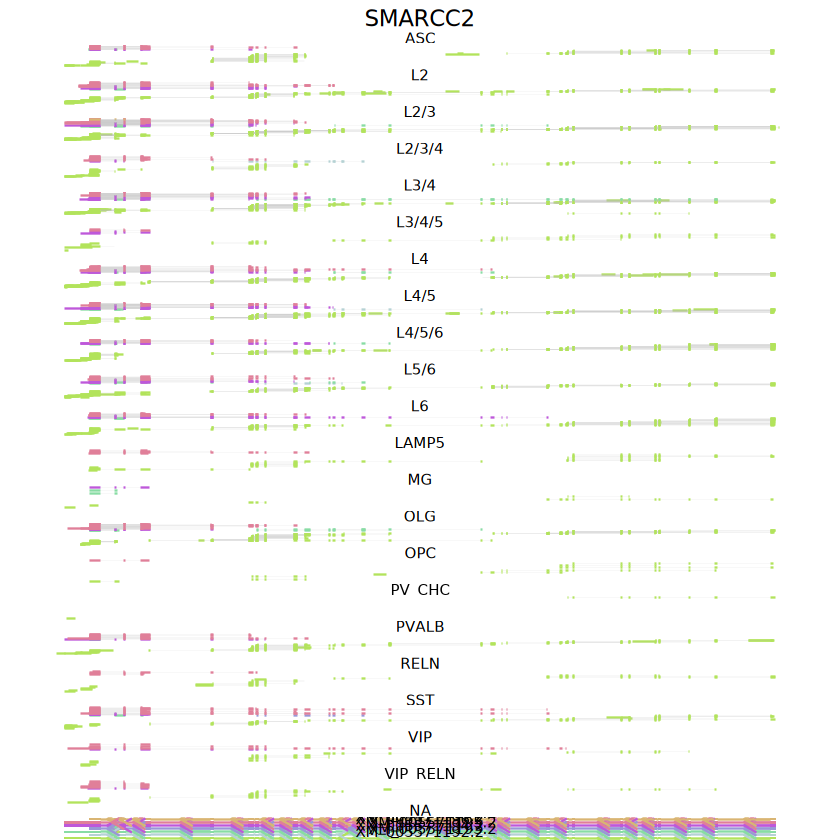

In [624]:
geneex = "SMARCC2"
#fsraw.cor.hub = fsraw.cor[fsraw.cor$subclass %in% c("L4","VIP","ASC","OPC","OLG"),]
grtdfl = BuildPlotBed(fsraw.cor,longbed,"subclass",geneex,NULL)
#grtdfl = grtdfl[grtdfl$transcript_id %in% c("NM_001283865.1","XM_005571070.2"),]
#grtdfl = grtdfl %>% group_by(readid) %>% filter(n()> 3)
pci = tryCatch(IsoformReadPlot(gtf, grtdfl,geneex,onlyhub = T), error = function(e) NULL)
pci
 # ggexport(pci,filename = "result/figure5/dtu_case_ls_disease_RBP_gene_readsplice_24_11_17.pdf",
 #           width = 5,height = 3)

`summarise()` has grouped output by 'level'. You can override using the
`.groups` argument.
file saved to result/figure5/Disease_conserve_dtu_stat_bar_25_12_18.pdf



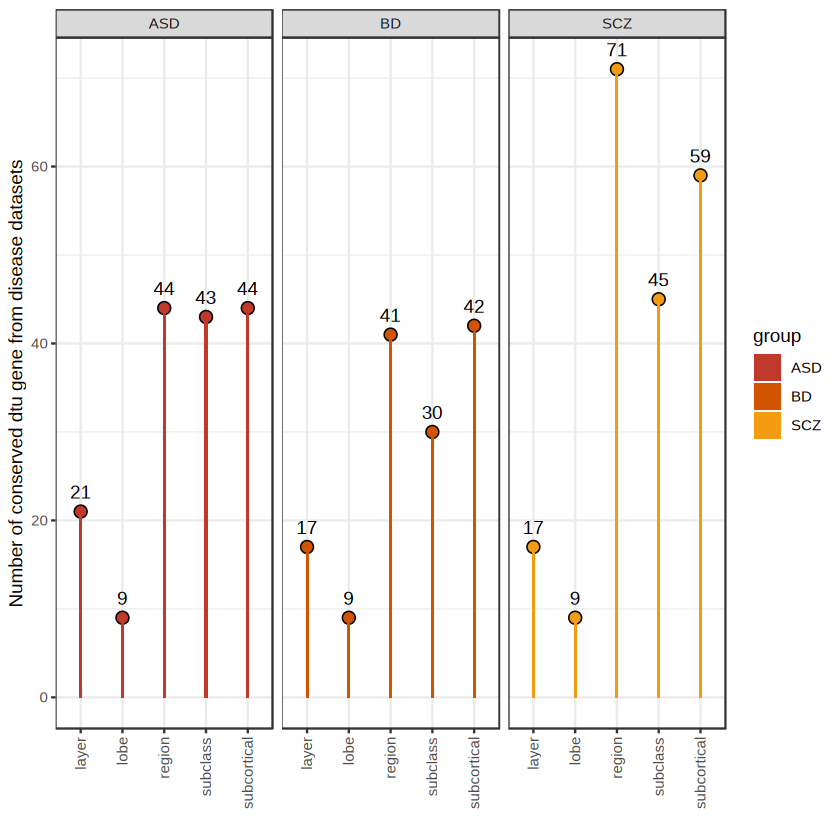

file saved to result/figure5/Disease_conserve_dtu_stat_tile_25_12_18.pdf

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


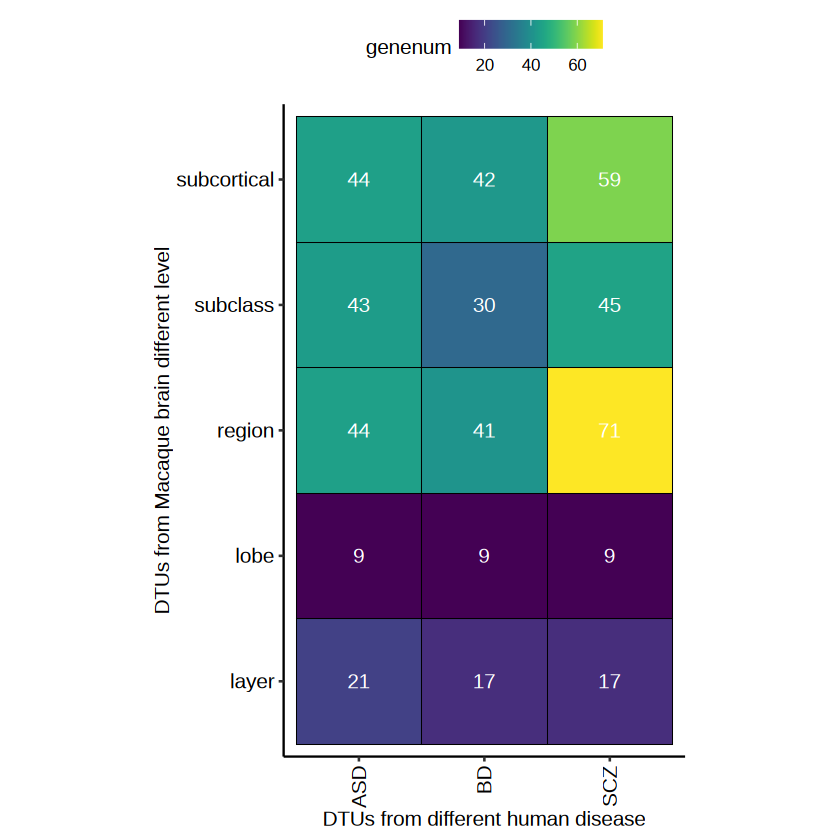

file saved to result/figure5/Disease_conserve_dtu_stat_venn_25_12_18.pdf



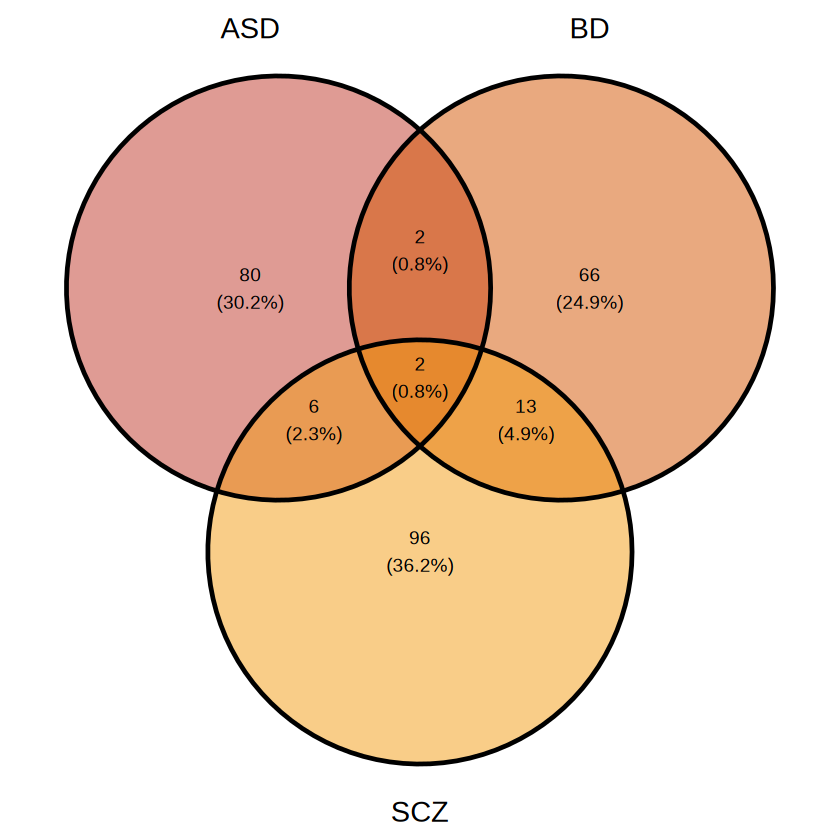

In [287]:
#disease associated FS DTU gene stat
isosigcmpt.st = isosigcmpt %>% group_by(level,group) %>% summarise(genenum = length(unique(gene_id)))
#ggplot(isosigcmpt.st,aes(x = level,fill = group,y = genenum)) + geom_bar(stat = "identity",position = "dodge")
p1.2 = ggplot(isosigcmpt.st,aes(x = level,fill = group,y = genenum)) + 
        geom_point(shape = 21,size = 3,position = position_dodge(0.5)) +
        geom_text(aes(label = genenum),vjust = -1) +
        geom_bar(stat = "identity",width = 0.05,color = NA,position = position_dodge(0.5)) +
        facet_grid(~group) +
        scale_fill_flatui() +
        theme_bw() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) + xlab("") + 
        ylab("Number of conserved dtu gene from disease datasets")
p1.2
ggexport(p1.2,filename = "result/figure5/Disease_conserve_dtu_stat_bar_25_12_18.pdf",width = 5,height = 4)

p1.2.1 = ggplot(isosigcmpt.st,aes(y = level,x = group,fill = genenum)) + 
        geom_tile(color = "black") +
        geom_text(aes(label = genenum),color = "white") +
        scale_fill_viridis(option = "D") +
        coord_fixed() +
        theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) + ylab("DTUs from Macaque brain different level") + 
        xlab("DTUs from different human disease")
p1.2.1
ggexport(p1.2.1,filename = "result/figure5/Disease_conserve_dtu_stat_tile_25_12_18.pdf",width = 5,height = 4)


fsdtuds = list("ASD" = unique(isosigcmpt[isosigcmpt$group == "ASD",]$gene_id),
              "BD" = unique(isosigcmpt[isosigcmpt$group == "BD",]$gene_id),
              "SCZ" = unique(isosigcmpt[isosigcmpt$group == "SCZ",]$gene_id))
p1.3 = ggvenn(fsdtuds) + scale_fill_flatui()
p1.3
ggexport(p1.3,filename = "result/figure5/Disease_conserve_dtu_stat_venn_25_12_18.pdf",width = 5,height = 4)

Warning message:
"The input is a data frame-like object, convert it to a matrix."


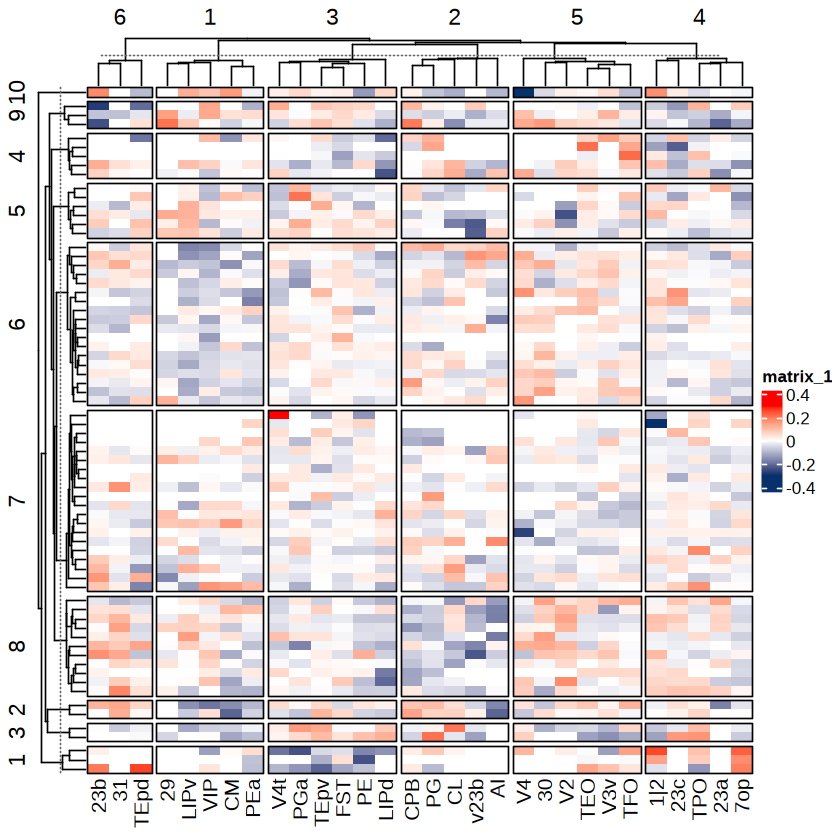

In [288]:
isosigi = isosigls$region
hubtrans = isosigcmpt[isosigcmpt$sig != "N" & isosigcmpt$group == "SCZ" & isosigcmpt$level == "region",]$transcript_id
isosigi = isosigi[isosigi$transcript_id %in% hubtrans,]
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isosigimx = dcast(isosigi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigimx) = isosigimx$gene_id;isosigimx = isosigimx[,-1]

#pdf("result/figure5/ASD_disease_dtu_cases_24_11_21.pdf",width = 10,height = 3)
Heatmap(isosigimx,show_row_names = F,border = TRUE,column_km = 6,row_km = 10,
       colorRamp2(c(-0.3,0,0.3), c("#08306B", "white", "red")))


In [611]:
fsdtudsdf = data.frame("gene_id" = c(fsdtuds$ASD,fsdtuds$BD,fsdtuds$SCZ),
                      "group" = rep(c("ASD","BD","SCZ"),c(length(fsdtuds$ASD),length(fsdtuds$BD),length(fsdtuds$SCZ))))
write.csv(fsdtudsdf,file = "result/figure5/Disease_conserve_dtu_list.csv",row.names =F,quote = F)

In [844]:
# fsdtudsdf[fsdtudsdf$gene_id %in% refgdf[refgdf$source == "ASD.TWAS",]$gene_id,]
# fsdtudsdf[fsdtudsdf$gene_id %in% refgdf[refgdf$source == "BD.TWAS",]$gene_id,]
# fsdtudsdf[fsdtudsdf$gene_id %in% refgdf[refgdf$source == "SCZ.TWAS",]$gene_id,]
#fsdtudsdf[fsdtudsdf$group == "BD",]$gene_id
fsdtudsdf[fsdtudsdf$group == "SCZ",]$gene_id[order(fsdtudsdf[fsdtudsdf$group == "SCZ",]$gene_id)]
#d2[abs(d2$DTU.SCZ.Value)> 1 & d2$DTU.SCZ.p.value < 0.01 & d2$external_gene_id == "CTLA",]
hgvmac.tmapf[hgvmac.tmapf$qry_gene_id == "SNRPN",]
#refgdf[refgdf$gene_id %in% c("CLTA","CLTB"),]

[1] "ABCG2"           "ACSL6"           "ACTR8"           "ACVR2A"         
  [5] "AFAP1"           "AGPAT4"          "AP2M1"           "APC"            
  [9] "APMAP"           "ARAP3"           "ARFGEF1"         "ARHGEF3"        
 [13] "ARL6"            "ARRB1"           "ASPH"            "ATF1"           
 [17] "ATP1B3"          "AUP1"            "AURKAIP1"        "B3GAT3"         
 [21] "BambuGene113631" "BCAS4"           "BOLA1"           "C8H8orf82"      
 [25] "CAB39L"          "CALB1"           "CALML4"          "CD44"           
 [29] "CDK14"           "CEP89"           "CHPF2"           "CLDND1"         
 [33] "CNTNAP4"         "CTDSPL2"         "CXCL12"          "DDRGK1"         
 [37] "DDX55"           "DECR1"           "DGKG"            "DPCD"           
 [41] "EDEM3"           "EEF1B2"          "EFS"             "EIF5A"          
 [45] "ELOVL1"          "EMP3"            "EXOSC7"          "FADS3"          
 [49] "FBXO3"           "FBXO7"           "FGF9"            "FZR1"           
 [53] "GALM"            "GCHFR"           "GDA"             "GEMIN8"         
 [57] "GFOD2"           "GMDS"            "GNG4"            "GPR85"          
 [61] "HACE1"           "HMGCS1"          "HSCB"            "IBTK"           
 [65] "JMJD6"           "KAT6B"           "KIAA0430"        "KIFAP3"         
 [69] "KLHL3"           "LOC102114773"    "LOC102114950"    "LOC102115867"   
 [73] "LOC102122672"    "LOC102122910"    "LOC102128802"    "LOC102130734"   
 [77] "LOC102140649"    "MARCH9"          "MDK"             "MIA3"           
 [81] "MICU2"           "MID1"            "MIER1"           "MOG"            
 [85] "MORF4L1"         "MORN1"           "MOSPD2"          "NAA16"          
 [89] "NEK1"            "NHSL1"           "NINJ2"           "NPAS4"          
 [93] "NRXN1"           "NTAN1"           "NUDT4"           "NUTF2"          
 [97] "OLFM3"           "PCNA"            "PDE4B"           "PHACTR3"        
[101] "PIK3R3"          "PLA2G5"          "PLCD1"           "PLD4"           
[105] "PLPP2"           "PMP22"           "PPP1R7"          "PROC"           
[109] "PSPC1"           "PTS"             "RAMP3"           "RCAN2"          
[113] "RGL1"            "RNF126"          "RNF130"          "RNF144A"        
[117] "RNF146"          "RNMT"            "RPH3A"           "RSRP1"          
[121] "RTBDN"           "SAT2"            "SEPT8"           "SESN1"          
[125] "SIVA1"           "SLC12A2"         "SLC25A13"        "SLC25A15"       
[129] "SLC39A3"         "SMARCC2"         "SNAPC5"          "SNRPC"          
[133] "SNRPN"           "SNX10"           "SPRED2"          "SRI"            
[137] "ST6GAL1"         "STOX2"           "SUSD3"           "TBCCD1"         
[141] "TDRD7"           "TEX30"           "TM2D3"           "TMEM106B"       
[145] "TMEM110"         "TMEM144"         "TMEM161A"        "TMEM176B"       
[149] "TMEM206"         "TMTC4"           "TRA2B"           "TRIM36"         
[153] "TRIM4"           "TTC19"           "TTC21B"          "TYROBP"         
[157] "U2AF1"           "USP19"           "VLDLR"           "WDR55"          
[161] "WDR83"           "WTAP"            "XKR4"            "ZDHHC8"         
[165] "ZFR"             "ZMYM6"           "ZNF337"          "ZNF471"         
[169] "ZNF587"          "ZNF827"

,ref_gene_id,ref_id,class_code,qry_gene_id,qry_id,num_exons,FPKM,TPM,cov,len,major_iso_id,ref_match_len
,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
32782,ENSG00000128739.16,ENST00000346403,=,SNRPN,XM_005558943.2,10,0,0,0,1304,XM_015452467.1,1304
32784,ENSG00000128739.16,ENST00000390687,=,SNRPN,NM_001287684.1,10,0,0,0,1278,XM_015452467.1,1527


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


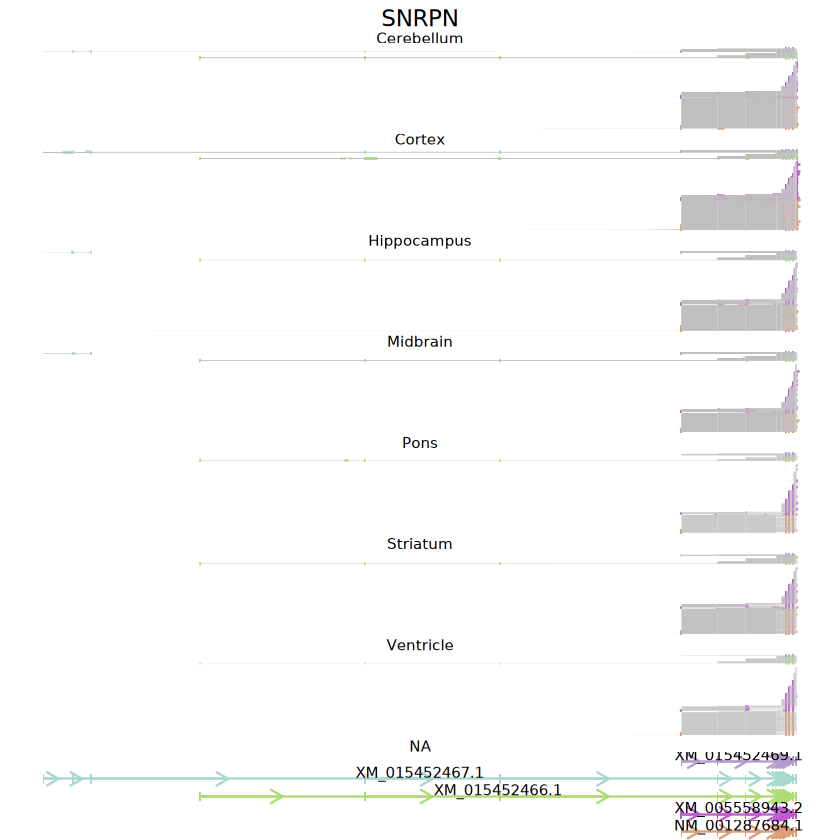

In [845]:
geneex = "SNRPN"
grtdfl = BuildPlotBed(fsraw.cor,longbed,"subcortical",geneex,NULL)
pci = tryCatch(IsoformReadPlot(gtf, grtdfl,geneex,onlyhub = T), error = function(e) NULL)
pci

In [574]:
#stat area conerved score
d2 = disref$DTU
d2g.ASD = d2[abs(d2$DTU.ASD.Value)> 1 & d2$DTU.ASD.p.value< 0.01,]
d2g.SCZ = d2[abs(d2$DTU.SCZ.Value)> 1 & d2$DTU.SCZ.p.value < 0.01,]
d2g.BD = d2[abs(d2$DTU.BD.Value)> 1 & d2$DTU.BD.p.value < 0.01,]

d2g.ASD = d2g.ASD[d2g.ASD$ensembl_transcript_id %in% hgvmac.tmapf$ref_id,]
d2g.ASD$value = d2g.ASD$DTU.ASD.Value
d2g.SCZ = d2g.SCZ[d2g.SCZ$ensembl_transcript_id %in% hgvmac.tmapf$ref_id,]
d2g.SCZ$value = d2g.SCZ$DTU.SCZ.Value
d2g.BD = d2g.BD[d2g.BD$ensembl_transcript_id %in% hgvmac.tmapf$ref_id,]
d2g.BD$value = d2g.BD$DTU.BD.Value
d2gls = list("ASD" = d2g.ASD,"SCZ" = d2g.SCZ, "BD" = d2g.BD)

Mydtuvsref2 = function(isosigi,d2gls){
    isosigi = merge(isosigi,hgvmac.tmapf[,c("ref_id","qry_id")],by.x = "transcript_id",by.y = "qry_id")
    isosigi.hub = isosigi[isosigi$sig != "N",]
    isosigi = isosigi[isosigi$transcript_id %in% isosigi.hub$transcript_id,]
    isosigcmp = NULL
    
    for(i in 1:length(d2gls)){
        d2gi = d2gls[[i]]
        d2gi$sigref = "N"
        d2gi[d2gi$value > 1,]$sigref = "Up"
        d2gi[d2gi$value < (-1),]$sigref = "Down"
        d2gi = d2gi[,c("external_gene_id","ensembl_transcript_id","value","sigref")]
        isosigcmpi = merge(d2gi,isosigi,by.x = "ensembl_transcript_id",by.y = "ref_id")
        isosigcmpi$group = names(d2gls)[i]
        isosigcmpi$consist = "N"
        isosigcmpi[isosigcmpi$sigref == isosigcmpi$sig & isosigcmpi$sig %in% c("Up","Down"),]$consist = "Cons"
        isosigcmpi[isosigcmpi$sigref != isosigcmpi$sig & isosigcmpi$sig %in% c("Up","Down"),]$consist = "Rev"
        isosigcmp = rbind(isosigcmp,isosigcmpi)
    }
    return(isosigcmp)
}
isosigcmpt = NULL
for(i in 1:length(isosigls)){
    isosigi = isosigls[[i]]
    isosigcmpi = Mydtuvsref2(isosigi,d2gls)
    isosigcmpi$level = names(isosigls)[i]
    isosigcmpt = rbind(isosigcmpt,isosigcmpi)
}
isosigcmpt.st = isosigcmpt %>% group_by(level,group) %>% 
    mutate(genet = length(unique(gene_id)),
              transt = length(unique(transcript_id)))

isosigcmpt.st = isosigcmpt.st %>% group_by(level,group,areatr,consist) %>% 
    summarise(genen = length(unique(gene_id)),
              transn = length(unique(transcript_id)),
             genep = genen/genet,
             transp = transn/transt)

Warning message:
"Returning more (or less) than 1 row per `summarise()` group was deprecated in
dplyr 1.1.0.
ℹ Please use `reframe()` instead.
ℹ When switching from `summarise()` to `reframe()`, remember that `reframe()`
  always returns an ungrouped data frame and adjust accordingly."
`summarise()` has grouped output by 'level', 'group', 'areatr', 'consist'. You
can override using the `.groups` argument.


`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


areatr,group,cor
<chr>,<chr>,<dbl>
GABA,ASD,-0.304772864
GABA,BD,0.023530928
GABA,SCZ,0.090765300
GLU,ASD,0.001605688
GLU,BD,-0.192417850
GLU,SCZ,0.015425195
NonNeuron,ASD,0.155751489
NonNeuron,BD,0.061867751
NonNeuron,SCZ,-0.077935344


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-5.1293 -2.9193 -1.2896 -0.3222  2.2671  4.4220 

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-0.355477 -0.071026  0.003462  0.010100  0.081237  0.342222 

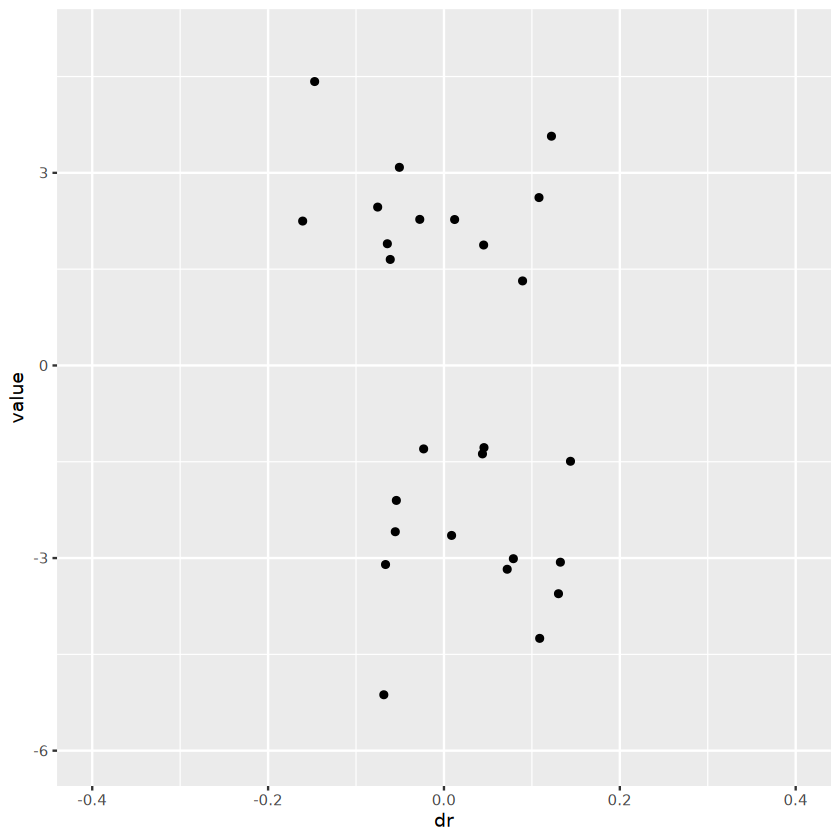

In [619]:
isosigcmpt[isosigcmpt$level == "class",] %>% group_by(areatr,group) %>% summarise(cor = cor(value,dr))

summary(isosigcmpt[isosigcmpt$areatr == "NonNeuron" & isosigcmpt$group == "ASD",]$value)
summary(isosigcmpt[isosigcmpt$areatr == "ASC" & isosigcmpt$group == "ASD",]$dr)
ggplot(isosigcmpt[isosigcmpt$areatr == "GABA" & isosigcmpt$group == "ASD",],
       aes(x = dr,y = value)) + geom_point() +
scale_x_continuous(limits = c(-0.4,0.4)) + scale_y_continuous(limits = c(-6,5))

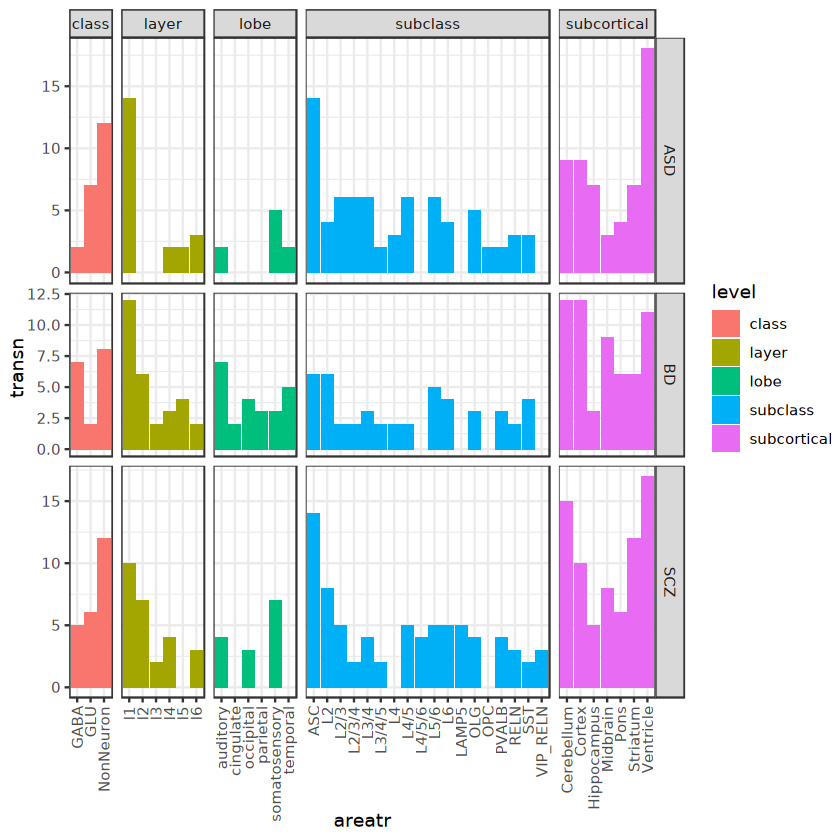

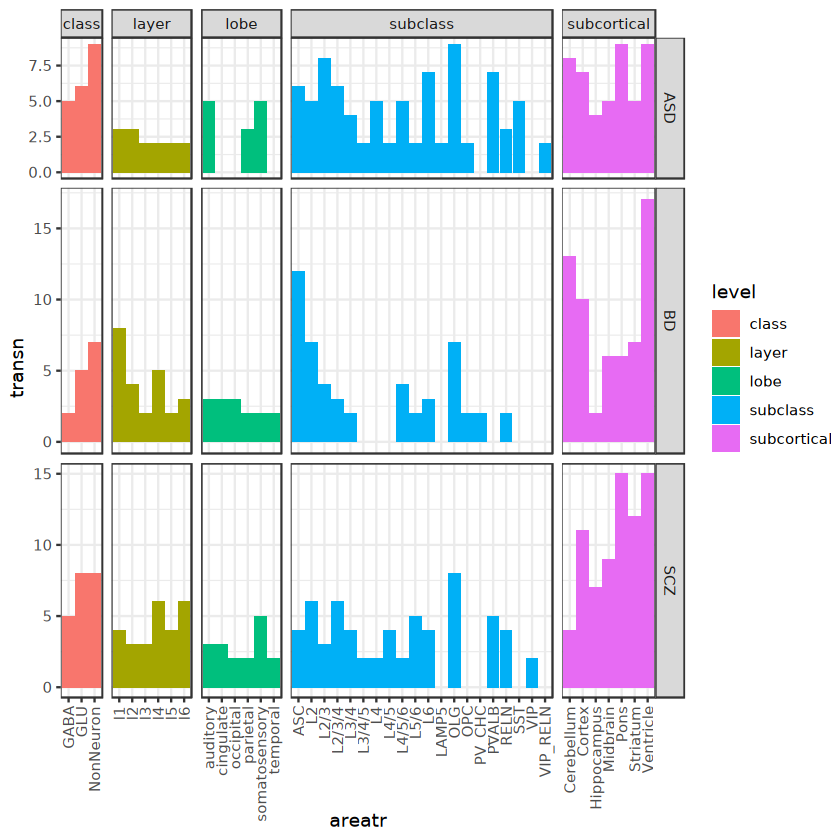

In [577]:
isosigcmpt.st.fil = isosigcmpt.st[isosigcmpt.st$genen > 1,]
ggplot(isosigcmpt.st.fil[isosigcmpt.st.fil$consist == "Cons" & !isosigcmpt.st.fil$level %in% "region",],aes(x = areatr,y = transn,fill = level)) +
    geom_bar(stat = "identity",position = "dodge") +
    facet_grid(group~level,space = "free",scales = "free") +
    theme_bw() + theme(axis.text.x = element_text(angle = 90, vjust = 0.5,hjust = 1))
ggplot(isosigcmpt.st.fil[isosigcmpt.st.fil$consist == "Rev" & !isosigcmpt.st.fil$level %in% "region",],aes(x = areatr,y = transn,fill = level)) +
    geom_bar(stat = "identity",position = "dodge") +
    facet_grid(group~level,space = "free",scales = "free") +
    theme_bw() + theme(axis.text.x = element_text(angle = 90, vjust = 0.5,hjust = 1))


In [290]:
ra = 200
fsraw.cor$xid = as.integer(fsraw.cor$x/(ra*2)) * ra * 2 + ra
fsraw.cor$yid = as.integer(fsraw.cor$y/(ra*2)) * ra * 2 + ra
fsraw.cor$blockid = paste0(fsraw.cor$xid,"_", fsraw.cor$yid)

In [291]:
fsraw.block = fsraw.cor %>% group_by(subcortical,layer,region,xid,yid,blockid,gene_id,transcript_id) %>% 
    summarise(readnum = length(readid))
head(fsraw.block)
fsraw.block.hub = fsraw.block[fsraw.block$transcript_id %in% hgvmac.tmapf$qry_id,]
nrow(fsraw.block)
nrow(fsraw.block.hub)

`summarise()` has grouped output by 'subcortical', 'layer', 'region', 'xid',
'yid', 'blockid', 'gene_id'. You can override using the `.groups` argument.


subcortical,layer,region,xid,yid,blockid,gene_id,transcript_id,readnum
<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>
Cerebellum,cb,cb,5800,84600,5800_84600,AARS,XM_005592535.2,3
Cerebellum,cb,cb,5800,84600,5800_84600,ABCD3,XM_005542668.2,3
Cerebellum,cb,cb,5800,84600,5800_84600,ACBD6,XM_005540148.2,3
Cerebellum,cb,cb,5800,84600,5800_84600,ADCYAP1R1,XM_015447551.1,3
Cerebellum,cb,cb,5800,84600,5800_84600,ADNP,XM_015429972.1,3
Cerebellum,cb,cb,5800,84600,5800_84600,AGTPBP1,XM_015437339.1,3


[1] 28749595

[1] 19712003

In [292]:
isost = fsraw.block.hub %>% group_by(gene_id,transcript_id) %>% summarise(readnum = sum(readnum))
isost = isost %>% group_by(gene_id) %>% mutate(meanrelative = readnum/sum(readnum))
head(isost)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


gene_id,transcript_id,readnum,meanrelative
<chr>,<chr>,<int>,<dbl>
A4GALT,XM_015457102.1,4,1.0000000
AAAS,XM_005571000.2,978,1.0000000
AACS,NM_001284010.1,3805,0.8834456
AACS,XM_015430724.1,502,0.1165544
AADAT,XM_005556303.2,711,1.0000000
AAED1,XM_005582336.1,15,1.0000000


In [293]:
d1 = disref$DGE
d1g.ASD = d1[abs(d1$ASD.log2FC)> 1 & d1$ASD.p.value< 0.01,]
d1g.SCZ = d1[abs(d1$SCZ.log2FC)> 1 & d1$SCZ.p.value < 0.01,]
d1g.BD = d1[abs(d1$BD.log2FC)> 1 & d1$BD.p.value < 0.01,]
d1gls = list("ASD" = d1g.ASD,"SCZ" = d1g.SCZ, "BD" = d1g.BD)

d2 = disref$DTU
# d2g.ASD = d2[abs(d2$DTU.ASD.Value) > 1 & d2$DTU.ASD.p.value< 0.01,]
# d2g.ASD = d2[d2$external_gene_id %in% d2g.ASD$external_gene_id,]
# d2g.SCZ = d2[abs(d2$DTU.SCZ.Value) > 1 & d2$DTU.SCZ.p.value < 0.01,]
# d2g.SCZ = d2[d2$external_gene_id %in% d2g.SCZ$external_gene_id,]
# d2g.BD = d2[abs(d2$DTU.BD.Value) > 1 & d2$DTU.BD.p.value < 0.01,]
#d2g.BD = d2[d2$external_gene_id %in% d2g.BD$external_gene_id,]
d2g.ASD = d2[d2$ensembl_transcript_id %in% hgvmac.tmapf$ref_id,]
d2g.ASD$value = d2g.ASD$DTU.ASD.Value
d2g.SCZ = d2[d2$ensembl_transcript_id %in% hgvmac.tmapf$ref_id,]
d2g.SCZ$value = d2g.SCZ$DTU.SCZ.Value
d2g.BD = d2[d2$ensembl_transcript_id %in% hgvmac.tmapf$ref_id,]
d2g.BD$value = d2g.BD$DTU.BD.Value
d2gls = list("ASD" = d2g.ASD,"SCZ" = d2g.SCZ, "BD" = d2g.BD)

CalDsscore = function(d2gi,fsraw.block.hub,isost){
    d2gi = d2gi[,c("external_gene_id","ensembl_transcript_id","value")]
    d2gi = merge(d2gi,hgvmac.tmapf,by.x = "ensembl_transcript_id",by.y = "ref_id")
    d2gi = unique(d2gi[,c("qry_gene_id","qry_id","value")])
    # spds.score = fsraw.block.hub[fsraw.block.hub$gene_id %in% d2gi$qry_gene_id,]
    # #spds.score = merge(fsraw.block.hub,d2gi,by.x = "transcript_id",by.y = "qry_id")
    # spds.score = spds.score %>% group_by(subcortical,layer,region,xid,yid,blockid,gene_id) %>% 
    #                         mutate(relative = readnum/sum(readnum))
    # spds.score = merge(spds.score,isost[,c("gene_id","transcript_id","meanrelative")],by = c("gene_id","transcript_id"))
    # spds.score$dr = spds.score$relative - spds.score$meanrelative 
    spds.score = merge(fsraw.block.hub,d2gi,by.x = "transcript_id",by.y = "qry_id")
    spds.score = spds.score[!is.na(spds.score$value),]
    spds.score = spds.score %>% group_by(subcortical,layer,region,xid,yid,blockid) %>% 
            summarise(readnumt = sum(readnum),genenum = length(unique(gene_id)),score = sum(value*readnum)/readnumt)
            #summarise(readnumt = sum(readnum),score = cor(dr,value),genenum = length(unique(gene_id)))
    # spds.score$type = "N"
    # spds.score[spds.score$value > 0,]$type = "Up"
    # spds.score[spds.score$value < 0,]$type = "Down"
    # fsraw.block.hub$score = 0
    # fsraw.block.hub[fsraw.block.hub$transcript_id %in% d2gi$qry_id,]$score = 1
    # #fsraw.block.hub[fsraw.block.hub$transcript_id %in% d2gi[d2gi$value < (-1),]$qry_id,]$score = -1
    # spds.score = spds.score %>% group_by(subcortical,layer,region,xid,yid,blockid) %>% 
    #     summarise(readnumt = sum(readnum),genenum = length(unique(gene_id)),score = sum(value*readnum)/readnumt)
    # spds.score = spds.score %>% group_by(subcortical,layer,region,xid,yid,blockid,type) %>% 
    #     summarise(readnum = sum(readnum),score = readnum/readnumt,readnumt = readnumt[1],genenum = genenum[1])
    return(spds.score)
    
}

CalDsscoreG = function(d2gi,fsraw.block.hub){
    fsraw.block.hub$score = 0
    fsraw.block.hub[fsraw.block.hub$gene_id %in% d2gi$gene_name,]$score = 1
    spds.score = fsraw.block.hub %>% group_by(subcortical,layer,region,xid,yid,blockid) %>% 
        summarise(score = sum(score*readnum)/sum(readnum),readnumt = sum(readnum),
                  genenum = length(unique(gene_id)))
    return(spds.score)
}
spds.scz = CalDsscore(d2gls$SCZ,fsraw.block.hub,isost)
spds.asd = CalDsscore(d2gls$ASD,fsraw.block.hub,isost)
spds.bd = CalDsscore(d2gls$BD,fsraw.block.hub,isost)

# spds.scz.g = CalDsscoreG(d1gls$SCZ,fsraw.block.hub)
# spds.asd.g = CalDsscoreG(d1gls$ASD,fsraw.block.hub)
# spds.bd.g = CalDsscoreG(d1gls$BD,fsraw.block.hub)

`summarise()` has grouped output by 'subcortical', 'layer', 'region', 'xid',
'yid'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'subcortical', 'layer', 'region', 'xid',
'yid'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'subcortical', 'layer', 'region', 'xid',
'yid'. You can override using the `.groups` argument.


In [289]:
#in celltype
fsraw.cell = fsraw.cor[fsraw.cor$subclass != "",] %>% 
    group_by(class,subclass,gene_id,transcript_id) %>% 
    summarise(readnum = length(readid))
d2g.ASD = d2[d2$ensembl_transcript_id %in% hgvmac.tmapf$ref_id,]
d2g.ASD$value = d2g.ASD$DTU.ASD.Value
d2g.SCZ = d2[d2$ensembl_transcript_id %in% hgvmac.tmapf$ref_id,]
d2g.SCZ$value = d2g.SCZ$DTU.SCZ.Value
d2g.BD = d2[d2$ensembl_transcript_id %in% hgvmac.tmapf$ref_id,]
d2g.BD$value = d2g.BD$DTU.BD.Value
d2gls = list("ASD" = d2g.ASD,"SCZ" = d2g.SCZ, "BD" = d2g.BD)

CalDsscoreCell = function(d2gi,fsraw.cell){
    d2gi = d2gi[,c("external_gene_id","ensembl_transcript_id","value")]
    d2gi = merge(d2gi,hgvmac.tmapf,by.x = "ensembl_transcript_id",by.y = "ref_id")
    d2gi = unique(d2gi[,c("qry_gene_id","qry_id","value")])
  
    spds.score = merge(fsraw.cell,d2gi,by.x = "transcript_id",by.y = "qry_id")
    spds.score = spds.score[!is.na(spds.score$value),]
    spds.score = spds.score %>% group_by(class,subclass) %>% 
            summarise(readnumt = sum(readnum),genenum = length(unique(gene_id)),score = sum(value*readnum)/readnumt)
    return(spds.score)
}
spds.scz.c = CalDsscoreCell(d2gls$SCZ,fsraw.cell)
spds.asd.c = CalDsscoreCell(d2gls$ASD,fsraw.cell)
spds.bd.c = CalDsscoreCell(d2gls$BD,fsraw.cell)

`summarise()` has grouped output by 'class', 'subclass', 'gene_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'class'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'class'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'class'. You can override using the
`.groups` argument.


In [ ]:
spds.scz.c$group = "SCZ"
spds.asd.c$group = "ASD"
spds.bd.c$group = "BD"
spdst.c = rbind(spds.scz.c,spds.asd.c,spds.bd.c)

groupid = c("ASD","SCZ","BD")
ptls = list()
for(i in 1:length(groupid)){
    pti = ggplot(spdst.c[spdst.c$readnumt > 1000 & spdst.c$group == groupid[i],],aes(x = class, y = score,fill = group))+
     # geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      facet_grid(~group) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform disease similarity score(IDS)") + xlab("")
    ptls[[i]] = pti
}

ptt = ggarrange(plotlist = ptls,nrow = 1)
ptt

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure5/spatial_isoform_disease_associated_point_SCZ_25_12_18.pdf

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


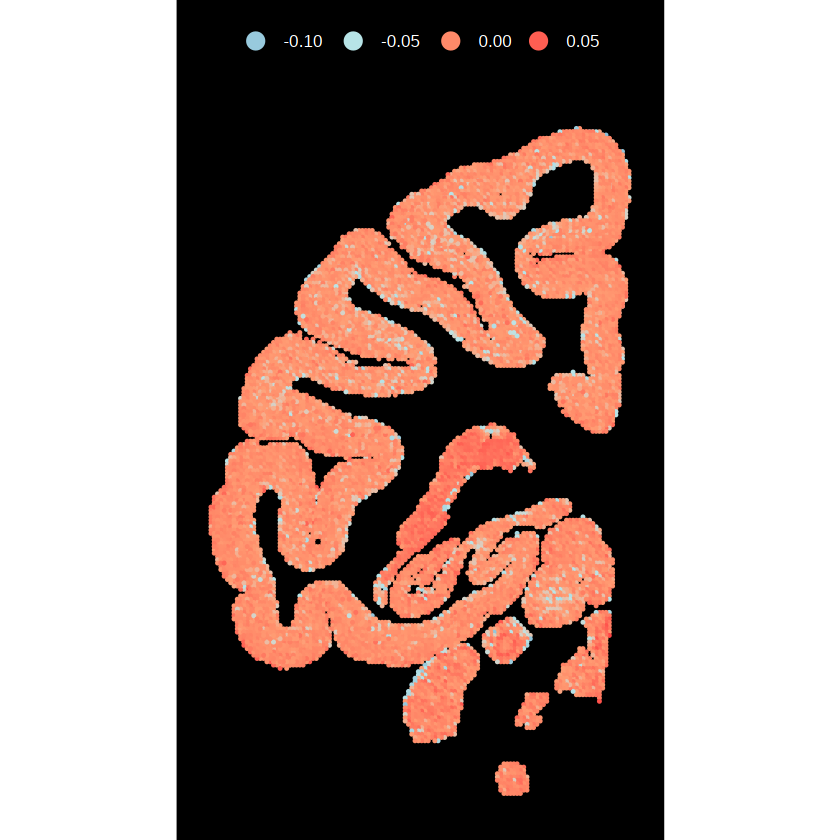

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure5/spatial_isoform_disease_associated_point_ASD_25_12_18.pdf

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


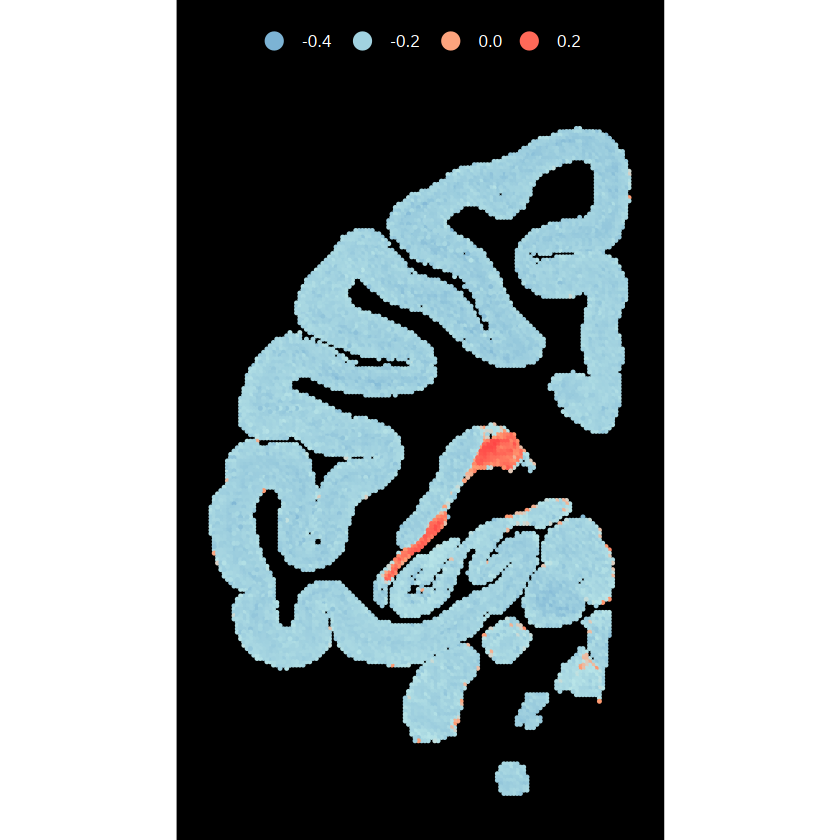

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure5/spatial_isoform_disease_associated_point_BD_25_12_18.pdf



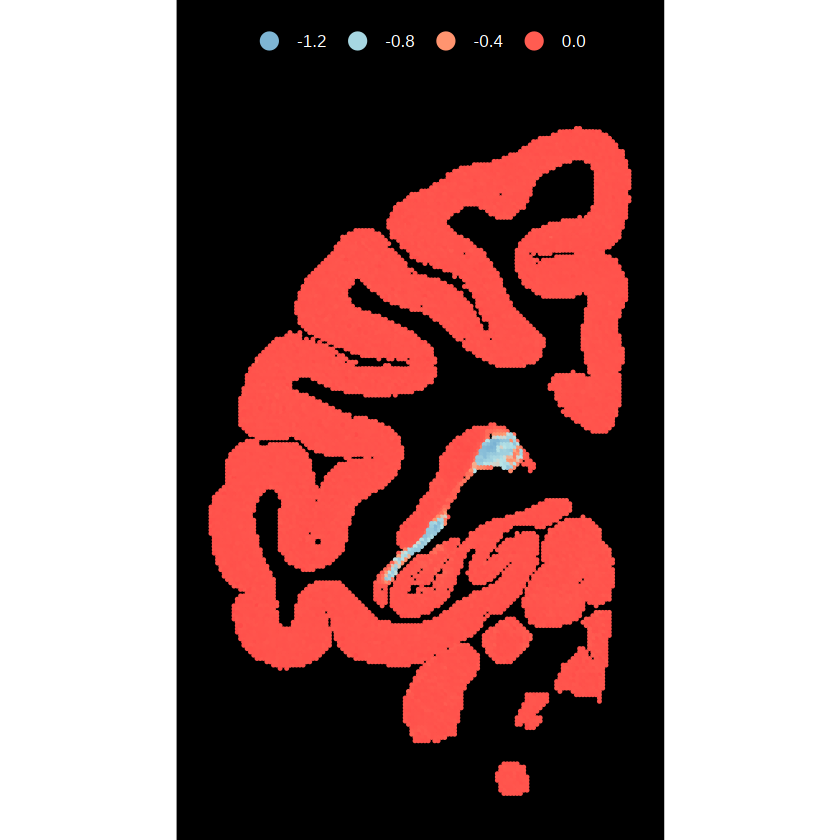

In [294]:
colfunc1 <- colorRampPalette(c("#7AB2D3", "#B9E5E8"))
col1 = colfunc1(5)
colfunc2 <- colorRampPalette(c("#FF9C73", "#FF4545"))
col2 = colfunc2(5)

pmkpti = ggplot(spds.scz[spds.scz$readnumt > 1000,],aes(x = xid, y = yid,color = score)) +
      geom_point(size = 0.001) +
      theme_void() + 
      scale_colour_gradientn(colours = c(col1,col2)) +
        #limits = c(-0.5, 0.25) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 10)) +
      guides(color = guide_legend(override.aes = list(size=4),
                                  nrow = 1),
            size = "none") +
      scale_y_reverse() + scale_x_reverse() +
      coord_fixed()
pmkpti
ggexport(pmkpti,filename = "result/figure5/spatial_isoform_disease_associated_point_SCZ_25_12_18.pdf", width = 4,height = 6)

pmkpti = ggplot(spds.asd[spds.asd$readnumt > 1000,],aes(x = xid, y = yid,color = score)) +
      geom_point(size = 0.001) +
      theme_void() + 
      scale_colour_gradientn(colours = c(col1,col2)) +
        #limits = c(-0.5, 0.25) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 10)) +
      guides(color = guide_legend(override.aes = list(size=4),
                                  nrow = 1),
            size = "none") +
      scale_y_reverse() + scale_x_reverse() +
      coord_fixed()
pmkpti
ggexport(pmkpti,filename = "result/figure5/spatial_isoform_disease_associated_point_ASD_25_12_18.pdf", width = 4,height = 6)

pmkpti = ggplot(spds.bd[spds.bd$readnumt > 1000,],aes(x = xid, y = yid,color = score)) +
      geom_point(size = 0.001) +
      theme_void() + 
      scale_colour_gradientn(colours = c(col1,col2)) +
        #limits = c(-0.5, 0.25) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 10)) +
      guides(color = guide_legend(override.aes = list(size=4),
                                  nrow = 1),
            size = "none") +
      scale_y_reverse() + scale_x_reverse() +
      coord_fixed()
pmkpti
ggexport(pmkpti,filename = "result/figure5/spatial_isoform_disease_associated_point_BD_25_12_18.pdf", width = 4,height = 6)

Warning message:
"The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead."
file saved to result/figure5/spatial_isoform_disease_associated_point_total_boxplot_25_12_18.pdf



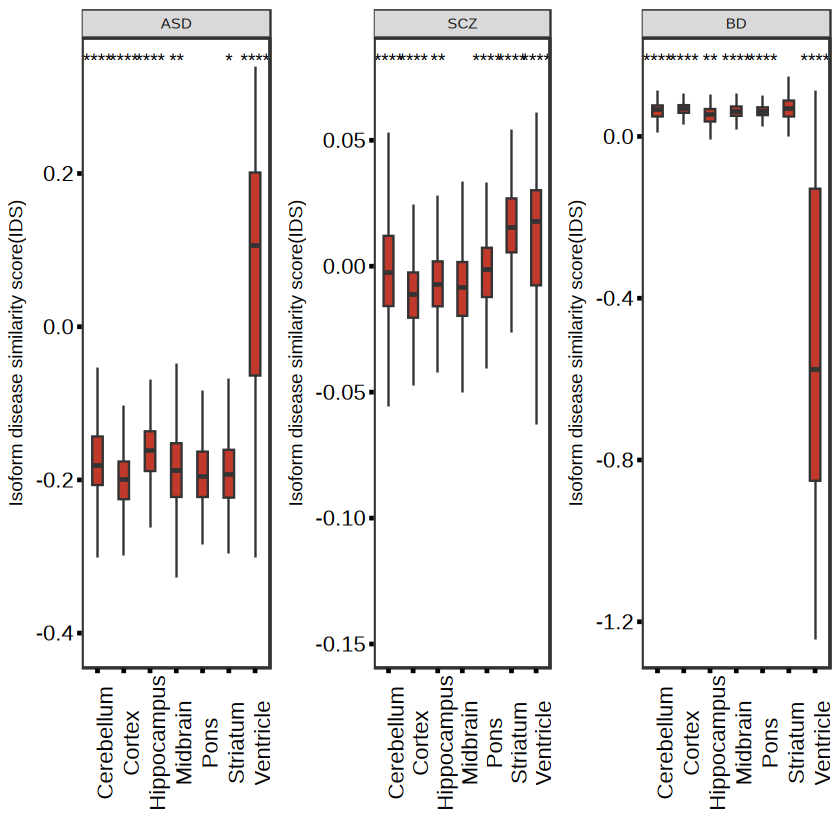

In [295]:
#spds.score.st = spds.score %>% group_by(subcortical) %>% summarise(scorem = mean(score))
spds.scz$group = "SCZ"
spds.asd$group = "ASD"
spds.bd$group = "BD"
spdst = rbind(spds.scz,spds.asd,spds.bd)

groupid = c("ASD","SCZ","BD")
ptls = list()
for(i in 1:length(groupid)){
    pti = ggplot(spdst[spdst$readnumt > 1000 & spdst$group == groupid[i],],aes(x = subcortical, y = score,fill = group))+
     # geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      facet_grid(~group) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform disease similarity score(IDS)") + xlab("")
    ptls[[i]] = pti
}

ptt = ggarrange(plotlist = ptls,nrow = 1)
ptt
ggexport(ptt,filename = "result/figure5/spatial_isoform_disease_associated_point_total_boxplot_25_12_18.pdf", width = 8,height = 4)

file saved to result/figure5/spatial_isoform_disease_associated_point_total_layer_boxplot_25_03_20.pdf



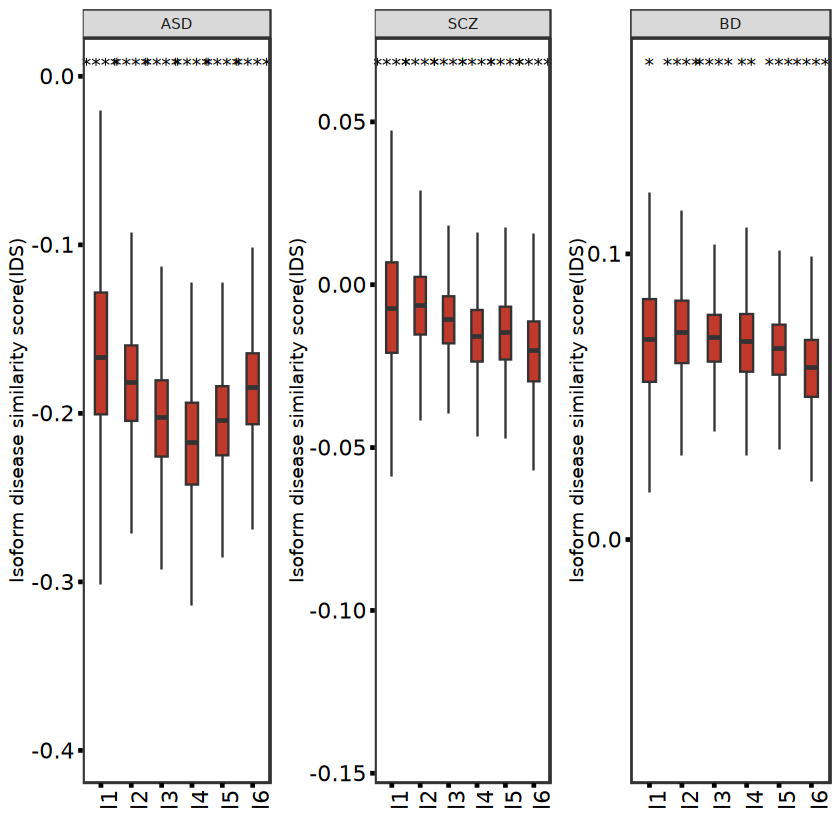

In [1081]:
#spds.score.st = spds.score %>% group_by(subcortical) %>% summarise(scorem = mean(score))
ptls = list()
for(i in 1:length(groupid)){
    pti = ggplot(spdst[spdst$readnumt > 1000 & spdst$group == groupid[i] & spdst$layer %in% paste0("l",1:6),],
                 aes(x = layer, y = score,fill = group))+
     # geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      facet_grid(~group) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform disease similarity score(IDS)") + xlab("")
    ptls[[i]] = pti
}

ptt = ggarrange(plotlist = ptls,nrow = 1)
ptt
ggexport(ptt,filename = "result/figure5/spatial_isoform_disease_associated_point_total_layer_boxplot_25_03_20.pdf", width = 8,height = 4)

file saved to result/figure5/spatial_isoform_disease_associated_point_total_lobe_boxplot_25_03_20.pdf



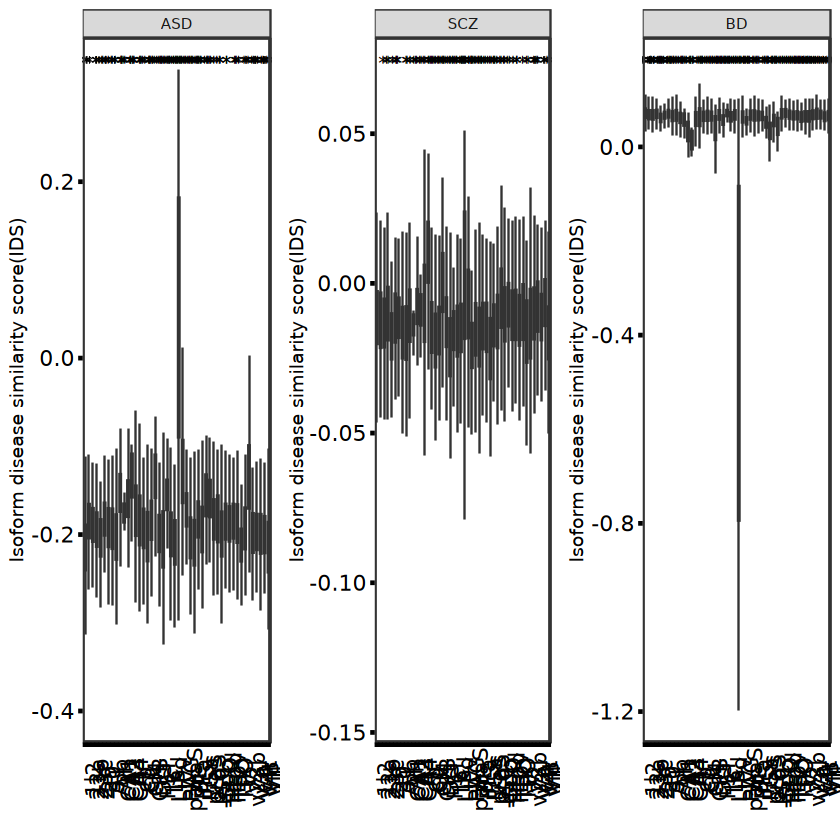

In [1084]:
#spds.score.st = spds.score %>% group_by(subcortical) %>% summarise(scorem = mean(score))
ptls = list()
for(i in 1:length(groupid)){
    pti = ggplot(spdst[spdst$readnumt > 1000 & spdst$group == groupid[i],],
                 aes(x = region, y = score,fill = group))+
     # geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      facet_grid(~group) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform disease similarity score(IDS)") + xlab("")
    ptls[[i]] = pti
}

ptt = ggarrange(plotlist = ptls,nrow = 1)
ptt
ggexport(ptt,filename = "result/figure5/spatial_isoform_disease_associated_point_total_lobe_boxplot_25_03_20.pdf", width = 8,height = 4)

##### Spatial and single cell case of MYL6 and CDC42

In [753]:
transtls = qread("data/reads_full_anotation/read_trans_stat_list_dedup_fsrawcor_24_09_04.qs")

In [ ]:
regionorder = c("29","30","23a","23b","31","23c","1|2","PE","PEa","VIP","LIPv","LIPd","PG","7op","CM","AI","CL","CPB","TPO",
               "PGa","FST","V4t","V4","TEO","TEpd","TEpv","TFO","V3v","V2","v23b")

In [840]:
TotalIsouse = function(transt){
    transt = transt[!is.na(transt$areatr),]
    transt = transt[transt$areatr != "",]
    transt$relative = transt$count/transt$genecount
    transtf = transt[transt$genecount > 10,]
    transtf = transt %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
             otherrelative = (sum(relative) - relative)/(n() - 1))
    #transtf = transtf[which(transtf$meanrelative > 0.05),]

    # transtf = transtf %>% group_by(transcript_id) %>% 
    #    filter(length(unique(areatr)) > 1)
    # transtf = transtf %>% group_by(gene_id) %>% 
    #   filter(length(unique(transcript_id))>1)

    transtf$dr = transtf$relative - transtf$otherrelative
    return(transtf)
}

isosigi1 = TotalIsouse(transtls$subclass)
isosigi1$group = "subclass"
isosigi2 = TotalIsouse(transtls$class)
isosigi2$group = "class"
isosigi3 = TotalIsouse(transtls$layer)
isosigi3$group = "layer"
isosigi4 = TotalIsouse(transtls$subcortical)
isosigi4$group = "subcortical"
isosigi5 = TotalIsouse(transtls$region)
isosigi5$group = "region"
isosigi5$areatr = paste0("region-",isosigi5$areatr)
isosigt = rbind(isosigi1,isosigi2,isosigi3,isosigi4,isosigi5)
isosigt$areatr = factor(isosigt$areatr,c(suborder,c("GLU","GABA","NonNeuron"),layerorder,
                                         subcororder,paste0("region-",regionorder)))
isosigt = merge(isosigt,hgvmac.tmapf[,c("ref_id","qry_id")],by.x = "transcript_id",by.y = "qry_id")

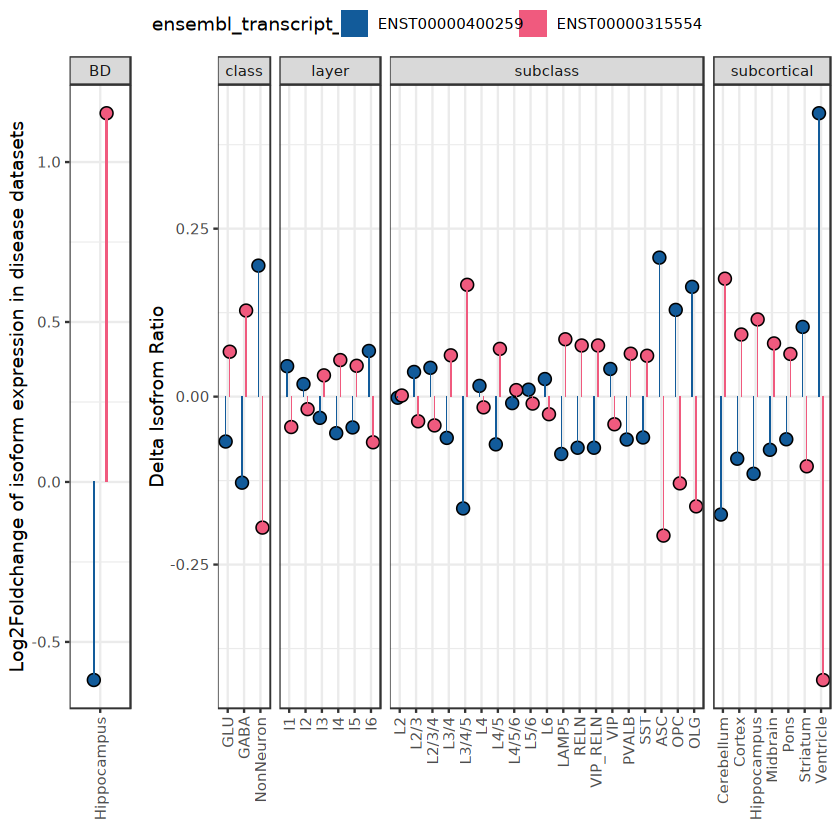

file saved to result/figure5/cross_species_case_subclass_stat_CDC42_25_03_15.pdf

file saved to result/figure5/cross_species_case_subclass_stat_MYL6_25_03_15.pdf



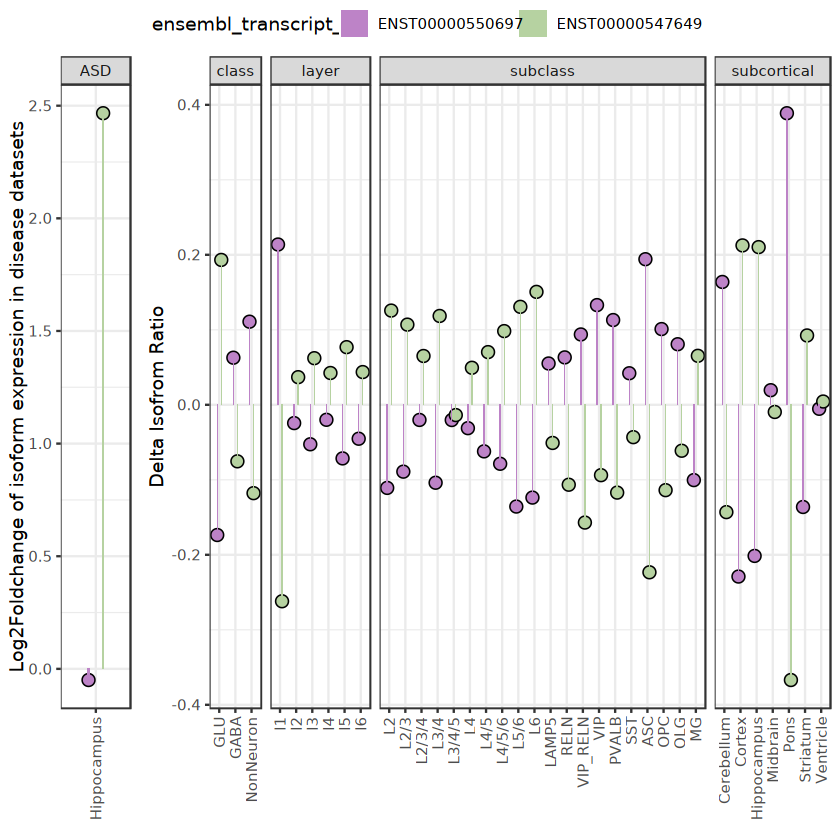

In [752]:

CrossSplicePlot = function(d2,geneid,transidref,isosigi,mycolors,diseaseid){
    refcase = d2[d2$ensembl_transcript_id %in% transidref,]
    refcase = refcase[,c("external_gene_id","ensembl_transcript_id","value")]
    #refcase = melt(refcase)
    refcase$xid = "Hippocampus"
    refcase$ensembl_transcript_id = factor(refcase$ensembl_transcript_id,levels = transidref)
    refcase$group = diseaseid
    p1.0 = ggplot(refcase,aes(x = xid,y = value,fill = ensembl_transcript_id)) + 
        geom_point(shape = 21,size = 3,position = position_dodge(0.5)) +
        geom_bar(stat = "identity",width = 0.05,color = NA,position = position_dodge(0.5)) +
        scale_fill_manual(values = mycolors) +
        facet_grid(~group,scales = "free",space = "free") +
        theme_bw() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) +
        xlab("") + 
    ylab("Log2Foldchange of isoform expression in disease datasets")
    #print(p1.0)

    isosigi = isosigi[isosigi$ref_id %in% transidref,]
    isosigi$ref_id = factor(isosigi$ref_id,levels = transidref)
    isosigi = isosigi[order(isosigi$ref_id),]
    isosigi$transcript_id = factor(isosigi$transcript_id,levels = unique(isosigi$transcript_id))
    
    p1.1 = ggplot(isosigi,aes(x = areatr,fill = transcript_id, y = dr)) + 
        geom_point(shape = 21,size = 3,position = position_dodge(0.5)) +
        geom_bar(stat = "identity",width = 0.05,color = NA,position = position_dodge(0.5)) +
        facet_grid(~group,scales = "free",space = "free") +
        scale_fill_manual(values = mycolors) +
        theme_bw() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) + xlab("") + ylab("Delta Isofrom Ratio")
    p1.t = ggarrange(p1.0,p1.1,widths = c(0.3,1.5),common.legend = T)
    return(p1.t)
    
}
d2$value = d2$DTU.BD.Value
geneid = "CDC42"
mycolors = c("#125B9A","#F05A7E")
transidref = c("ENST00000400259","ENST00000315554")
pt1 = CrossSplicePlot(d2,geneid,transidref,isosigt,mycolors,"BD")
pt1

d2$value = d2$DTU.ASD.Value
geneid = "MYL6"
mycolors = c("#BD83C7","#B6D2A1")
transidref = c("ENST00000550697","ENST00000547649")
pt2 = CrossSplicePlot(d2,geneid,transidref,isosigt,mycolors,"ASD")
pt2

ggexport(pt1,filename = "result/figure5/cross_species_case_subclass_stat_CDC42_25_03_15.pdf",width = 7,height = 3)
ggexport(pt2,filename = "result/figure5/cross_species_case_subclass_stat_MYL6_25_03_15.pdf",width = 7,height = 3)

In [806]:
#isosigls$subclass[isosigls$subclass$gene_id == "CLTB",]
transidref = c("ENST00000397265","ENST00000305108")
unique(isosigt[isosigt$ref_id %in% transidref,c("transcript_id","ref_id")])

,transcript_id,ref_id
,<chr>,<chr>
463760,XM_005569730.2,ENST00000305108
463826,XM_005569731.2,ENST00000397265


file saved to result/figure5/cross_species_case_subclass_stat_CLTA_ASD_25_03_15.pdf



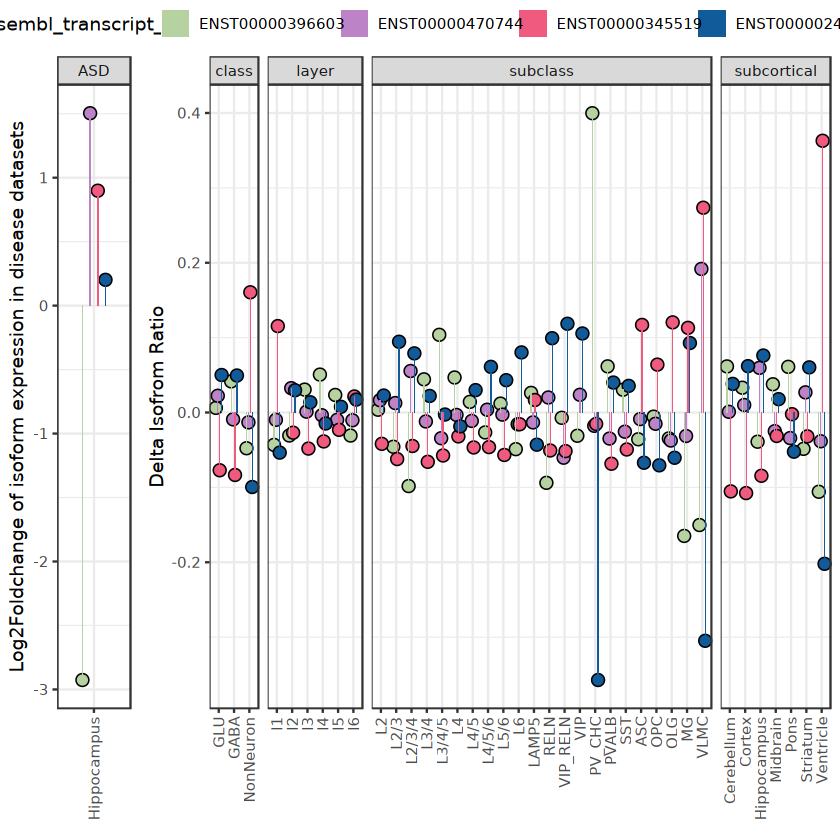

file saved to result/figure5/cross_species_case_subclass_stat_CLTA_BD_25_03_15.pdf



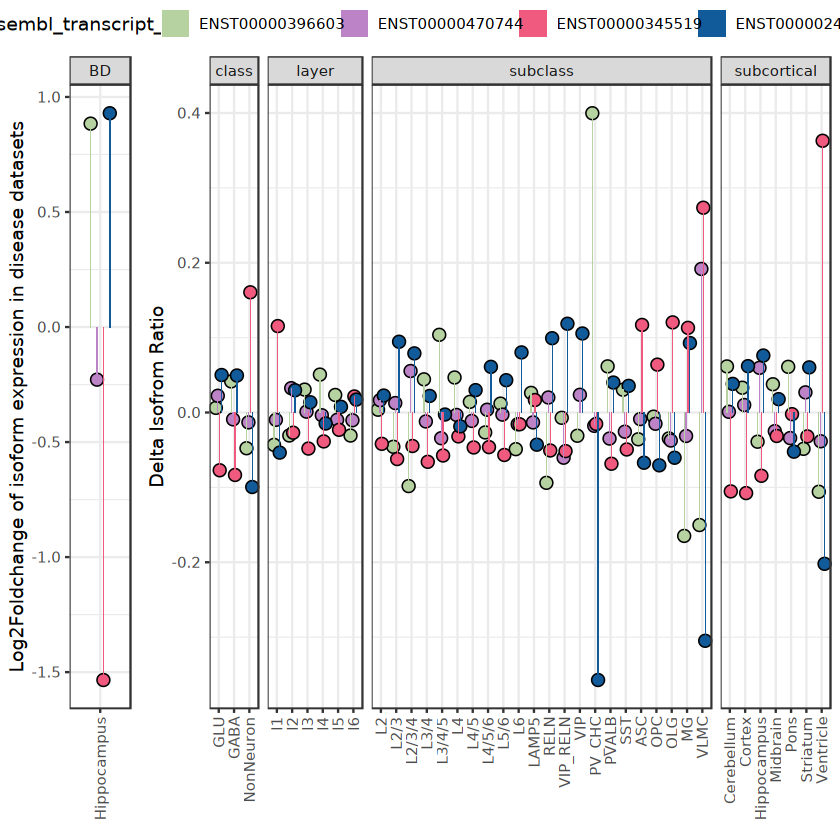

file saved to result/figure5/cross_species_case_subclass_stat_CLTB_ASD_25_03_15.pdf



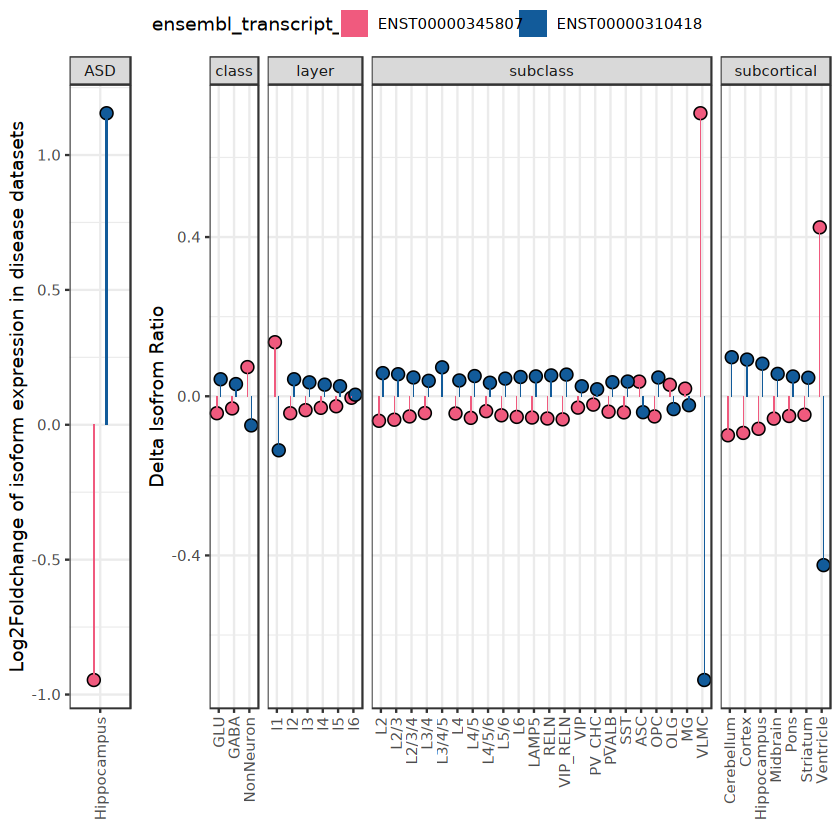

file saved to result/figure5/cross_species_case_subclass_stat_NINJ2_SCZ_25_03_15.pdf



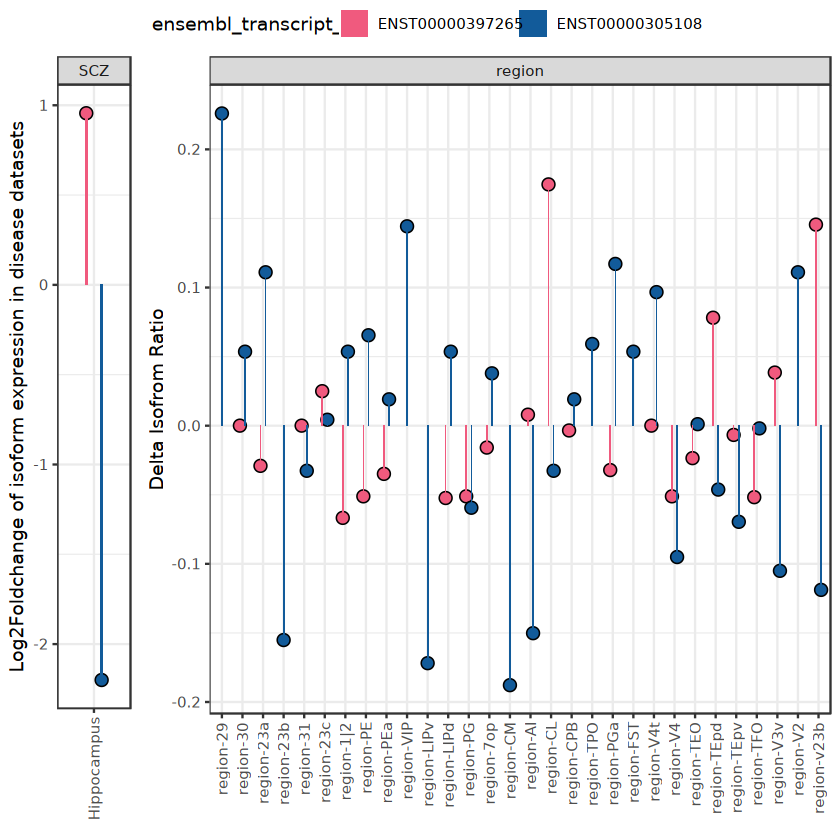

In [863]:
d2$value = d2$DTU.ASD.Value
geneid = "CLTA"
mycolors = c("#B6D2A1","#BD83C7","#F05A7E","#125B9A")
transidref = c("ENST00000396603","ENST00000470744","ENST00000345519","ENST00000242285")
pt1 = CrossSplicePlot(d2,geneid,transidref,isosigt[isosigt$group != "region",],mycolors,"ASD")
pt1
ggexport(pt1,filename = "result/figure5/cross_species_case_subclass_stat_CLTA_ASD_25_03_15.pdf",width = 12,height = 4)

d2$value = d2$DTU.BD.Value
transidref = c("ENST00000396603","ENST00000470744","ENST00000345519","ENST00000242285")
pt1 = CrossSplicePlot(d2,geneid,transidref,isosigt[isosigt$group != "region",],mycolors,"BD")
pt1
ggexport(pt1,filename = "result/figure5/cross_species_case_subclass_stat_CLTA_BD_25_03_15.pdf",width = 12,height = 4)

geneid = "CLTB"
mycolors = c("#F05A7E","#125B9A")
transidref = c("ENST00000345807","ENST00000310418")
pt1 = CrossSplicePlot(d2,geneid,transidref,isosigt[isosigt$group != "region",],mycolors,"ASD")
pt1
ggexport(pt1,filename = "result/figure5/cross_species_case_subclass_stat_CLTB_ASD_25_03_15.pdf",width = 12,height = 4)

geneid = "NINJ2"
mycolors = c("#F05A7E","#125B9A")
transidref = c("ENST00000397265","ENST00000305108")
d2$value = d2$DTU.SCZ.Value
pt1 = CrossSplicePlot(d2,geneid,transidref,isosigt[isosigt$group == "region",],mycolors,"SCZ")
pt1
ggexport(pt1,filename = "result/figure5/cross_species_case_subclass_stat_NINJ2_SCZ_25_03_15.pdf",width = 12,height = 4)


# d2$value = d2$DTU.ASD.Value
# geneid = "RWDD1"
# mycolors = c("#F05A7E","#125B9A")
# transidref = c("ENST00000487832","ENST00000392526")
# pt1 = CrossSplicePlot(d2,geneid,transidref,isosigt,mycolors,"BD")
# pt1


file saved to result/figure5/cross_species_case_region_stat_SNRPN_SCZ_25_03_15.pdf



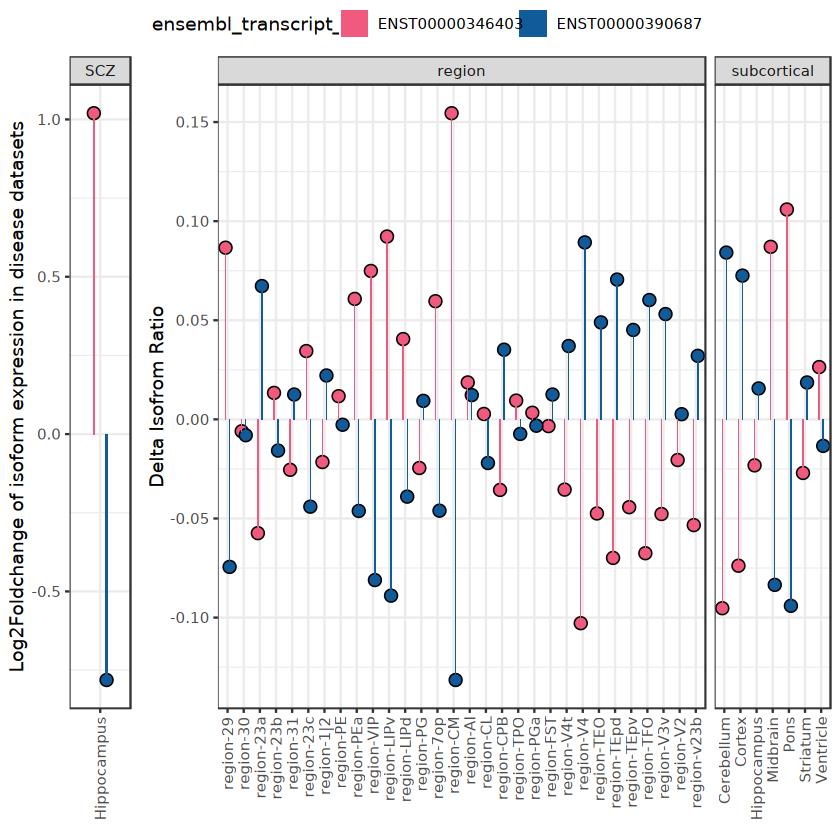

file saved to result/figure5/cross_species_case_subclass_stat_SNRPN_SCZ_25_03_15.pdf



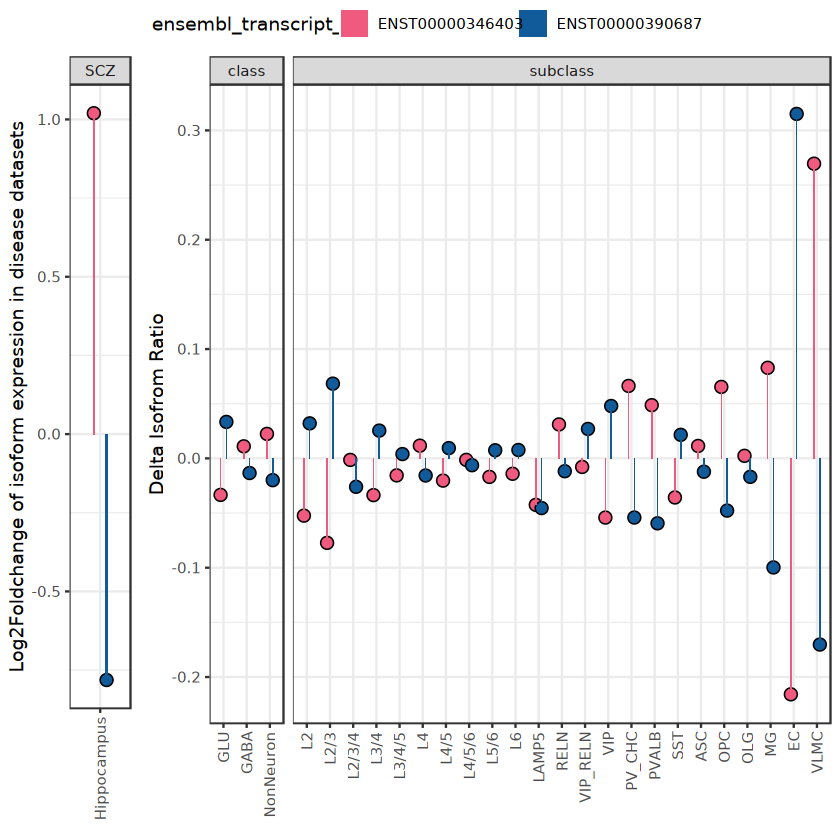

In [865]:
geneid = "SNRPN"
mycolors = c("#F05A7E","#125B9A")
transidref = c("ENST00000346403","ENST00000390687")
d2$value = d2$DTU.SCZ.Value
pt1 = CrossSplicePlot(d2,geneid,transidref,isosigt[isosigt$group %in% c("region","subcortical"),],mycolors,"SCZ")
pt1
ggexport(pt1,filename = "result/figure5/cross_species_case_region_stat_SNRPN_SCZ_25_03_15.pdf",width = 12,height = 4)

geneid = "SNRPN"
mycolors = c("#F05A7E","#125B9A")
transidref = c("ENST00000346403","ENST00000390687")
d2$value = d2$DTU.SCZ.Value
pt1 = CrossSplicePlot(d2,geneid,transidref,isosigt[isosigt$group %in% c("subclass","class"),],mycolors,"SCZ")
pt1
ggexport(pt1,filename = "result/figure5/cross_species_case_subclass_stat_SNRPN_SCZ_25_03_15.pdf",width = 10,height = 4)


In [846]:
#unique(isosigcmpt[isosigcmpt$gene_id %in% "RSRP1",c("transcript_id","ref_id")])
hgvmac.tmapf[hgvmac.tmapf$qry_gene_id == "SNRPN",]

,ref_gene_id,ref_id,class_code,qry_gene_id,qry_id,num_exons,FPKM,TPM,cov,len,major_iso_id,ref_match_len
,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
32782,ENSG00000128739.16,ENST00000346403,=,SNRPN,XM_005558943.2,10,0,0,0,1304,XM_015452467.1,1304
32784,ENSG00000128739.16,ENST00000390687,=,SNRPN,NM_001287684.1,10,0,0,0,1278,XM_015452467.1,1527


file saved to result/figure5/SNRPN-spatial_reads_point_25_03_18.pdf



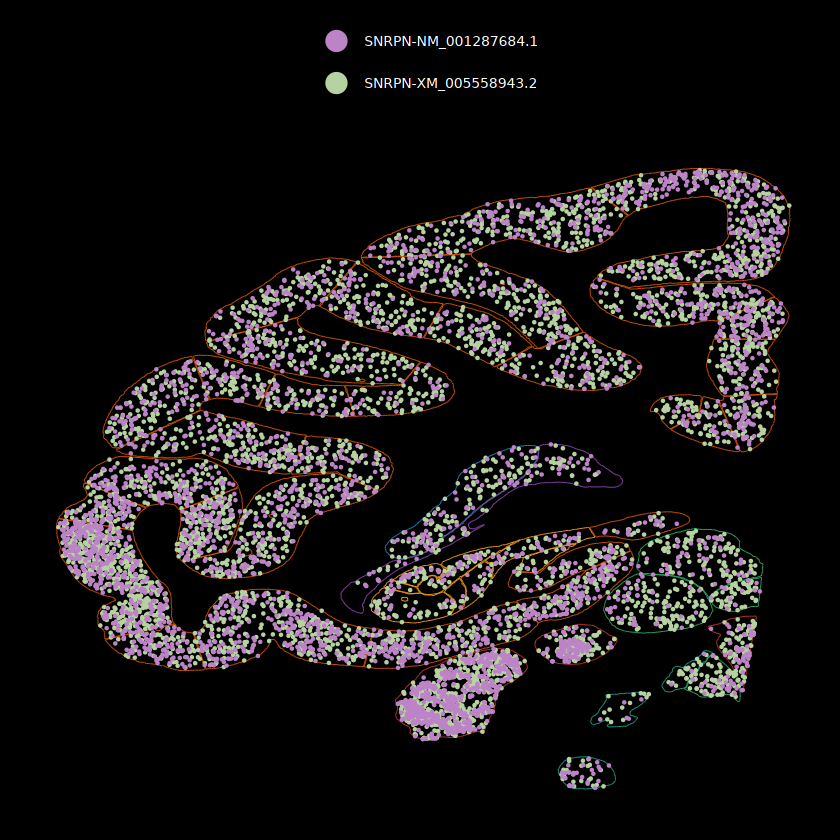

In [852]:
mycolor =  c('#BD83C7','#B6D2A1')
geneex = "SNRPN"
hubtrans = c("SNRPN-NM_001287684.1","SNRPN-XM_005558943.2")
pci = SpCasePlot(fsraw.cor,geneex,hubtrans,ptsize = 1,mycolor,0.1)
pci
ggexport(pci,filename = "result/figure5/SNRPN-spatial_reads_point_25_03_18.pdf", width = 4,height = 6)

Using external_gene_id, ensembl_transcript_id as id variables



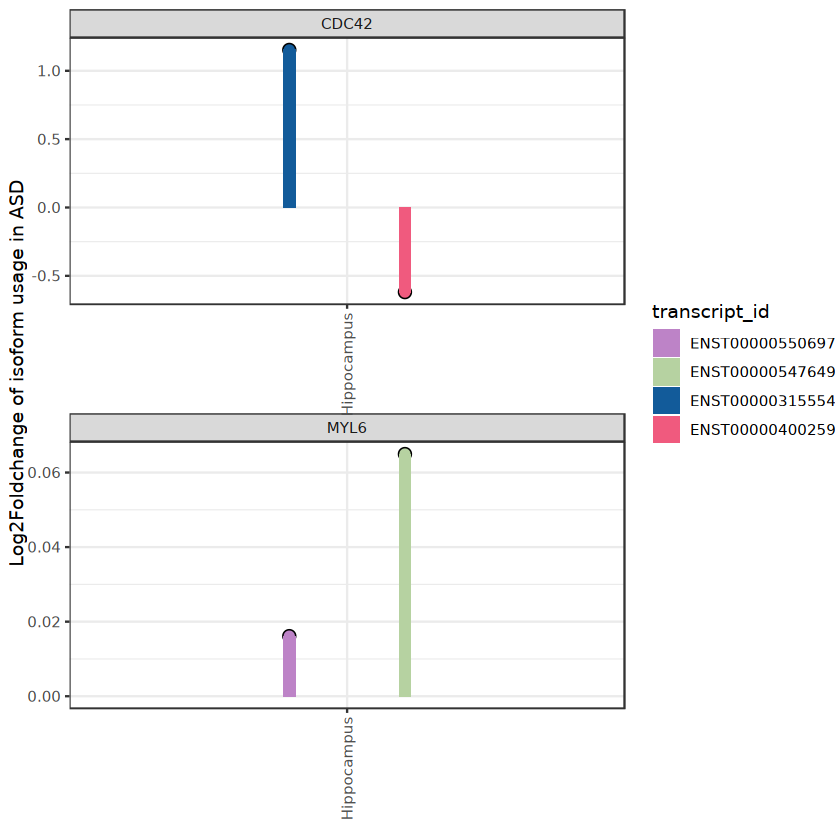

In [620]:
refcase = d2[d2$ensembl_transcript_id %in% c("ENST00000547649","ENST00000550697","ENST00000400259","ENST00000315554"),]
#MYL6-WeiLab-2 CDC42-WeiLab-1
mycolors = c("#B6D2A1","#BD83C7","#F05A7E","#125B9A")
names(mycolors) = c("ENST00000547649","ENST00000550697","ENST00000400259","ENST00000315554")

refcase = refcase[,c("external_gene_id","ensembl_transcript_id","DTU.BD.Value")]
refcase = melt(refcase)
colnames(refcase) = c("gene_id","transcript_id","sample","value")
refcase$xid = "Hippocampus"
refcase$transcript_id = factor(refcase$transcript_id,levels = c("ENST00000550697","ENST00000547649",
                                                                "ENST00000315554","ENST00000400259"))
p1.0 = ggplot(refcase,aes(x = xid,y = value,fill = transcript_id)) + 
        geom_point(shape = 21,size = 3,position = position_dodge(0.5)) +
        geom_bar(stat = "identity",width = 0.05,color = NA,position = position_dodge(0.5)) +
        scale_fill_manual(values = mycolors) +
        facet_wrap(~gene_id,ncol = 1,scales = "free") +
        theme_bw() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) +
        xlab("") + 
    ylab("Log2Foldchange of isoform usage in ASD")
p1.0
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$transcript_id %in% c("MYL6-WeiLab-1","MYL6-WeiLab-2", "CDC42-WeiLab-1", "NM_001283401.1"),]
#isosigi


file saved to result/figure5/cross_species_case_subclass_stat_25_03_15.pdf



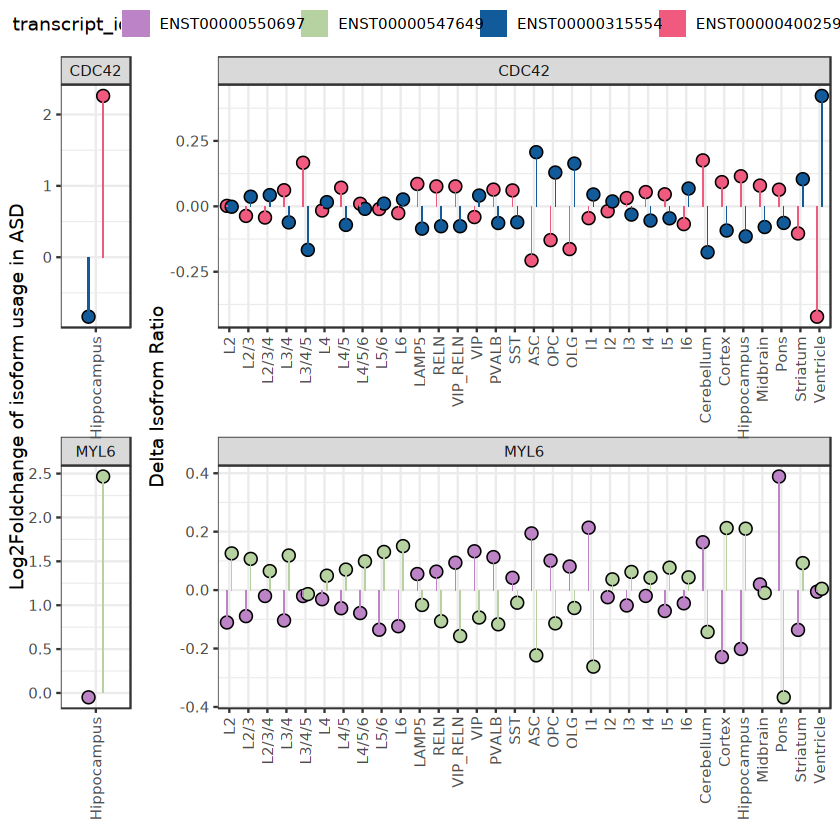

In [283]:
names(mycolors) = c("MYL6-WeiLab-2","MYL6-WeiLab-1", "CDC42-WeiLab-1", "NM_001283401.1")
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$transcript_id %in% c("MYL6-WeiLab-1","MYL6-WeiLab-2", "CDC42-WeiLab-1", "NM_001283401.1"),]
isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(transcript_id)) == 4)
isosigi$group = "subclass"

isosigi2 = isosigls$layer
isosigi2 = isosigi2[isosigi2$transcript_id %in% c("MYL6-WeiLab-1","MYL6-WeiLab-2", "CDC42-WeiLab-1", "NM_001283401.1"),]
isosigi2$group = "layer"

isosigi3 = isosigls$subcortical
isosigi3 = isosigi3[isosigi3$transcript_id %in% c("MYL6-WeiLab-1","MYL6-WeiLab-2", "CDC42-WeiLab-1", "NM_001283401.1"),]
isosigi3$group = "subcortical"

isosigi = rbind(isosigi,isosigi2,isosigi3)
isosigi$areatr = factor(isosigi$areatr,c(suborder,layerorder,subcororder))
p1.1 = ggplot(isosigi,aes(x = areatr,fill = transcript_id, y = dr)) + 
        geom_point(shape = 21,size = 3,position = position_dodge(0.5)) +
        geom_bar(stat = "identity",width = 0.05,color = NA,position = position_dodge(0.5)) +
        facet_wrap(~gene_id,ncol = 1,scales = "free") +
        scale_fill_manual(values = mycolors) +
        theme_bw() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) + xlab("") + ylab("Delta Isofrom Ratio")
p1.t = ggarrange(p1.0,p1.1,widths = c(0.3,1.5),common.legend = T)
p1.t
ggexport(p1.t,filename = "result/figure5/cross_species_case_subclass_stat_25_03_15.pdf",width = 7,height = 5.5)

In [290]:
gtf.ms = rtracklayer::import("ref/mouse.gencode.vM36.annotation.gtf.gz")
hubtrans = c("ENST00000550697.6","ENST00000547649.5")
#"gencode.v19.annotation.gtf.gz"
gtf.hp = rtracklayer::import("ref/human.gencode.v47.annotation.gtf.gz")
hubtrans = c("ENST00000550697.6","ENST00000547649.5")
gtf.hp[gtf.hp$gene_name == "MYL6" & gtf.hp$transcript_id %in% hubtrans,]
unique(gtf.ms[gtf.ms$gene_name == "Myl6",]$transcript_name)

GRanges object with 36 ranges and 22 metadata columns:
       seqnames            ranges strand |   source        type     score
          <Rle>         <IRanges>  <Rle> | <factor>    <factor> <numeric>
   [1]    chr12 56158359-56161579      + |   HAVANA transcript         NA
   [2]    chr12 56158359-56158404      + |   HAVANA exon               NA
   [3]    chr12 56158402-56158404      + |   HAVANA CDS                NA
   [4]    chr12 56158402-56158404      + |   HAVANA start_codon        NA
   [5]    chr12 56158684-56158711      + |   HAVANA exon               NA
   ...      ...               ...    ... .      ...         ...       ...
  [32]    chr12 56161387-56161574      + |   HAVANA  exon              NA
  [33]    chr12 56161387-56161412      + |   HAVANA  CDS               NA
  [34]    chr12 56161413-56161415      + |   HAVANA  stop_codon        NA
  [35]    chr12 56158362-56158401      + |   HAVANA  UTR               NA
  [36]    chr12 56161413-56161574      + |   HAVANA  UTR 

[1] NA         "Myl6-201" "Myl6-213" "Myl6-212" "Myl6-202" "Myl6-206"
 [7] "Myl6-209" "Myl6-211" "Myl6-205" "Myl6-203" "Myl6-214" "Myl6-208"
[13] "Myl6-215" "Myl6-207" "Myl6-210" "Myl6-204"

In [292]:
library(ggbio)
library(ggtranscript)

#Txrefplot(gtfdf)
Txrefplot = function(gtfdf,groupid,mycolor = NULL){
    tartrans = gtfdf[gtfdf$type == "exon",]
    tartrans = tartrans[order(tartrans$transcript_name),]
    tartrans$orid = as.numeric(tartrans$transcript_name)
#    tartrans$group = NA
    tartranstx = tartrans %>% group_by(transcript_name,orid) %>% 
      summarise(start = min(start),end = max(end))
    #tartranstx$group = NA
    mylim = c(min(tartranstx$start)-1000,max(tartranstx$end)+1000)
    library(ggh4x)
    if(is.null(mycolor)){
        no_of_colors = length(unique(tartrans$transcript_name)) 
        colorful_palette = distinctColorPalette(no_of_colors) 
        names(colorful_palette) = levels(tartrans$transcript_name)
    }else{
        colorful_palette = mycolor
        names(colorful_palette) = levels(tartrans$transcript_name)
    }
    
    pc = ggplot() +
      geom_range(data = tartrans,
                 aes(xstart = start,xend = end,
                     y = orid,
                     fill = transcript_name,color = transcript_name),
                 size = 0.2) +
      geom_intron(data = to_intron(tartrans,
                                   "transcript_name"),
                  aes(xstart = start,xend = end,y = orid,strand = strand,color = transcript_name),
                  size = 0.2,
                  arrow.min.intron.length = 200,
                  arrow = arrow(length=unit(0.3,"cm"))) +
      geom_text(data = tartranstx,
                aes(x = (start + end) / 2,y = orid+0.5,
                    label = transcript_name),
                size = 5, vjust = -0.1, color = "black") +
     # facet_grid2(group~.,scales = "free",
     #             strip = strip_themed(
     #               text_y = facetcol
    #            )) +
      #facet_wrap(group~.,scales = "free",ncol = 1,strip.position = "left") +
      scale_x_continuous(limits = mylim)+
      scale_color_manual(values = colorful_palette) +
      scale_fill_manual(values = colorful_palette) +
      # scale_fill_discreterainbow() +
      # scale_color_discreterainbow() +
      theme_bw() + 
      ggtitle(groupid) +
      theme(legend.position = "none",panel.grid = element_blank(),
            axis.text.y = element_blank(),axis.ticks.y = element_blank(),
            panel.spacing = unit(0,'lines'),
            strip.background = element_rect(fill = NA,color = NA),
            strip.placement = "outside",
            plot.title = element_text(hjust = 0.5)) + xlab("") + ylab("")
    pc
    return(pc)
}

`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.
Warning message:
"Using the `size` aesthetic in this geom was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` in the `default_aes` field and elsewhere instead."
file saved to result/figure5/MYL6-cross_species_sliced_compare_25_03_18.pdf



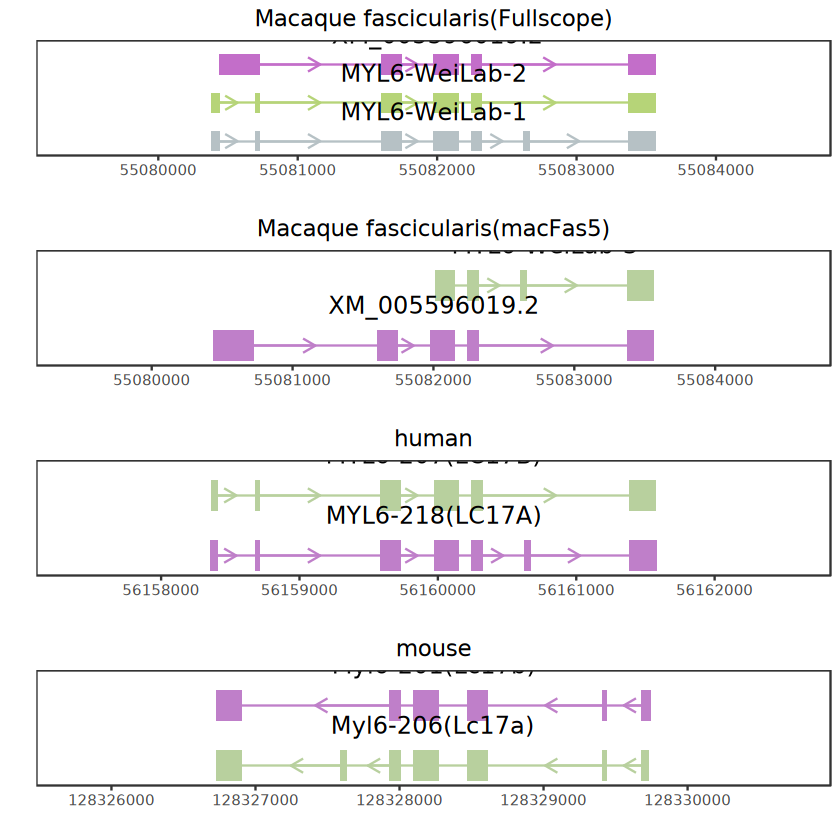

R packages available

Packages in library '/cluster/home/liuhengxin/software/miniconda3_2/envs/r-kernel/lib/R/library':

abind                   Combine Multidimensional Arrays
ade4                    Analysis of Ecological Data: Exploratory and
                        Euclidean Methods in Environmental Sciences
admixtools              Inferring demographic history from genetic data
amap                    Another Multidimensional Analysis Package
annotate                Annotation for microarrays
AnnotationDbi           Manipulation of SQLite-based annotations in
                        Bioconductor
AnnotationFilter        Facilities for Filtering Bioconductor
                        Annotation Resources
AnnotationHub           Client to access AnnotationHub resources
anytime                 Anything to 'POSIXct' or 'Date' Converter
ape                     Analyses of Phylogenetics and Evolution
aplot                   Decorate a 'ggplot' with Associated Information
arrow             

In [296]:
library()
geneex = "MYL6"
hubtrans = c("MYL6-WeiLab-1","MYL6-WeiLab-2","XM_005596019.2")
gtfdf = as.data.frame(gtf[which(gtf$gene_id == geneex & gtf$transcript_name %in% hubtrans),])
gtfdf$transcript_name = factor(gtfdf$transcript_name,levels = c("MYL6-WeiLab-1","MYL6-WeiLab-2","XM_005596019.2"))
groupid = "Macaque fascicularis(Fullscope)"
pc1 = Txrefplot(gtfdf,groupid)

geneex = "MYL6"
hubtrans = c("XM_005596019.2","MYL6-WeiLab-3")
gtfdf = as.data.frame(gtf[which(gtf$gene_id == geneex & gtf$transcript_name %in% hubtrans),])
gtfdf$transcript_name = factor(gtfdf$transcript_name,levels = c("XM_005596019.2","MYL6-WeiLab-3"))
groupid = "Macaque fascicularis(macFas5)"
pc2 = Txrefplot(gtfdf,groupid)

#human
hubtrans = c("ENST00000550697.6","ENST00000547649.5")
gtfdf.hp = as.data.frame(gtf.hp[gtf.hp$gene_name == "MYL6" & gtf.hp$transcript_id %in% hubtrans,])
gtfdf.hp[gtfdf.hp$transcript_name == "MYL6-218",]$transcript_name = paste0(gtfdf.hp[gtfdf.hp$transcript_name == "MYL6-218",]$transcript_name,
                                                                          ("(LC17A)"))
gtfdf.hp[gtfdf.hp$transcript_name == "MYL6-207",]$transcript_name = paste0(gtfdf.hp[gtfdf.hp$transcript_name == "MYL6-207",]$transcript_name,
                                                                          ("(LC17B)"))
#https://www.ncbi.nlm.nih.gov/nuccore/NM_079423.4
#https://www.ncbi.nlm.nih.gov/nuccore/NM_021019.5
gtfdf.hp$transcript_name = factor(gtfdf.hp$transcript_name,levels = c("MYL6-218(LC17A)","MYL6-207(LC17B)")) 
groupid = "human"
pc3 = Txrefplot(gtfdf.hp,groupid)

#mouse
hubtrans = c("Myl6-206","Myl6-201")
gtfdf.ms = as.data.frame(gtf.ms[gtf.ms$gene_name == "Myl6" & gtf.ms$transcript_name %in% hubtrans,])
gtfdf.ms[gtfdf.ms$transcript_name == "Myl6-206",]$transcript_name = paste0(gtfdf.ms[gtfdf.ms$transcript_name == "Myl6-206",]$transcript_name,
                                                                          ("(Lc17a)"))
gtfdf.ms[gtfdf.ms$transcript_name == "Myl6-201",]$transcript_name = paste0(gtfdf.ms[gtfdf.ms$transcript_name == "Myl6-201",]$transcript_name,
                                                                          ("(Lc17b)"))
hubtrans = c("Myl6-206(Lc17a)","Myl6-201(Lc17b)")
gtfdf.ms = gtfdf.ms[order(gtfdf.ms$transcript_name),]
# gtfdf.ms$start = -gtfdf.ms$start
# gtfdf.ms$end = -gtfdf.ms$end
# gtfdf.ms$strand = "+"
gtfdf.ms$transcript_name = factor(gtfdf.ms$transcript_name,levels = hubtrans) 
groupid = "mouse"
pc4 = Txrefplot(gtfdf.ms,groupid)
pct = ggarrange(pc1,pc2,pc3,pc4,ncol = 1)
pct
ggexport(pct,filename = "result/figure5/MYL6-cross_species_sliced_compare_25_03_18.pdf",width = 8,height = 6)

`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.


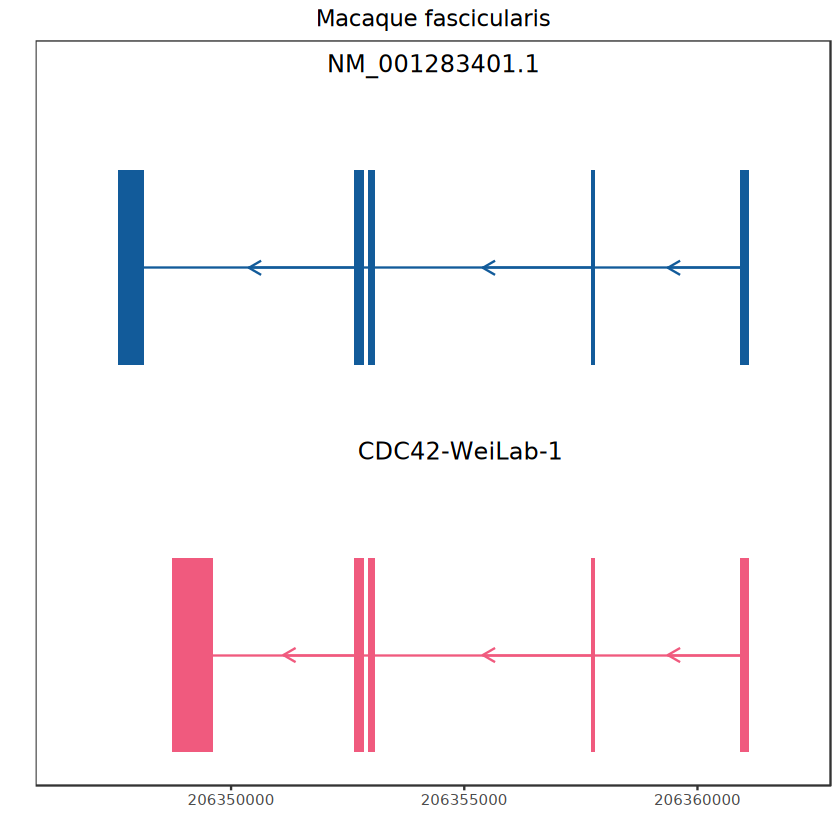

`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.


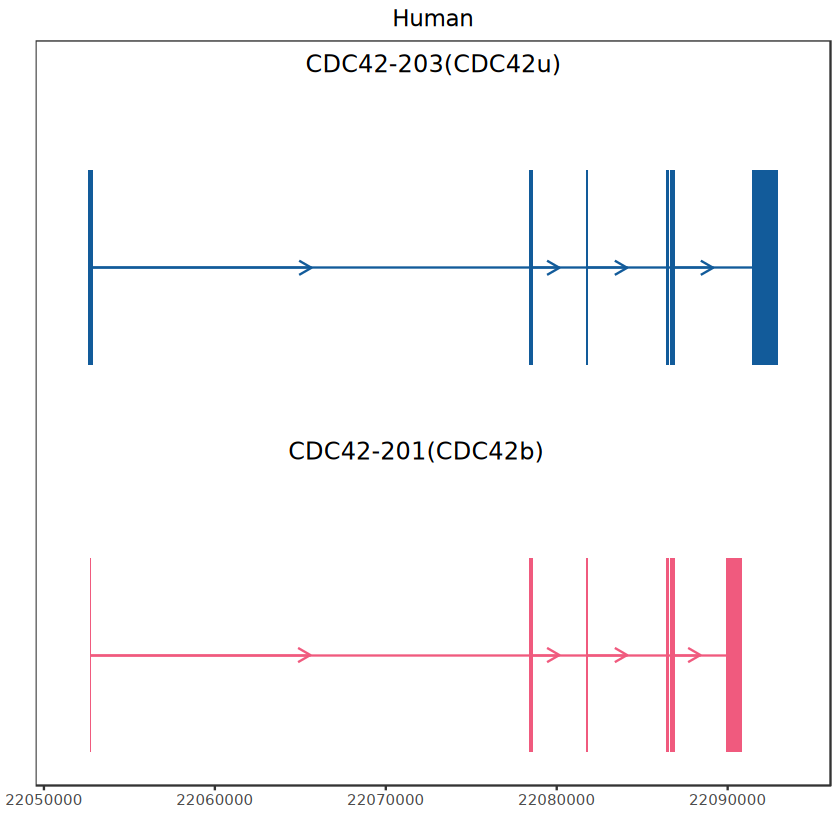

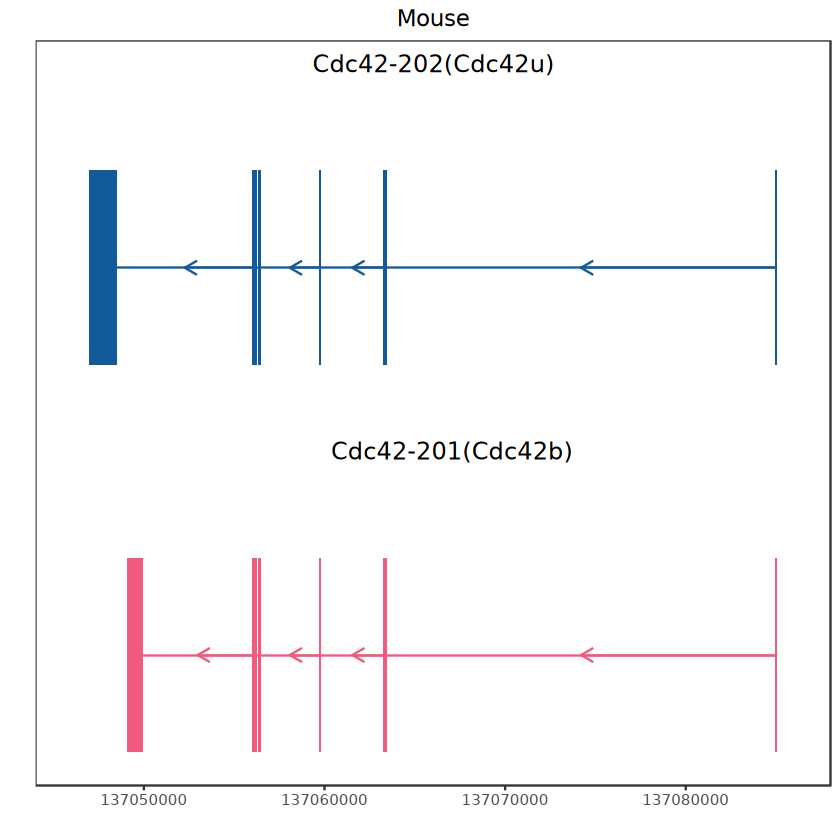

file saved to result/figure5/CDC42-cross_species_sliced_compare_24_12_24.pdf



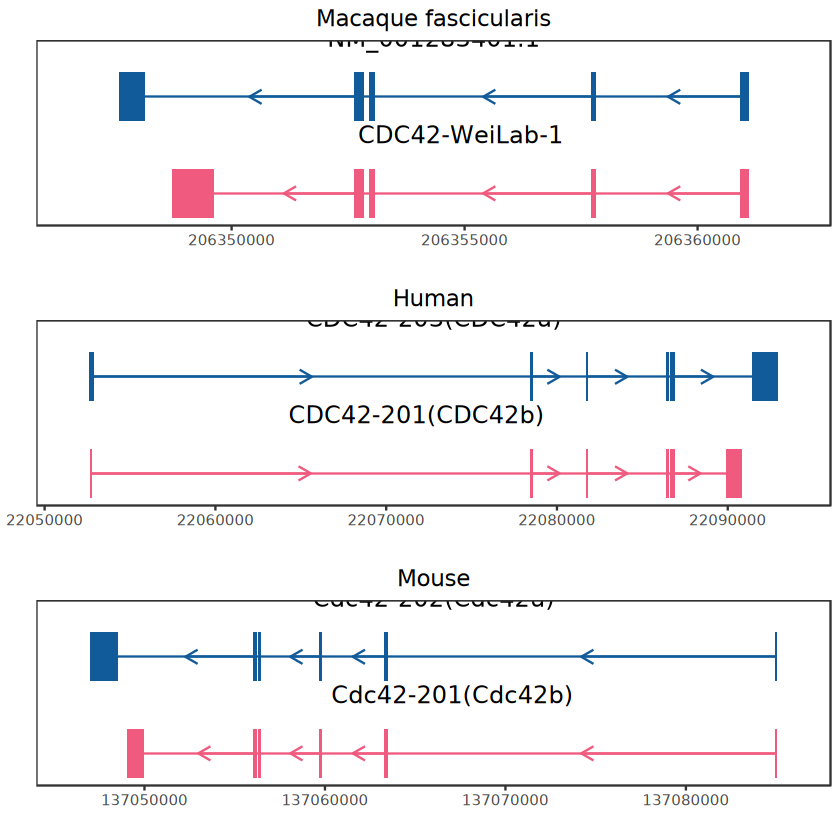

In [146]:
#"ENST00000400259","ENST00000315554"
#"CDC42b" "CDC42u"
geneex = "CDC42"
mycolor = c("#F05A7E","#125B9A")
#hubtrans = c("MYL6-WeiLab-1","MYL6-WeiLab-2")
gtfdf = as.data.frame(gtf[which(gtf$gene_id == geneex),])
gtfdf$transcript_name = factor(gtfdf$transcript_name,levels = c("CDC42-WeiLab-1","NM_001283401.1"))
groupid = "Macaque fascicularis"
pc1 = Txrefplot(gtfdf,groupid,mycolor)
pc1

hubtrans = c("ENST00000400259.5","ENST00000315554.15")
#gtf.hp[gtf.hp$gene_name == "CDC42" & gtf.hp$transcript_id %in%  hubtrans & gtf.hp$type == "transcript",]
gtfdf.hp.hub = as.data.frame(gtf.hp[gtf.hp$gene_name == "CDC42" & gtf.hp$transcript_id %in% hubtrans,])
gtfdf.hp.hub[gtfdf.hp.hub$transcript_name == "CDC42-203",]$transcript_name = paste0(gtfdf.hp.hub[gtfdf.hp.hub$transcript_name == "CDC42-203",]$transcript_name,
                                                                          "(CDC42u)")
gtfdf.hp.hub[gtfdf.hp.hub$transcript_name == "CDC42-201",]$transcript_name = paste0(gtfdf.hp.hub[gtfdf.hp.hub$transcript_name == "CDC42-201",]$transcript_name,
                                                                          "(CDC42b)")
gtfdf.hp.hub$transcript_name = factor(gtfdf.hp.hub$transcript_name,levels = c("CDC42-201(CDC42b)","CDC42-203(CDC42u)")) 
#gtfdf.hp.hub$transcript_name = factor(gtfdf.hp.hub$transcript_name,levels = unique(gtfdf.hp.hub$transcript_name)) 
groupid = "Human"
pc2 = Txrefplot(gtfdf.hp.hub,groupid,mycolor)
pc2
#hubtrans = c("ENST00000400259.5","ENST00000315554.15")
#gtf.hp[gtf.hp$gene_name == "CDC42" & gtf.hp$transcript_id %in%  hubtrans & gtf.hp$type == "transcript",]
gtfdf.ms.hub = as.data.frame(gtf.ms[gtf.ms$gene_name == "Cdc42",])
#unique(gtfdf.ms.hub$transcript_name)
gtfdf.ms.hub = gtfdf.ms.hub[!is.na(gtfdf.ms.hub$transcript_name),]
#unique(gtfdf.ms.hub$transcript_name)
gtfdf.ms.hub[gtfdf.ms.hub$transcript_name == "Cdc42-202",]$transcript_name = paste0(gtfdf.ms.hub[gtfdf.ms.hub$transcript_name == "Cdc42-202",]$transcript_name,
                                                                          "(Cdc42u)")
gtfdf.ms.hub[gtfdf.ms.hub$transcript_name == "Cdc42-201",]$transcript_name = paste0(gtfdf.ms.hub[gtfdf.ms.hub$transcript_name == "Cdc42-201",]$transcript_name,
                                                                          "(Cdc42b)")
gtfdf.ms.hub$transcript_name = factor(gtfdf.ms.hub$transcript_name,levels = c("Cdc42-201(Cdc42b)","Cdc42-202(Cdc42u)")) 
# gtfdf.ms.hub$transcript_name = factor(gtfdf.ms.hub$transcript_name,levels = unique(gtfdf.ms.hub$transcript_name)) 
groupid = "Mouse"
pc3 = Txrefplot(gtfdf.ms.hub,groupid,mycolor)
pc3
pct = ggarrange(pc1,pc2,pc3,ncol = 1)
pct
ggexport(pct,filename = "result/figure5/CDC42-cross_species_sliced_compare_24_12_24.pdf",width = 6,height = 6)

In [1089]:
#unique(isosigcmpt[isosigcmpt$gene_id %in% "RSRP1",c("transcript_id","ref_id")])
hgvmac.tmapf[hgvmac.tmapf$qry_gene_id == "SNRPN",]

,ref_gene_id,ref_id,class_code,qry_gene_id,qry_id,num_exons,FPKM,TPM,cov,len,major_iso_id,ref_match_len
,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
32782,ENSG00000128739.16,ENST00000346403,=,SNRPN,XM_005558943.2,10,0,0,0,1304,XM_015452467.1,1304
32784,ENSG00000128739.16,ENST00000390687,=,SNRPN,NM_001287684.1,10,0,0,0,1278,XM_015452467.1,1527


In [1100]:
gtfdf

seqnames,start,end,width,strand,source,type,score,phase,gene_id,transcript_id,transcript_name,exon_number
<fct>,<int>,<int>,<int>,<fct>,<fct>,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<chr>
NC_022278.1,2811954,2812094,141,+,Bambu,exon,NA,NA,SNRPN,XM_015452467.1,NA,2
NC_022278.1,2815604,2815759,156,+,Bambu,exon,NA,NA,SNRPN,XM_015452467.1,NA,3
NC_022278.1,2837895,2960384,122490,+,Bambu,transcript,NA,NA,SNRPN,XM_015452466.1,NA,NA
NC_022278.1,2837895,2838066,172,+,Bambu,exon,NA,NA,SNRPN,XM_015452466.1,NA,1
NC_022278.1,2871791,2871857,67,+,Bambu,exon,NA,NA,SNRPN,XM_015452467.1,NA,4
NC_022278.1,2871791,2871857,67,+,Bambu,exon,NA,NA,SNRPN,XM_015452466.1,NA,2
NC_022278.1,2899442,2899561,120,+,Bambu,exon,NA,NA,SNRPN,XM_015452467.1,NA,5
NC_022278.1,2899442,2899561,120,+,Bambu,exon,NA,NA,SNRPN,XM_015452466.1,NA,3
NC_022278.1,2944051,2944146,96,+,Bambu,exon,NA,NA,SNRPN,XM_015452466.1,NA,4


`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.


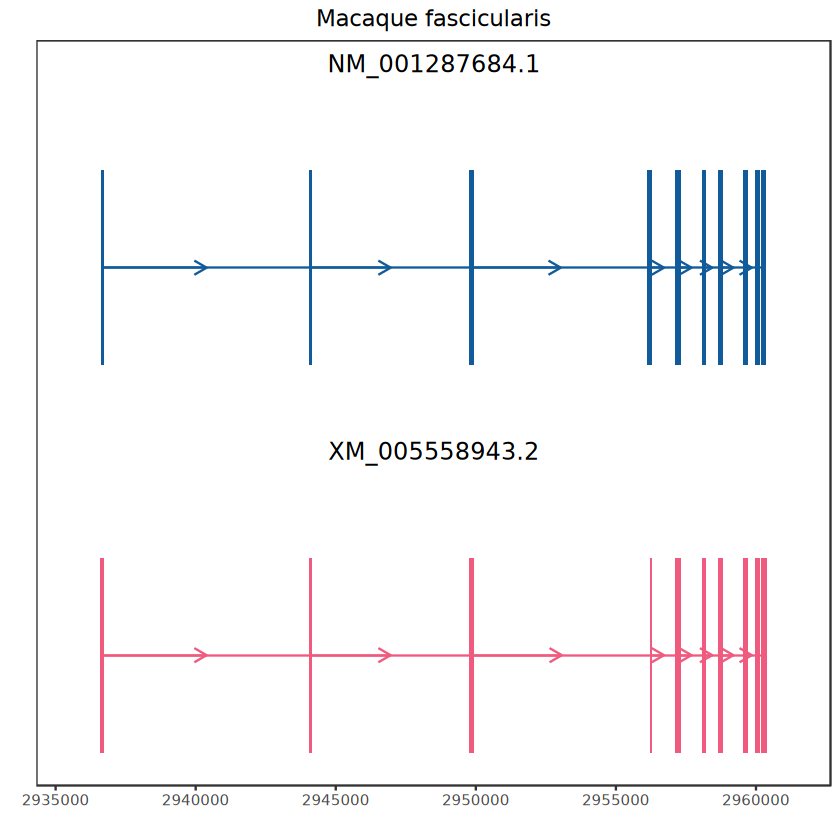

`summarise()` has grouped output by 'transcript_name'. You can override using
the `.groups` argument.


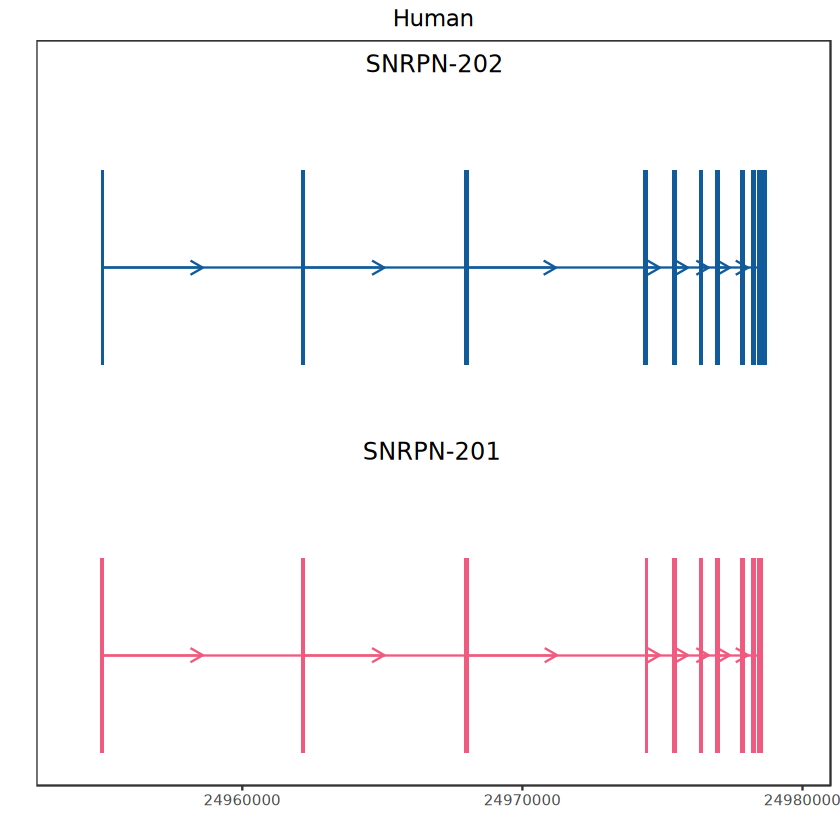

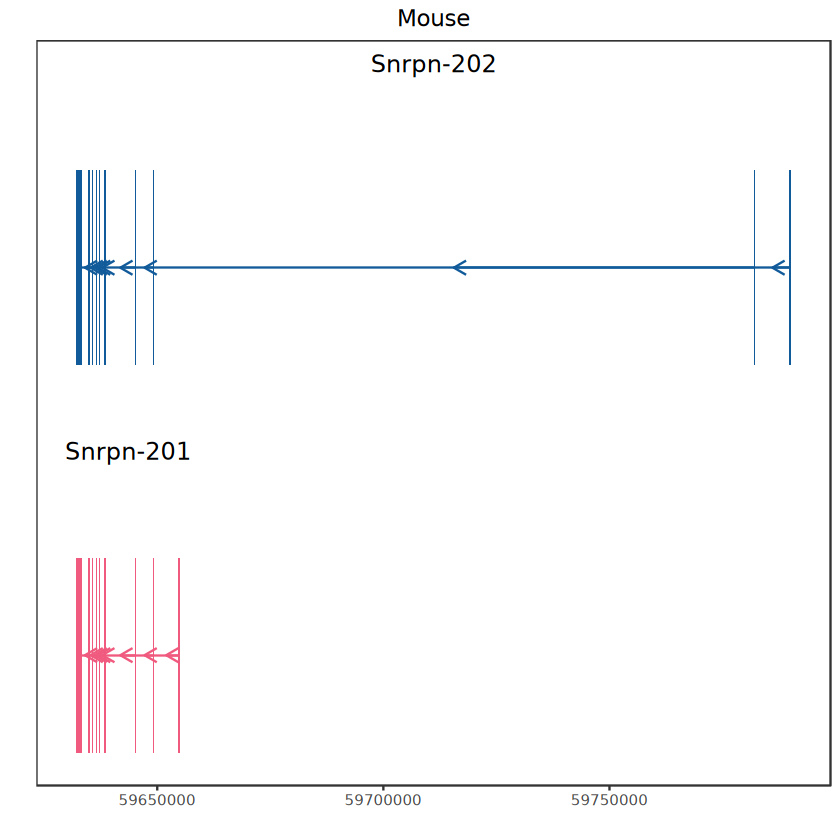

file saved to result/figure5/SNRPN-cross_species_sliced_compare_25_03_24.pdf



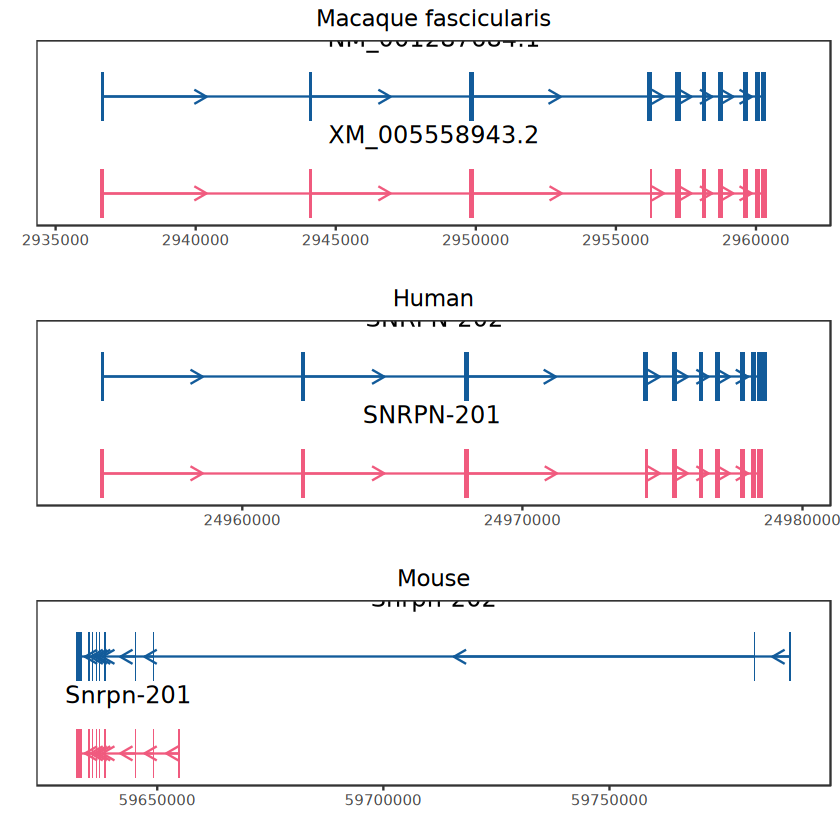

In [1102]:
#"ENST00000346403","ENST00000390687"
#"CDC42b" "CDC42u"
geneex = "SNRPN"
mycolor = c("#F05A7E","#125B9A")
gtfdf = as.data.frame(gtf[gtf$gene_id == geneex & gtf$transcript_id %in% c("XM_005558943.2","NM_001287684.1"),])
gtfdf$transcript_name = factor(gtfdf$transcript_id,levels = c("XM_005558943.2","NM_001287684.1"))
groupid = "Macaque fascicularis"
pc1 = Txrefplot(gtfdf,groupid,mycolor)
pc1

hubtrans = c("ENST00000346403.10","ENST00000390687.9")
gtfdf.hp.hub = as.data.frame(gtf.hp[gtf.hp$gene_name == "SNRPN" & gtf.hp$transcript_id %in% hubtrans,])
gtfdf.hp.hub$transcript_name = factor(gtfdf.hp.hub$transcript_name,levels = c("SNRPN-201","SNRPN-202")) 
#gtfdf.hp.hub$transcript_name = factor(gtfdf.hp.hub$transcript_name,levels = unique(gtfdf.hp.hub$transcript_name)) 
groupid = "Human"
pc2 = Txrefplot(gtfdf.hp.hub,groupid,mycolor)
pc2
gtfdf.ms.hub = as.data.frame(gtf.ms[gtf.ms$gene_name == "Snrpn",])
#unique(gtfdf.ms.hub$transcript_name)
gtfdf.ms.hub = gtfdf.ms.hub[!is.na(gtfdf.ms.hub$transcript_name),]
#unique(gtfdf.ms.hub$transcript_name)
gtfdf.ms.hub$transcript_name = factor(gtfdf.ms.hub$transcript_name,levels = unique(gtfdf.ms.hub$transcript_name)) 
groupid = "Mouse"
pc3 = Txrefplot(gtfdf.ms.hub,groupid,mycolor)
pc3
pct = ggarrange(pc1,pc2,pc3,ncol = 1)
pct
ggexport(pct,filename = "result/figure5/SNRPN-cross_species_sliced_compare_25_03_24.pdf",width = 6,height = 6)

In [ ]:
geneex = "MYL6"
fsraw.cor.hub = fsraw.cor[!fsraw.cor$subclass %in% c("PV_CHC","VLMC"),]
grtdfl = BuildPlotBed(fsraw.cor.hub,longbed,"subclass",geneex,NULL)
grtdfl = grtdfl[grtdfl$transcript_id %in% c("MYL6-WeiLab-1","MYL6-WeiLab-2"),]
grtdfl = grtdfl %>% group_by(readid) %>% filter(n()> 1)
grtdfl$group = factor(grtdfl$group,levels = suborder)
pci = tryCatch(IsoformReadPlot(gtf, grtdfl,geneex,onlyhub = T), error = function(e) NULL)
pci
ggexport(pci,filename = "result/figure5/dtu_case_ls_disease_MYL6_gene_readsplice_24_11_21.pdf",
           width = 5,height = 10)

In [304]:
SpCasePlot = function(fsraw.cor,geneex,hubtrans,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # if(nrow(mkdf) > 3000){
    #     mkdf = mkdf[sample(1:nrow(mkdf),size = 3000,replace = F),]
    # }
    mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
           mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
    # mkdf.st = mkdf %>% group_by(transcript_id) %>% summarise(count = length(readid))
    # mkdf.st = mkdf.st[order(mkdf.st$count),]
    # transorder = unique(mkdf.st$transcript_id)
    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = NA) + 
      # geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2,color = areatr),
      #            size = 0.5,alpha = 0.75) + 
     # scale_size(range = c(0.05,0.1)) +
      #facet_wrap(~layer,nrow = 2) 

      theme_void() +
      #scale_fill_discreterainbow() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      #scale_color_manual(values = mycolor) +
      #scale_color_flatui() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_y_reverse() + scale_x_reverse()
    return(pmkpti1)
}
#head(subcoran)
pref = qread("../ref/area_figure_an.qs")
subcoran = unique(fsraw.cor[,c("region","subcortical")])
edgesdf = pref$areaedges
edgesdf[edgesdf$areaid == "1/2",]$areaid = "1|2"
edgesdf = merge(edgesdf,subcoran,by.x = "areaid",by.y = "region")
mycolor = distinctColorPalette(length(unique(edgesdf$subcortical)))
names(mycolor) = unique(edgesdf$subcortical)


In [307]:
rgb(189,131,199,maxColorValue = 255)
rgb(182,210,161,maxColorValue = 255)

rgb(240,90,126,maxColorValue = 255)
rgb(18,91,154,maxColorValue = 255)
c("CDC42-FS-1","NM_001283401.1")

[1] "#BD83C7"

[1] "#B6D2A1"

[1] "#F05A7E"

[1] "#125B9A"

[1] "CDC42-FS-1"     "NM_001283401.1"

In [324]:
mycolor =  c('#BD83C7','#B6D2A1')
geneex = "MYL6"
hubtrans = c("MYL6-WeiLab-1","MYL6-WeiLab-2")
pci = SpCasePlot(fsraw.cor,geneex,hubtrans,ptsize = 1,mycolor,0.2)
ggexport(pci,filename = "result/figure5/MYL6-spatial_reads_point_25_03_18.pdf", width = 4,height = 6)

file saved to result/figure5/MYL6-spatial_reads_point_25_03_18.pdf



In [325]:
mycolor =  c('#125B9A','#F05A7E')
geneex = "CDC42"
hubtrans = c("CDC42-NM_001283401.1","CDC42-WeiLab-1")
pci = SpCasePlot(fsraw.cor,geneex,hubtrans,ptsize = 1,mycolor,0.2)
ggexport(pci,filename = "result/figure5/CDC42-spatial_reads_point_25_03_18.pdf", width = 4,height = 6)

file saved to result/figure5/CDC42-spatial_reads_point_25_03_18.pdf



In [314]:
#srtt = qread("data/meta_cell_ngs/umap_srt_combined_with_isoform_24_10_24.qs")
srtt = qread("data/meta_cell_ngs/umap_srt_combined_with_isoform_withspliced_forvelocity_n10_24_11_12.qs")

In [315]:
library(scCustomize)
DefaultAssay(srtt) = "ISOFORM"
isodf = GetAssayData(srtt,assay = "ISOFORM")
umapdf = as.data.frame(srtt@reductions$umap@cell.embeddings)
library(ggpointdensity)
featurei = c("GRIP1-XM-015431169.1","GRIP1-XM-015431173.1")
Feature_Density = function(umapdf,isodf,featurei){
    pci3 = list()
    for(i in 1:length(featurei)){
        # library(ggpointdensity)
        isodfi = isodf[featurei[i],]
        isodfi1 = names(isodfi[isodfi>0])
        umapdf.back = umapdf[!rownames(umapdf) %in% isodfi1,]
        umapdf.plot = umapdf[isodfi1,]
        pci3i = ggplot() +
            geom_point(data = umapdf.back,aes(x = umap_1,y = umap_2),color = "grey") +
            geom_pointdensity(data =  umapdf.plot,aes(x = umap_1,y = umap_2),size = 0.1) + NoLegend() +
            scale_color_viridis(option = "A") + theme_void() + ggtitle(featurei[i])
        # pci3i = plot_density(srtt,features = featurei[i],
        #             pal = "magma",size = 0.2,reduction = "umap") + NoLegend() +
        # ggtitle(featurei[i]) + theme_void() + coord_fixed()
        pci3[[i]] = pci3i
    }
    pci3 = ggarrange(plotlist = pci3,common.legend = T,legend = "right")
    pci3
    return(pci3)
}
#pal <- viridis(n = 10, option = "D")
#Plot_Density_Custom(seurat_object = srtt, features = "CDC42-NM-001283401.1",cols = pal)
#Plot_Density_Custom(seurat_object = srtt, features = "CDC42-CDC42-WeiLab-1",cols = pal)
#FeaturePlot(srtt,features = c("COL5A2-MICALL1-WeiLab-1"),order = TRUE,pt.size = sn) + scale_color_viridis(option = "B")
#FeaturePlot(srtt,features = c("COL5A2-MICALL1-WeiLab-2"),order = TRUE,pt.size = sn) + scale_color_viridis(option = "B")

In [323]:
pci = Feature_Density(umapdf, isodf, featurei = c("MYL6-MYL6-WeiLab-1","MYL6-MYL6-WeiLab-2"))
ggexport(pci,filename = "result/figure5/MYL6-single_cell_UMAP_25_03_18.pdf", width = 6,height = 3)

file saved to result/figure5/MYL6-single_cell_UMAP_25_03_18.pdf



,class,subclass,gene_id,1,2,groupid,geneidn
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,GABA,PVALB,PDE4B,0.8181818,0.1363636,13,1
2,GABA,RELN,PDE4B,1.0000000,0.0000000,11,1
3,GABA,SST,PDE4B,0.7611940,0.1791045,14,1
4,GABA,VIP_RELN,PDE4B,0.4666667,0.4666667,12,1
5,GLU,L2,PDE4B,0.6666667,0.1739130,1,1
6,GLU,L2/3,PDE4B,0.8085106,0.1063830,2,1


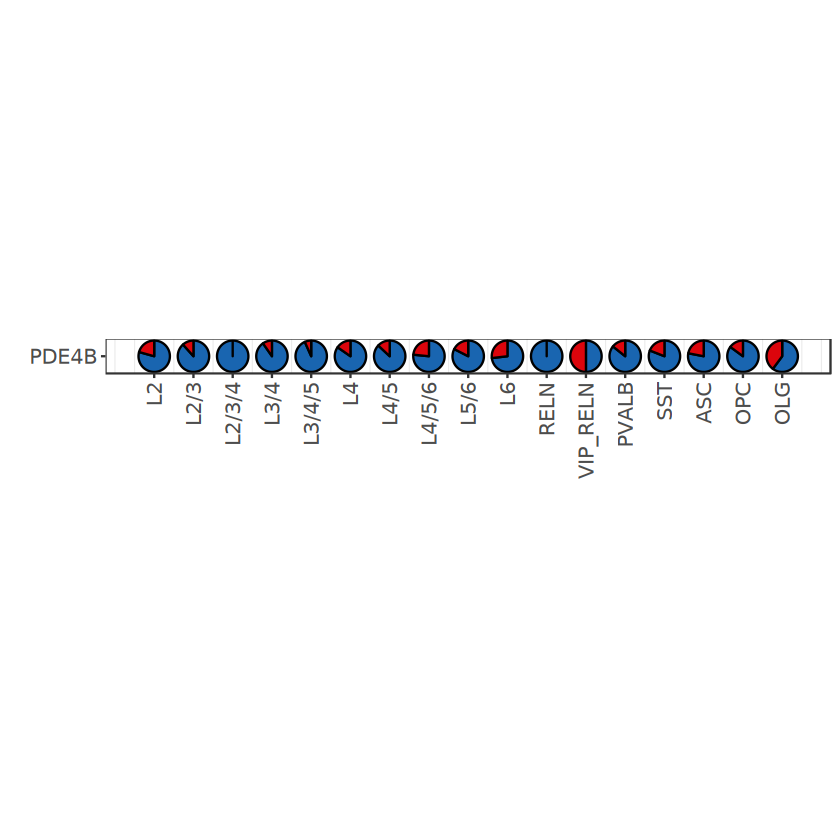

In [540]:
#MYL6 pie plot
caseg = "PDE4B"
mycolor =  c('#BD83C7','#B6D2A1')
isosigi = rbind(isosigls$subclass,isosigls$layer,isosigls$lobe,isosigls$subcortical)
isosigi = isosigi[isosigi$sig != "N",]
isosigi2 = rbind(isosigls$subclass,isosigls$layer,isosigls$lobe,isosigls$subcortical)
isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]

casecti = casect[casect$gene_id %in% caseg & casect$transcript_id %in% isosigi2$transcript_id,]

casecti = casecti[casecti$genecount > 10,]
casecti = casecti[!casecti$subclass %in% c("PV_CHC"),]

casecti = casecti %>% group_by(gene_id) %>% mutate(id = as.character(as.numeric(as.factor(transcript_id))))
casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,class+subclass+gene_id~id,value.var = "rate")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$class,casectl$subclass),]
casectl$groupid = as.numeric(factor(casectl$subclass,levels = suborder[suborder %in% casectl$subclass]))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = caseg))
head(casectl)

library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$sig = 'N'
casectl[paste0(casectl$subclass,casectl$gene_id) %in% paste0(isosigi$areatr,isosigi$gene_id),]$sig = "Y"
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
casectl$gene_id = factor(casectl$gene_id,levels = caseg)
plt = ggplot() + 
      geom_scatterpie(data = casectl[casectl$gene_id %in% caseg, ],
                      aes(x = groupid, y = geneidn, group = groupid,
                                           r = 0.4),
                      cols=colnames(casectl)[4:(4+ison-1)]) + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$subclass))),labels = suborder[suborder %in% casectl$subclass]) +
      scale_y_continuous(breaks = c(1:length(caseg)),labels = caseg) +
      scale_color_manual(values = c("black")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      #scale_fill_manual(values = mycolor) +
      scale_fill_discreterainbow() +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
#ggexport(plt,filename = "result/figure5/MYL6_subclass_isoform_rate_stat_pie_25_03_16.pdf",width = 6,height = 2)

In [ ]:
asd.dtu = d2[abs(d2$DTU.ASD.Value)>1 & d2$DTU.ASD.FDR < 0.05,]
asd.dtu = asd.dtu[!is.na(asd.dtu$external_gene_id),]
#head(asd.dtu)
isosigt = isosigls$subclass
isosigt = isosigt[isosigt$sig != "N" & isosigt$areatr %in% c("ASC","OPC"),]
#isosigt = dtumkdf.hub
isosigt = isosigt[isosigt$gene_id %in% asd.dtu$external_gene_id ,]
#isosigt = isosigt[isosigt$gene_id %in% refgdf[refgdf$source %in% c("ASD.Buxbaum","ASD.Talkowski","ASD.GWAS"),]$gene_id,]
unique(isosigt$gene_id)
table(isosigt$areatr)

In [ ]:
isosigt = isosigls$layer
isosigt = isosigt[isosigt$sig != "N" & isosigt$areatr %in% c("l4"),]
isosigt = isosigt[isosigt$gene_id %in% refgdf[refgdf$source %in% c("NDD.Talkowski","DDD.Retterer"),]$gene_id ,]
unique(isosigt$gene_id)
table(isosigt$areatr)

In [ ]:
isosigt = isosigls$subclass
isosigt = isosigt[isosigt$sig != "N",]
#isosigt = isosigt[isosigt$gene_id %in% asd.dtu$external_gene_id ,]
isosigt = isosigt[isosigt$gene_id %in% refgdf[refgdf$source %in% c("ASD.DTU","BD.DTU","SCZ.DTU"),]$gene_id,]
unique(isosigt$gene_id)

In [ ]:
d2[d2$external_gene_id %in% c("MYL6","CIRBP","CLTA","RPS24","NTRK2","INTS1","SRSF10") & abs(d2$DTU.ASD.Value)>0.5,
   c("external_gene_id","ensembl_transcript_id","DTU.ASD.Value")]
#MYL6-207 increased ENST00000547649 means ASC MYL6-WL-2 increased or ASC cell decreased
gtf.hub = gtf[gtf$transcript_id == "MYL6-WeiLab-2" & gtf$type == "exon",]
gtf.hub

### Calculate disease score

In [39]:
library(disgenet2r)
# install_gitlab("medbio/disgenet2r")
# library(disgenet2r)
api_key <- "eb9ed2ef-250a-4cfe-ad51-d67cc23cc9d3"
Sys.setenv(DISGENET_API_KEY= api_key)

Warning message:
"Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.
ℹ The deprecated feature was likely used in the ggvenn package.
  Please report the issue to the authors."


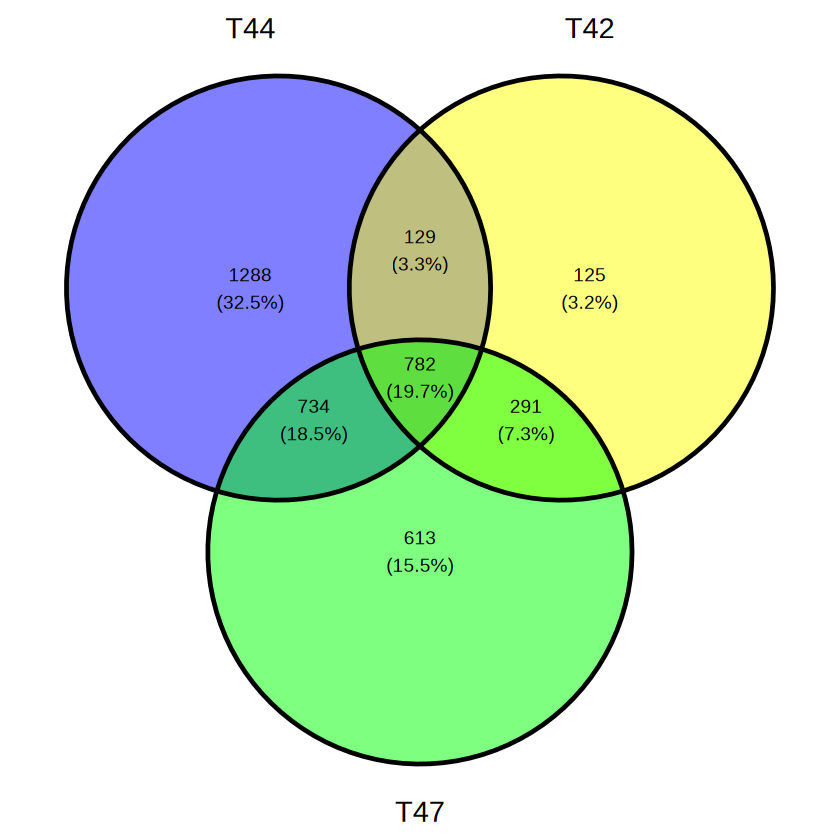

In [71]:
#total DTU stat
isosigst = NULL
for(i in c(1:6)){
    isosigt = isosigls[[i]]
    isosigt = isosigt[isosigt$sig != "N",]
    isosigt = unique(isosigt[,c("gene_id","areatr","dr")])
    isosigt$group = names(isosigls)[i]
    isosigst = rbind(isosigst,isosigt) 
}

isosigst.t42 = NULL
for(i in c(1:6)){
    isosigt = isosigls.t42[[i]]
    isosigt = isosigt[isosigt$sig != "N",]
    isosigt = unique(isosigt[,c("gene_id","areatr","dr")])
    isosigt$group = names(isosigls.t42)[i]
    isosigst.t42 = rbind(isosigst.t42,isosigt) 
}

isosigst.t47 = NULL
for(i in c(1:6)){
    isosigt = isosigls.t47[[i]]
    isosigt = isosigt[isosigt$sig != "N",]
    isosigt = unique(isosigt[,c("gene_id","areatr","dr")])
    isosigt$group = names(isosigls.t47)[i]
    isosigst.t47 = rbind(isosigst.t47,isosigt) 
}
ggvenn::ggvenn(list("T44" = isosigst$gene_id,
                    "T42" = isosigst.t42$gene_id,
                   "T47" = isosigst.t47$gene_id))

In [ ]:
isosigi = isosigls[[1]]
isosigi.t44 = isosigi[isosigi$sig != "N",]
isosigi = isosigls.t42[[1]]
isosigi.t42 = isosigi[isosigi$sig != "N",]
isosigi = isosigls.t47[[1]]
isosigi.t47 = isosigi[isosigi$sig != "N",]
ggvenn::ggvenn(list("T44" = isosigi.t44$gene_id,
                    "T42" = isosigi.t42$gene_id,
                   "T47" = isosigi.t47$gene_id))

In [76]:
gene_list <- unique(Reduce(intersect,list(isosigst$gene_id,isosigst.t42$gene_id,isosigst.t47$gene_id)))
length(gene_list)

[1] 782

In [ ]:
results_dft = NULL
batch = as.integer(length(gene_list)/10)
batch
for(i in 1:batch){
    if(10*batch[i] < length(gene_list)){
        gene_listi = gene_list[1 + 10*(batch[i]-1): 10*batch[i]]
    }else{
        gene_listi = gene_list[1 + 10*(batch[i]-1): length(gene_list)]
    }
    gene_disease_data <- gene2disease(
    gene = gene_listi,
      database = "CURATED", # 使用经过人工审编的高质量数据源
      score = c(0.1, 1)     # 分数范围，可根据需要调整
    )
    print(batch[i])
    results_df <- gene_disease_data@qresult
    nrow(results_df)
    neuro_results <- results_df %>%
    filter(grepl(diseaseClasses_HPO,pattern = "nervous") | grepl(diseaseClasses_MSH,pattern = "Mental"))
    nrow(neuro_results)
    results_dft = rbind(results_dft,neuro_results)
}

qsave(results_dft,file = "result/figure6_snp_analysis/disgenet2r_gene_disease_annotation_neuron_filter_df.qs")

[1] 78

Warning message in gene2disease(gene = gene_listi, database = "CURATED", score = c(0.1, :
"Removing duplicates from input genes list."


In [ ]:
gene_neuro_score_max <- neuro_results %>%
  group_by(gene_symbol) %>%
  summarise(
    max_neuro_score = max(score, na.rm = TRUE), # 与任何神经疾病的最高关联分
    num_neuro_diseases = n_distinct(diseaseid)  # 关联的神经疾病数量
  ) %>%
  arrange(desc(max_neuro_score))

print(gene_neuro_score_max)

gene_neuro_score_avg <- neuro_results %>%
  group_by(gene_symbol) %>%
  summarise(
    avg_neuro_score = mean(score, na.rm = TRUE), # 平均关联分数
    weighted_score = sum(score) / sqrt(n()),     # 一种加权计算方式，同时考虑分数和疾病数
    num_neuro_diseases = n_distinct(diseaseid)
  ) %>%
  arrange(desc(weighted_score))

print(gene_neuro_score_avg)

In [ ]:
# 1. 保存结果
write.csv(gene_neuro_score_avg, "gene_neuro_disease_scores.csv", row.names = FALSE)

# 2. 简单可视化
library(ggplot2)

ggplot(gene_neuro_score_avg, aes(x = reorder(gene_symbol, -weighted_score), y = weighted_score)) +
  geom_bar(stat = "identity", fill = "steelblue") +
  geom_text(aes(label = num_neuro_diseases), vjust = -0.5, size = 3) + # 在柱子上方显示关联疾病数
  labs(title = "基因与神经疾病关联强度评分",
       x = "基因",
       y = "加权关联分数",
       caption = "柱上数字表示关联的神经疾病数量") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

### Splicing factor correlation analysis

In [9]:
unique(refgdf$group)
#refgdf[refgdf$group == "SP",]
refsp = refgdf[refgdf$group %in% c("SP","RBP","TF"),]
length(unique(refsp$gene_id))
#unique(refsp$gene_id)

[1] "ASD"   "NDD"   "SCZ"   "BIP"   "EPI"   "DDD"   "hGPCR" "OPD"   "TF"   
[10] "RBP"   "SP"    "BD"

[1] 1754

In [10]:
# 加载必要的包
library(readxl)
library(dplyr)
library(purrr)

# 1. 设置包含Excel文件的文件夹路径
folder_path <- "/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/ref/disease_gene/RBP_targeted/"  # 请替换为您的实际路径

# 2. 获取文件夹下所有.xls文件的路径列表
file_list <- list.files(path = folder_path, 
                         pattern = "\\.xls$",  # 正则表达式，匹配以.xls结尾的文件
                         full.names = TRUE)    # 返回文件的完整路径

# 3. 批量读取所有文件到一个列表
list_of_data <- map(file_list, read.table)
# 方法A：使用dplyr的bind_rows()（推荐）
verified_df <- bind_rows(list_of_data)
head(verified_df)
colnames(verified_df) = unlist(verified_df[1,])
verified_df = verified_df[verified_df$RBP != "RBP",]
verified_df$paired = paste0(verified_df$geneName,"-",verified_df$RBP)
verified_df


Attaching package: 'purrr'


The following object is masked from 'package:XVector':

    compact


The following object is masked from 'package:GenomicRanges':

    reduce


The following object is masked from 'package:IRanges':

    reduce


The following object is masked from 'package:data.table':

    transpose




,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,RBP,geneID,geneName,geneType,clusterNum,clipExpNum,clipIDnum,HepG2(shRNA),K562(shRNA),HepG2(CRIPSR),K562(CRIPSR),pancancerNum
2,ALYREF,ENSG00000186063,AIDA,protein_coding,2,1,2,NA,NA,NA,NA,20
3,ATXN2,ENSG00000186063,AIDA,protein_coding,3,1,5,NA,NA,NA,NA,28
4,CDK1,ENSG00000186063,AIDA,protein_coding,1,2,2,NA,NA,NA,NA,21
5,CHTOP,ENSG00000186063,AIDA,protein_coding,3,3,3,NA,NA,NA,0.155,19
6,CNBP,ENSG00000186063,AIDA,protein_coding,1,1,1,NA,NA,NA,NA,19


,RBP,geneID,geneName,geneType,clusterNum,clipExpNum,clipIDnum,HepG2(shRNA),K562(shRNA),HepG2(CRIPSR),K562(CRIPSR),pancancerNum,paired
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2,ALYREF,ENSG00000186063,AIDA,protein_coding,2,1,2,NA,NA,NA,NA,20,AIDA-ALYREF
3,ATXN2,ENSG00000186063,AIDA,protein_coding,3,1,5,NA,NA,NA,NA,28,AIDA-ATXN2
4,CDK1,ENSG00000186063,AIDA,protein_coding,1,2,2,NA,NA,NA,NA,21,AIDA-CDK1
5,CHTOP,ENSG00000186063,AIDA,protein_coding,3,3,3,NA,NA,NA,0.155,19,AIDA-CHTOP
6,CNBP,ENSG00000186063,AIDA,protein_coding,1,1,1,NA,NA,NA,NA,19,AIDA-CNBP
7,CPSF2,ENSG00000186063,AIDA,protein_coding,1,1,1,NA,NA,NA,NA,32,AIDA-CPSF2
8,CPSF7,ENSG00000186063,AIDA,protein_coding,1,1,1,-0.252,NA,NA,NA,29,AIDA-CPSF7
9,CSTF2,ENSG00000186063,AIDA,protein_coding,13,4,22,-0.441,-0.627,NA,NA,27,AIDA-CSTF2
10,CSTF2T,ENSG00000186063,AIDA,protein_coding,8,4,14,0.250,NA,NA,NA,32,AIDA-CSTF2T


In [18]:
verified_df[verified_df$geneName == "FXYD1",]$RBP

character(0)

In [61]:
#load ngs count
ngscount = qread("data/gene_mx_total/spatial_genecount_ngs_combined_genecount_25_10_15.qs")
head(ngscount)
ngscount.bl = ngscount %>% group_by(subcortical,layer,lobe,region,blockid,gene_id) %>% summarise(genecount = sum(genecount))
ngscount.cl = ngscount %>% group_by(subcortical,layer,lobe,region,class,subclass,gene_id) %>% summarise(genecount = sum(genecount))
head(ngscount.bl)
ngscount.cl$metacell = paste0(ngscount.cl$layer,"-",ngscount.cl$region,"-",ngscount.cl$lobe,"-",
                             ngscount.cl$subcortical,"-",ngscount.cl$class,"-",ngscount.cl$subclass)
ngscount.bl$metacell = paste0(ngscount.bl$layer,"-",ngscount.bl$region,"-",ngscount.bl$lobe,"-",
                              ngscount.bl$subcortical,"-",ngscount.bl$blockid)

layer,lobe,region,subcortical,blockid,class,subclass,gene_id,genecount,metacell
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
HC,NA,CA1,Hippocampus,26600_82600,,,AARSD1,1,HC-CA1-NA-Hippocampus-26600_82600--
HC,NA,CA1,Hippocampus,26600_82600,,,ACAA1,1,HC-CA1-NA-Hippocampus-26600_82600--
HC,NA,CA1,Hippocampus,26600_82600,,,ACHE,1,HC-CA1-NA-Hippocampus-26600_82600--
HC,NA,CA1,Hippocampus,26600_82600,,,ACP1,1,HC-CA1-NA-Hippocampus-26600_82600--
HC,NA,CA1,Hippocampus,26600_82600,,,ACP6,1,HC-CA1-NA-Hippocampus-26600_82600--
HC,NA,CA1,Hippocampus,26600_82600,,,ACTB,2,HC-CA1-NA-Hippocampus-26600_82600--


`summarise()` has grouped output by 'subcortical', 'layer', 'lobe', 'region',
'blockid'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'subcortical', 'layer', 'lobe', 'region',
'class', 'subclass'. You can override using the `.groups` argument.


subcortical,layer,lobe,region,blockid,gene_id,genecount
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
Cerebellum,cb,NA,cb,15400_87400,AAK1,3
Cerebellum,cb,NA,cb,15400_87400,ABCA1,3
Cerebellum,cb,NA,cb,15400_87400,ABCB1,3
Cerebellum,cb,NA,cb,15400_87400,ABHD12,3
Cerebellum,cb,NA,cb,15400_87400,ABLIM3,3
Cerebellum,cb,NA,cb,15400_87400,ACADS,12


In [62]:
ngscount.bl$metacell = paste0(ngscount.bl$layer,"-",ngscount.bl$region,"-",ngscount.bl$lobe,"-",
                              ngscount.bl$subcortical,"-",ngscount.bl$blockid)
ngscount.cl$metacell = paste0(ngscount.cl$layer,"-",ngscount.cl$region,"-",ngscount.cl$lobe,"-",
                             ngscount.cl$subcortical,"-",ngscount.cl$class,"-",ngscount.cl$subclass)

In [201]:
qsave(list("block" = ngscount.bl,"celltype" = ngscount.cl),
      file = "result/figure_revision/ngscount_bin200_genemx_25_10_21.qs")

In [22]:
#normalize by seurat
NormGenecount = function(ngscount.cl){
    genemx = dcast(ngscount.cl,gene_id~metacell,value.var = "genecount",fun.aggregate = sum)
    genemx = genemx[!is.na(genemx$gene_id),]
    gene_names = genemx$gene_id
    rownames(genemx) = genemx$gene_id;genemx = genemx[,-1]
    genemx_norm <- as.matrix(genemx)
    scale_factor <- 10000
    genemx_norm <- log1p(t(t(genemx_norm) / colSums(genemx_norm)) * scale_factor)
    genemx_norm = as.data.frame(genemx_norm)
    #genemx_norm <- data.frame(gene_id = gene_names, genemx_norm)
    colnames(genemx_norm) <- colnames(genemx) 
    return(genemx_norm)
}

# genemx.cl = NormGenecount(ngscount.cl)
# genemx.bl = NormGenecount(ngscount.bl)
# qsave(list("block" = genemx.bl,"celltype" = genemx.bl),
#       file = "result/figure_revision/SF_DTU_cor_analysis_bin200_genemx_25_10_21.qs")
# head(genemx.cl)

In [23]:
ngscount.bl = qread("result/figure_revision/ngscount_bin200_genemx_25_10_21.qs")$block
ngscount.bl$metacell = paste0(ngscount.bl$layer,"-",ngscount.bl$region,"-",ngscount.bl$lobe,"-",
                              ngscount.bl$subcortical,"-",ngscount.bl$blockid)
genemx.bl = NormGenecount(ngscount.bl)
#genemx.cl.hub = genemx.cl[rownames(genemx.cl) %in% refsp$gene_id,]
genemx.bl.hub = genemx.bl[rownames(genemx.bl) %in% refsp$gene_id,]
#genemx.cl.hub = t(genemx.cl.hub)
genemx.bl.hub = t(genemx.bl.hub)

In [54]:
qsave(genemx.bl.hub,"result/figure_revision/ngscount_bin200_genemx_RBP_25_12_12.qs")

In [145]:
#build bin 200 dtu data to detect SF/RBP
#for cortext celltype
ra = 200
fsraw.cor$xid = as.integer(fsraw.cor$x/(ra*2)) * ra * 2 + ra
fsraw.cor$yid = as.integer(fsraw.cor$y/(ra*2)) * ra * 2 + ra
fsraw.cor$blockid = paste0(fsraw.cor$xid,"_",fsraw.cor$yid)
transtl.bl = fsraw.cor %>% group_by(layer,lobe,region,blockid,subcortical,gene_id) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,layer,lobe,region,blockid,subcortical) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
transtl.bl$metacell = paste0(transtl.bl$layer,"-",transtl.bl$region,"-",transtl.bl$lobe,"-",transtl.bl$subcortical,"-",transtl.bl$blockid)
transtl.bl$relative = transtl.bl$count/transtl.bl$genecount

# transtl.cl = fsraw.cor %>% group_by(layer,subclass,subcortical,gene_id) %>% 
#         mutate(genecount = length(unique(readid))) %>% 
#         group_by(gene_id,transcript_id,layer,subclass,subcortical) %>% 
#         summarise(count = length(unique(readid)),
#                   genecount = unique(genecount))
# transtl.cl$metacell = paste0(transtl.cl$layer,"-",transtl.cl$subcortical,"-",transtl.cl$subclass)
# transtl.cl$relative = transtl.cl$count/transtl.cl$genecount

transtl.cl = fsraw.cor %>% group_by(layer,lobe,region,subcortical,class,subclass,gene_id) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,layer,lobe,region,class,subclass,subcortical) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
transtl.cl$metacell = paste0(transtl.cl$layer,"-",transtl.cl$region,"-",transtl.cl$lobe,"-",
                             transtl.cl$subcortical,"-",transtl.cl$class,"-",transtl.cl$subclass)
transtl.cl$relative = transtl.cl$count/transtl.cl$genecount
qsave(list("block" = transtl.bl,"cell" = transtl.cl),file = "data/spatial_isoform_ratio_fs_bin200_metacell_25_12_11.qs")
# transtf = transtl %>% group_by(transcript_id) %>% 
#        filter(length(unique(areatr)) > 1)


`summarise()` has grouped output by 'gene_id', 'transcript_id', 'layer',
'lobe', 'region', 'class', 'subclass'. You can override using the `.groups`
argument.


In [57]:
# transtls = qread(file = "data/spatial_isoform_ratio_fs_bin200_metacell_25_12_11.qs")
# transtl.bl = transtls$block
# head(transtl.bl)
# alldtu = NULL
# for(i in 1:6){
#     isosigi = isosigls[[i]]
#     isosigi.hub = isosigi[isosigi$sig != "N",]
#     alldtu = unique(c(isosigi.hub$transcript_id,alldtu))
# }
# length(alldtu)
# nrow(transtl.bl)
# transtl.bl = transtl.bl[transtl.bl$transcript_id %in% alldtu,]
# nrow(transtl.bl)
# transtl.bl.st = transtl.bl %>% group_by(transcript_id) %>% summarise(metan = length(unique(metacell)))
# summary(transtl.bl.st$metan)
transtl.bl.st = transtl.bl.st[transtl.bl.st$metan > 1000,]
nrow(transtl.bl.st)
transtl.bl = transtl.bl[transtl.bl$transcript_id %in% transtl.bl.st$transcript_id,]
# isosigi = isosigi %>% group_by(gene_id) %>% filter(mean(genecount[!duplicated(areatr)]) > 300)
# isosigi.hub = isosigi[isosigi$transcript_id %in% isosigi.hub$transcript_id,]
# length(unique(isosigi.hub$gene_id))
# unique(isosigi.hub$gene_id)
# fsraw.cor.hub = fsraw.cor[fsraw.cor$gene_id %in% isosigi.hub$gene_id,]
qsave(transtl.bl,file = "data/spatial_isoform_ratio_fs_bin200_metacell_filter_25_12_11.qs")

[1] 1920

In [ ]:
qsave(genemx.bl.hub,"result/figure_revision/ngscount_bin200_genemx_RBP_25_12_12.qs")
qsave(transtl.bl,file = "data/spatial_isoform_ratio_fs_bin200_metacell_filter_25_12_11.qs")

#### TF cor

In [25]:
options(dplyr.summarise.inform = FALSE)
MakeTFCor = function(transtl,genemx.hub){
    genemx.hub <- data.frame(
      metacell = rownames(genemx.hub),
      genemx.hub,
      stringsAsFactors = FALSE,
      check.names = FALSE
    )
    metacelln = length(unique(transtl$metacell))
    transtl = transtl %>% group_by(transcript_id) %>% filter(length(metacell) > metacelln/4)
    cmpdf = merge(transtl[,c("gene_id","transcript_id","metacell","relative")], genemx.hub,by = "metacell")
    metacelln = length(unique(cmpdf$metacell))
    cordf = NULL
    for(i in 1:(ncol(genemx.hub) - 1)){
        cmpdfi = cmpdf[,c(1:4,i+4)]
        genei = colnames(cmpdfi)[5]
        colnames(cmpdfi)[5] = "SF"
        cmpdfi = cmpdfi[!is.na(cmpdfi$SF) & !is.na(cmpdfi$relative),]
        cmpdfi = cmpdfi[!is.nan(cmpdfi$SF) & !is.nan(cmpdfi$relative),]
        cmpdfi = cmpdfi %>% group_by(gene_id,transcript_id) %>% 
                        filter(sum(SF != 0) > 10 & sum(relative != 0) > 10)
        if(nrow(cmpdfi) == 0) next;
        cordfi = cmpdfi %>% group_by(gene_id,transcript_id) %>% 
                        filter(length(unique(metacell)) > metacelln/4) %>% 
                        summarise(cor = cor(relative,SF),
                                  pvalue = cor.test(relative,SF)$p.value)
        cordfi$SF = genei
        cordf = rbind(cordf,cordfi)
    }
    return(cordf)
}

cordf.bl = MakeTFCor(transtl.bl,genemx.bl.hub)
nrow(cordf.bl)
#cordf.cl = MakeTFCor(transtl.cl,genemx.cl.hub)
#summary(cordf.cl$cor)
#cordfls = list("celltype" = cordf.cl,"block" = cordf.bl)
qsave(cordf.bl,file = "result/figure_revision/SF_DTU_cor_analysis_bin200_celltype_25_12_11.qs")

[1] 483061

In [301]:
cordfls = qread("result/figure_revision/SF_DTU_cor_analysis_bin200_celltype_25_10_17.qs")

In [302]:
FilterCordf = function(cordf){
    cordf$padj = p.adjust(cordf$pvalue)
    cordf = cordf[!is.na(cordf$cor),]
    cordf.fil = cordf[cordf$padj < 0.05,]
    cordf.fil = cordf[cordf$transcript_id %in% cordf.fil$transcript_id &
                      cordf$SF %in% cordf.fil$SF,]
    # cordf.fil = cordf.fil %>% group_by(gene_id,SF) %>% filter(sum(cor > 0) > 0 & sum(cor < 0) > 0)
    # cordf.fil = cordf[cordf$transcript_id %in% cordf.fil$transcript_id &
    #                   cordf$SF %in% cordf.fil$SF,]
    
    #nrow(cordf.fil)
    cordf.fil = cordf.fil %>% group_by(SF) %>% filter(max(abs(cor)) > 0.25)
    cordf.fil = cordf.fil %>% group_by(gene_id) %>% filter(max(abs(cor)) > 0.25)
    cordf.fil = cordf.fil %>% group_by(SF,gene_id,transcript_id) %>% mutate(maxcor = max(abs(cor)))
    cordf.fil = cordf.fil %>% group_by(SF,gene_id) %>% filter(max(abs(cor)) == maxcor)
    return(cordf.fil)
}
# cordf.cl = cordfls$celltype
# cordf.bl = cordfls$block
# cordf.cl.fil = FilterCordf(cordf.cl)
# head(cordf.cl.fil)
cordf.bl.fil = FilterCordf(cordf.bl)
nrow(cordf.bl.fil)
#library(ggvenn)
#ggvenn(list("bl" = cordf.bl.fil$SF,"cl" = cordf.cl.fil$SF))

[1] 128

In [303]:
cordf.bl$padj = p.adjust(cordf.bl$pvalue)
nrow(cordf.bl[cordf.bl$padj < 0.05,])
nrow(cordf.bl.fil)

[1] 15123

[1] 128

In [304]:
# cordf.cl$padj = p.adjust(cordf.cl$pvalue)
# summary(cordf.cl[cordf.cl$gene_id == "DDRGK1" & cordf.cl$padj < 0.05,]$cor)
cordf.bl.fil[cordf.bl.fil$gene_id == "DDRGK1",]

gene_id,transcript_id,cor,pvalue,SF,padj,maxcor
<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
DDRGK1,XM_005568473.2,-0.31915243,3.276968e-185,CUX2,1.582940e-179,0.31915243
DDRGK1,XM_005568473.2,0.02306226,4.110329e-02,DMRT3,1.000000e+00,0.02306226
DDRGK1,XM_005568473.2,-0.18124477,6.557657e-59,EGR1,3.165899e-53,0.18124477
DDRGK1,XM_005568473.2,-0.26230545,1.396508e-123,EGR3,6.745440e-118,0.26230545
DDRGK1,XM_005568473.2,-0.16250661,1.470041e-47,HLF,7.094136e-42,0.16250661
DDRGK1,XM_005568473.2,-0.33150722,1.545205e-200,HOPX,7.464173e-195,0.33150722
DDRGK1,DDRGK1-FS-1,-0.08641228,1.577878e-13,KHDRBS3,7.534021e-08,0.08641228
DDRGK1,DDRGK1-FS-1,-0.04363822,1.977175e-04,LMX1A,1.000000e+00,0.04363822
DDRGK1,XM_005568473.2,-0.24597207,1.937154e-108,MEF2C,9.356491e-103,0.24597207


#### Try network analysis

##### Block

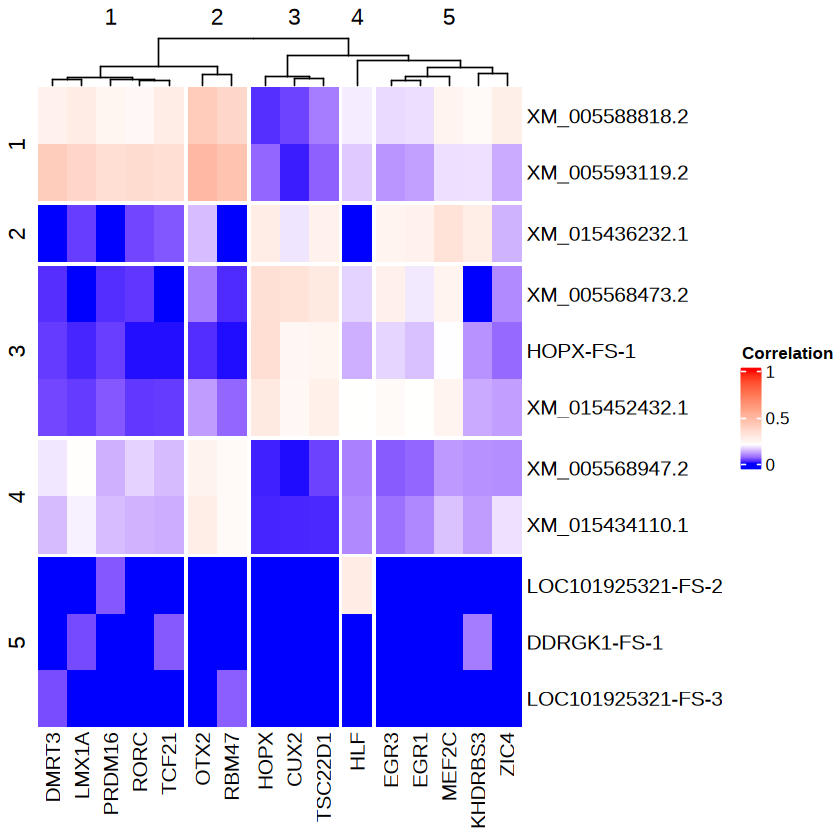

In [305]:
library(ComplexHeatmap)
library(circlize)
cordf.fil = cordf.bl.fil
# 假设您的数据框名为df，包含列：Var1, var2, cor, pvalue
# 假设验证关系的数据框名为verified_df，包含列：Var1, var2
# cordf.fil = cordf.fil %>% group_by(gene_id,transcript_id) %>% mutate(sfn = length(unique(padj < 0.05)))
# cordf.fil = cordf.fil %>% group_by(gene_id) %>% filter(sfn == max(sfn))
# 步骤1: 准备数据矩阵
# 获取所有唯一变量
all_vars <- unique(c(cordf.fil$gene_id, cordf.fil$SF))

# 创建相关性矩阵和p值矩阵
mat_cor = dcast(cordf.fil,transcript_id~SF,value.var = "cor",fun.aggregate = sum)
rownames(mat_cor) = mat_cor$transcript_id;mat_cor = mat_cor[,-1]
mat_cor = as.matrix(mat_cor)

mat_p = dcast(cordf.fil,transcript_id~SF,value.var = "padj",fun.aggregate = mean,fill = 1)
rownames(mat_p) = mat_p$transcript_id;mat_p = mat_p[,-1]
mat_p = as.matrix(mat_p)

# # 步骤2: 创建验证关系矩阵
# mat_verified <- matrix(FALSE, nrow = nrow(mat_cor), ncol = ncol(mat_cor))
# rownames(mat_verified) <- rownames(mat_cor)
# colnames(mat_verified) <- colnames(mat_cor)

# # 如果有验证数据框，填充验证矩阵
# if(exists("verified_df")) {
#   for(i in 1:nrow(verified_df)) {
#     row_var <- verified_df$geneName[i]
#     col_var <- verified_df$RBP[i]
#     if(row_var %in% all_vars && col_var %in% all_vars) {
#       mat_verified[row_var, col  _var] <- TRUE
#     }
#   }
# }

# 步骤3: 设置颜色映射
col_fun <- colorRamp2(c(-1, 0, 1), c("blue", "white", "red"))

# 步骤4: 绘制热图
#pdf("result/figure_revision/isoform_TF_RBP_SF_DTU_cor_heatmap.pdf",width = 10, height = 6)
pt = Heatmap(mat_cor, 
        name = "Correlation", 
        col = col_fun,
        show_row_dend = FALSE,column_split = 8,row_split = 5,  # 禁用默认矩形绘制，以便自定义[2](@ref)
        # cell_fun = function(j, i, x, y, width, height, fill) {
        #   # 获取当前单元格的值
        #   cor_val <- mat_cor[i, j]
        #   p_val <- mat_p[i, j]
        #   verified <- mat_verified[i, j]
            
        #   # 绘制背景矩形（填充相关性颜色）
        #   grid.rect(x = x, y = y, width = width, height = height, 
        #             gp = gpar(fill = fill, col = "grey", lwd = 0.1))
          
        #   # # 添加星号：cor > 0.3 且 pvalue < 0.05
        #   # if(!is.na(cor_val) && !is.na(p_val) && p_val < 0.05) {
        #   #   grid.text("*", x, y, gp = gpar(fontsize = 12, col = "black"))
        #   # }
          
        #   # 添加验证关系边框：红色边框
        #   # if(!is.na(verified) && verified) {
        #   #   grid.rect(x = x, y = y, width = width, height = height, 
        #   #             gp = gpar(col = "red", fill = NA, lwd = 2))
        #   # }
        # },
        cluster_rows = TRUE,
        cluster_columns = TRUE,
        show_row_names = TRUE,
        show_column_names = TRUE,
        heatmap_legend_param = list(title = "Correlation"))
#dev.off()
col_fun <- colorRamp2(c(0, 0.2, 1), c("blue", "white", "red"))
pt = Heatmap(abs(mat_cor), 
        name = "Correlation", 
        col = col_fun,
        show_row_dend = FALSE,column_split = 5,row_split = 5,  # 禁用默认矩形绘制，以便自定义[2](@ref)
        cluster_rows = TRUE,
        cluster_columns = TRUE,
        show_row_names = TRUE,
        show_column_names = TRUE,
        heatmap_legend_param = list(title = "Correlation"))
print(pt)

In [297]:
head(transtl.bl)
ggplot(transtl.case[transtl.case$gene_id == "RCAN2",],x = transcript_id,y = relative)

gene_id,transcript_id,layer,lobe,region,blockid,subcortical,count,genecount,metacell,relative
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>
A4GALT,XM_015457101.1,HC,NA,proS,26000_83600,Hippocampus,1,1,HC-proS-NA-Hippocampus-26000_83600,1
A4GALT,XM_015457101.1,cb,NA,cb,17200_90000,Cerebellum,1,1,cb-cb-NA-Cerebellum-17200_90000,1
A4GALT,XM_015457101.1,cb,NA,cb,23600_91600,Cerebellum,2,2,cb-cb-NA-Cerebellum-23600_91600,1
A4GALT,XM_015457101.1,cb,NA,cb,24400_98000,Cerebellum,1,1,cb-cb-NA-Cerebellum-24400_98000,1
A4GALT,XM_015457101.1,cb,NA,cb,26000_94000,Cerebellum,4,4,cb-cb-NA-Cerebellum-26000_94000,1
A4GALT,XM_015457101.1,cb,NA,cb,28400_93200,Cerebellum,1,1,cb-cb-NA-Cerebellum-28400_93200,1


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

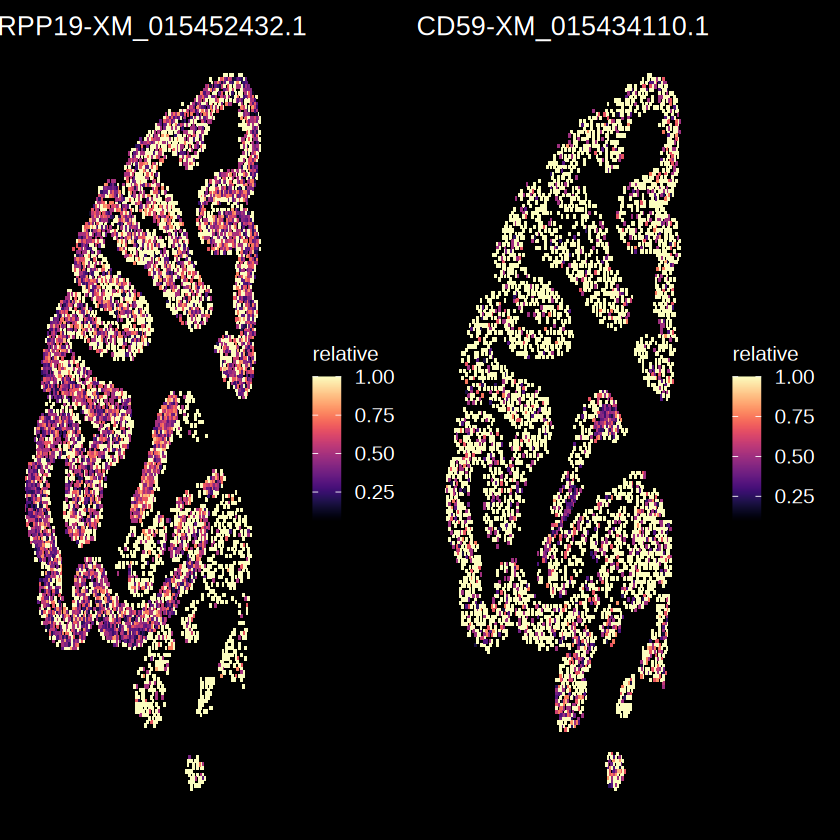

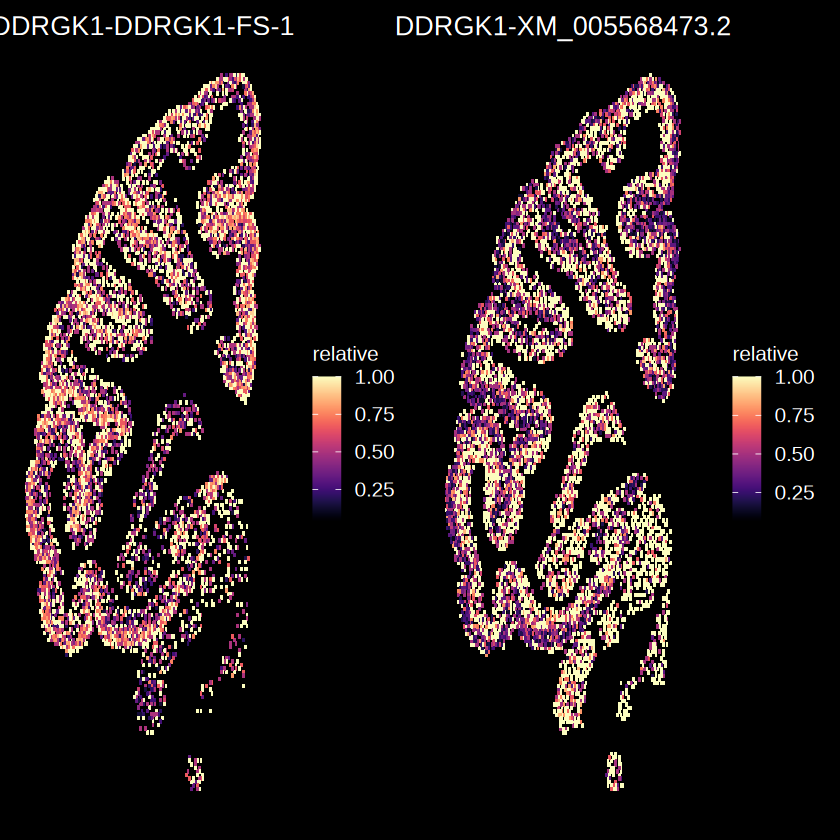

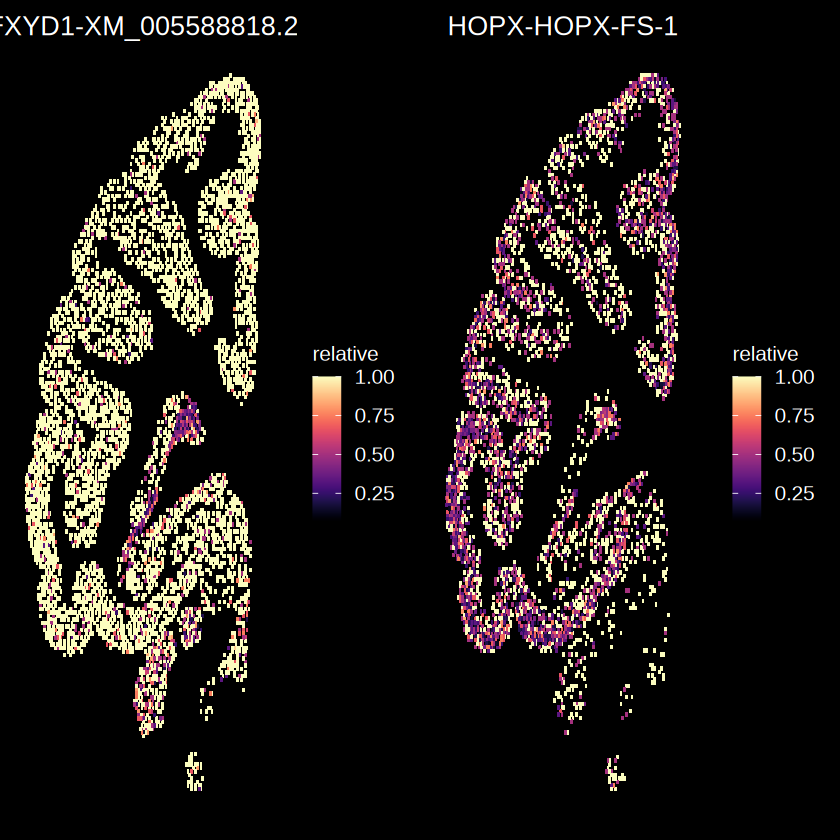

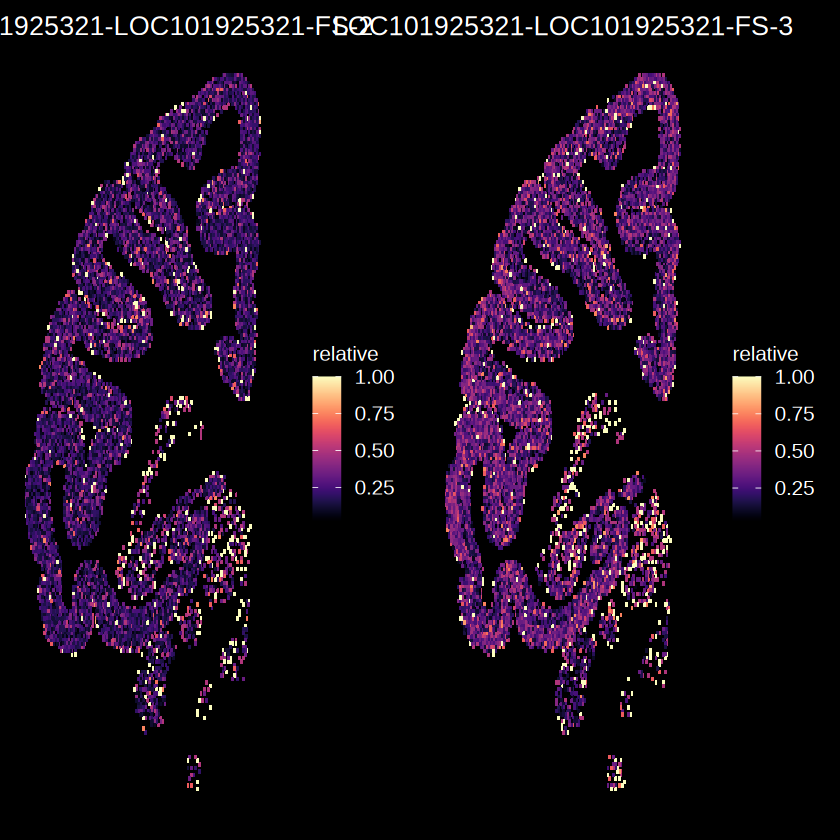

$`1`

$`2`

$`3`

$`4`

$`5`

$`6`

attr(,"class")
[1] "list"      "ggarrange"

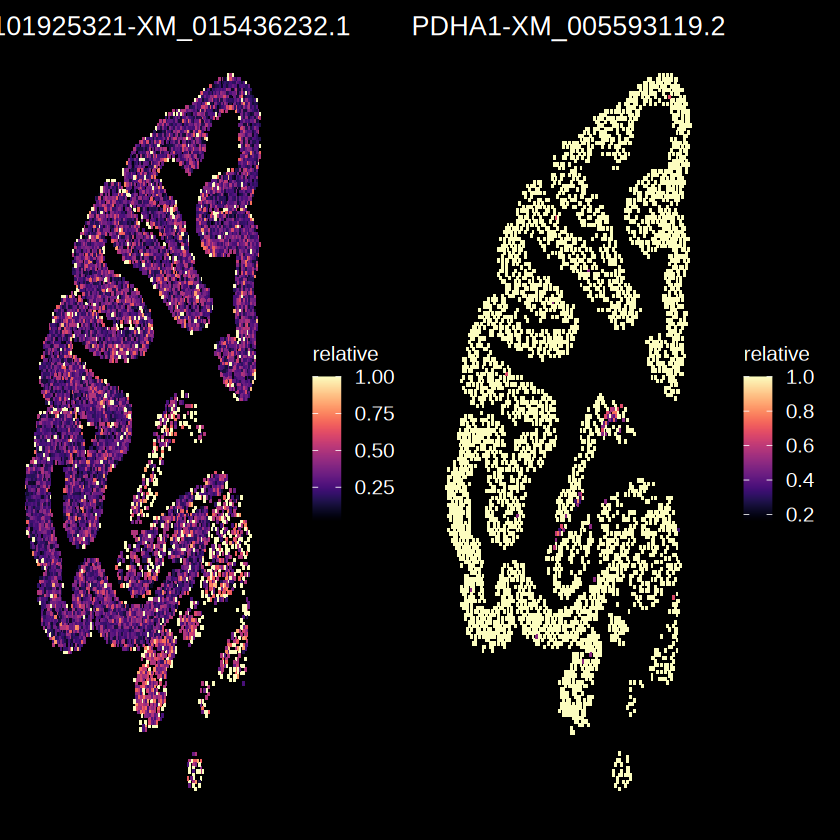

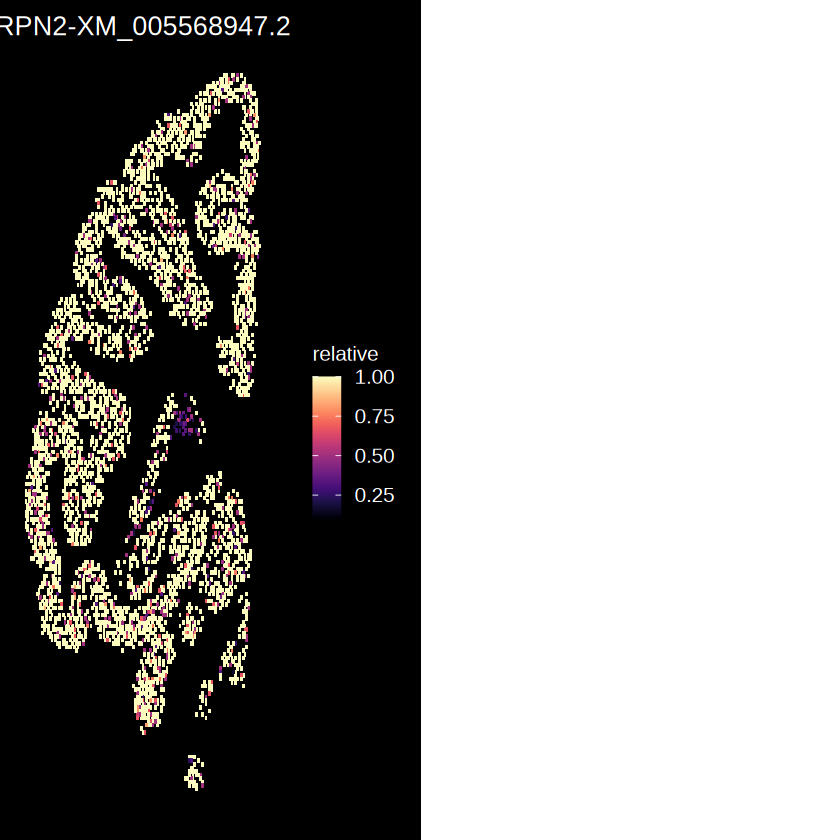

In [306]:
transtl.case = transtl.bl[transtl.bl$transcript_id %in% cordf.fil[cordf.fil$gene_id %in% c("DDRGK1","ARPP19","SEPT11","RCAN2"),]$transcript_id,]
transtl.case = transtl.bl[transtl.bl$transcript_id %in% cordf.fil$transcript_id,]

transtl.case$name = paste0(transtl.case$gene_id,"-",transtl.case$transcript_id)
#transtl.case = merge(transtl.case,moduledf,by = "name")
transtl.case$x = as.numeric(MySplit(transtl.case$blockid,"_",1))
transtl.case$y = as.numeric(MySplit(transtl.case$blockid,"_",2))
#transtl.case = transtl.case[order(transtl.case$module),]
caseid = unique(transtl.case$name)
pcasels1 = list()
for(i in 1:length(caseid)){
    pi = ggplot(transtl.case[transtl.case$name == caseid[i],],aes(x = x,y = y,fill = relative)) + 
                        geom_tile() + scale_fill_viridis(option = "A") + 
                        theme_presentation() + 
                        scale_x_reverse() + scale_y_reverse() + 
                        ggtitle(caseid[i])
    pcasels1[[i]] = pi
}
pcaset1 = ggarrange(plotlist = pcasels1,ncol = 2)
pcaset1

In [307]:
#selcet dominant isoform
isosigi = isosigls$layer
#isosigi.hub = isosigi[isosigi$sig != "N",]
#isosigi.hub[isosigi.hub$gene_id == "ARPP19",]
isosigi.fil = isosigi %>% group_by(gene_id) %>% filter(abs(dr) == max(abs(dr)))

In [308]:
# 加载必要的R包
library(dplyr)
library(igraph)
library(ggraph)
library(tidygraph)

# 1. 数据预处理：筛选显著的边，并创建网络边列表
# 设定显著性阈值，例如 p < 0.05
cordf.fil = cordf.bl.fil
cordf.fil$dtu = paste0(cordf.fil$gene_id,"-",cordf.fil$transcript_id)
cordf.fil$corv = abs(cordf.fil$cor)
#cordf.fil = cordf.fil %>% group_by(gene_id) %>% mutate(transnum = length(unique(transcript_id)))
cordf.fil = cordf.fil[cordf.fil$gene_id != cordf.fil$SF,]
#cordf.fil = cordf.fil[cordf.fil$transnum == 1 | cordf.fil$transcript_id %in% isosigi.fil$transcript_id,]
network_edges <- cordf.fil[,c("dtu","SF","corv","cor","padj")] %>%
  filter(padj < 0.05 & abs(cor) > 0.25) %>% # 过滤显著相关的配对
  select(from = SF, to = dtu, weight = cor) # 定义网络边：var2 -> var1，权重为相关性
#network_edges

# 2. 创建igraph网络对象
g <- graph_from_data_frame(network_edges, directed = TRUE)

# 为边和节点添加一些属性，便于后续可视化
E(g)$width <- abs(E(g)$weight) * 2 # 边宽代表相关性的绝对值（强度）
E(g)$color <- ifelse(E(g)$weight > 0, "red", "blue") # 边颜色代表正负相关（红正蓝负）
E(g)$weight <- abs(E(g)$weight)
# 查看网络基本信息
summary(g)

# 方法1：使用贪心优化算法（常用且快速）
#cluster_eb <- cluster_edge_betweenness(as.undirected(g), weights = E(g)$weight)
cluster_fast_greedy <- cluster_fast_greedy(as.undirected(g)) # 许多算法需要无向图
membership_fg <- membership(cluster_fast_greedy)

# 方法2：使用随机游走算法（适合有向网络）
cluster_walktrap <- cluster_edge_betweenness(g)
membership_wt <- membership(cluster_walktrap)
#cluster_walktrap <- cluster_leiden(as.undirected(g), objective_function = "modularity")

# 将聚类结果作为节点属性加入网络
V(g)$module <- as.character(membership_fg) # 使用walktrap的结果作为模块标签

# 使用ggraph和tidygraph进行现代化网络可视化
g_tidy <- as_tbl_graph(g)


Attaching package: 'igraph'


The following object is masked from 'package:vegan':

    diversity


The following object is masked from 'package:permute':

    permute


The following objects are masked from 'package:lubridate':

    %--%, union


The following objects are masked from 'package:purrr':

    compose, simplify


The following object is masked from 'package:tidyr':

    crossing


The following object is masked from 'package:tibble':

    as_data_frame


The following object is masked from 'package:Seurat':

    components


The following object is masked from 'package:BiocIO':

    path


The following object is masked from 'package:Biostrings':

    union


The following object is masked from 'package:XVector':

    path


The following object is masked from 'package:khroma':

    compare


The following object is masked from 'package:circlize':

    degree


The following objects are masked from 'package:dplyr':

    as_data_frame, groups, union


The following objects

IGRAPH cc0ae7f DNW- 24 27 -- 
+ attr: name (v/c), weight (e/n), width (e/n), color (e/c)


Warning message in cluster_edge_betweenness(g):
"At core/community/edge_betweenness.c:492 : Membership vector will be selected based on the highest modularity score."


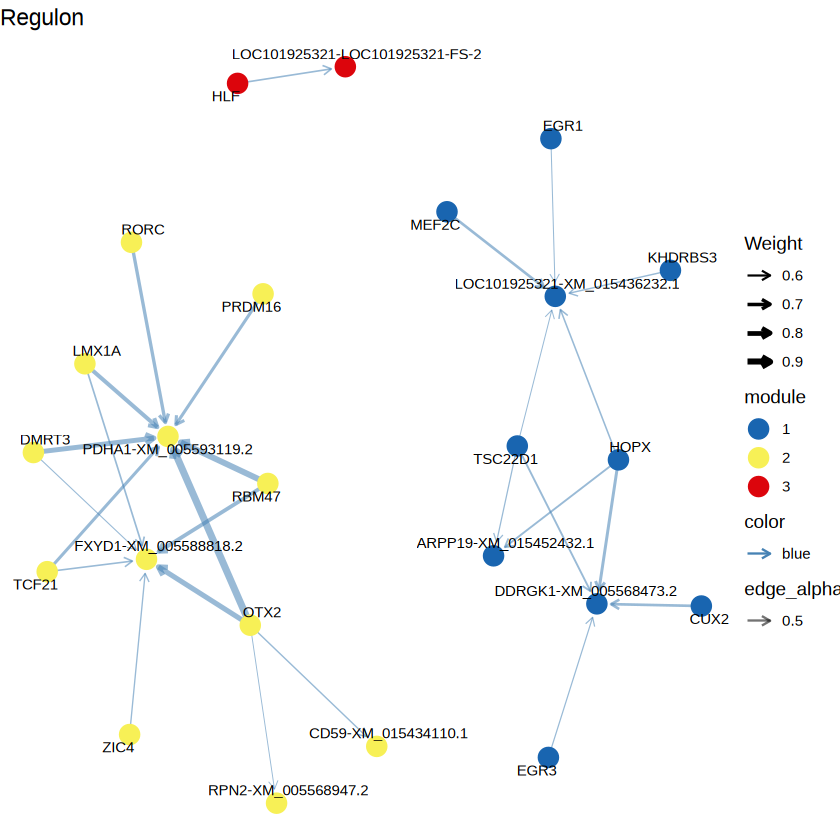

In [309]:
pg = ggraph(g_tidy, layout = "fr") + # "fr"是一种力导向布局，能使联系紧密的节点聚在一起
  geom_edge_link(aes(edge_width = width, edge_color = color, alpha = 0.5),
                 arrow = arrow(length = unit(2, 'mm')), 
                 end_cap = circle(3, 'mm')) +
  scale_edge_width_continuous(range = c(0.2, 1.5)) +
  scale_edge_color_manual(values = c("red" = "tomato", "blue" = "steelblue")) +
  geom_node_point(aes(color = module), size = 5) + # 按模块给节点上色
  geom_node_text(aes(label = name), repel = TRUE, size = 3) + # 节点标签，避免重叠
  scale_color_discreterainbow() +
  theme_void() +
  labs(title = "Regulon",
       edge_width = "Weight")
pg

In [ ]:
set.seed(123) # 保证图形可重现
#E(g)$weight <- abs(E(g)$weight)
#g_tidy <- as_tbl_graph(g)
pg = ggraph(g_tidy, layout = "fr") + # "fr"是一种力导向布局，能使联系紧密的节点聚在一起
  geom_edge_link(aes(edge_width = width, edge_color = color, alpha = 0.5),
                 arrow = arrow(length = unit(2, 'mm')), 
                 end_cap = circle(3, 'mm')) +
  scale_edge_width_continuous(range = c(0.2, 1.5)) +
  scale_edge_color_manual(values = c("red" = "tomato", "blue" = "steelblue")) +
  geom_node_point(aes(color = module), size = 5) + # 按模块给节点上色
  geom_node_text(aes(label = name), repel = TRUE, size = 3) + # 节点标签，避免重叠
  scale_color_discreterainbow() +
  theme_void() +
  labs(title = "Regulon",
       edge_width = "Weight")
pg
ggexport(pg,filename = "result/figure_revision/regulon_bin200_network_graph_fil_25_10_20.pdf",width = 10,height = 10)

#plot no text
pgn = ggraph(g_tidy, layout = "fr") + # "fr"是一种力导向布局，能使联系紧密的节点聚在一起
  geom_edge_link(aes(edge_width = width, edge_color = color, alpha = 0.5),
                 arrow = arrow(length = unit(2, 'mm')), 
                 end_cap = circle(3, 'mm')) +
  scale_edge_width_continuous(range = c(0.2, 1.5)) +
  scale_edge_color_manual(values = c("red" = "tomato", "blue" = "steelblue")) +
  geom_node_point(aes(color = module), size = 5) + # 按模块给节点上色
  #geom_node_text(aes(label = name), repel = TRUE, size = 3) + # 节点标签，避免重叠
  scale_color_discreterainbow() +
  theme_void() +
  labs(title = "Regulon",
       edge_width = "Weight")
pgn
ggexport(pgn,filename = "result/figure_revision/regulon_bin200_network_graph_notext_fil_25_12_11.pdf",
         width = 10,height = 10)


In [310]:
moduledf = as.data.frame(g_tidy)
qsave(g_tidy,file = "result/figure_revision/regulon_bin200_network_fil_12_19.qs")

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure_revision/regulon_bin400_network_graph_isoform_ratio_cases_25_12_19.p

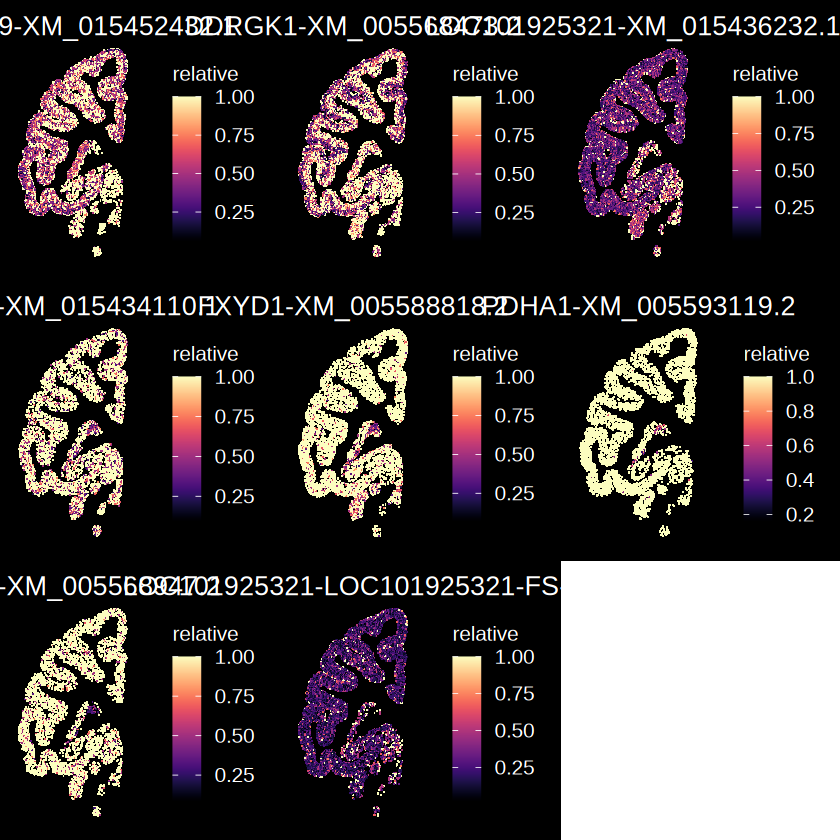

In [311]:
transtl.case = transtl.bl
transtl.case$name = paste0(transtl.case$gene_id,"-",transtl.case$transcript_id)
transtl.case = merge(transtl.case,moduledf,by = "name")
transtl.case$x = as.numeric(MySplit(transtl.case$blockid,"_",1))
transtl.case$y = as.numeric(MySplit(transtl.case$blockid,"_",2))
transtl.case = transtl.case[order(transtl.case$module),]
caseid = unique(transtl.case$name)
pcasels1 = list()
for(i in 1:length(caseid)){
    pi = ggplot(transtl.case[transtl.case$name == caseid[i],],aes(x = x,y = y,fill = relative)) + 
                        geom_tile() + scale_fill_viridis(option = "A") + 
                        theme_presentation() + 
                        scale_x_reverse() + scale_y_reverse() + 
                        ggtitle(caseid[i])
    pcasels1[[i]] = pi
}
pcaset1 = ggarrange(plotlist = pcasels1,nrow = 3,ncol = 3)
pcaset1
ggexport(pcaset1,filename = "result/figure_revision/regulon_bin400_network_graph_isoform_ratio_cases_25_12_19.pdf",
         width = 9,height = 10)

[1] 24

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

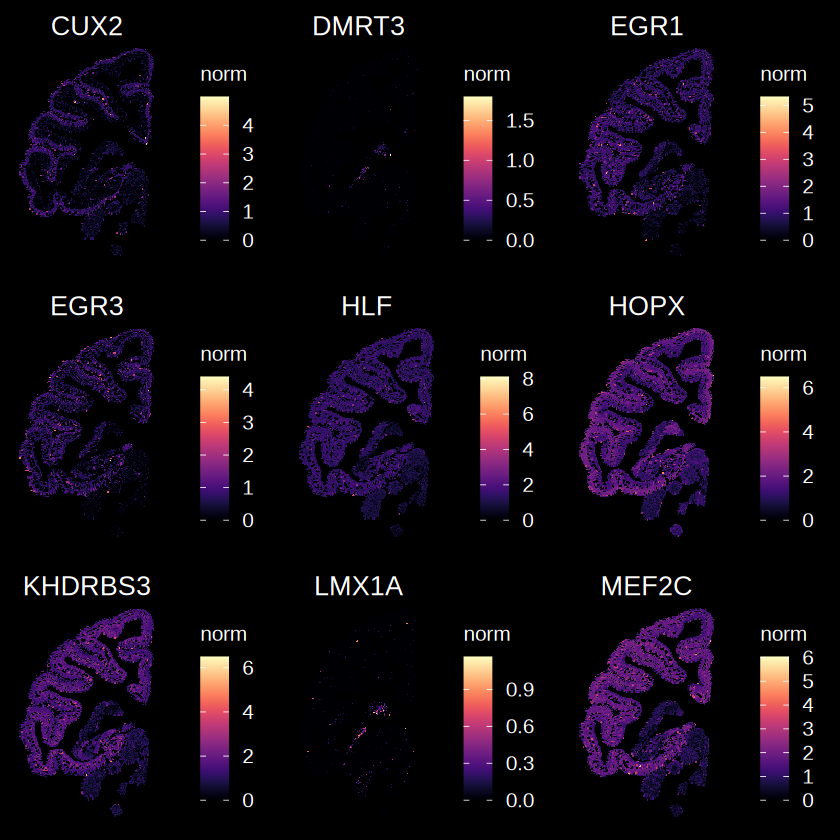

$`1`

$`2`

$`3`

attr(,"class")
[1] "list"      "ggarrange"

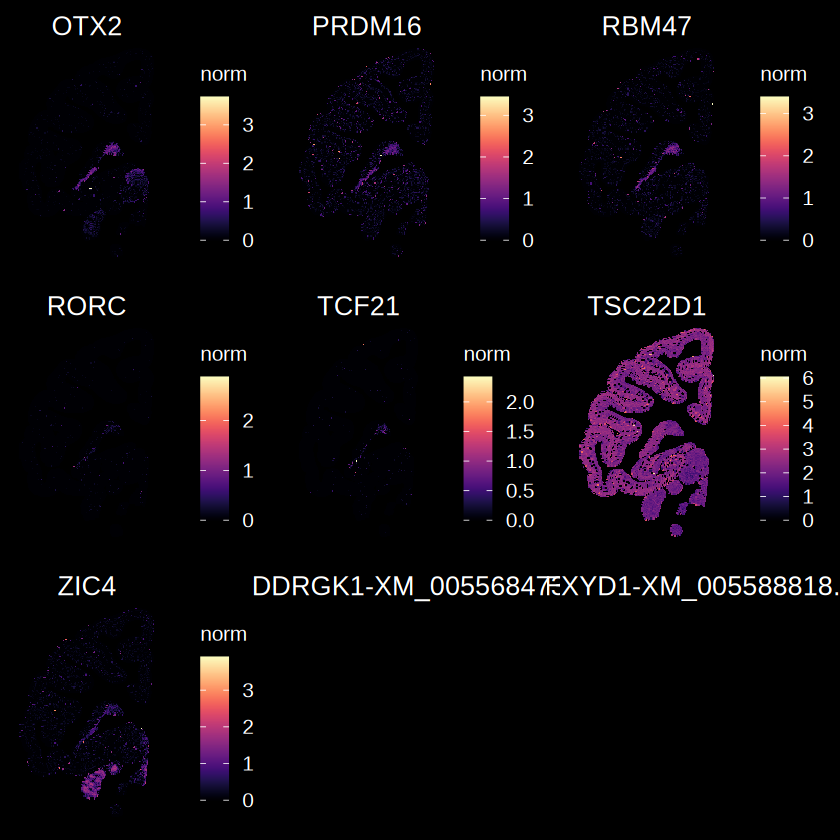

file saved to result/figure_revision/regulon_bin200_network_graph_gene_norm_cases_25_12_19.pdf



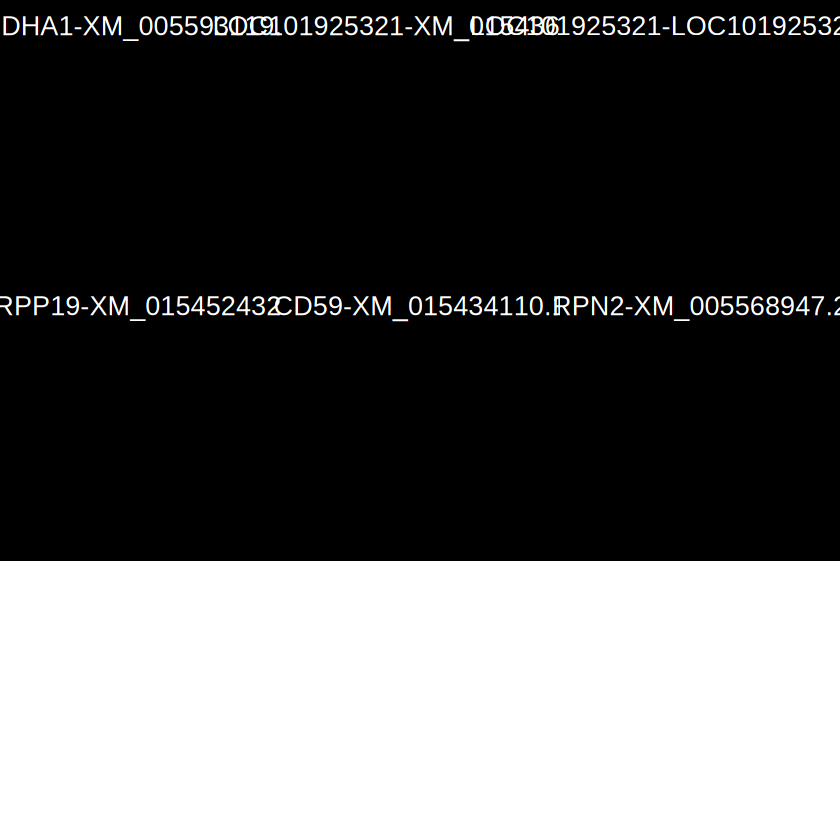

In [318]:
#show case plot
# genedf = melt(genemx.bl.hub)
# head(genedf)
# colnames(genedf) = c("Metacell","gene_id","norm")
# genedf$Metacell = as.character(genedf$Metacell)
# genedf$gene_id = as.character(genedf$gene_id)
# genedf$coord = MySplit(genedf$Metacell,"-",5)
# genedf = merge(genedf,moduledf,by.x = "gene_id",by.y = "name")
# genedf[genedf$module == "1",]
# genedf = genedf %>% group_by(coord,module) %>% summarise(norm = mean(norm))
# genedf = genedf[!is.na(genedf$norm),]
# genedf$x = as.numeric(MySplit(genedf$coord,"_",1))
# genedf$y = as.numeric(MySplit(genedf$coord,"_",2))
# head(genedf)
# ggplot(genedf,aes(x = x,y = y,fill = norm)) + geom_tile() + scale_fill_viridis(option = "A") + theme_presentation() + 
#                         scale_x_reverse() + scale_y_reverse() + facet_wrap(~module)
# moduleid = unique(genedf$module)
geneids = unique(moduledf$name)
pcasels = list()
length(geneids)
for(i in 1:length(geneids)){
    pi = ggplot(genedf[genedf$gene_id == geneids[i],],aes(x = x,y = y,fill = norm)) + geom_tile() + scale_fill_viridis(option = "A") + 
                        theme_presentation() + 
                        scale_x_reverse() + scale_y_reverse() + ggtitle(paste0(geneids[i]))
    pcasels[[i]] = pi
}
# length(moduleid)
pcaset = ggarrange(plotlist = pcasels,nrow = 3,ncol = 3)
pcaset
ggexport(pcaset,filename = "result/figure_revision/regulon_bin200_network_graph_gene_norm_cases_25_12_19.pdf",
         width = 9,height = 10)

In [326]:
moduledf[moduledf$module  == "2",]$name

[1] "DMRT3"                "LMX1A"                "OTX2"                
 [4] "PRDM16"               "RBM47"                "RORC"                
 [7] "TCF21"                "ZIC4"                 "FXYD1-XM_005588818.2"
[10] "PDHA1-XM_005593119.2" "CD59-XM_015434110.1"  "RPN2-XM_005568947.2"

[1] 3

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure_revision/regulon_bin200_network_graph_gene_module_norm_cases_25_12_19.pdf



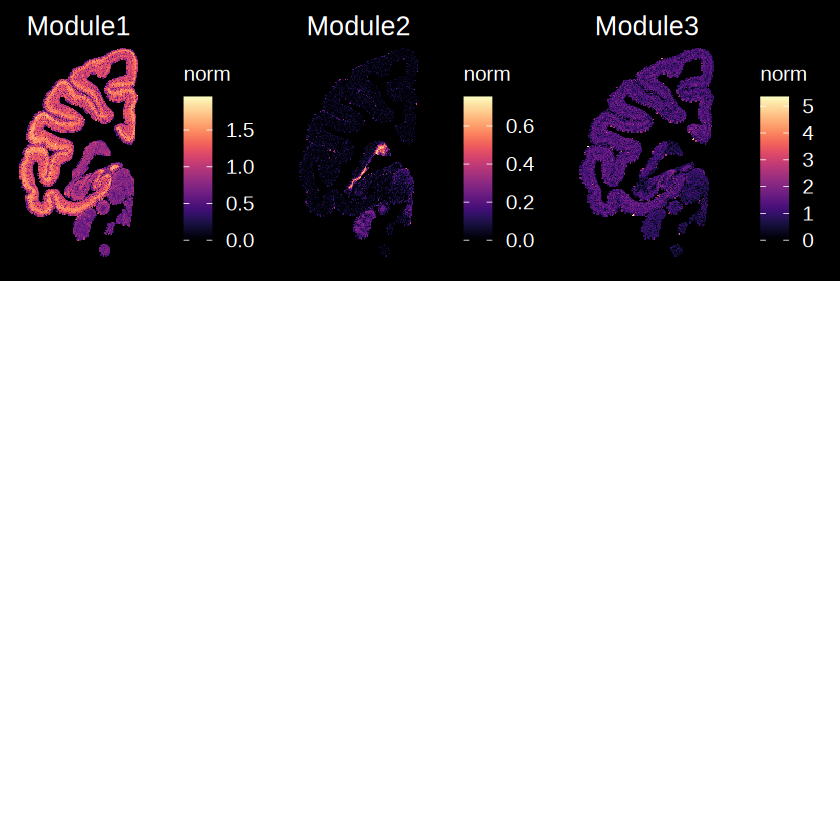

In [321]:
#show case plot
# genedf = melt(genemx.bl.hub)
# head(genedf)
# colnames(genedf) = c("Metacell","gene_id","norm")
# genedf$Metacell = as.character(genedf$Metacell)
# genedf$gene_id = as.character(genedf$gene_id)
# genedf$coord = MySplit(genedf$Metacell,"-",5)
# genedf = merge(genedf,moduledf,by.x = "gene_id",by.y = "name")
# # genedf[genedf$module == "1",]
# genedf = genedf %>% group_by(coord,module) %>% summarise(norm = mean(norm))
# genedf = genedf[!is.na(genedf$norm),]
genedf$x = as.numeric(MySplit(genedf$coord,"_",1))
genedf$y = as.numeric(MySplit(genedf$coord,"_",2))
# head(genedf)
# ggplot(genedf,aes(x = x,y = y,fill = norm)) + geom_tile() + scale_fill_viridis(option = "A") + theme_presentation() + 
#                         scale_x_reverse() + scale_y_reverse() + facet_wrap(~module)
moduleid = unique(genedf$module)
pcasels = list()
for(i in 1:length(moduleid)){
    pi = ggplot(genedf[genedf$module == moduleid[i],],aes(x = x,y = y,fill = norm)) + geom_tile() + scale_fill_viridis(option = "A") + 
                        theme_presentation() + 
                        scale_x_reverse() + scale_y_reverse() + ggtitle(paste0("Module",moduleid[i]))
    pcasels[[i]] = pi
}
length(moduleid)
pcaset = ggarrange(plotlist = pcasels,nrow = 3,ncol = 3)
pcaset
ggexport(pcaset,filename = "result/figure_revision/regulon_bin200_network_graph_gene_module_norm_cases_25_12_19.pdf",
         width = 9,height = 10)

In [ ]:
genedf = melt(genemx.bl.hub)
head(genedf)
colnames(genedf) = c("Metacell","gene_id","norm")
genedf$Metacell = as.character(genedf$Metacell)
genedf$gene_id = as.character(genedf$gene_id)
genedf$coord = MySplit(genedf$Metacell,"-",5)
genedf = merge(genedf,moduledf,by.x = "gene_id",by.y = "name")
genedf[genedf$module == "1",]
genedf = genedf %>% group_by(coord,module) %>% summarise(norm = mean(norm))
genedf = genedf[!is.na(genedf$norm),]
genedf$x = as.numeric(MySplit(genedf$coord,"_",1))
genedf$y = as.numeric(MySplit(genedf$coord,"_",2))
# head(genedf)
# ggplot(genedf,aes(x = x,y = y,fill = norm)) + geom_tile() + scale_fill_viridis(option = "A") + theme_presentation() + 
#                         scale_x_reverse() + scale_y_reverse() + facet_wrap(~module)
moduleid = unique(genedf$module)
pcasels = list()
for(i in 1:length(moduleid)){
    pi = ggplot(genedf[genedf$module == moduleid[i],],aes(x = x,y = y,fill = norm)) + geom_tile() + scale_fill_viridis(option = "A") + 
                        theme_presentation() + 
                        scale_x_reverse() + scale_y_reverse() + ggtitle(paste0("Module",moduleid[i]))
    pcasels[[i]] = pi
}
length(moduleid)
pcaset = ggarrange(plotlist = pcasels,nrow = 3,ncol = 3)
pcaset
ggexport(pcaset,filename = "result/figure_revision/regulon_bin400_network_graph_gene_norm_cases_25_10_20.pdf",
         width = 9,height = 10)

##### Celltype

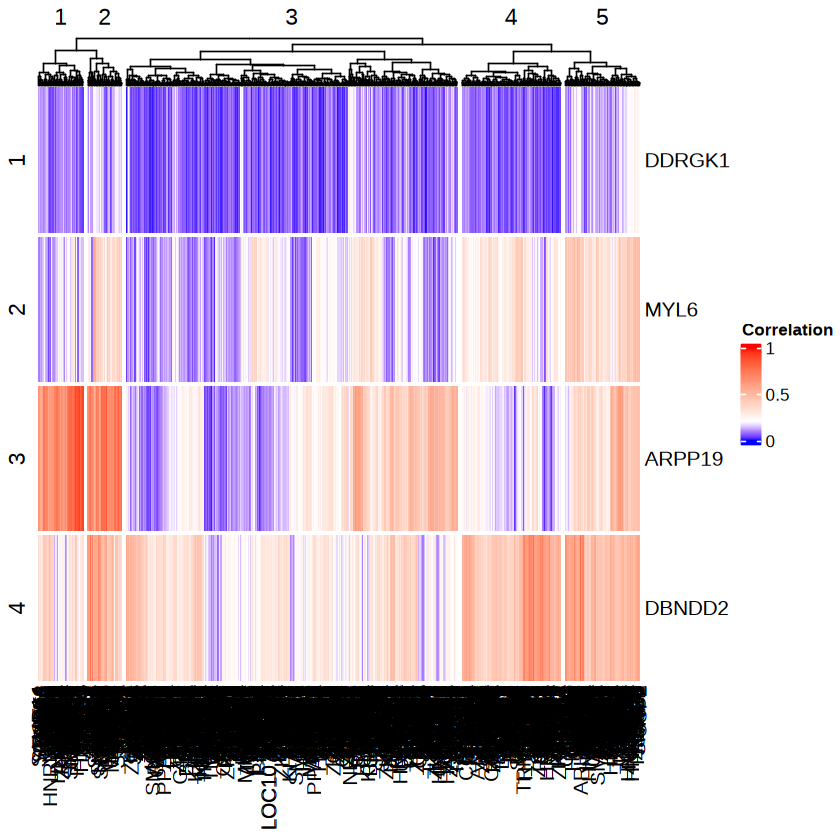

In [109]:
library(ComplexHeatmap)
library(circlize)
cordf.fil = cordf.cl.fil
# 假设您的数据框名为df，包含列：Var1, var2, cor, pvalue
# 获取所有唯一变量
all_vars <- unique(c(cordf.fil$gene_id, cordf.fil$SF))

# 创建相关性矩阵和p值矩阵
mat_cor = dcast(cordf.fil,gene_id~SF,value.var = "cor",fun.aggregate = sum)
rownames(mat_cor) = mat_cor$gene_id;mat_cor = mat_cor[,-1]
mat_cor = as.matrix(mat_cor)

mat_p = dcast(cordf.fil,gene_id~SF,value.var = "padj",fun.aggregate = mean,fill = 1)
rownames(mat_p) = mat_p$gene_id;mat_p = mat_p[,-1]
mat_p = as.matrix(mat_p)

# 步骤3: 设置颜色映射
col_fun <- colorRamp2(c(-1, 0, 1), c("blue", "white", "red"))

# 步骤4: 绘制热图
#pdf("result/figure_revision/isoform_TF_RBP_SF_DTU_cor_heatmap.pdf",width = 10, height = 6)
pt = Heatmap(mat_cor, 
        name = "Correlation", 
        col = col_fun,
        show_row_dend = FALSE,column_split = 8,row_split = 5,  # 禁用默认矩形绘制，以便自定义[2](@ref)
        cluster_rows = TRUE,
        cluster_columns = TRUE,
        show_row_names = TRUE,
        show_column_names = TRUE,
        heatmap_legend_param = list(title = "Correlation"))
#dev.off()
col_fun <- colorRamp2(c(0, 0.2, 1), c("blue", "white", "red"))
pt = Heatmap(abs(mat_cor[rownames(mat_cor) %in% c("DDRGK1","ARPP19","MYL6","DBNDD2"),]), 
        name = "Correlation", 
        col = col_fun,
        show_row_dend = FALSE,column_split = 5,row_split = 8,  # 禁用默认矩形绘制，以便自定义[2](@ref)
        cluster_rows = TRUE,
        cluster_columns = TRUE,
        show_row_names = TRUE,
        show_column_names = TRUE,
        heatmap_legend_param = list(title = "Correlation"))
print(pt)

In [124]:
# 加载必要的R包
library(dplyr)
library(igraph)
library(ggraph)
library(tidygraph)

# 1. 数据预处理：筛选显著的边，并创建网络边列表
# 设定显著性阈值，例如 p < 0.05
cordf.fil = cordf.cl.fil
cordf.fil$dtu = paste0(cordf.fil$gene_id,"-",cordf.fil$transcript_id)
cordf.fil$corv = abs(cordf.fil$cor)
#cordf.fil = cordf.fil %>% group_by(gene_id) %>% mutate(transnum = length(unique(transcript_id)))
cordf.fil = cordf.fil[cordf.fil$gene_id != cordf.fil$SF,]
#cordf.fil = cordf.fil[cordf.fil$transnum == 1 | cordf.fil$transcript_id %in% isosigi.fil$transcript_id,]
network_edges <- cordf.fil[,c("dtu","SF","corv","cor","padj")] %>%
  filter(padj < 0.05) %>% # 过滤显著相关的配对
  select(from = SF, to = dtu, weight = cor) # 定义网络边：var2 -> var1，权重为相关性
#network_edges

# 2. 创建igraph网络对象
g <- graph_from_data_frame(network_edges, directed = TRUE)

# 为边和节点添加一些属性，便于后续可视化
E(g)$width <- abs(E(g)$weight) * 2 # 边宽代表相关性的绝对值（强度）
E(g)$color <- ifelse(E(g)$weight > 0, "red", "blue") # 边颜色代表正负相关（红正蓝负）
E(g)$weight <- abs(E(g)$weight)
# 查看网络基本信息
summary(g)

# 方法1：使用贪心优化算法（常用且快速）
#cluster_eb <- cluster_edge_betweenness(as.undirected(g), weights = E(g)$weight)
cluster_fast_greedy <- cluster_fast_greedy(as.undirected(g)) # 许多算法需要无向图
membership_fg <- membership(cluster_fast_greedy)

# 方法2：使用随机游走算法（适合有向网络）
cluster_walktrap <- cluster_edge_betweenness(g)
membership_wt <- membership(cluster_walktrap)
#cluster_walktrap <- cluster_leiden(as.undirected(g), objective_function = "modularity")

# 将聚类结果作为节点属性加入网络
V(g)$module <- as.character(membership_fg) # 使用walktrap的结果作为模块标签

# 使用ggraph和tidygraph进行现代化网络可视化
g_tidy <- as_tbl_graph(g)

IGRAPH 6e85440 DNW- 1404 30489 -- 
+ attr: name (v/c), weight (e/n), width (e/n), color (e/c)


Warning message in cluster_edge_betweenness(g):
"At core/community/edge_betweenness.c:492 : Membership vector will be selected based on the highest modularity score."


In [133]:
summary(cordf.fil[cordf.fil$padj < 0.05 & cordf.fil$gene_id == "MYL6",]$cor)
cordf.hub = cordf.fil[cordf.fil$padj < 0.05 & cordf.fil$gene_id == "MYL6",]
cordf.hub[order(-abs(cordf.hub$cor)),]

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-0.61039 -0.37761 -0.19325 -0.03538  0.36256  0.50715 

gene_id,transcript_id,cor,pvalue,SF,padj,maxcor,dtu,corv
<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>
MYL6,MYL6-FS-3,-0.6103908,9.469899e-29,PCBP1,7.922366e-23,0.6103908,MYL6-MYL6-FS-3,0.6103908
MYL6,MYL6-FS-3,-0.5439729,4.836929e-22,SNRPD1,4.030342e-16,0.5439729,MYL6-MYL6-FS-3,0.5439729
MYL6,MYL6-FS-3,-0.5239656,2.674231e-20,SNRPG,2.222896e-14,0.5239656,MYL6-MYL6-FS-3,0.5239656
MYL6,MYL6-FS-3,0.5071507,6.385733e-19,NCOR1,5.294016e-13,0.5071507,MYL6-MYL6-FS-3,0.5071507
MYL6,MYL6-FS-3,-0.5010757,1.925900e-18,MATR3,1.594925e-12,0.5010757,MYL6-MYL6-FS-3,0.5010757
MYL6,MYL6-FS-3,-0.5010590,1.931702e-18,SUB1,1.599719e-12,0.5010590,MYL6-MYL6-FS-3,0.5010590
MYL6,MYL6-FS-3,0.4942284,6.511582e-18,TCF4,5.385599e-12,0.4942284,MYL6-MYL6-FS-3,0.4942284
MYL6,MYL6-FS-3,0.4920184,9.592323e-18,TCF12,7.929753e-12,0.4920184,MYL6-MYL6-FS-3,0.4920184
MYL6,MYL6-FS-3,-0.4871912,2.214080e-17,FOXG1,1.828412e-11,0.4871912,MYL6-MYL6-FS-3,0.4871912


[1] "核心DTU节点: ACOT8-XM_015429891.1, ACP1-ACP1-FS-1, AIDA-XM_015440188.1, ALKBH6-XM_005588928.2, ATG7-XM_005547834.2, BAG6-XM_005553518.1, BCCIP-XM_005566720.2, BID-BID-FS-1, C13H2orf49-XM_005575183.2, C8H8orf33-C8H8orf33-FS-1, CAMKK2-XM_005572436.2, CAPZB-XM_015441722.1, CCDC90B-XM_015435555.1, CCNG2-XM_005554983.2, CD47-XR_001488936.1"
[1] "原网络节点数: 1404"
[1] "核心DTU网络节点数: 531"
[1] "其中SF节点数: 516"
[1] "其中DTU节点数: 15"


Warning message in title(...):
"conversion failure on '基于DTU的核心网络' in 'mbcsToSbcs': dot substituted for <e5>"
Warning message in title(...):
"conversion failure on '基于DTU的核心网络' in 'mbcsToSbcs': dot substituted for <9f>"
Warning message in title(...):
"conversion failure on '基于DTU的核心网络' in 'mbcsToSbcs': dot substituted for <ba>"
Warning message in title(...):
"conversion failure on '基于DTU的核心网络' in 'mbcsToSbcs': dot substituted for <e4>"
Warning message in title(...):
"conversion failure on '基于DTU的核心网络' in 'mbcsToSbcs': dot substituted for <ba>"
Warning message in title(...):
"conversion failure on '基于DTU的核心网络' in 'mbcsToSbcs': dot substituted for <8e>"
Warning message in title(...):
"conversion failure on '基于DTU的核心网络' in 'mbcsToSbcs': dot substituted for <e7>"
Warning message in title(...):
"conversion failure on '基于DTU的核心网络' in 'mbcsToSbcs': dot substituted for <9a>"
Warning message in title(...):
"conversion failure on '基于DTU的核心网络' in 'mbcsToSbcs': dot substituted for <84>"
Warning me

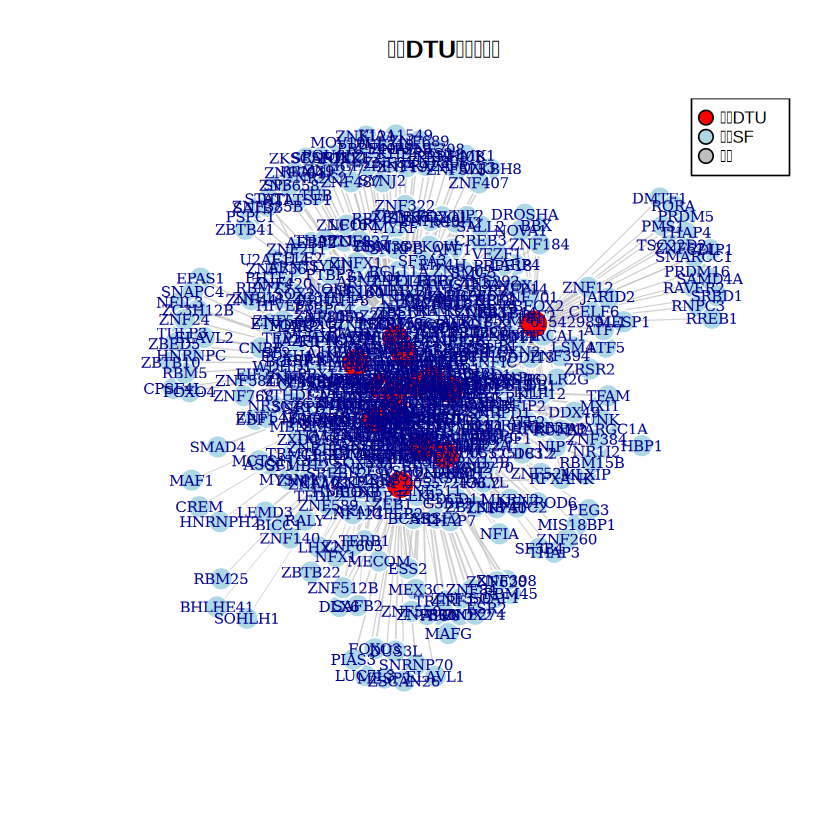

        Metric     Original         Core Reduction
1     节点总数 1.404000e+03  531.0000000     62.2%
2       边总数 3.048900e+04 2284.0000000     92.5%
3       平均度 4.343162e+01    8.6026365     80.2%
4     网络直径 9.872884e-01    0.8523739     13.7%
5 平均路径长度 4.412691e-01    0.4856762    -10.1%
6     聚类系数 0.000000e+00    0.0000000      NaN%
                                           DTU_Node Composite_Score Degree
ACOT8-XM_015429891.1           ACOT8-XM_015429891.1             NaN    105
ACP1-ACP1-FS-1                       ACP1-ACP1-FS-1             NaN    131
AIDA-XM_015440188.1             AIDA-XM_015440188.1             NaN    369
ALKBH6-XM_005588928.2         ALKBH6-XM_005588928.2             NaN     65
ATG7-XM_005547834.2             ATG7-XM_005547834.2             NaN    231
BAG6-XM_005553518.1             BAG6-XM_005553518.1             NaN    103
BCCIP-XM_005566720.2           BCCIP-XM_005566720.2             NaN    187
BID-BID-FS-1                           BID-BID-FS-1             NaN

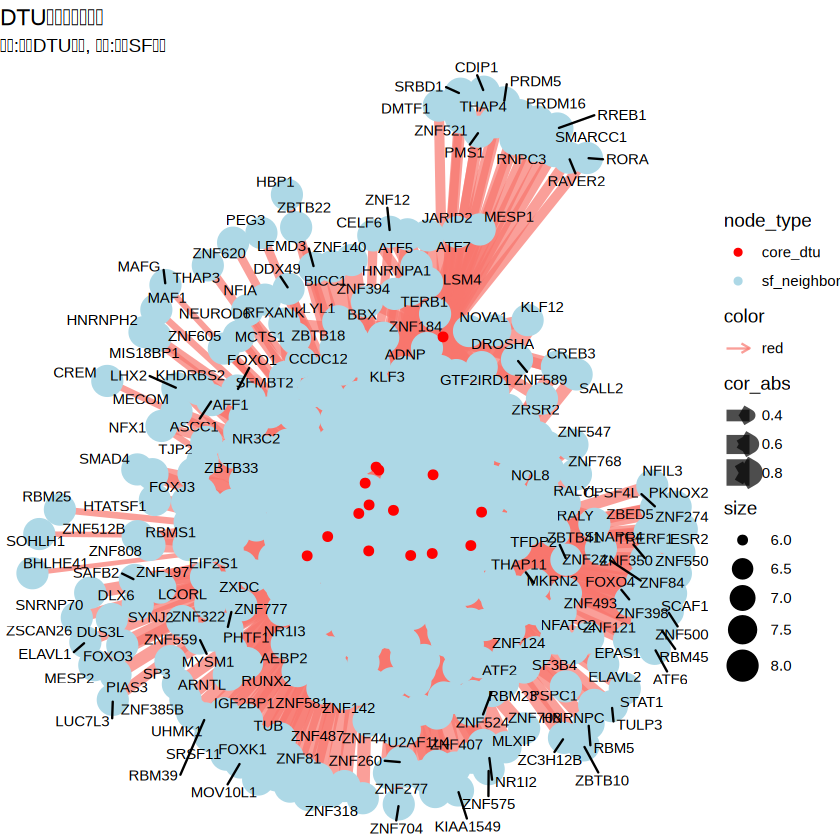

In [128]:
# 加载必要的R包
library(dplyr)
library(igraph)
library(ggraph)
library(tidygraph)

# 数据预处理：筛选显著的边，并创建网络边列表
cordf.fil = cordf.cl.fil
cordf.fil$dtu = paste0(cordf.fil$gene_id, "-", cordf.fil$transcript_id)
cordf.fil$corv = abs(cordf.fil$cor)
cordf.fil = cordf.fil[cordf.fil$gene_id != cordf.fil$SF,]

# 创建网络边
network_edges <- cordf.fil[,c("dtu","SF","corv","cor","padj")] %>%
  filter(padj < 0.05) %>%
  select(from = SF, to = dtu, weight = corv, cor_abs = corv, padj)

# 创建igraph网络对象
g <- graph_from_data_frame(network_edges, directed = TRUE)

# 设置边和节点属性
E(g)$width <- abs(E(g)$weight) * 2
E(g)$color <- ifelse(E(g)$weight > 0, "red", "blue")
E(g)$weight_abs <- abs(E(g)$weight)

# 标记节点类型
V(g)$type <- ifelse(V(g)$name %in% unique(network_edges$from), "SF", "DTU")
V(g)$color <- ifelse(V(g)$type == "SF", "lightblue", "lightcoral")
V(g)$size <- ifelse(V(g)$type == "SF", 8, 6)

# 方法1: 基于DTU节点的多指标综合评分法[1,4](@ref)
identify_dtu_core_nodes <- function(graph, top_k = 20, method = "composite") {
  
  # 只对DTU节点进行分析
  dtu_nodes <- which(V(graph)$type == "DTU")
  
  if (length(dtu_nodes) == 0) {
    stop("没有找到DTU节点")
  }
  
  if (method == "composite") {
    # 计算多种中心性指标（只对DTU节点）
    dtu_degrees <- degree(graph, v = dtu_nodes, mode = "in")  # DTU的入度（被多少SF调控）
    dtu_betweenness <- betweenness(graph, v = dtu_nodes, normalized = TRUE)
    dtu_pagerank <- page_rank(graph)$vector[dtu_nodes]
    
    # 归一化处理
    normalized_degree <- dtu_degrees / max(dtu_degrees)
    normalized_betweenness <- dtu_betweenness / max(dtu_betweenness)
    normalized_pagerank <- dtu_pagerank / max(dtu_pagerank)
    
    # 加权综合得分（调整权重以强调DTU的重要性）
    composite_scores <- (0.3 * normalized_degree) + 
                       (0.4 * normalized_betweenness) + 
                       (0.3 * normalized_pagerank)
    
    # 为DTU节点添加得分
    V(graph)$composite_score <- NA
    V(graph)$composite_score[dtu_nodes] <- composite_scores
    
    # 按综合得分排序选择核心DTU节点
    dtu_scores <- composite_scores
    names(dtu_scores) <- V(graph)$name[dtu_nodes]
    sorted_dtu <- dtu_scores[order(-dtu_scores)]
    
    # 选择前top_k个DTU节点
    selected_dtu <- names(sorted_dtu)[1:min(top_k, length(sorted_dtu))]
    core_indices <- which(V(graph)$name %in% selected_dtu)
    
  } else if (method == "k_core") {
    # 方法2: k核分解[1](@ref)
    coreness <- graph.coreness(graph, mode = "in")
    V(graph)$coreness <- coreness
    dtu_coreness <- coreness[dtu_nodes]
    
    # 选择k-core值最高的DTU节点
    max_core <- max(dtu_coreness)
    core_dtu_nodes <- dtu_nodes[dtu_coreness == max_core]
    core_indices <- core_dtu_nodes[1:min(top_k, length(core_dtu_nodes))]
    
  } else if (method == "community_based") {
    # 方法3: 基于社区结构的核心节点提取[6](@ref)
    community <- cluster_louvain(as.undirected(graph))
    V(graph)$community <- membership(community)
    
    # 从包含DTU的每个社区中选择top节点
    core_indices <- c()
    dtu_communities <- unique(V(graph)$community[dtu_nodes])
    
    nodes_per_community <- ceiling(top_k / length(dtu_communities))
    
    for (comm_id in dtu_communities) {
      comm_dtu_nodes <- dtu_nodes[V(graph)$community[dtu_nodes] == comm_id]
      if (length(comm_dtu_nodes) > 0) {
        # 在社区内按入度排序（被多少SF调控）
        comm_degrees <- degree(graph, v = comm_dtu_nodes, mode = "in")
        top_comm_nodes <- comm_dtu_nodes[order(-comm_degrees)[1:min(nodes_per_community, length(comm_dtu_nodes))]]
        core_indices <- c(core_indices, top_comm_nodes)
      }
    }
    core_indices <- core_indices[1:min(top_k, length(core_indices))]
  }
  
  return(list(core_indices = core_indices, graph = graph))
}

# 使用综合评分法识别核心DTU节点
result <- identify_dtu_core_nodes(g, top_k = 15, method = "composite")
core_dtu_indices <- result$core_indices
g <- result$graph

# 查看核心DTU节点
core_dtu_nodes <- V(g)$name[core_dtu_indices]
print(paste("核心DTU节点:", paste(core_dtu_nodes, collapse = ", ")))

# 方法2: 网络遍历度方法（专门寻找拓扑中心节点）[5](@ref)
find_network_center <- function(graph) {
  # 计算所有节点对之间的最短路径
  shortest_paths <- distances(graph, mode = "all")
  
  # 计算每个节点的遍历度（到其他节点的最大最短路径）
  node_traversal <- apply(shortest_paths, 1, max, na.rm = TRUE)
  
  # 找到网络遍历度（最小的节点遍历度）
  network_traversal <- min(node_traversal, na.rm = TRUE)
  
  # 找到中心节点（遍历度等于网络遍历度的节点）
  center_nodes <- which(node_traversal == network_traversal)
  
  V(graph)$traversal_degree <- node_traversal
  V(graph)$is_center <- FALSE
  V(graph)$is_center[center_nodes] <- TRUE
  
  return(list(center_indices = center_nodes, graph = graph))
}

# 寻找网络中心节点
center_result <- find_network_center(g)
center_nodes <- center_result$center_indices
g <- center_result$graph

# 提取核心DTU节点及其关联的SF节点
extract_core_network <- function(graph, core_dtu_indices, include_sf_neighbors = TRUE) {
  
  if (include_sf_neighbors) {
    # 提取核心DTU节点及其直接相连的SF节点
    dtu_with_sf <- neighborhood(graph, order = 1, nodes = core_dtu_indices, mode = "in")
    all_nodes_to_keep <- unique(unlist(dtu_with_sf))
    
    subg <- induced_subgraph(graph, vids = all_nodes_to_keep)
    
    # 标记节点类型
    V(subg)$node_type <- ifelse(V(subg)$name %in% V(graph)$name[core_dtu_indices], 
                               "core_dtu", 
                               ifelse(V(subg)$type == "SF", "sf_neighbor", "other"))
  } else {
    # 仅包含核心DTU节点
    subg <- induced_subgraph(graph, vids = core_dtu_indices)
    V(subg)$node_type <- "core_dtu"
  }
  
  return(subg)
}

# 提取核心网络
g_core_dtu <- extract_core_network(g, core_dtu_indices, include_sf_neighbors = TRUE)

# 输出网络基本信息
print(paste("原网络节点数:", vcount(g)))
print(paste("核心DTU网络节点数:", vcount(g_core_dtu)))
print(paste("其中SF节点数:", sum(V(g_core_dtu)$type == "SF")))
print(paste("其中DTU节点数:", sum(V(g_core_dtu)$type == "DTU")))

# 可视化核心网络
visualize_core_network <- function(graph, title = "DTU核心网络") {
  
  # 设置节点属性用于可视化
  V(graph)$size <- ifelse(V(graph)$node_type == "core_dtu", 10,
                         ifelse(V(graph)$node_type == "sf_neighbor", 8, 4))
  
  V(graph)$color <- ifelse(V(graph)$node_type == "core_dtu", "red",
                          ifelse(V(graph)$node_type == "sf_neighbor", "lightblue", "gray"))
  
  # 使用Fruchterman-Reingold布局
  layout <- layout_with_fr(graph)
  
  plot(graph, 
       layout = layout,
       vertex.label = ifelse(V(graph)$size >= 8, V(graph)$name, NA),
       vertex.frame.color = "white",
       vertex.label.cex = 0.7,
       edge.arrow.size = 0.3,
       edge.color = adjustcolor("gray", alpha.f = 0.7),
       main = title)
  
  legend("topright", 
         legend = c("核心DTU", "关联SF", "其他"),
         pt.bg = c("red", "lightblue", "gray"),
         pch = 21,
         pt.cex = 1.5,
         cex = 0.8)
}

# 可视化
visualize_core_network(g_core_dtu, "基于DTU的核心网络")

# 使用ggraph进行更高级的可视化
if ("ggraph" %in% installed.packages()[,1]) {
  g_core_tidy <- as_tbl_graph(g_core_dtu)
  
  p <- ggraph(g_core_tidy, layout = "fr") +
    geom_edge_link(aes(edge_color = color, edge_width = cor_abs), 
                   alpha = 0.7, 
                   arrow = arrow(length = unit(2, 'mm'))) +
    geom_node_point(aes(color = node_type, size = size)) +
    geom_node_text(aes(label = name, filter = node_type != "other"), 
                   repel = TRUE, size = 3) +
    scale_color_manual(values = c("core_dtu" = "red", 
                                  "sf_neighbor" = "lightblue", 
                                  "other" = "gray")) +
    scale_size_continuous(range = c(2, 8)) +
    theme_void() +
    labs(title = "DTU核心网络可视化",
         subtitle = "红色:核心DTU节点, 蓝色:关联SF节点")
  
  print(p)
}

# 网络指标分析
analyze_core_network <- function(original_g, core_g) {
  metrics <- data.frame(
    Metric = c("节点总数", "边总数", "平均度", "网络直径", "平均路径长度", "聚类系数"),
    Original = c(vcount(original_g), 
                ecount(original_g), 
                mean(degree(original_g)), 
                diameter(original_g),
                mean_distance(original_g),
                transitivity(original_g)),
    Core = c(vcount(core_g), 
             ecount(core_g), 
             mean(degree(core_g)), 
             diameter(core_g),
             mean_distance(core_g),
             transitivity(core_g))
  )
  
  metrics$Reduction <- paste0(round((1 - metrics$Core / metrics$Original) * 100, 1), "%")
  return(metrics)
}

# 比较网络指标
metric_comparison <- analyze_core_network(g, g_core_dtu)
print(metric_comparison)

# 保存结果
save_core_network_results <- function(graph, core_indices, filename = "dtu_core_network") {
  
  # 创建结果数据框
  core_dtu_info <- data.frame(
    DTU_Node = V(graph)$name[core_indices],
    Composite_Score = V(graph)$composite_score[core_indices],
    Degree = degree(graph, v = core_indices, mode = "in"),
    Betweenness = betweenness(graph, v = core_indices),
    PageRank = page_rank(graph)$vector[core_indices],
    Node_Type = V(graph)$type[core_indices]
  )
  
  # 按综合得分排序
  core_dtu_info <- core_dtu_info[order(-core_dtu_info$Composite_Score), ]
  
  # 保存为CSV文件
  write.csv(core_dtu_info, paste0(filename, "_nodes.csv"), row.names = FALSE)
  
  # 保存网络为GraphML格式
  write.graph(graph, paste0(filename, ".graphml"), format = "graphml")
  
  return(core_dtu_info)
}

# 保存结果
results <- save_core_network_results(g, core_dtu_indices, "result/figure_revision/dtu_core_analysis")
print(results)

In [119]:
# 计算节点度（直接连接数）
V(g)$degree <- degree(g)
# 计算介数中心性
V(g)$betweenness <- betweenness(g, normalized = TRUE) # 建议归一化以便比较
# 计算接近中心性
V(g)$closeness <- closeness(g, normalized = TRUE)

# 查看最重要的前10个节点
top_degree_nodes <- V(g)$name[order(-V(g)$degree)][1:5]
top_betweenness_nodes <- V(g)$name[order(-V(g)$betweenness)][1:10]
print(paste("高度数节点:", paste(top_degree_nodes, collapse=", ")))
print(paste("高介数节点:", paste(top_betweenness_nodes, collapse=", ")))

# 查看各社区的规模
print(table(V(g)$module))

# 找到度数排名前20的节点的索引
#top_node_indices <- which(node_degrees >= sort(node_degrees, decreasing = TRUE)[top_n])
g_top <- induced_subgraph(g, vids = top_degree_nodes)
# # 找到核心节点及其一阶邻居的顶点ID
core_with_neighbors <- neighborhood(g, order = 1, nodes = top_degree_nodes, mode = "all")
# 将列表合并并去重，得到所有需要包含的顶点ID
all_nodes_to_keep <- unique(unlist(core_with_neighbors))
# 提取最终的子图
g_extended <- induced_subgraph(g, vids = all_nodes_to_keep)
# 然后可以对core_network重复上述特征分析

[1] "高度数节点: FAM89A-FAM89A-FS-1, PPIE-NM_001284805.1, CD74-XM_005558267.2, GYG1-XM_005546054.1, HM13-XM_005568623.2"
[1] "高介数节点: ACIN1, ADNP, AEBP2, AFF1, AFF2, AFF3, AHCTF1, AIRE, AKAP1, AKNA"

  1  10  11  12  13   2   3   4   5   6   7   8   9 
517   4   2   2   6 504 333   2   7   2  15   2   8 


Warning message:
"ggrepel: 446 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


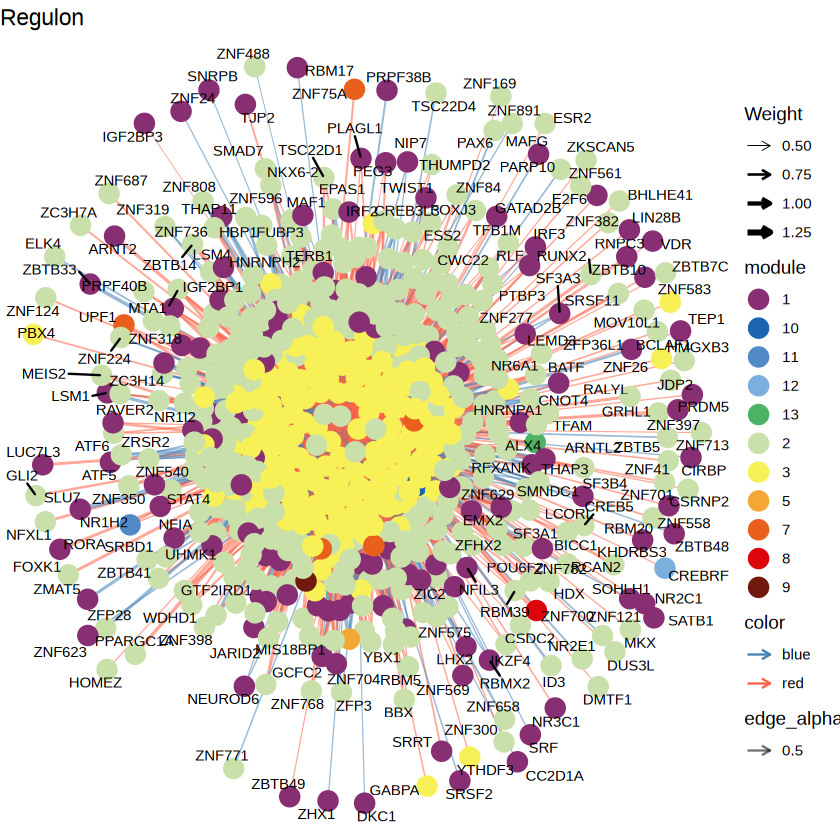

In [120]:
set.seed(123) # 保证图形可重现
#E(g)$weight <- abs(E(g)$weight)
g_sub_tidy <- as_tbl_graph(g_extended)
# g_sub_tidy <- g_tidy %>%
#   activate(nodes) %>%
#   filter(name %in% top_degree_nodes) # 直接筛选节点

pg = ggraph(g_sub_tidy, layout = "fr") + # "fr"是一种力导向布局，能使联系紧密的节点聚在一起
  geom_edge_link(aes(edge_width = width, edge_color = color, alpha = 0.5),
                 arrow = arrow(length = unit(2, 'mm')), 
                 end_cap = circle(3, 'mm')) +
  scale_edge_width_continuous(range = c(0.2, 1.5)) +
  scale_edge_color_manual(values = c("red" = "tomato", "blue" = "steelblue")) +
  geom_node_point(aes(color = module), size = 5) + # 按模块给节点上色
  geom_node_text(aes(label = name), repel = TRUE, size = 3) + # 节点标签，避免重叠
  scale_color_discreterainbow() +
  theme_void() +
  labs(title = "Regulon", 
       edge_width = "Weight")
pg

In [51]:
library(ComplexHeatmap)
library(circlize)
cordf.fil = cordf.cl.fil
# 假设您的数据框名为df，包含列：Var1, var2, cor, pvalue
# 假设验证关系的数据框名为verified_df，包含列：Var1, var2

# 步骤1: 准备数据矩阵
# 获取所有唯一变量
cordf.fil$varid = paste0(cordf.fil$gene_id,"-",cordf.fil$transcript_id)
cordf.fil = cordf.fil %>% group_by(varid) %>% filter(sum(abs(cor) > 0)>100)
cordf.fil = cordf.fil %>% group_by(SF) %>% filter(sum(abs(cor) > 0)> 100)
all_vars <- unique(c(cordf.fil$varid, cordf.fil$SF))

# 创建相关性矩阵和p值矩阵
mat_cor = dcast(cordf.fil,varid~SF,value.var = "cor",fun.aggregate = sum)
rownames(mat_cor) = mat_cor$varid;mat_cor = mat_cor[,-1]
mat_cor = as.matrix(mat_cor)

mat_p = dcast(cordf.fil,varid~SF,value.var = "padj",fun.aggregate = mean,fill = 1)
rownames(mat_p) = mat_p$varid;mat_p = mat_p[,-1]
mat_p = as.matrix(mat_p)

# 步骤2: 创建验证关系矩阵
mat_verified <- matrix(FALSE, nrow = nrow(mat_cor), ncol = ncol(mat_cor))
rownames(mat_verified) <- rownames(mat_cor)
colnames(mat_verified) <- colnames(mat_cor)

# 步骤3: 设置颜色映射
col_fun <- colorRamp2(c(-1, 0, 1), c("blue", "white", "red"))

# 步骤4: 绘制热图
# 假设这是您要显示的特定行名（基因名）
selected_genes <- c("DDRGK1", "ARPP19", "MYL6", "DBNDD2")
selected_var = cordf.fil[cordf.fil$gene_id %in% selected_genes,]$varid
gene_indices <- which(rownames(mat_cor) %in% selected_var)
gene_labels <- rownames(mat_cor)[gene_indices]
library(ComplexHeatmap)
# 创建标记注释
row_anno <- rowAnnotation(
    mark_gene = anno_mark(
        at = gene_indices,       # 指定需要标记的行位置
        labels = gene_labels,    # 指定显示的标签文本
        labels_gp = gpar(fontsize = 10) # 控制标签字体大小
    )
)

pdf("result/figure_revision/isoform_TF_RBP_SF_DTU_cor_heatmap_celltype_25)10_21.pdf",width = 8, height = 10)
Heatmap(mat_cor, 
        name = "Correlation", 
        #col = col_fun,
        #rect_gp = gpar(type = "none"),
        show_row_dend = FALSE,column_split = 10,row_split = 10,  # 禁用默认矩形绘制，以便自定义[2](@ref)
        cluster_rows = TRUE,
        cluster_columns = TRUE,
        show_row_names = FALSE,
        show_column_names = FALSE,
        right_annotation = row_anno,
        heatmap_legend_param = list(title = "Correlation"))
dev.off()

pdf 
  2

In [128]:
ggexport(pg,filename = "downstream_analysis/result/figure_revision/regulon_celltype_network_graph_notext_25_10_20.pdf",
         width = 20,height = 20)

Warning message:
"ggrepel: 950 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
file saved to downstream_analysis/result/figure_revision/regulon_celltype_network_graph_notext_25_10_20.pdf



In [35]:
cordfl = dcast(cordf.fil,gene_id~SF,value.var = "cor",fun.aggregate = sum)
rownames(cordfl) = cordfl$gene_id;cordfl = cordfl[,-1]
dim(cordfl)
cordfl[,]
Heatmap(as.matrix(cordfl),show_row_dend = FALSE,column_split = 8,row_split = 5)

[1] 140 946

In [169]:
library(ComplexHeatmap)
pdf("result/figure_revision/isoform_TF_RBP_SF_DTU_cor_heatmap.pdf",width = 10, height = 6)
#cordf.fil$transcript_id = paste0(cordf.fil$gene_id,"-",cordf.fil$transcript_id)
cordfl = dcast(cordf.fil,gene_id~SF,value.var = "cor",fun.aggregate = sum)
rownames(cordfl) = cordfl$gene_id;cordfl = cordfl[,-1]
Heatmap(as.matrix(cordfl),show_row_dend = FALSE,column_split = 8,row_split = 5)
dev.off()

pdf 
  2

`summarise()` has grouped output by 'x'. You can override using the `.groups`
argument.
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


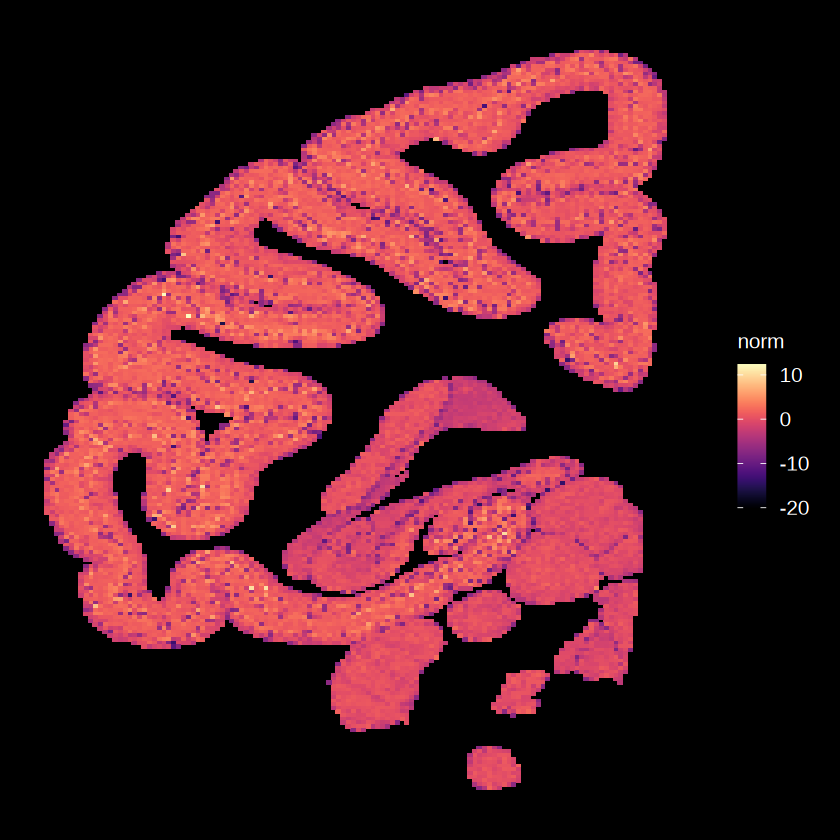

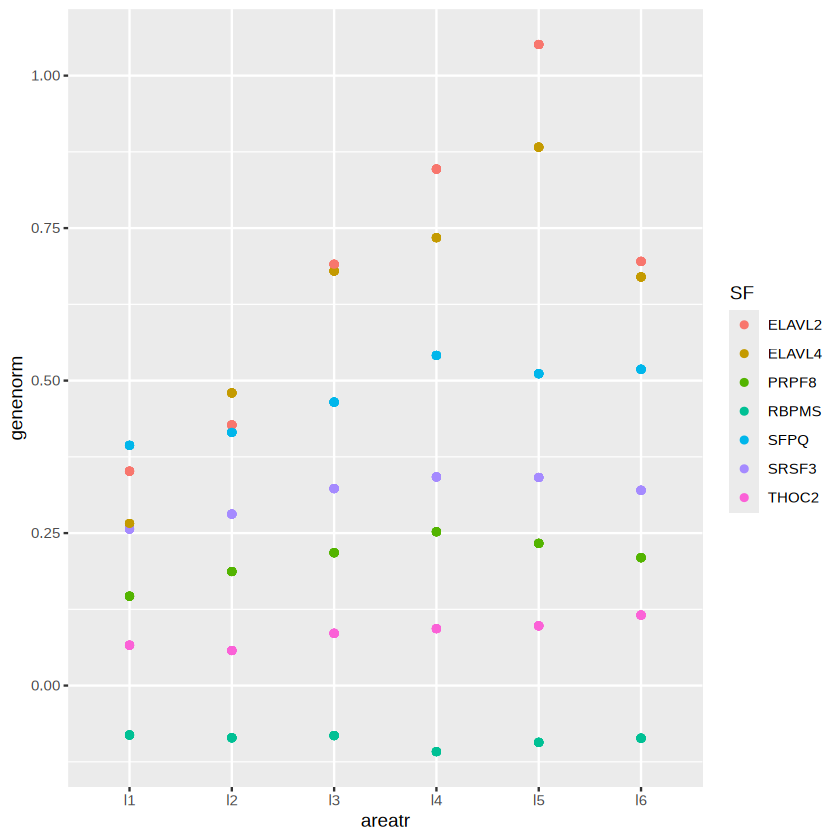

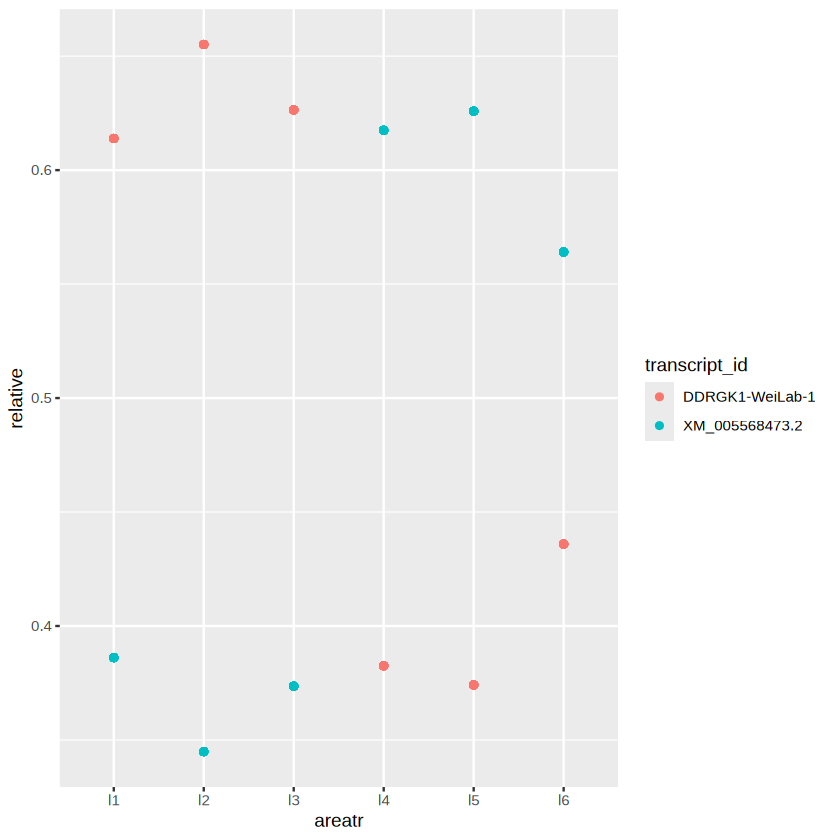

In [42]:
combindf.plot = combindf[combindf$SF %in% combindf.st.fil[combindf.st.fil$gene_id == "DDRGK1",]$SF & 
                         combindf$gene_id == "DDRGK1",]
#combindf.plot
ggplot(combindf.plot,aes(x = areatr,y = genenorm,color = SF)) + geom_point()
ggplot(combindf.plot,aes(x = areatr,y = relative,color = transcript_id)) + geom_point()

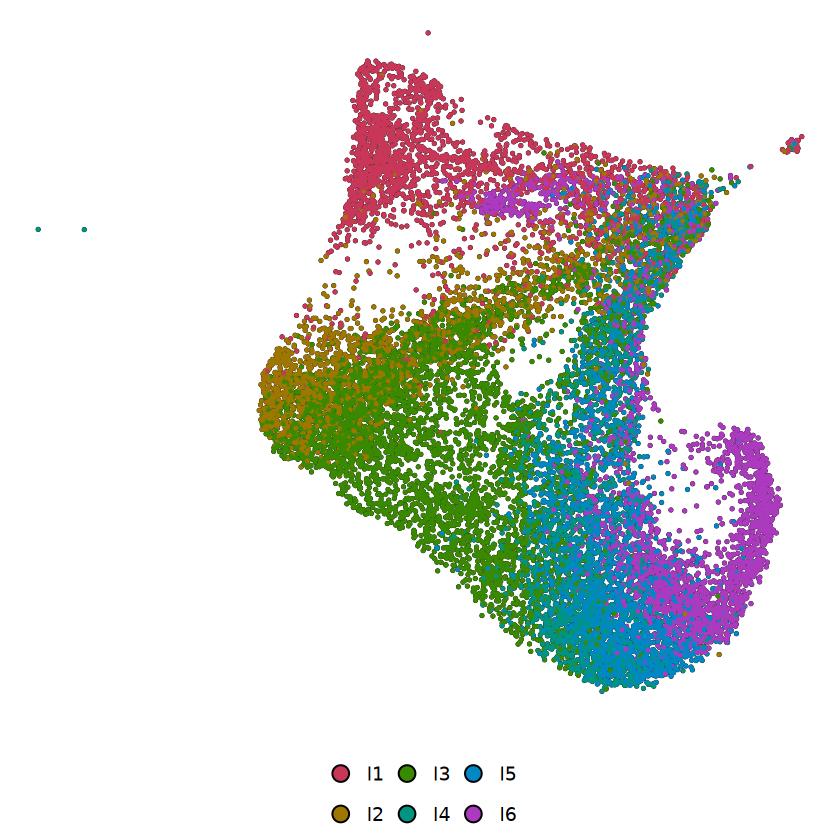

In [46]:
srt.sp.sub = subset(srt.sp,idents = "Cortex")
anlayer = MySplit(colnames(srt.sp.sub),"-",1)
anarea = MySplit(colnames(srt.sp.sub),"-",2)
anlobe = MySplit(colnames(srt.sp.sub),"-",3)
ansubcor = MySplit(colnames(srt.sp.sub),"-",4)
names(anlayer) = names(anarea) = names(anlobe) = colnames(srt.sp.sub)
srt.sp.sub$layer = anlayer
srt.sp.sub$region = anarea
srt.sp.sub$lobe = anlobe
Idents(srt.sp.sub) = srt.sp.sub$layer
do_DimPlot(srt.sp.sub,pt.size = 0.1)

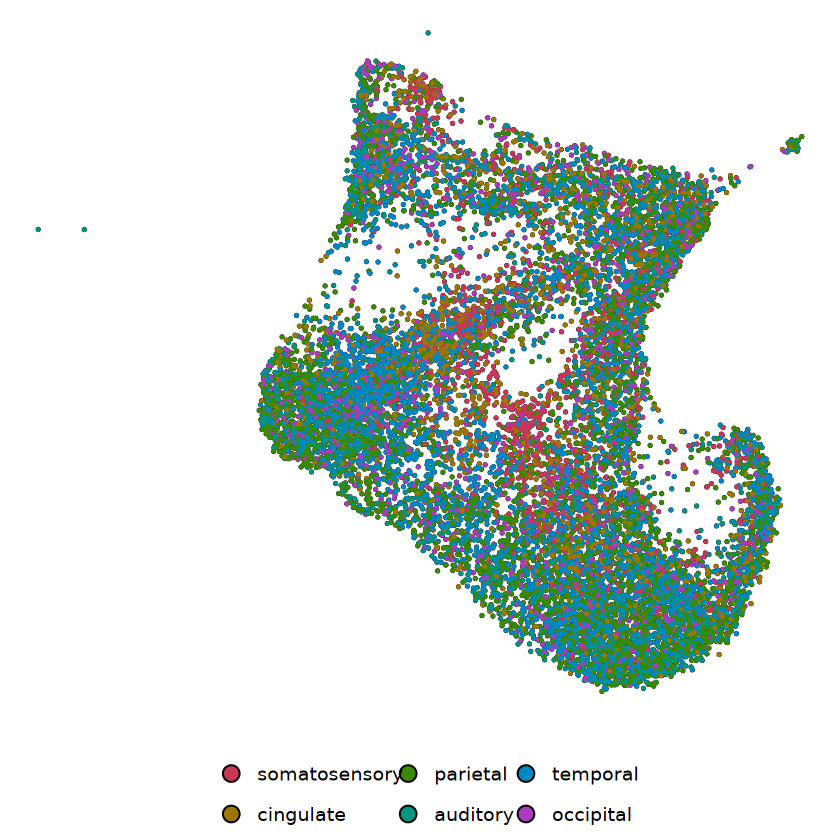

In [47]:
Idents(srt.sp.sub) = srt.sp.sub$lobe
do_DimPlot(srt.sp.sub,pt.size = 0.1)

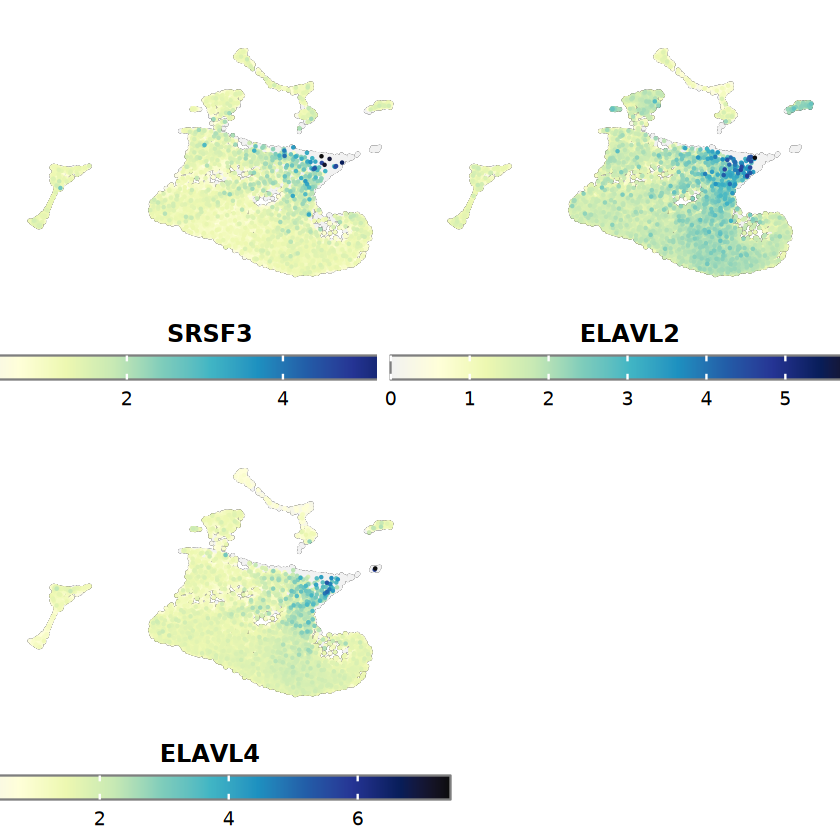

In [44]:
library(SCpubr)
do_FeaturePlot(srt.sp,features = c("SRSF3","ELAVL2","ELAVL4"),
               pt.size = 0.01,order = T)

In [51]:
mkls = qread(file = "result/figure2/gene_marker_list_25_04_14.qs")

[1] "U2AF1"        "HNRNPLL"      "CWC22"        "TJP2"         "SMNDC1"      
 [6] "LOC107130123" "CWC22"        "CWC22"        "TJP2"         "CWC22"

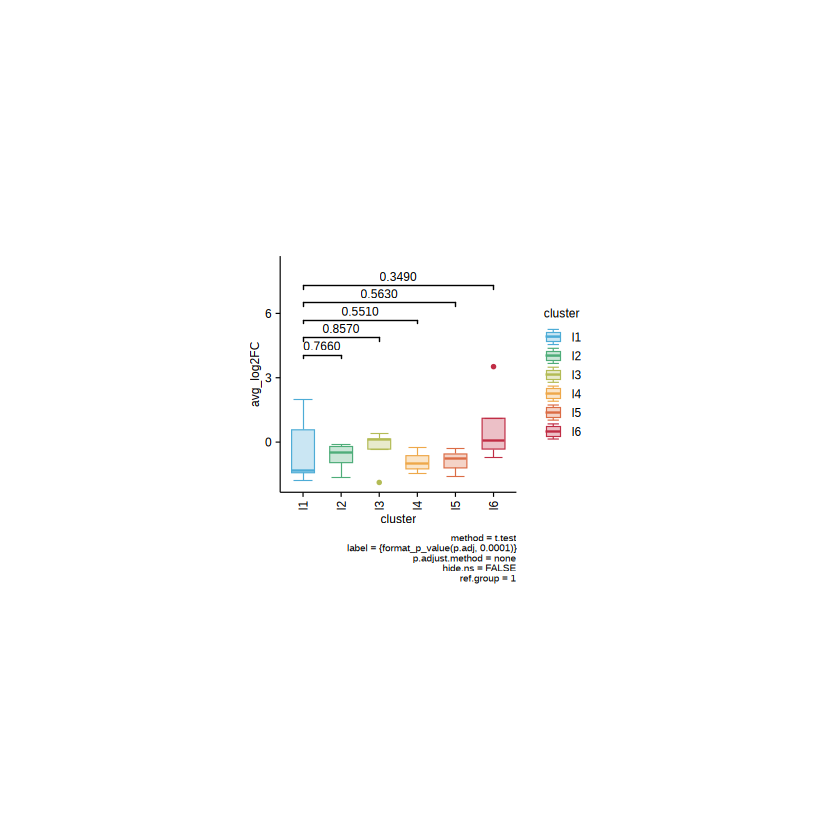

In [99]:
mklsi = mkls$layer
mklsi = mklsi[mklsi$gene %in% refsp$gene_id,]
mklsi.hub = mklsi[abs(mklsi$avg_log2FC) > 1 & mklsi$p_val_adj < 0.05,]
mklsi.hub$gene
mklsi = mklsi[mklsi$gene %in% mklsi.hub$gene,]
mklsi |>
  tidyplot(x = cluster, y = avg_log2FC,color = cluster) |> 
  add_boxplot() |>
  add_test_pvalue(ref.group = 1) |>
adjust_colors(new_colors = colors_discrete_metro) |>
adjust_x_axis(rotate_labels = 90)

Warning message in DoHeatmap(srt.sp, features = unique(refsp$gene_id)):
"The following features were omitted as they were not found in the scale.data slot for the RNA assay: YJU2B, YJU2, SF3B1, LOC123575290, LOC123575165, LOC123574537, LOC123573108, LOC123568307, LOC123567470, LOC123567292, LOC123567073, LOC123566861, LOC107130194, LOC107126453, LOC102146924, LOC102145457, LOC102142060, LOC102142042, LOC102141606, LOC102141455, LOC102141402, LOC102140935, LOC102140178, LOC102139068, LOC102138887, LOC102136285, LOC102135971, LOC102134854, LOC102126961, LOC102124889, LOC102123776, LOC102122913, LOC102121254, LOC102116410, LOC102115235, CENATAC"


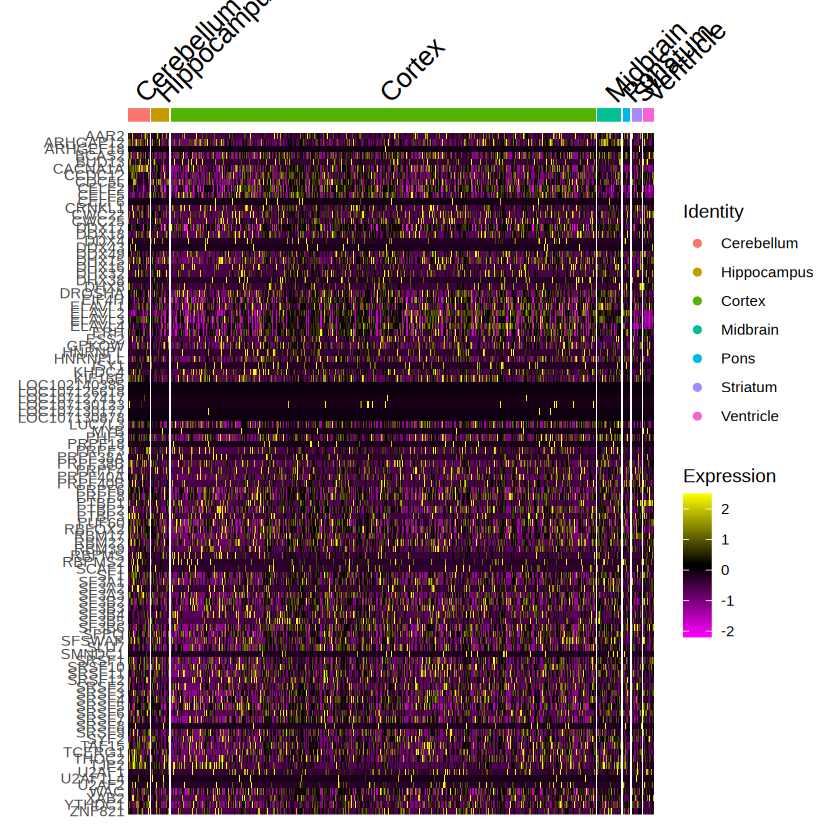

In [86]:
DoHeatmap(srt.sp,features = unique(refsp$gene_id))

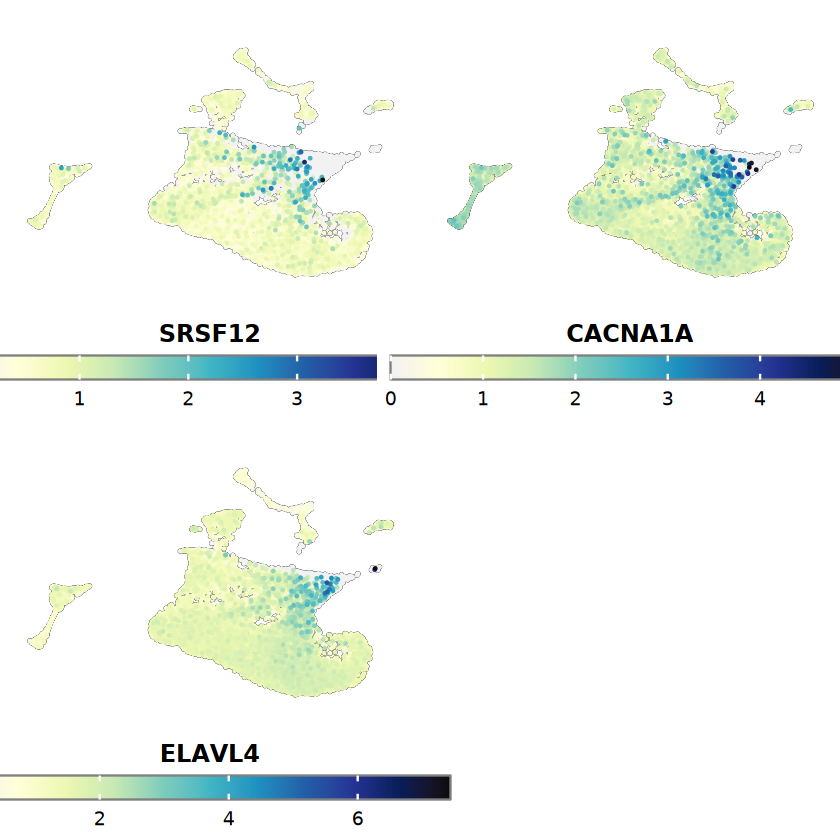

In [95]:
library(SCpubr)
do_FeaturePlot(srt.sp,features = c("SRSF12","CACNA1A","ELAVL4"),pt.size = 0.1,order = T)

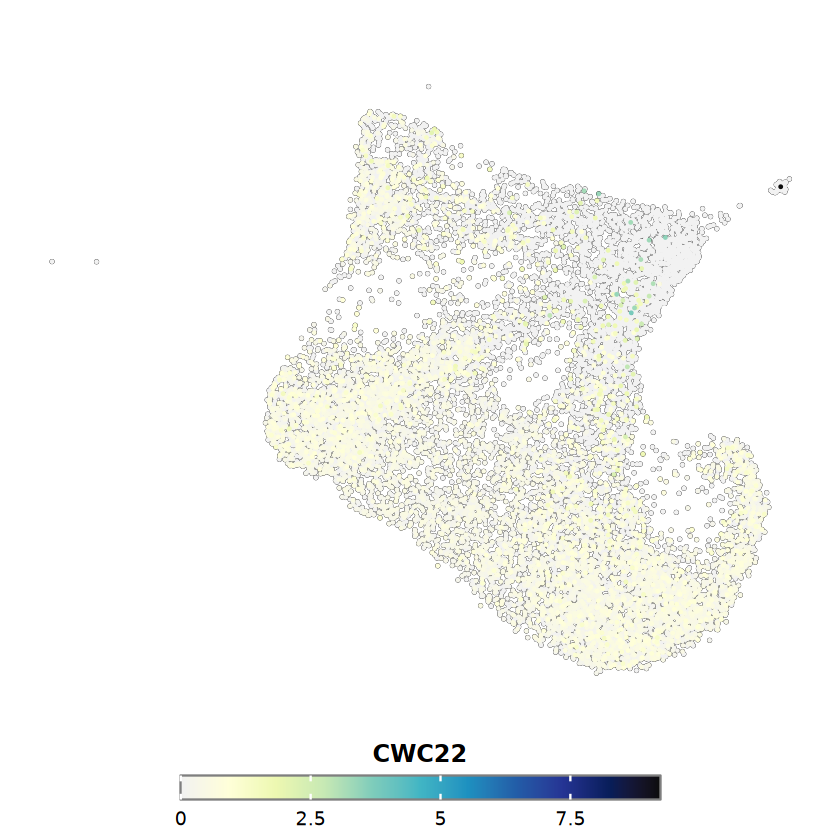

In [102]:
do_FeaturePlot(srt.sp.sub,features = c("CWC22"),pt.size = 0.1,order = T)

In [182]:
colnames(srt.sp.sub)[1:5]

[1] "l1-1|2-somatosensory-Cortex-10200_26200"
[2] "l1-1|2-somatosensory-Cortex-10200_26600"
[3] "l1-1|2-somatosensory-Cortex-10200_41000"
[4] "l1-1|2-somatosensory-Cortex-10200_41400"
[5] "l1-1|2-somatosensory-Cortex-10600_26200"

In [144]:
#calculate SF gene and DTU correlation
isosigi1 = isosigls$layer
isosigi2 = isosigls$subcortical
mklsi1 = mkls$layer
mklsi2 = mkls$subcortical
isosigi = rbind(isosigi1,isosigi2)
mklsi = rbind(mklsi1,mklsi2)
mklsi = mklsi[mklsi$gene %in% refsp$gene_id,]

CalSpdtucor = function(isosigi,mklsi){
    mklsi = dcast(mklsi,cluster~gene,value.var = "avg_log2FC",fill = 0)
    rownames(mklsi) = mklsi$cluster;mklsi = mklsi[,-1]
    #mklsi[is.na(mklsi)] = 0
    mklsi = mklsi[,colSums(mklsi != 0) > 2]
    isosigi.hub = isosigi[isosigi$sig!= "N",]
    isosigi.hub = isosigi[isosigi$transcript_id %in% isosigi.hub$transcript_id,]
    isosigi.hub = merge(isosigi.hub[,c("gene_id","transcript_id","areatr","dr")],mklsi,by.x = "areatr",by.y = "row.names")
    transls = unique(isosigi.hub$transcript_id)
    print(length(transls))
    res = NULL
    for(i in 1:length(transls)){
        dfi = isosigi.hub[isosigi.hub$transcript_id %in% transls[i],]
        for(j in 5:ncol(isosigi.hub)){
            cori = cor(dfi$dr,unlist(dfi[,j]))
            resi = data.frame("gene_id" = dfi$gene_id[1],
                         "transid" = dfi$transcript_id[1],
                         "sp" = colnames(dfi)[j],"cor" = cori)
            res = rbind(res,resi)
        }
    }
    res = res[!is.na(res$cor),]
    return(res)
}
#res = CalSpdtucor(isosigi,mklsi)


In [150]:
mklsi = rbind(mklsi1,mklsi2)
mklsi = mklsi[!mklsi$gene %in% refsp$gene_id,]
genehub = unique(isosigi[isosigi$sig!= "N",]$gene_id)
mklsi.hub = mklsi[mklsi$gene %in% genehub,]
length(unique(mklsi.hub$gene))
randomg = sample(unique(mklsi.hub$gene),size = 100)
length(randomg)
mklsi.rand = mklsi[mklsi$gene %in% randomg,]
res.ct = CalSpdtucor(isosigi,mklsi.rand)

[1] 2685

[1] 100

[1] 4923


Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warning message in cor(dfi$dr, unlist(dfi[, j])):
"the standard deviation is zero"
Warn

   Power SFT.R.sq  slope truncated.R.sq mean.k. median.k. max.k.
1      1  0.32300  1.980          0.651  1310.0    1320.0   1780
2      2  0.00589  0.143          0.890   551.0     537.0    945
3      3  0.27500 -0.901          0.930   288.0     268.0    615
4      4  0.60700 -1.430          0.912   172.0     152.0    453
5      5  0.82300 -1.760          0.960   112.0      93.6    355
6      6  0.89200 -1.840          0.971    77.2      60.9    288
7      7  0.91700 -1.840          0.971    56.0      41.7    239
8      8  0.93400 -1.800          0.970    42.2      30.2    203
9      9  0.94800 -1.780          0.971    32.8      22.2    174
10    10  0.94500 -1.750          0.952    26.1      16.7    152
TOM calculation: adjacency..
..will use 128 parallel threads.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.
 ..cutHeight not given, setting it to 0.994  ===>  99% of the (truncated) height range in dendro.
 

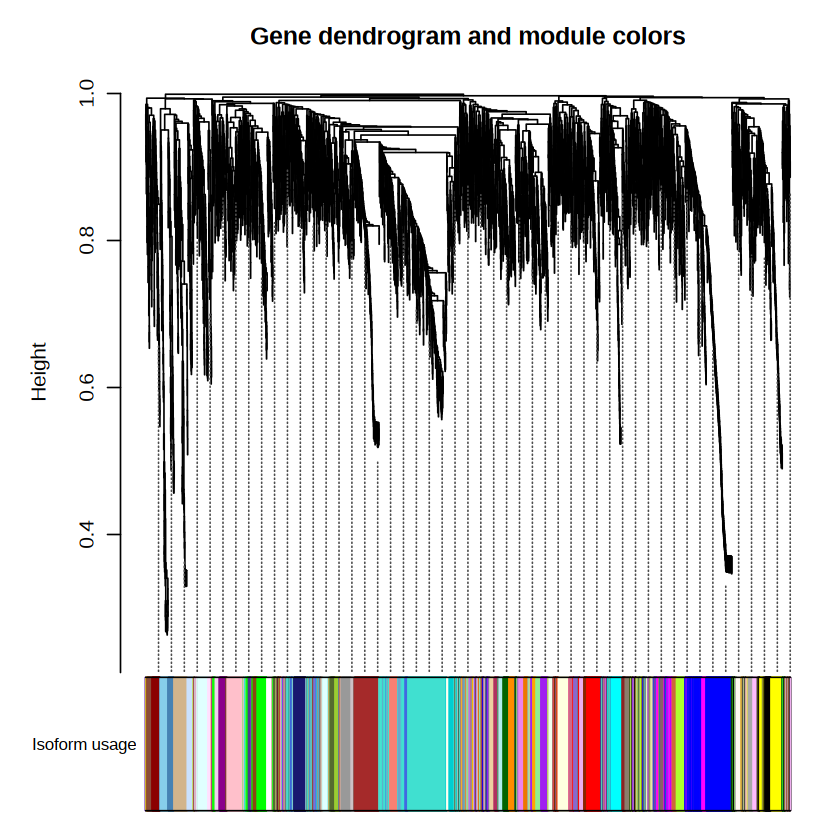

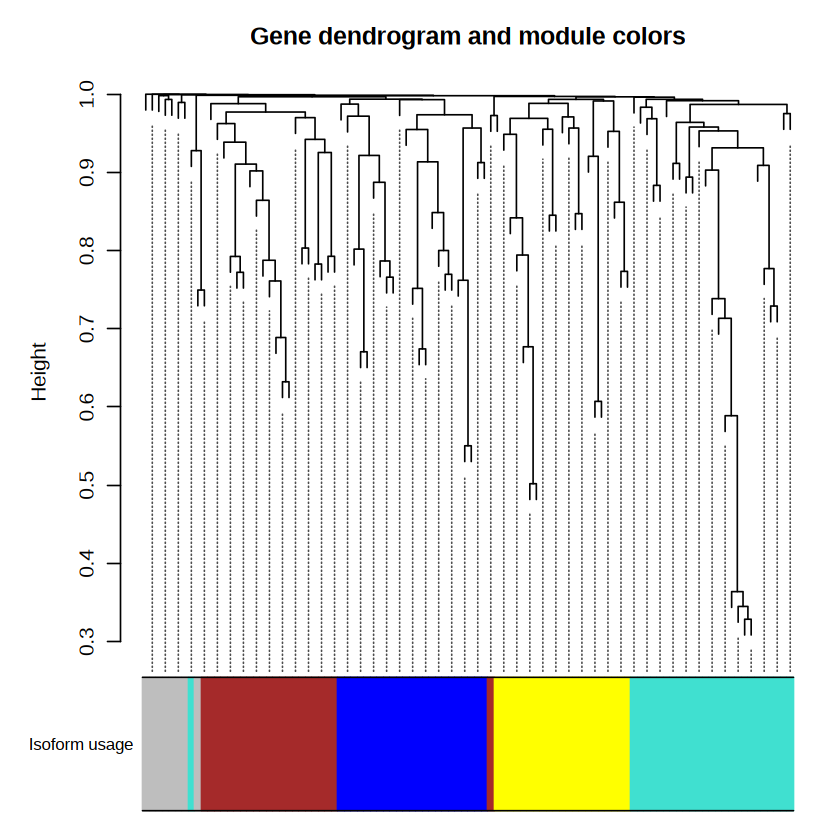

In [206]:
# MyWGCNA = function(isodat){
#     #isodf = isodf[isodf$count > 5,]
#     #isodf = isodf %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
#     isodat = dcast(isodf,areatr~gene_id,value.var = "dr",fun.aggregate = sum)
#     rownames(isodat) = isodat$areatr;isodat = isodat[,-1]
#     isodatf = isodat
#     #isodatf = isodatf[rowSums(isodatf > 0) > 1700,]
#     isodatf = isodatf[ ,colSums(isodatf > 0) == nrow(isodatf)]
#     rownames(isodatf)
#     print(dim(isodat))
#     print(dim(isodatf))
#     return(isodatf)
# }
library(WGCNA)
ProcessWGCNA = function(isodatf,power,minModuleSize){
    powers = c(seq(from = 1, to=10, by=1));
    sft = pickSoftThreshold(isodatf, powerVector = powers,corFnc = cor,corOptions = list(use = 'p'),networkType = "unsigned")
    # Plot the results
    cex1 = 0.7;

    library(flashClust)
    TOMType = "unsigned"
    softPower = power;
    adjacency = adjacency(isodatf, power = softPower)
    TOM= TOMsimilarityFromExpr(isodatf,networkType = "unsigned", TOMType = "unsigned", power = softPower);
    colnames(TOM) = rownames(TOM) = colnames(isodatf)
    dissTOM = 1-TOM
    geneTree = hclust(as.dist(dissTOM),method="average");
    dynamicMods = cutreeDynamic(dendro = geneTree, method = "hybrid", distM = dissTOM, deepSplit = 2, pamRespectsDendro = FALSE, minClusterSize = minModuleSize)
    table(dynamicMods)
    dynamicColors = labels2colors(dynamicMods)
    table(dynamicColors)
    plotDendroAndColors(geneTree, dynamicColors, "Isoform usage", dendroLabels = FALSE, hang = 0.03, addGuide = TRUE, 
                    guideHang = 0.05, main = "Gene dendrogram and module colors")
#plot the resulting clustering tree (dendrogram)

#Create the dataframe since the beginning
    netinfo.iso = data.frame(trans_id = colnames(isodatf),
                       moduleColor = dynamicColors)
    netinfo.iso$gene_id = MySplit(netinfo.iso$trans_id,"-",1)
    wgcnasum = list("isodatf" = isodatf,"TOM" = TOM,"genetree" = geneTree,"netinfo.iso" = netinfo.iso,"dynamicColors" = dynamicColors)
    return(wgcnasum)
}
# isodf = rbind(isosigls$lobe,isosigls$layer,isosigls$subclass)
# isodf = isodf[isodf$transcript_id %in% hubtrans,]

wg.dtu = ProcessWGCNA(isosigl_clean,9,20)
wg.mk = ProcessWGCNA(mklsl_clean,10,10)
#head(wg.t$netinfo.iso)


Warning message in greenWhiteRed(50):
"WGCNA::greenWhiteRed: this palette is not suitable for people
with green-red color blindness (the most common kind of color blindness).
Consider using the function blueWhiteRed instead."


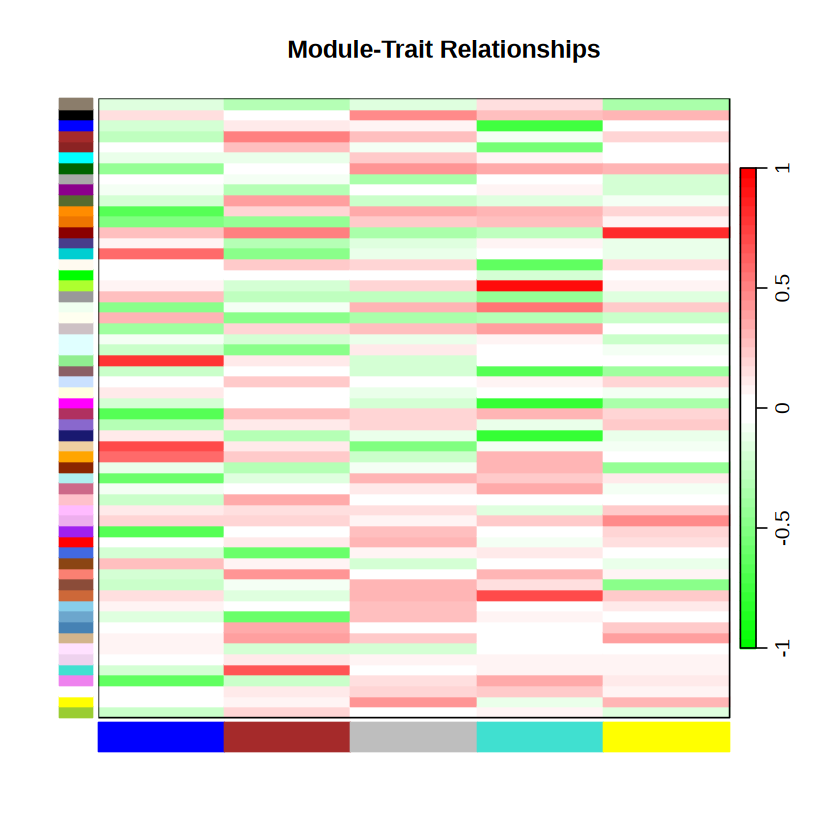

In [208]:
# 安装和加载WGCNA
#if (!require("WGCNA")) install.packages("WGCNA")
library(WGCNA)

# 允许多线程工作（可选）
#enableWGCNAThreads()

# 1. 为DataFrame A构建网络识别模块
# 选择软阈值功率
# 2. 计算模块特征值（eigengene），代表整个模块的表达模式
MEs_A <- moduleEigengenes(isosigl_clean, wg.dtu$dynamicColors)$eigengenes
MEs_B <- moduleEigengenes(mklsl_clean, wg.mk$dynamicColors)$eigengenes

# 3. 分析A的模块与B的模块之间的相关性
module_cor <- cor(MEs_A, MEs_B, use = "p")
module_pval <- corPvalueStudent(module_cor, nSamples = nrow(isosigl))

# 可视化模块相关性热图
labeledHeatmap(Matrix = module_cor,
               xLabels = colnames(MEs_B),
               yLabels = colnames(MEs_A),
               colorLabels = FALSE,
               colors = greenWhiteRed(50),
               setStdMargins = FALSE,
               cex.text = 0.7,
               zlim = c(-1,1),
               main = "Module-Trait Relationships")

In [211]:
module_cor
module_pval[module_pval < 0.01]

,MEblue,MEbrown,MEgrey,MEturquoise,MEyellow
MEbisque4,-0.16185392,-0.33180836,-0.138810890,0.1677526324,-0.35357644
MEblack,0.16892493,-0.04475927,0.456445170,0.2682738797,0.32148802
MEblue,-0.18158300,0.11680458,0.075695231,-0.7487751116,-0.02414220
MEbrown,-0.27780165,0.51853652,0.259795902,-0.0778558077,0.20642188
MEbrown4,0.02706239,0.26271784,-0.095780785,-0.5512226957,0.02840878
MEcyan,-0.10276024,-0.12565346,0.217584893,0.0820863135,0.04126359
MEdarkgreen,-0.41283501,0.02094438,0.445108932,0.3647614525,0.30578518
MEdarkgrey,-0.05812712,-0.06728938,-0.361392239,0.0071969056,-0.20437051
MEdarkmagenta,-0.08316895,-0.31394217,-0.022511260,0.0750793964,-0.20205188
MEdarkolivegreen,-0.18793396,0.39549351,-0.235726675,-0.1443436930,-0.09130912


[1] 1.795400e-03 8.497962e-03 3.228351e-03 1.987225e-06 1.775722e-03
[6] 1.831963e-03 6.898388e-03 4.698152e-04

#### Try WGCNA

In [255]:
transtl.cl = fsraw.cor[fsraw.cor$subclass != "" & !is.na(fsraw.cor$subclass),] %>% 
        group_by(subclass,subcortical,gene_id) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,subclass,subcortical) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
transtl.cl$metacell = paste0(transtl.cl$subcortical,"-",transtl.cl$subclass)
transtl.cl$relative = transtl.cl$count/transtl.cl$genecount
transtl.cl = transtl.cl %>% group_by(gene_id,transcript_id) %>% mutate(meanrelative = sum(count)/sum(genecount))
transtl.cl$dr = transtl.cl$relative - transtl.cl$meanrelative

`summarise()` has grouped output by 'gene_id', 'transcript_id', 'subclass'. You
can override using the `.groups` argument.


In [256]:
transtl.fil = transtl.cl[transtl.cl$transcript_id %in% alldtu & transtl.cl$genecount > 20,] %>% group_by(gene_id) %>% 
                                                    filter(length(unique(metacell)) > 25)
transtl.fil = transtl.fil  %>% group_by(metacell) %>% filter(length(unique(transcript_id)) > 100)
length(unique(transtl.fil$transcript_id))
length(unique(transtl.fil$metacell))

[1] 301

[1] 32

In [257]:
library(WGCNA)
ProcessWGCNA = function(isodatf){
    powers = c(seq(from = 1, to=30, by=1));
    sft = pickSoftThreshold(isodatf, powerVector = powers,corFnc = cor,corOptions = list(use = 'p'),networkType = "unsigned")
    # Plot the results
    cex1 = 0.7;
    # Scale-free topology fit index as a function of the soft-thresholding power
    library(flashClust)
    TOMType = "unsigned"
    softPower = 30; 
    adjacency = adjacency(isodatf, power = softPower)
    TOM= TOMsimilarityFromExpr(isodatf,networkType = "unsigned", TOMType = "unsigned", power = softPower);
    colnames(TOM) = rownames(TOM) = colnames(isodatf)
    dissTOM = 1-TOM
    geneTree = flashClust(as.dist(dissTOM),method="average");
    minModuleSize = 5;
    dynamicMods = cutreeDynamic(dendro = geneTree,  method="tree", minClusterSize = minModuleSize);
    table(dynamicMods)
    dynamicColors = labels2colors(dynamicMods)
    table(dynamicColors)
    plotDendroAndColors(geneTree, dynamicColors, "Isoform usage", dendroLabels = FALSE, hang = 0.03, addGuide = TRUE, 
                    guideHang = 0.05, main = "Gene dendrogram and module colors")
#plot the resulting clustering tree (dendrogram)

#Create the dataframe since the beginning
    netinfo.iso = data.frame(trans_id = colnames(isodatf),
                       moduleColor = dynamicColors)
    netinfo.iso$gene_id = MySplit(netinfo.iso$trans_id,"-",1)
    wgcnasum = list("isodatf" = isodatf,"TOM" = TOM,"genetree" = geneTree,"netinfo.iso" = netinfo.iso,"dynamicColors" = dynamicColors)
    return(wgcnasum)
}
# isodf = rbind(isosigls$lobe,isosigls$layer,isosigls$subclass)
# isodf = isodf[isodf$transcript_id %in% hubtrans,]
transmx <- dcast(transtl.fil,metacell~transcript_id,value.var = "dr",fun.aggregate = sum)
rownames(transmx) = transmx$metacell; transmx = transmx[,-1]
# wg.t = ProcessWGCNA(transmx)
# head(wg.t$netinfo.iso)

In [204]:
#transtl.fil[transtl.fil$gene_id == "NM_001283415.1",]
wg.t$netinfo.iso[wg.t$netinfo.iso$gene_id %in% c("NM_001283415.1"),]
wg.t$netinfo.iso[wg.t$netinfo.iso$gene_id %in% c("DDRGK1"),]
isodatf = wg.t$isodatf
genetree = wg.t$genetree
dynamicColors = wg.t$dynamicColors
#restGenes = (dynamicColors != "grey")
diss1=1-TOMsimilarityFromExpr(isodatf, power = 20)
hier1=flashClust(as.dist(diss1), method="average" )

diag(diss1) = NA;
sizeGrWindow(7,7)
TOMplot(diss1, hier1, as.character(dynamicColors))
#pdf("result/figure5/WGCNA_cluster_total_24_11_10.pdf",width = 6,height = 6)
#TOMplot(diss1, hier1, as.character(dynamicColors[restGenes]))
#dev.off()

trans_id,moduleColor,gene_id
<chr>,<chr>,<chr>


trans_id,moduleColor,gene_id
<chr>,<chr>,<chr>


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

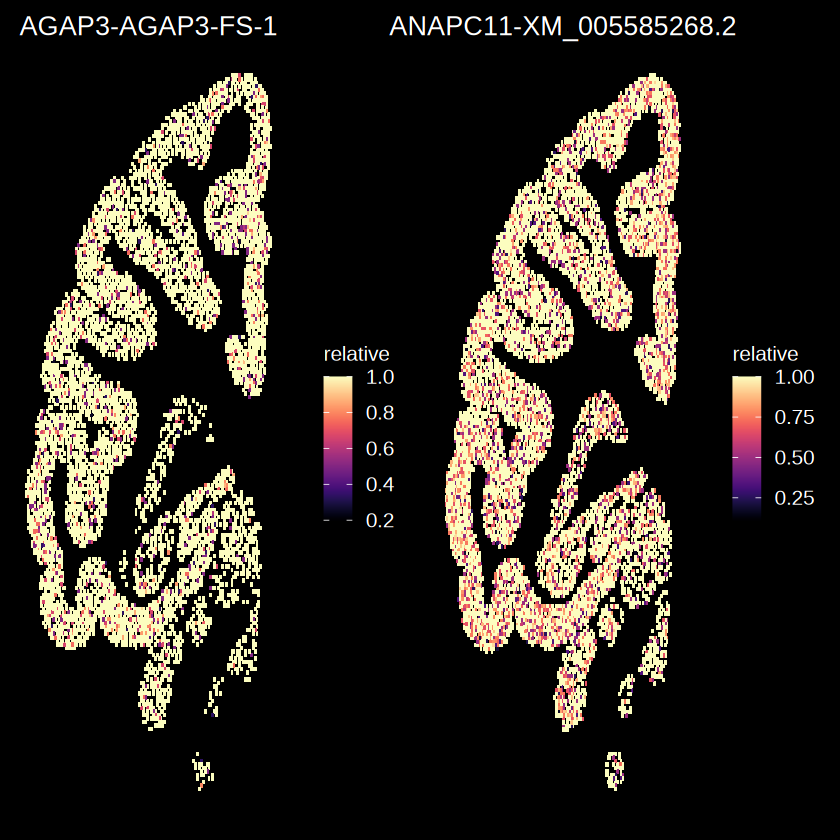

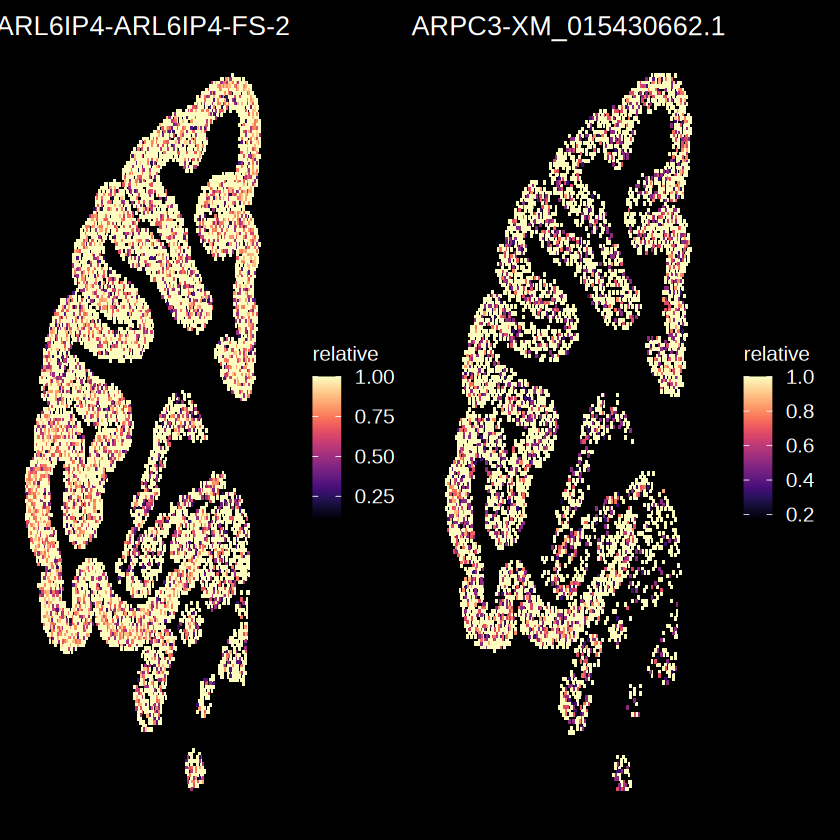

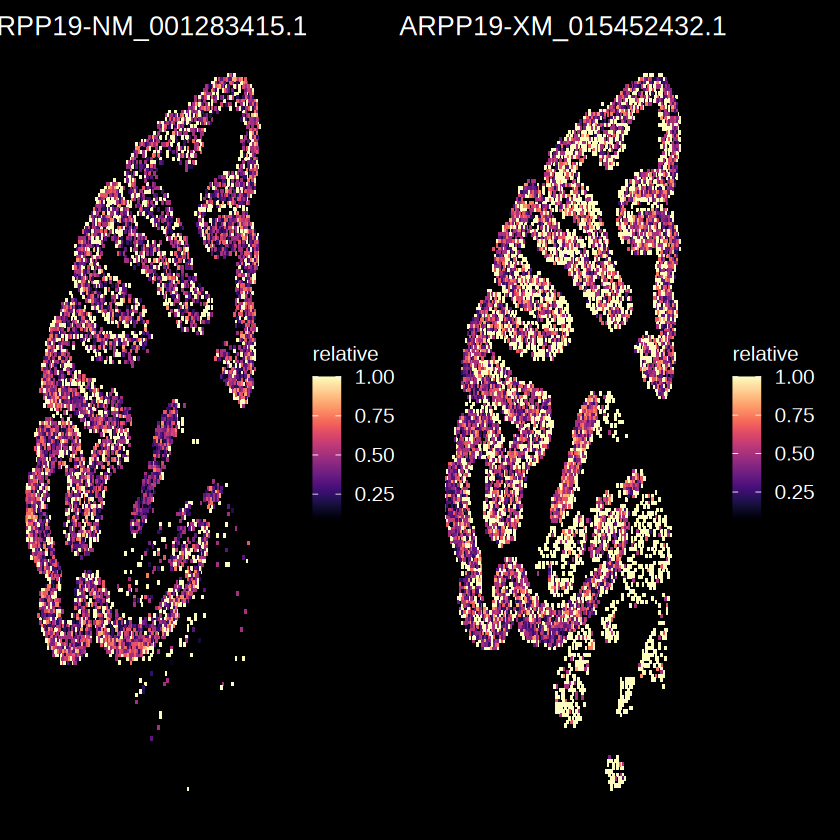

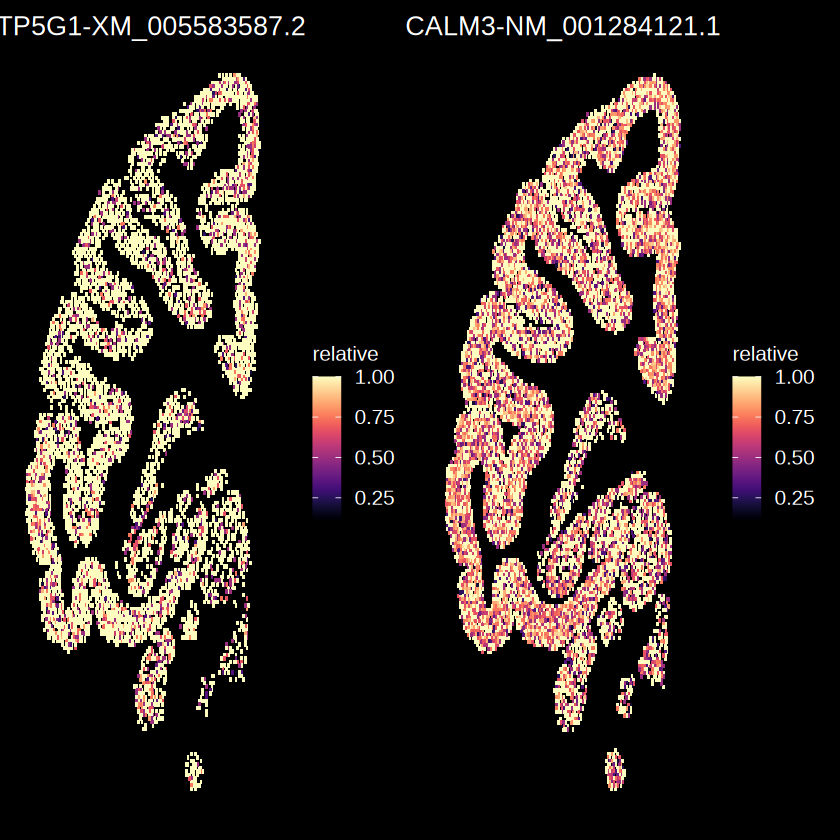

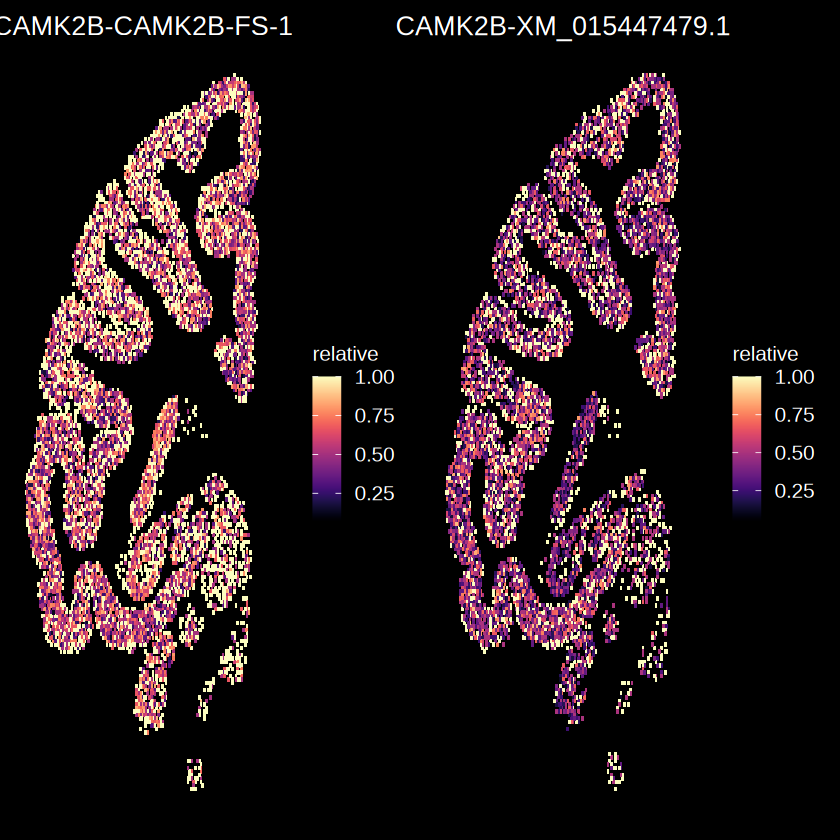

...

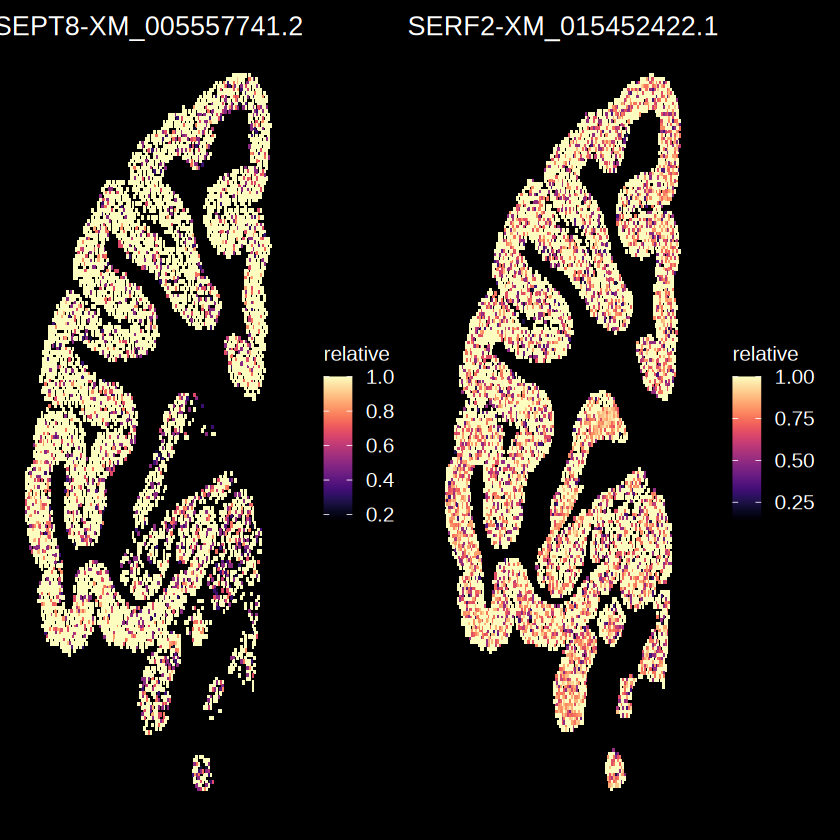

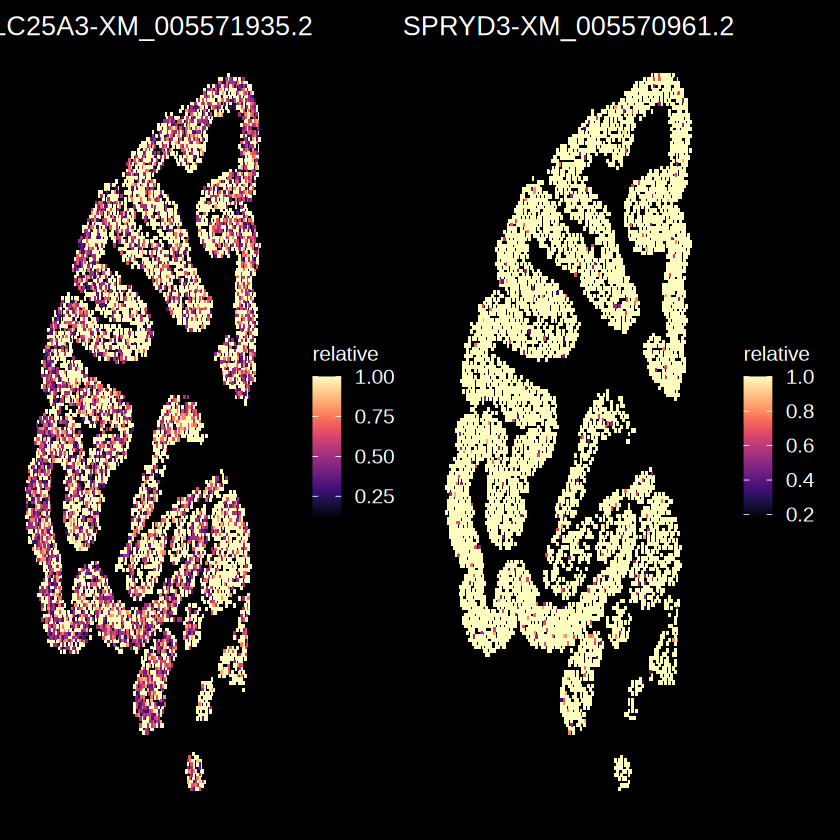

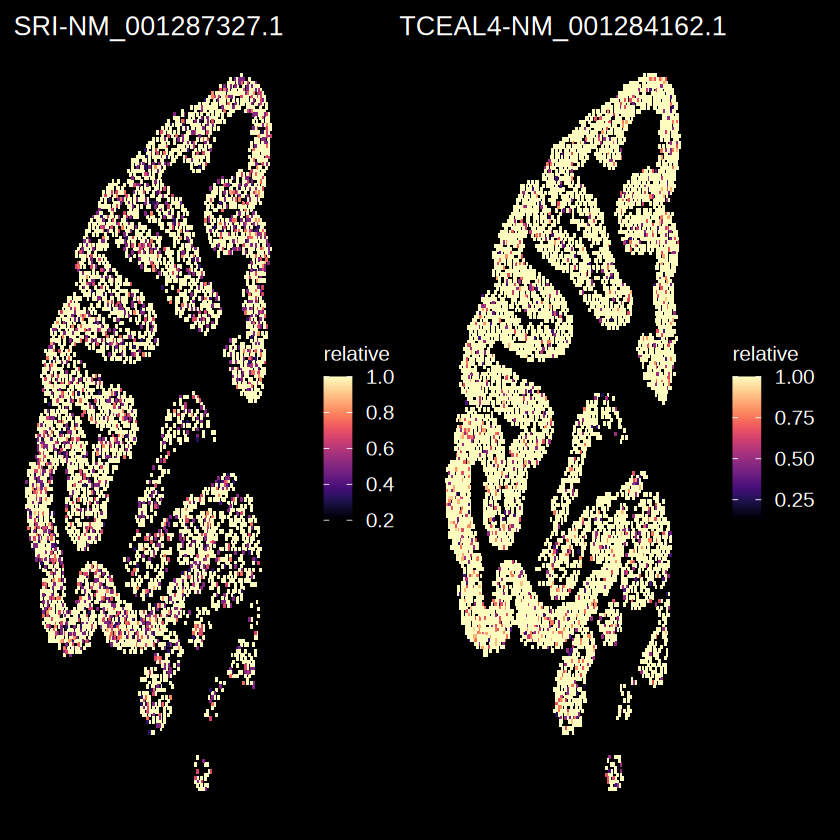

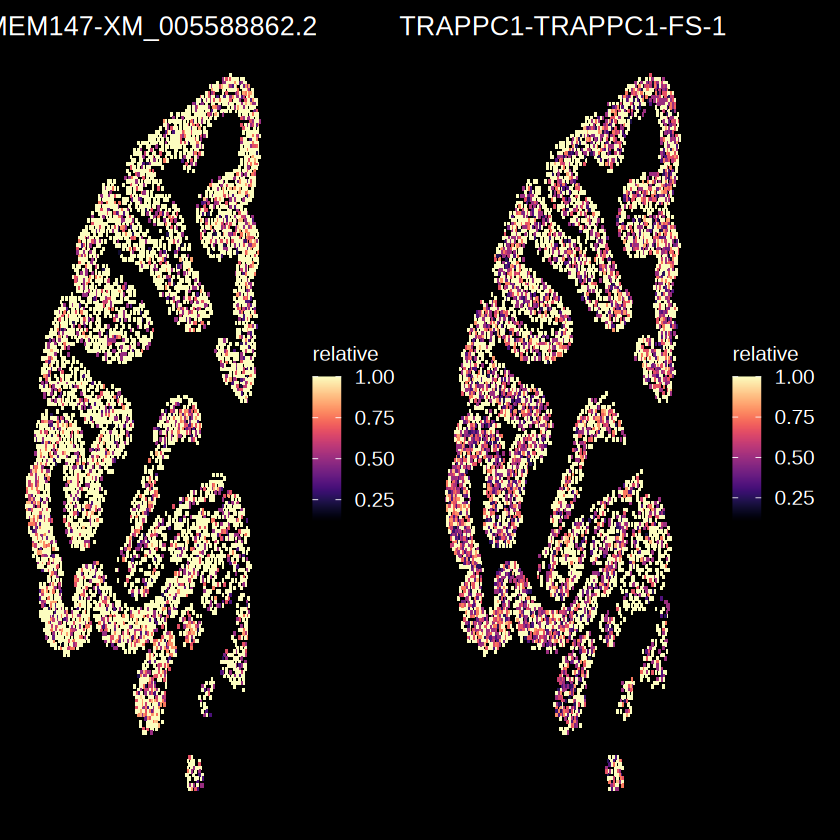

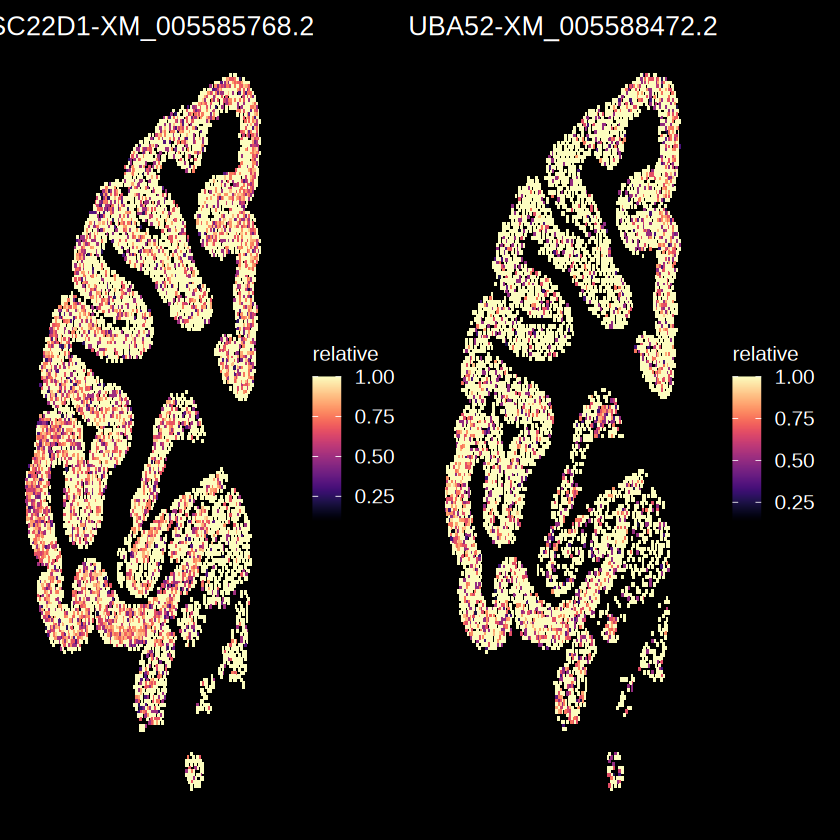

$`1`

$`2`

$`3`

$`4`

$`5`

$`6`

$`7`

$`8`

$`9`

$`10`

$`11`

$`12`

$`13`

$`14`

$`15`

$`16`

$`17`

$`18`

$`19`

$`20`

$`21`

$`22`

$`23`

$`24`

$`25`

$`26`

$`27`

$`28`

$`29`

$`30`

attr(,"class")
[1] "list"      "ggarrange"

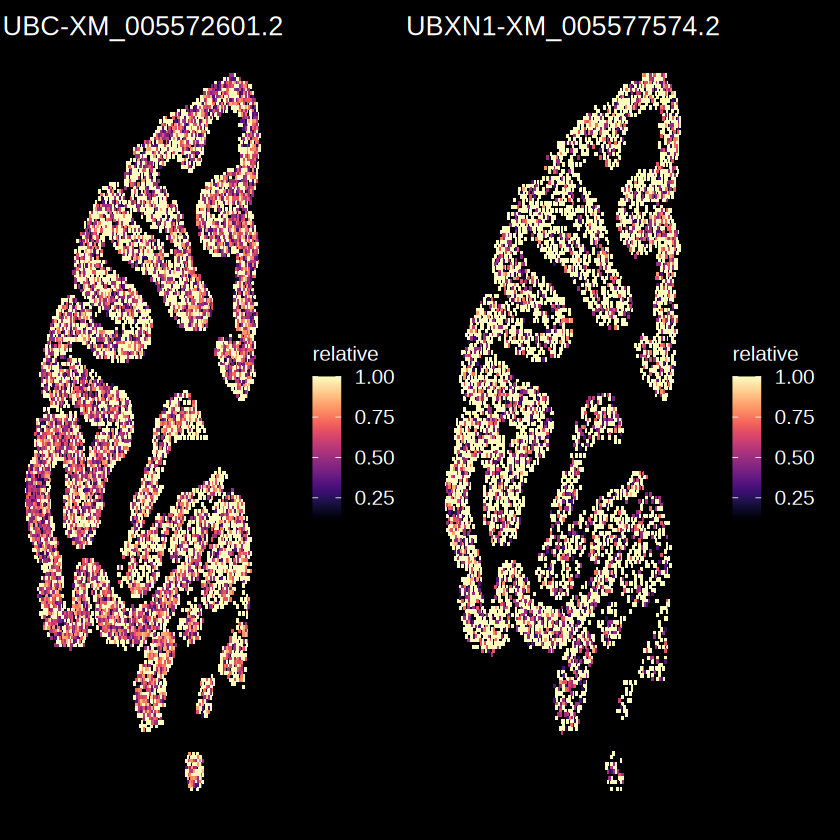

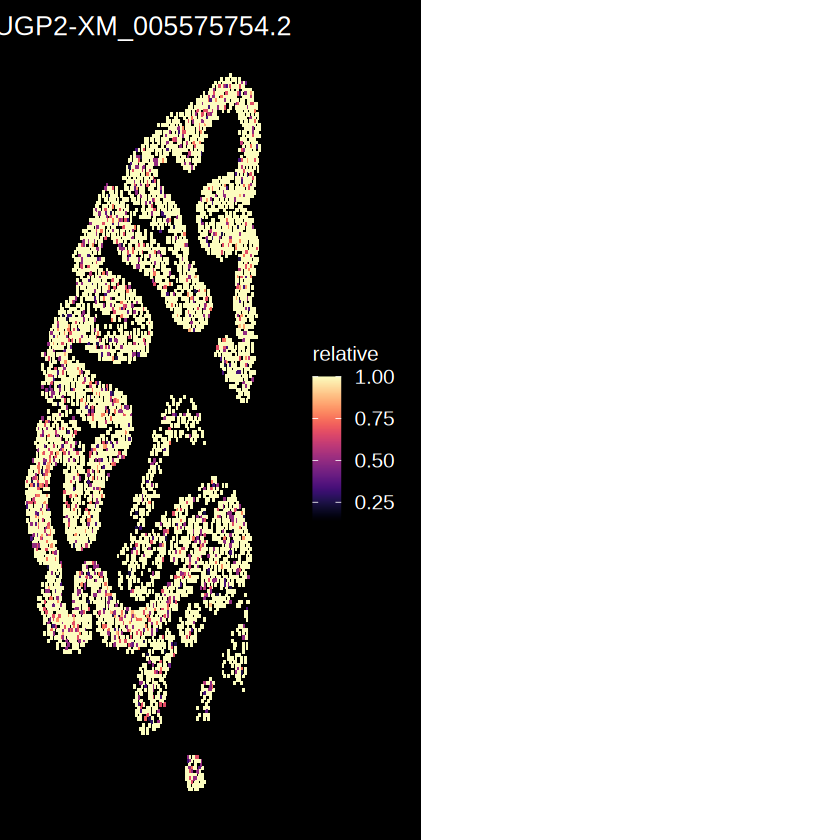

In [69]:
hubtrans = wg.t$netinfo.iso[wg.t$netinfo.iso$moduleColor %in% c("turquoise"),]$trans_id
transtl.case = transtl.fil[transtl.fil$transcript_id %in% hubtrans,]
transtl.case$name = paste0(transtl.case$gene_id,"-",transtl.case$transcript_id)
#transtl.case = merge(transtl.case,moduledf,by = "name")
transtl.case$x = as.numeric(MySplit(transtl.case$blockid,"_",1))
transtl.case$y = as.numeric(MySplit(transtl.case$blockid,"_",2))
#transtl.case = transtl.case[order(transtl.case$module),]
caseid = unique(transtl.case$name)
pcasels1 = list()
for(i in 1:length(caseid)){
    pi = ggplot(transtl.case[transtl.case$name == caseid[i],],aes(x = x,y = y,fill = relative)) + 
                        geom_tile() + scale_fill_viridis(option = "A") + 
                        theme_presentation() + 
                        scale_x_reverse() + scale_y_reverse() + 
                        ggtitle(caseid[i])
    pcasels1[[i]] = pi
}
pcaset1 = ggarrange(plotlist = pcasels1,ncol = 2)
pcaset1

In [258]:
cormx = cor(transmx)
dim(cormx)
# cormx = cormx[rowSums(cormx > 0.3) > 10,]
# cormx = cormx[,colSums(cormx > 0.3) > 10]
# dim(cormx)

[1] 301 301

In [261]:
pt = Heatmap(cormx,show_row_names = F,show_column_names = F,name = "cor")
print(pt)

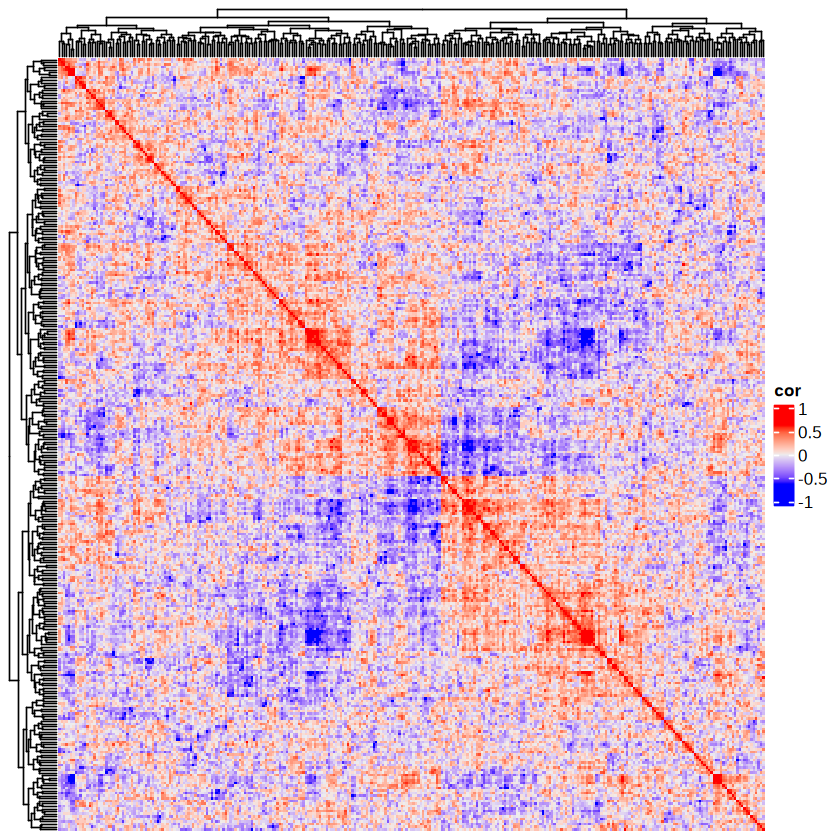

In [262]:
print(pt)

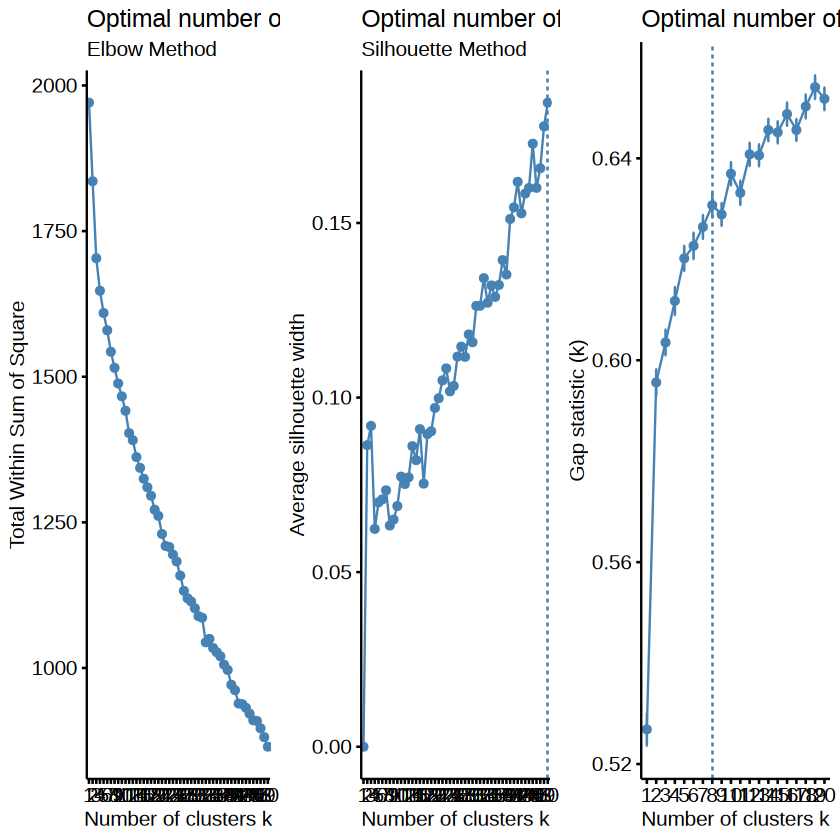

In [263]:
# 将相关矩阵转换为相异矩阵
diss_mx <- as.dist(1 - abs(cormx))
library(factoextra)
# 肘部法则
p_elbow <- fviz_nbclust(as.matrix(diss_mx), kmeans, method = "wss",k.max = 50) + 
  labs(subtitle = "Elbow Method")
# 轮廓系数法
p_sil <- fviz_nbclust(as.matrix(diss_mx), kmeans, method = "silhouette",k.max = 50) + 
  labs(subtitle = "Silhouette Method")
# 差距统计法（耗时较长）
#p_gap <- fviz_nbclust(as.matrix(diss_mx), kmeans, method = "gap_stat",k.max = 20)

# 并排显示结果
library(gridExtra)
grid.arrange(p_elbow, p_sil,p_gap, nrow = 1)

In [264]:
pt = Heatmap(t(transmx),show_row_names = F,name = "cor",km = 10)
print(pt)

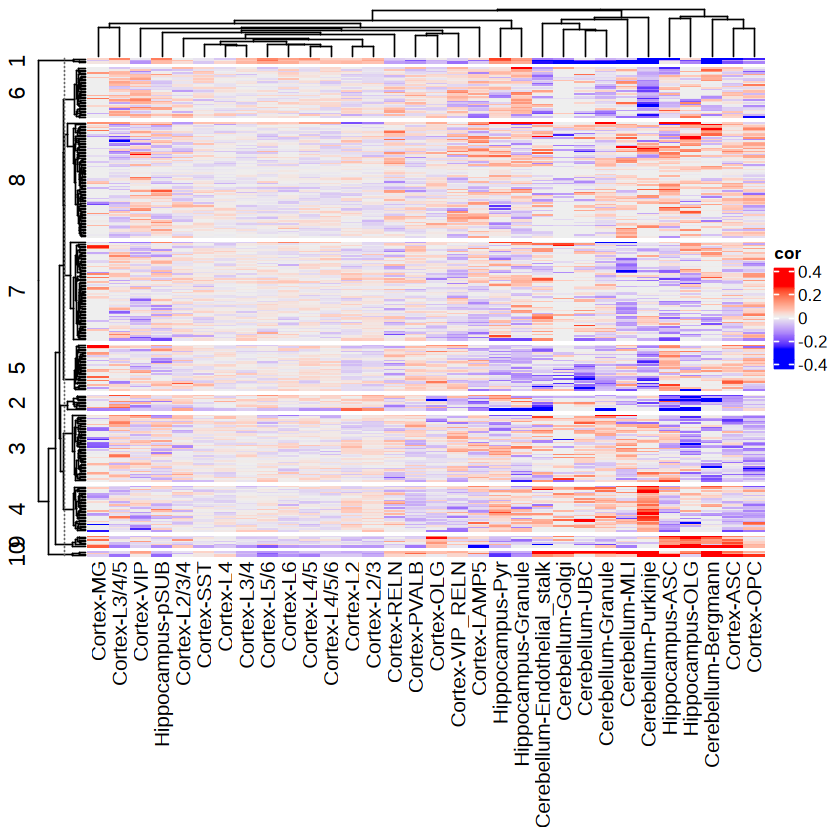

In [265]:
print(pt)

In [207]:
#
library(ComplexHeatmap)
pdf("result/figure_revision/dtu_cluster_test.pdf")
pt = Heatmap(t(transmx),show_row_names = F,name = "cor",km = 10)
print(pt)
dev.off()

pdf 
  2

### GLMM model for RBP gene

In [10]:
cordf.bl = qread(file = "result/figure_revision/SF_DTU_cor_analysis_bin200_celltype_25_12_11.qs")
head(cordf.bl)
nrow(cordf.bl)
cordf.bl$padj = p.adjust(cordf.bl$pvalue)
cordf.bl = cordf.bl[!is.na(cordf.bl$cor),]
cordf.fil = cordf.bl[cordf.bl$padj < 0.05,]
nrow(cordf.fil)

gene_id,transcript_id,cor,pvalue,SF
<chr>,<chr>,<dbl>,<dbl>,<chr>
ACTL6B,XM_005549245.2,-0.017117812,0.20176202,AAR2
ACYP2,NM_001285168.1,0.009465395,0.43721723,AAR2
AGAP3,AGAP3-FS-1,-0.007082468,0.52902731,AAR2
AK1,XM_005582146.2,-0.023200093,0.07903179,AAR2
AK1,XM_005582147.1,-0.026278433,0.05215773,AAR2
AKT3,XM_005539655.2,-0.007354374,0.53501093,AAR2


[1] 483061

[1] 15123

In [14]:
cordf.fil = cordf.fil[abs(cordf.fil$cor) > 0.1,]
nrow(cordf.fil)

[1] 2741

In [6]:
genemx.bl.hub = qread("result/figure_revision/ngscount_bin200_genemx_RBP_25_12_12.qs")
transtl.bl = qread(file = "data/spatial_isoform_ratio_fs_bin200_metacell_filter_25_12_11.qs")

In [10]:
blockid = MySplit(row.names(genemx.bl.hub),"-",5)
genemx.bl.hub = genemx.bl.hub[blockid != "NA",]
blockid = blockid[blockid != "NA"]
coordinates = data.frame("x" = as.numeric(MySplit(blockid,"_",1)),
                        "y" = as.numeric(MySplit(blockid,"_",2)))
rownames(coordinates) = rownames(genemx.bl.hub)
head(coordinates)

,x,y
,<dbl>,<dbl>
cb-cb-NA-Cerebellum-15400_87400,15400,87400
cb-cb-NA-Cerebellum-15400_87800,15400,87800
cb-cb-NA-Cerebellum-15400_88200,15400,88200
cb-cb-NA-Cerebellum-15400_88600,15400,88600
cb-cb-NA-Cerebellum-15800_87000,15800,87000
cb-cb-NA-Cerebellum-15800_87400,15800,87400


In [12]:
transtl.bl$x = as.numeric(MySplit(transtl.bl$blockid,"_",1))
transtl.bl$y = as.numeric(MySplit(transtl.bl$blockid,"_",2))
data_long = merge(transtl.bl[,c("gene_id","transcript_id","metacell","relative","x","y")], genemx.bl.hub,by.x = "metacell",by.y = "row.names")
qsave(data_long,file = "data/spatial_isoform_ratio_fs_bin200_metacell_filter_for_GLMM_25_12_11.qs")

In [7]:
data_long = qread("data/spatial_isoform_ratio_fs_bin200_metacell_filter_for_GLMM_25_12_11.qs")
head(data_long)

,metacell,gene_id,transcript_id,relative,x,y,AAR2,ACIN1,ACO1,ADNP,⋯,ZSCAN26,ZSCAN29,ZSCAN30,ZSCAN31,ZSCAN32,ZSCAN4,ZSCAN5A,ZSCAN9,ZXDC,ZZZ3
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,cb-cb-NA-Cerebellum-15400_87400,RALBP1,XM_005587184.2,1,15400,87400,0,2.254784,0,0,⋯,0,0,0,0,2.032999,0,0,0,0,1.34662
2,cb-cb-NA-Cerebellum-15400_87400,TPM3,XM_005541710.2,1,15400,87400,0,2.254784,0,0,⋯,0,0,0,0,2.032999,0,0,0,0,1.34662
3,cb-cb-NA-Cerebellum-15400_87400,JMJD4,XM_005541049.2,1,15400,87400,0,2.254784,0,0,⋯,0,0,0,0,2.032999,0,0,0,0,1.34662
4,cb-cb-NA-Cerebellum-15400_87400,SNRPN,XM_005558943.2,1,15400,87400,0,2.254784,0,0,⋯,0,0,0,0,2.032999,0,0,0,0,1.34662
5,cb-cb-NA-Cerebellum-15400_87400,RPSA,XM_015445275.1,1,15400,87400,0,2.254784,0,0,⋯,0,0,0,0,2.032999,0,0,0,0,1.34662
6,cb-cb-NA-Cerebellum-15400_87400,ZRANB2,XM_005543027.2,1,15400,87400,0,2.254784,0,0,⋯,0,0,0,0,2.032999,0,0,0,0,1.34662


In [15]:
data_long = data_long[,colnames(data_long) %in% c("metacell","gene_id","transcript_id","relative","x","y",cordf.fil$SF)]
dim(data_long)

[1] 5519140     318

In [16]:
data_long = data_long[data_long$transcript_id %in% cordf.fil$transcript_id,]
dim(data_long)

[1] 1161166     318

In [25]:
colnames(data_long)[7]
cordf.fil[cordf.fil$SF == 'ADNP',]
unique(cordf.fil[cordf.fil$SF == 'ADNP',]$transcript_id)

[1] "ADNP"

gene_id,transcript_id,cor,pvalue,SF,padj
<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>
LOC101925321,LOC101925321-FS-2,-0.1071589,4.900647e-29,ADNP,2.360965e-23


[1] "LOC101925321-FS-2"

In [ ]:
library(mgcv)
library(spdep)
cmpdf = data_long
{
   # cmpdf = merge(transtl[,c("gene_id","transcript_id","metacell","relative")], genemx.hub,by.x = "metacell",by.x = "row.names")
  results <- list()
  for(i in 1:(ncol(cmpdf) - 6)) {
    cmpdfi = cmpdf[,c(1:6,i+6)]
    genei = colnames(cmpdfi)[7]
    colnames(cmpdfi)[7] = "SF"
    cmpdfi = cmpdfi[!is.na(cmpdfi$SF) & !is.na(cmpdfi$relative),]
    cmpdfi = cmpdfi[!is.nan(cmpdfi$SF) & !is.nan(cmpdfi$relative),]

    transhub = unique(cordf.fil[cordf.fil$SF == genei,]$transcript_id)
    for(transcript in transhub) {
      cmpdfj <- cmpdfi[cmpdfi$transcript_id == transcript, ]
      if(nrow(cmpdfj) < 100) next
      gam_model <- tryCatch({
        gam(relative ~ s(SF, bs="tp", k = 5) + s(x, y, bs="gp"), 
            data = cmpdfj, family = betar(), method = "REML")
      }, error = function(e) {
        # 出错时返回NULL
        return(NULL)
      })
      print(i)
      # 只有gam_model不为NULL（即成功拟合）时才保存结果
      if(!is.null(gam_model)) {
        results[[paste(genei, transcript, sep="_")]] <- summary(gam_model)
      }
    }
  }

}

qsave(results,file = "data/spatial_isoform_ratio_fs_bin200_metacell_filter_for_GLMM_result_list_25_12_11.qs")

Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 1


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 2


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 2


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 2


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 3


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 3


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 3


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 3


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 3


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 4


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 4


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 5


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 5


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 6


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 7


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 8


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 9


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 10


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 11


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 12


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 12


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 13


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 14


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 15


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 16


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 17


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 18


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 19


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 19


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 19


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 19


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 19


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 19


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 20


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 20


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 20


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 20


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 20


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 21


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 21


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 21


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 21


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 21


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 21


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 21


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 22


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 22


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 22


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 22


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 22


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 23


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 24


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 24


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 25


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 25


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 25


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 26


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 27


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 28


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 29


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 29


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 29


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 30


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 30


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 31


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 32


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 32


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 33


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 33


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 33


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 34


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 34
[1] 34


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 34


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 34


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 34


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 35


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 35


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 35


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 35


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 35


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 36


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 36


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 37


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 38


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 38


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 38


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 38


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 39


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 40


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 40


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 41


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 41


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 41


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 41


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 42


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 42


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 42


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 42


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 42


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 42


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 42


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 43


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 44


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 44


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 44


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 44


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 45


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 46


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 46


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 46


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 46


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 46


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 46


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 47


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 48


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 49


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 50


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 51


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 52


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 52


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 52


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 52


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 52


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 52


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 53


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 54


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 55


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 56


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 57


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 57


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 57


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 57


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 58


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 59


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 60


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 61


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 62


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 63


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 64


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 65


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 65


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 65


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 65


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 65


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 66


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 66


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 66


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 66


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 67


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 67


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 67


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 67


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 67


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 68


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 68


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 69


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 69


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 69


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 70


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 70


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 70


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 71


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 71


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 71


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 71


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 72


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 72


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 72


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 72


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 72


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 73


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 73


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 73


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 73


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 73


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 74


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 74


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 74


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 74


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 74


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 74


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 75


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 76


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 76


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 76


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 77


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 78


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 79


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 79


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 79


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 79


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 79


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 80


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 80


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 81


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 81


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 82


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 83


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 83


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 83


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 83


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 84


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 85


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 86


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 87


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 88


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 89


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 89


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 90


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 90


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 91


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 91


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 91


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 92


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 92


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 92


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 92


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 92


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 92


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


[1] 93


Warning message in family$saturated.ll(y, prior.weights, theta):
"saturated likelihood may be inaccurate"


In [35]:
# 专门针对您需求提取的简化函数
extract_essential_metrics <- function(summ, model_name) {
  # 获取模型摘要
  # summ <- summary(model)
  
  # 创建数据行
  data.frame(
    # 名称
    name = model_name,
    
    # 模型拟合指标
    adj_r_sq = ifelse(is.null(summ$r.sq), NA, round(summ$r.sq, 4)),
    deviance_explained = ifelse(is.null(summ$dev.expl), NA, round(summ$dev.expl * 100, 1)),  # 百分比，保留一位小数
    
    # REML和样本量
    reml = ifelse(is.null(summ$sp.criterion), NA, round(-summ$sp.criterion, 1)),  # 取负值
    n = ifelse(is.null(summ$n), NA, summ$n),
    
    # SF效应
    sf_edf = ifelse(!is.null(summ$s.table) && nrow(summ$s.table) >= 1, 
                   round(summ$s.table[1, "edf"], 3), NA),
    sf_p_value = ifelse(!is.null(summ$s.table) && nrow(summ$s.table) >= 1, 
                       summ$s.table[1, "p-value"], NA),
    
    # 空间效应
    spatial_edf = ifelse(!is.null(summ$s.table) && nrow(summ$s.table) >= 2, 
                        round(summ$s.table[2, "edf"], 3), NA),
    spatial_p_value = ifelse(!is.null(summ$s.table) && nrow(summ$s.table) >= 2, 
                            summ$s.table[2, "p-value"], NA),
    
    # 模型类型（可选）
    # family = ifelse(!is.null(model$family), model$family$family, NA),
    
    # 提取时间戳
    extraction_time = Sys.time(),
    
    stringsAsFactors = FALSE
  )
}

# 主函数：处理整个results列表
create_summary_dataframe <- function(results) {
  # 验证输入
  if (!is.list(results) || length(results) == 0) {
    stop("results必须是非空列表")
  }
  
  # 获取模型名称
  if (is.null(names(results))) {
    # 从图片看，模型名称是第一个元素的名称
    model_names <- sapply(1:length(results), function(i) {
      if (!is.null(names(results)[i]) && names(results)[i] != "") {
        names(results)[i]
      } else {
        # 尝试从模型对象中提取
        if (!is.null(results[[i]]$model_name)) {
          results[[i]]$model_name
        } else {
          paste0("Model_", i)
        }
      }
    })
  } else {
    model_names <- names(results)
  }
  
  # 批量提取
  message(paste("开始处理", length(results), "个模型..."))
  
  summary_list <- list()
  error_count <- 0
  error_models <- character()
  
  for (i in 1:length(results)) {
    tryCatch({
      # 提取单个模型信息
      model_summary <- extract_essential_metrics(results[[i]], model_names[i])
      summary_list[[i]] <- model_summary
      
      # 进度显示
      if (i %% 100 == 0) {
        message(paste("已处理", i, "个模型..."))
      }
    }, error = function(e) {
      error_count <<- error_count + 1
      error_models <<- c(error_models, model_names[i])
      warning(paste("模型", model_names[i], "处理失败:", e$message))
      
      # 创建包含错误信息的数据行
      error_row <- data.frame(
        name = model_names[i],
        adj_r_sq = NA,
        deviance_explained = NA,
        reml = NA,
        n = NA,
        sf_edf = NA,
        sf_p_value = NA,
        spatial_edf = NA,
        spatial_p_value = NA,
        # family = NA,
        extraction_time = Sys.time(),
        error = conditionMessage(e),
        stringsAsFactors = FALSE
      )
      summary_list[[i]] <- error_row
    })
  }
  
  # 合并所有结果
  final_df <- do.call(rbind, summary_list)
  
  # 添加处理统计信息
  if (error_count > 0) {
    message(paste("\n处理完成！成功:", length(results) - error_count, 
                 "个，失败:", error_count, "个"))
    message("失败的模型:", paste(error_models, collapse = ", "))
  } else {
    message(paste("\n所有", length(results), "个模型处理完成！"))
  }
  
  return(final_df)
}


# 假设您的results是一个列表，每个元素是一个GAM模型
# 应用函数
summary_df <- create_summary_dataframe(results)
# 查看前几行
head(summary_df)
# 查看数据结构
str(summary_df)
# 查看基本统计
summary(summary_df[, c("adj_r_sq", "deviance_explained", "n")])

开始处理 2740 个模型...

已处理 100 个模型...

已处理 200 个模型...

已处理 300 个模型...

已处理 400 个模型...

已处理 500 个模型...

已处理 600 个模型...

已处理 700 个模型...

已处理 800 个模型...

已处理 900 个模型...

已处理 1000 个模型...

已处理 1100 个模型...

已处理 1200 个模型...

已处理 1300 个模型...

已处理 1400 个模型...

已处理 1500 个模型...

已处理 1600 个模型...

已处理 1700 个模型...

已处理 1800 个模型...

已处理 1900 个模型...

已处理 2000 个模型...

已处理 2100 个模型...

已处理 2200 个模型...

已处理 2300 个模型...

已处理 2400 个模型...

已处理 2500 个模型...

已处理 2600 个模型...

已处理 2700 个模型...


所有 2740 个模型处理完成！



,name,adj_r_sq,deviance_explained,reml,n,sf_edf,sf_p_value,spatial_edf,spatial_p_value,extraction_time
,<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dttm>
1,ADNP_LOC101925321-FS-2,0.0331,272.5,7128.0,10832,3.984,0.000000e+00,29.174,0.0000000000,2025-12-15 12:41:52
2,AFF2_XM_005554942.2,0.0088,-1.0,99032.0,4970,1.052,7.401209e-04,7.168,0.0008588995,2025-12-15 12:41:52
3,AFF2_XM_005560220.2,0.0508,-6.7,43502.5,4787,2.909,5.768212e-07,16.828,0.0000000000,2025-12-15 12:41:52
4,AFF2_XM_005575915.2,0.0031,-0.1,153862.5,6292,1.028,1.186697e-02,3.493,0.1885525221,2025-12-15 12:41:52
5,AFF3_LOC101925321-FS-2,-0.0080,202.6,6930.6,10832,3.993,0.000000e+00,28.970,0.0000000000,2025-12-15 12:41:52
6,AFF3_LOC101925321-FS-3,-0.0682,615.1,7398.5,11317,3.992,0.000000e+00,29.226,0.0000000000,2025-12-15 12:41:52


'data.frame':	2740 obs. of  10 variables:
 $ name              : chr  "ADNP_LOC101925321-FS-2" "AFF2_XM_005554942.2" "AFF2_XM_005560220.2" "AFF2_XM_005575915.2" ...
 $ adj_r_sq          : num  0.0331 0.0088 0.0508 0.0031 -0.008 -0.0682 0.0114 0.0257 0.0512 0.0781 ...
 $ deviance_explained: num  272.5 -1 -6.7 -0.1 202.6 ...
 $ reml              : num  7128 99032 43502 153862 6931 ...
 $ n                 : int  10832 4970 4787 6292 10832 11317 5359 12811 11666 8768 ...
 $ sf_edf            : num  3.98 1.05 2.91 1.03 3.99 ...
 $ sf_p_value        : num  0.00 7.40e-04 5.77e-07 1.19e-02 0.00 ...
 $ spatial_edf       : num  29.17 7.17 16.83 3.49 28.97 ...
 $ spatial_p_value   : num  0 0.000859 0 0.188553 0 ...
 $ extraction_time   : POSIXct, format: "2025-12-15 12:41:52" "2025-12-15 12:41:52" ...


    adj_r_sq        deviance_explained        n        
 Min.   :-0.13820   Min.   :-6543.200   Min.   : 4588  
 1st Qu.: 0.02328   1st Qu.:  -14.500   1st Qu.: 5713  
 Median : 0.04620   Median :   -6.300   Median : 7784  
 Mean   : 0.04560   Mean   :   -1.036   Mean   : 7960  
 3rd Qu.: 0.06953   3rd Qu.:   -2.100   3rd Qu.:10380  
 Max.   : 0.13930   Max.   : 2473.000   Max.   :14445  

In [41]:
nrow(summary_df)
nrow(summary_df[summary_df$sf_p_value < 0.01,])
nrow(summary_df[summary_df$spatial_p_value < 0.01 & summary_df$sf_p_value > 0.01,])

[1] 2740

[1] 2544

[1] 93

In [45]:
genean = unique(transtl.bl[,c("gene_id","transcript_id")])
split_result <- strsplit(summary_df$name, "_", fixed = TRUE)
summary_df$SF_gene <- sapply(split_result, function(x) x[1])
summary_df$transcript_id <- sapply(split_result, function(x) paste(x[-1], collapse = "_"))
summary_df = merge(summary_df,genean,by = "transcript_id")
head(summary_df)

,transcript_id,name,adj_r_sq,deviance_explained,reml,n,sf_edf,sf_p_value,spatial_edf,spatial_p_value,extraction_time,SF_gene,gene_id
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dttm>,<chr>,<chr>
1,CABP1-FS-1,KHDRBS3_CABP1-FS-1,0.0284,-4.5,58215.1,5356,3.662,0,10.848,0,2025-12-15 12:41:52,KHDRBS3,CABP1
2,CABP1-FS-1,MEF2C_CABP1-FS-1,0.0285,-4.5,58209.6,5356,3.785,0,12.795,0,2025-12-15 12:41:53,MEF2C,CABP1
3,CABP1-FS-1,ETS2_CABP1-FS-1,0.0288,-4.6,58213.6,5356,3.391,0,12.758,0,2025-12-15 12:41:52,ETS2,CABP1
4,CABP1-FS-1,EGR1_CABP1-FS-1,0.0249,-4.4,58197.6,5356,3.481,0,10.570,0,2025-12-15 12:41:52,EGR1,CABP1
5,CABP1-FS-1,ELAVL4_CABP1-FS-1,0.0272,-4.5,58206.0,5356,3.543,0,13.217,0,2025-12-15 12:41:52,ELAVL4,CABP1
6,CABP1-FS-1,GTF3A_CABP1-FS-1,0.0304,-4.6,58221.5,5356,3.665,0,12.911,0,2025-12-15 12:41:52,GTF3A,CABP1


In [121]:
# summary_df[summary_df$spatial_p_value < 0.01 & summary_df$gene_id == "ARPP19",]
summary_df$spatial_fdr = p.adjust(summary_df$spatial_p_value)
summary_df$sf_fdr = p.adjust(summary_df$sf_p_value)
summary_df.hub = summary_df[summary_df$spatial_fdr < 0.01 & summary_df$sf_fdr < 0.01 & abs(summary_df$adj_r_sq) > 0.1,]
nrow(summary_df.hub)
# nrow(summary_df.hub)
summary_df.hub[summary_df.hub$gene_id == "DDRGK1",]
summary_df.hub[summary_df.hub$gene_id == "ARPP19",]

[1] 65

,transcript_id,name,adj_r_sq,deviance_explained,reml,n,sf_edf,sf_p_value,spatial_edf,spatial_p_value,extraction_time,SF_gene,gene_id,spatial_fdr,sf_fdr
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dttm>,<chr>,<chr>,<dbl>,<dbl>
1469,XM_005568473.2,CUX2_XM_005568473.2,0.1162,-5.9,87017.3,7844,3.802,0,22.463,0,2025-12-15 12:41:52,CUX2,DDRGK1,0,0
1491,XM_005568473.2,TSC22D1_XM_005568473.2,0.1067,-5.8,86973.7,7844,3.969,0,25.186,0,2025-12-15 12:41:53,TSC22D1,DDRGK1,0,0
1497,XM_005568473.2,HOPX_XM_005568473.2,0.1128,-5.9,86995.8,7844,3.970,0,22.256,0,2025-12-15 12:41:52,HOPX,DDRGK1,0,0


,transcript_id,name,adj_r_sq,deviance_explained,reml,n,sf_edf,sf_p_value,spatial_edf,spatial_p_value,extraction_time,SF_gene,gene_id,spatial_fdr,sf_fdr
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dttm>,<chr>,<chr>,<dbl>,<dbl>
2624,XM_015452432.1,TSC22D1_XM_015452432.1,0.1031,-6.8,86040.9,8768,3.967,0,25.197,0,2025-12-15 12:41:53,TSC22D1,ARPP19,0,0
2672,XM_015452432.1,CUX2_XM_015452432.1,0.1025,-6.8,86017.2,8768,3.825,0,25.798,0,2025-12-15 12:41:52,CUX2,ARPP19,0,0
2681,XM_015452432.1,MEF2C_XM_015452432.1,0.1007,-6.7,86021.9,8768,3.947,0,26.252,0,2025-12-15 12:41:53,MEF2C,ARPP19,0,0


In [122]:
table(summary_df.hub$gene_id)
table(summary_df.hub$SF_gene)


      ARPP19      ATP6V0B          CCK       DDRGK1        FXYD1         HOPX 
           3            1            5            3            1            1 
LOC101925321 LOC102118724 LOC102141554         SNX3 
          47            1            1            2 


  ARNT2   ARNTL    ATF4  BCL11A BHLHE40  CAMTA2   CDIP1   CELF2   CELF5    CUX2 
      1       1       1       2       1       1       1       1       1       2 
   EGR1   EIF4H  ELAVL2  ELAVL4     ERH   G3BP2   GAPDH  HIVEP2     HLF  HNRNPK 
      1       1       1       2       1       1       4       1       1       1 
   HOPX     ID2 KHDRBS2 KHDRBS3    LHX2    LSM1   MEF2A   MEF2C   NAA38   NR2F1 
      3       1       1       2       1       1       1       3       1       1 
  NR3C1   NR4A1    OTX2    PUM1    PUM2   RCAN2   SATB1   SATB2 SMARCC2   SNRPB 
      1       1       1       1       1       1       1       2       1       1 
 SNRPD2   SNRPN    SUB1   SYNJ1 TAX1BP1    TCF4    THRA    THRB TSC22D1  ZBTB18 
      1       1       1       1       1       1       1       1       3       1 
ZCCHC17 
      1 

In [ ]:
genedf = melt(genemx.bl.hub)
colnames(genedf) = c("Metacell","gene_id","norm")
genedf$Metacell = as.character(genedf$Metacell)
genedf$gene_id = as.character(genedf$gene_id)
# genedf = genedf[genedf$Metacell %in% transtl.bl$metacell,]
genedf$coord = MySplit(genedf$Metacell,"-",5)
genedf = genedf[genedf$coord != "NA",]
genedf$x = as.numeric(MySplit(genedf$coord,"_",1))
genedf$y = as.numeric(MySplit(genedf$coord,"_",2))

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


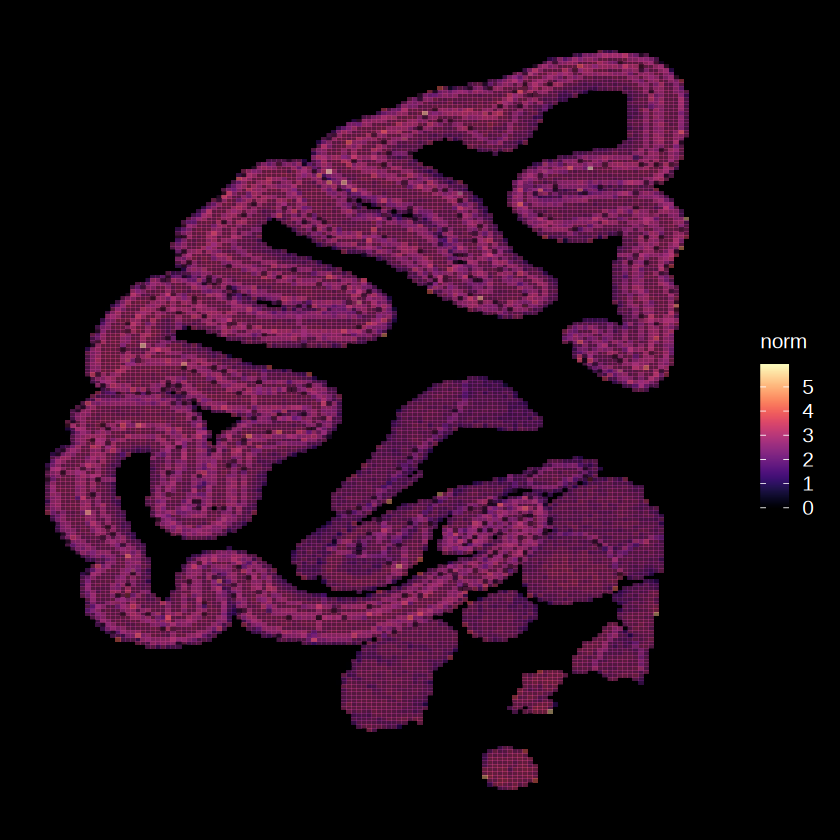

In [120]:
geneid = "GAPDH" 
pi = ggplot(genedf[genedf$gene_id == geneid,],aes(x = x,y = y,fill = norm)) + geom_tile(size = 0.01,alpha = 0.5) + 
                        scale_fill_viridis(option = "A") + 
                        theme_presentation() + 
                        scale_x_reverse() + scale_y_reverse()
pi

In [ ]:
#show case plot
genedf = merge(genedf,moduledf,by.x = "gene_id",by.y = "name")
genedf[genedf$module == "1",]
genedf = genedf %>% group_by(coord,module) %>% summarise(norm = mean(norm))
genedf = genedf[!is.na(genedf$norm),]

# head(genedf)
# ggplot(genedf,aes(x = x,y = y,fill = norm)) + geom_tile() + scale_fill_viridis(option = "A") + theme_presentation() + 
#                         scale_x_reverse() + scale_y_reverse() + facet_wrap(~module)
moduleid = unique(genedf$module)
pcasels = list()
for(i in 1:length(moduleid)){
    pi = ggplot(genedf[genedf$module == moduleid[i],],aes(x = x,y = y,fill = norm)) + geom_tile() + scale_fill_viridis(option = "A") + 
                        theme_presentation() + 
                        scale_x_reverse() + scale_y_reverse() + ggtitle(paste0("Module",moduleid[i]))
    pcasels[[i]] = pi
}
length(moduleid)
pcaset = ggarrange(plotlist = pcasels,nrow = 3,ncol = 3)
pcaset
ggexport(pcaset,filename = "result/figure_revision/regulon_bin400_network_graph_gene_norm_cases_25_10_20.pdf",
         width = 9,height = 10)

In [ ]:
#case
transtl.case = transtl.bl[transtl.bl$transcript_id %in% cordf.fil[cordf.fil$gene_id %in% c("DDRGK1","ARPP19","SEPT11","RCAN2"),]$transcript_id,]
transtl.case$name = paste0(transtl.case$gene_id,"-",transtl.case$transcript_id)
#transtl.case = merge(transtl.case,moduledf,by = "name")
transtl.case$x = as.numeric(MySplit(transtl.case$blockid,"_",1))
transtl.case$y = as.numeric(MySplit(transtl.case$blockid,"_",2))
#transtl.case = transtl.case[order(transtl.case$module),]
caseid = unique(transtl.case$name)
pcasels1 = list()
for(i in 1:length(caseid)){
    pi = ggplot(transtl.case[transtl.case$name == caseid[i],],aes(x = x,y = y,fill = relative)) + 
                        geom_tile() + scale_fill_viridis(option = "A") + 
                        theme_presentation() + 
                        scale_x_reverse() + scale_y_reverse() + 
                        ggtitle(caseid[i])
    pcasels1[[i]] = pi
}
pcaset1 = ggarrange(plotlist = pcasels1,ncol = 2)
pcaset1

### Splicing type analysis

In [42]:
filels = list.files("ref/isoform_suppa/",pattern = "*_strict.ioe")
MySplit(filels,"_",3)

[1] "A3" "A5" "AF" "AL" "MX" "RI" "SE"

In [62]:
#build splicing type df
groupid = MySplit(filels,"_",3)
# eventt = NULL
trans_pairt = NULL
for(i in 1:length(filels)){
    eventi = read.table(paste0("ref/isoform_suppa/",filels[i]),header = T)
    library(dplyr)
    library(tidyr) # 用于 unnest 函数
    trans_pairi <- eventi %>%
      # group_by(group) %>% 
      rowwise() %>% # 对每一行进行操作
      mutate(
        # 将逗号分隔的字符串转换为转录本列表
        alt_tx_list = list(strsplit(alternative_transcripts, ",\\s*")[[1]]),
        total_tx_list = list(strsplit(total_transcripts, ",\\s*")[[1]]),
        diff_tx = list(alt_tx_list),
        other_tx = list(setdiff(total_tx_list, alt_tx_list)),
        pairs = list(
          if (length(diff_tx) > 0 & length(other_tx) > 0) {
            grid <- expand.grid(transcript1 = diff_tx, transcript2 = other_tx, stringsAsFactors = FALSE)
            grid <- grid[grid$transcript1 != grid$transcript2, ]
            if (nrow(grid) > 0) {
              grid
            } else {
              NULL
            }
          } else {
            NULL
          }
        )
      ) %>%
      select(seqname, gene_id, event_id, pairs) %>%
      unnest(pairs, keep_empty = TRUE) %>% # keep_empty确保即使没有配对的事件行也不会被丢弃（显示为NA）
      filter(!is.na(transcript1) & !is.na(transcript2))
    trans_pairi$group = groupid[i]
    trans_pairt = rbind(trans_pairt,trans_pairi)
}
table(trans_pairt$group)
# head(eventt)


    A3     A5     AF     AL     MX     RI     SE 
 58075  36283  41164   9148   5593  11262 131477 

In [69]:
write.csv(trans_pairt,file = "ref/isoform_suppa/isoform_event_paired_25_12_10.csv",row.names = F,quote = F)

In [54]:
trans_pairt = read.csv("ref/isoform_suppa/isoform_event_paired_25_12_10.csv")

In [124]:
isosigls.t44 = qread("data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")
isosigls.t42 = qread("data/dtu_analysis/T42_dtu_isoform_ls_fsraw_cor_25_12_16.qs")
isosigls.t47 = qread("data/dtu_analysis/T47_dtu_isoform_ls_fsraw_cor_25_12_16.qs")

In [169]:
isosigi = isosigls.t47$subcortical
isosigi.hub = isosigi[isosigi$sig != "N",]
areatrs = unique(isosigi.hub$areatr)
areatrs

[1] "Hippocampus"    "Globuspallidus" "Claustrum"      "Hypothalamus"  
 [5] "Striatum"       "Cortex"         "Thalamus"       "Whitematter"   
 [9] "Midbrain"       "Ventricle"      "Amygdala"

In [231]:
isosigi = isosigls.t47$class
isosigi.hub = isosigi[isosigi$sig != "N",]
isosigi.hub

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
24,ACBD5,XM_005564838.2,GLU,22,75,0.2933333,0.23362319,0.17391304,0.1194203,Up,1.012399e-03,2.195941e-02
117,ALDOC,XM_005583239.2,GLU,125,182,0.6868132,0.79853959,0.85440279,-0.1675896,Down,7.743238e-04,1.856339e-02
118,ALDOC,XM_005583239.2,NonNeuron,54,62,0.8709677,0.79853959,0.76232551,0.1086422,Up,7.743238e-04,1.856339e-02
120,ALDOC,XM_005583240.2,GLU,39,182,0.2142857,0.11996097,0.07279861,0.1414871,Up,7.743238e-04,1.856339e-02
239,ATG3,XM_005548160.1,GABA,19,24,0.7916667,0.91641414,0.97878788,-0.1871212,Down,2.336001e-03,4.111914e-02
241,ATG3,XM_005548160.1,NonNeuron,21,21,1.0000000,0.91641414,0.87462121,0.1253788,Up,2.336001e-03,4.111914e-02
319,ATPAF2,XM_005583037.2,GLU,94,99,0.9494949,0.80808081,0.66666667,0.2828283,Up,4.256196e-04,1.250772e-02
320,ATPAF2,XM_005583037.2,NonNeuron,14,21,0.6666667,0.80808081,0.94949495,-0.2828283,Down,4.256196e-04,1.250772e-02
447,C15H9orf116,C15H9orf116-FS-3,GLU,43,256,0.1679688,0.09804986,0.06309042,0.1048783,Up,2.108293e-06,1.920655e-04


In [242]:
isosigi = isosigls.t47$class
isosigi.hub = isosigi[isosigi$sig != "N",]
areatrs = unique(isosigi.hub$areatr)
isogroup = NULL
i = 3
dfi = isosigi.hub[isosigi.hub$areatr == areatrs[i],]
dfi
difftrans = unique(dfi[dfi$sig == "Up",]$transcript_id)
difftrans
othertrans = unique(dfi[dfi$sig == "Down",]$transcript_id)
othertrans
eventpair = trans_pairt[(trans_pairt$transcript1 %in% difftrans) & 
                                    (trans_pairt$transcript2 %in% othertrans),]
eventpair = unique(eventpair[,c("transcript1","group")])
eventpair
dfi = merge(dfi,eventpair[,c("transcript1","group")],by.x = "transcript_id",by.y = "transcript1")
isogroup = rbind(isogroup,dfi)

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
239,ATG3,XM_005548160.1,GABA,19,24,0.7916667,0.91641414,0.97878788,-0.1871212,Down,2.336001e-03,4.111914e-02
455,C15H9orf116,XM_005580474.2,GABA,15,52,0.2884615,0.22101678,0.18729441,0.1011671,Up,2.108293e-06,1.920655e-04
741,CD47,XM_005548232.2,GABA,16,28,0.5714286,0.48740234,0.44538922,0.1260393,Up,2.913571e-05,1.552131e-03
1062,CRIP2,XM_005562415.2,GABA,13,75,0.1733333,0.25219653,0.29162812,-0.1182948,Down,1.961810e-04,6.619291e-03
1065,CRIP2,XM_005562416.2,GABA,60,75,0.8000000,0.71591119,0.67386679,0.1261332,Up,1.961810e-04,6.619291e-03
1361,DYNC1I1,NM_001283733.1,GABA,19,21,0.9047619,0.74835587,0.67015286,0.2346090,Up,1.261814e-03,2.631366e-02
1473,EPHB6,XM_015448178.1,GABA,48,68,0.7058824,0.52510078,0.43471000,0.2711724,Up,1.776651e-05,1.079019e-03
1870,GRIA3,GRIA3-FS-1,GABA,18,32,0.5625000,0.77474954,0.88087432,-0.3183743,Down,1.579955e-03,3.198532e-02
1873,GRIA3,XM_005594497.2,GABA,11,32,0.3437500,0.16667805,0.07814208,0.2656079,Up,1.579955e-03,3.198532e-02


[1] "XM_005580474.2"    "XM_005548232.2"    "XM_005562416.2"   
 [4] "NM_001283733.1"    "XM_015448178.1"    "XM_005594497.2"   
 [7] "XM_005579506.2"    "XM_015455891.1"    "XR_286099.2"      
[10] "LOC107126444-FS-2" "XM_015430667.1"    "XM_005582047.2"   
[13] "XM_005565597.2"    "XM_005557063.2"    "XM_015452101.1"   
[16] "PSMD8-FS-2"        "XM_005582639.2"    "XM_015433181.1"   
[19] "XM_005581141.2"    "XM_015447317.1"    "XM_005577064.2"

[1] "XM_005548160.1"    "XM_005562415.2"    "GRIA3-FS-1"       
 [4] "NM_001287693.1"    "XM_015439622.1"    "LOC107126444-FS-4"
 [7] "XM_015437605.1"    "XM_005576065.2"    "NM_001283851.1"   
[10] "XM_005582051.2"    "XM_005557062.2"    "XM_005542114.2"   
[13] "XM_005582641.2"    "XM_005581140.2"    "NM_001287327.1"   
[16] "XM_005580522.2"    "XM_005572060.2"    "YAE1D1-FS-2"

,transcript1,group
,<chr>,<chr>
116068,XM_015455891.1,AF
142308,XM_005581141.2,AL
213991,XM_005562416.2,SE
280895,XR_286099.2,SE


In [239]:
isogroup
isogroup %>% group_by(areatr,group) %>% summarise(count = length(unique(transcript_id)))

transcript_id,gene_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj,group
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
XM_005543711.2,C1H1orf50,GLU,68,132,0.5151515,0.4154040,0.36553030,0.1496212,Up,8.146258e-04,0.019028823,SE
XM_005548341.2,CLDND1,GLU,17,33,0.5151515,0.2878788,0.06060606,0.4545455,Up,1.958484e-04,0.006619291,SE
XM_005562416.2,CRIP2,GLU,378,470,0.8042553,0.7159112,0.67173913,0.1325162,Up,1.961810e-04,0.006619291,SE
XM_005575586.2,TPRKB,GLU,55,176,0.3125000,0.1720679,0.10185185,0.2106481,Up,2.800994e-03,0.043249245,A5
XM_005579506.2,GRIA4,GLU,96,146,0.6575342,0.5440658,0.48733154,0.1702027,Up,2.959767e-03,0.044939132,A5
XM_005583240.2,ALDOC,GLU,39,182,0.2142857,0.1199610,0.07279861,0.1414871,Up,7.743238e-04,0.018563394,SE
XM_015447270.1,DYNC1I1,GLU,44,113,0.3893805,0.2855994,0.18181818,0.2075623,Up,1.261814e-03,0.026313659,A3
XR_001488730.1,LOC102115157,GLU,130,159,0.8176101,0.6815323,0.54545455,0.2721555,Up,6.585196e-05,0.002608310,SE


`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


areatr,group,count
<chr>,<chr>,<int>
GLU,A3,1
GLU,A5,2
GLU,SE,5


In [243]:
isosigi = isosigls.t44$subcortical
CalAStype = function(isosigi){
    isosigi.hub = isosigi[isosigi$sig != "N",]
    areatrs = unique(isosigi.hub$areatr)
    isogroup = NULL
    for(i in 1:length(areatrs)){
        dfi = isosigi.hub[isosigi.hub$areatr == areatrs[i],]
        difftrans = unique(dfi[dfi$sig == "Up",]$transcript_id)
        # print(i)
        if(length(difftrans) > 50){
            othertrans = unique(dfi[dfi$sig == "Down",]$transcript_id)
            eventpair = trans_pairt[(trans_pairt$transcript1 %in% difftrans) & 
                                    (trans_pairt$transcript2 %in% othertrans),]
        }
        # othertrans = unique(isosigi$transcript_id)
        # othertrans = othertrans[!othertrans %in% difftrans]
        
        if(nrow(eventpair) != 0){
            eventpair = unique(eventpair[,c("transcript1","group")])
            dfi = merge(dfi,eventpair[,c("transcript1","group")],by.x = "transcript_id",by.y = "transcript1")
            isogroup = rbind(isogroup,dfi)
        }
        
    }
    isogroup.st = isogroup %>% group_by(areatr,group) %>% summarise(count = length(unique(transcript_id)))
}
isogroup.t44 = CalAStype(isosigls.t44$class)
isogroup.t42 = CalAStype(isosigls.t42$class)
isogroup.t47 = CalAStype(isosigls.t47$class)
isogroup.t44$mygroup = "T44"
isogroup.t42$mygroup = "T42"
isogroup.t47$mygroup = "T47"
isogroup = rbind(isogroup.t44,isogroup.t42,isogroup.t47)
isogroup = isogroup %>% group_by(areatr,mygroup) %>% mutate(ratio = count/sum(count))
# isogroup
# ggplot(isogroup.st,aes(x = areatr,y = count,fill = group)) + geom_bar(stat = "identity",position = "fill")

`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
✔ split_plot: split into 6 plots across 1 page

file saved to result/figure_revision/AS_type_stat_between_replicates_subcortical_25_12_16.pdf



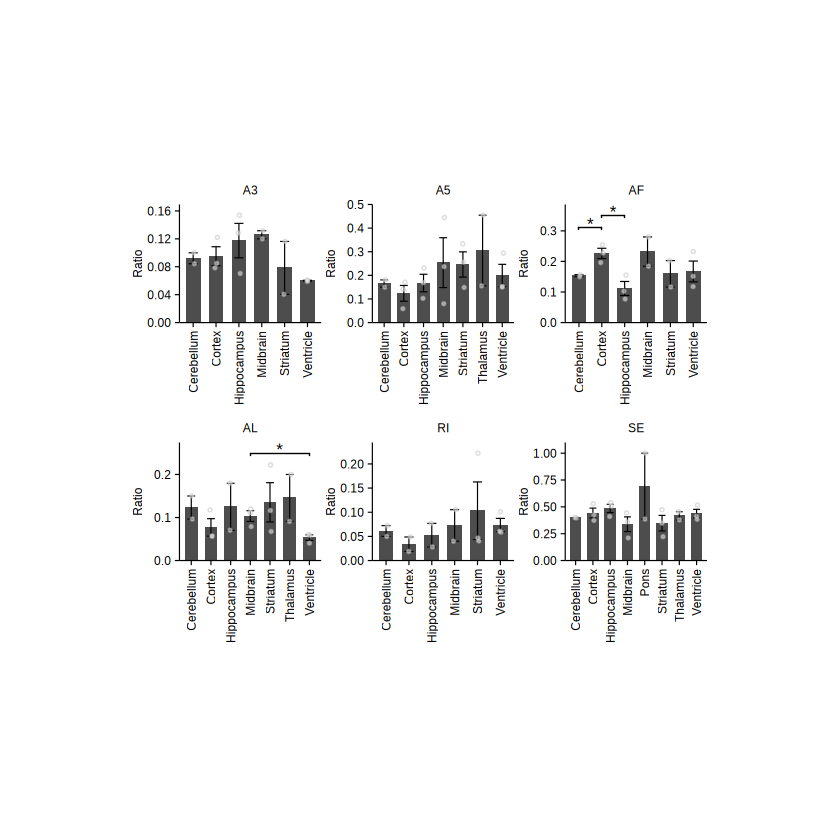

In [249]:
# 加载必要的包
library(tidyverse)
library(tidyplots)
library(ggpubr)
library(vegan)
isogroup.t44 = CalAStype(isosigls.t44$subcortical)
isogroup.t42 = CalAStype(isosigls.t42$subcortical)
isogroup.t47 = CalAStype(isosigls.t47$subcortical)
isogroup.t44$mygroup = "T44"
isogroup.t42$mygroup = "T42"
isogroup.t47$mygroup = "T47"
isogroup = rbind(isogroup.t44,isogroup.t42,isogroup.t47)
isogroup = isogroup %>% group_by(areatr,mygroup) %>% mutate(ratio = count/sum(count))
# isogroup
isogroup.fil = isogroup[isogroup$group != "MX",] %>% group_by(areatr,group) %>% filter(n() > 1, )
p1 <- isogroup.fil |>
  tidyplot(x = areatr, y = ratio) |>
  add_mean_bar(alpha = 0.7) |>
  add_sem_errorbar() |>
  add_data_points_jitter(color = "grey", size = 0.5, alpha = 0.5,shape = 21,fill = "white") |> 
  add_test_asterisks(method = "t_test", hide.ns = TRUE, hide_info = TRUE) |>
  adjust_y_axis_title("Ratio") |>
  adjust_x_axis_title("") |>
  adjust_x_axis(rotate_labels = 90) |>
  remove_legend() |>
  adjust_colors(new_colors = "black") |> 
  split_plot(group)

print(p1)

ggexport(p1,filename = "result/figure_revision/AS_type_stat_between_replicates_subcortical_25_12_16.pdf",width = 9,height = 6)


`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
✔ split_plot: split into 6 plots across 1 page

file saved to result/figure_revision/AS_type_stat_between_replicates_layer_25_12_16.pdf



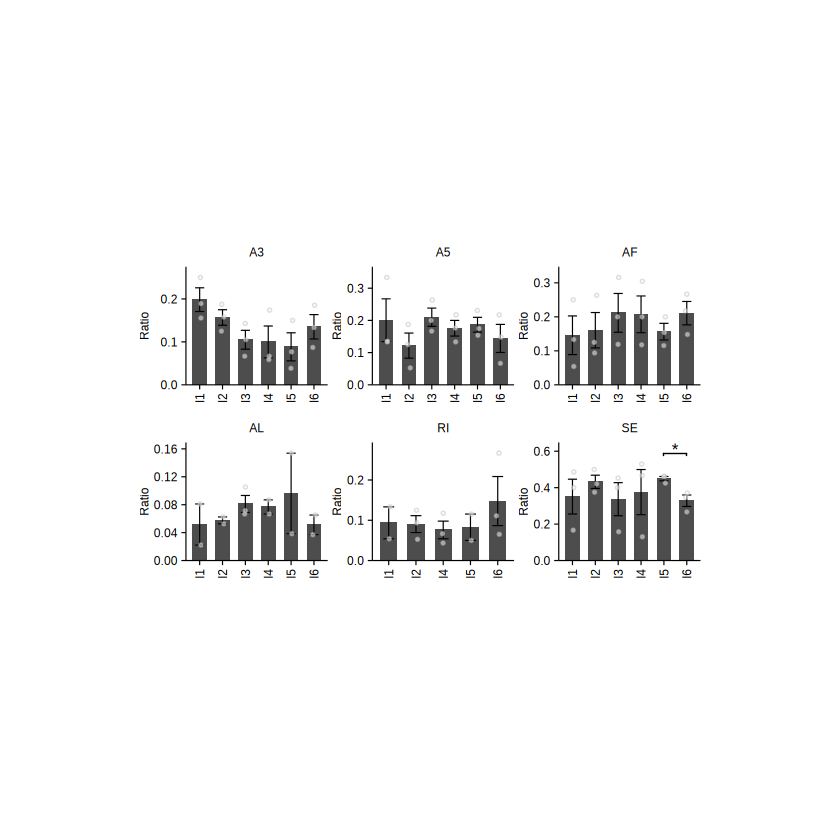

In [250]:
# 加载必要的包
library(tidyverse)
library(tidyplots)
library(ggpubr)
library(vegan)
isogroup.t44 = CalAStype(isosigls.t44$layer)
isogroup.t42 = CalAStype(isosigls.t42$layer)
isogroup.t47 = CalAStype(isosigls.t47$layer)
isogroup.t44$mygroup = "T44"
isogroup.t42$mygroup = "T42"
isogroup.t47$mygroup = "T47"
isogroup = rbind(isogroup.t44,isogroup.t42,isogroup.t47)
isogroup = isogroup %>% group_by(areatr,mygroup) %>% mutate(ratio = count/sum(count))
# isogroup
isogroup.fil = isogroup[isogroup$group != "MX",] %>% group_by(areatr,group) %>% filter(n() > 1, )
p2 <- isogroup.fil |>
  tidyplot(x = areatr, y = ratio) |>
  add_mean_bar(alpha = 0.7) |>
  add_sem_errorbar() |>
  add_data_points_jitter(color = "grey", size = 0.5, alpha = 0.5,shape = 21,fill = "white") |> 
  add_test_asterisks(method = "t_test", hide.ns = TRUE, hide_info = TRUE) |>
  adjust_y_axis_title("Ratio") |>
  adjust_x_axis_title("") |>
  adjust_x_axis(rotate_labels = 90) |>
  remove_legend() |>
  adjust_colors(new_colors = "black") |> 
  split_plot(group)

print(p2)
ggexport(p2,filename = "result/figure_revision/AS_type_stat_between_replicates_layer_25_12_16.pdf",width = 9,height = 6)

# ggexport(p,filename = "../analysis/VMHvl/Variable_group_stat_bar_total_with_pvalue_kw_q_25_12_15.pdf",width = 12,height = 16)


`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
✔ split_plot: split into 6 plots across 1 page

file saved to result/figure_revision/AS_type_stat_between_replicates_subclass_25_12_16.pdf



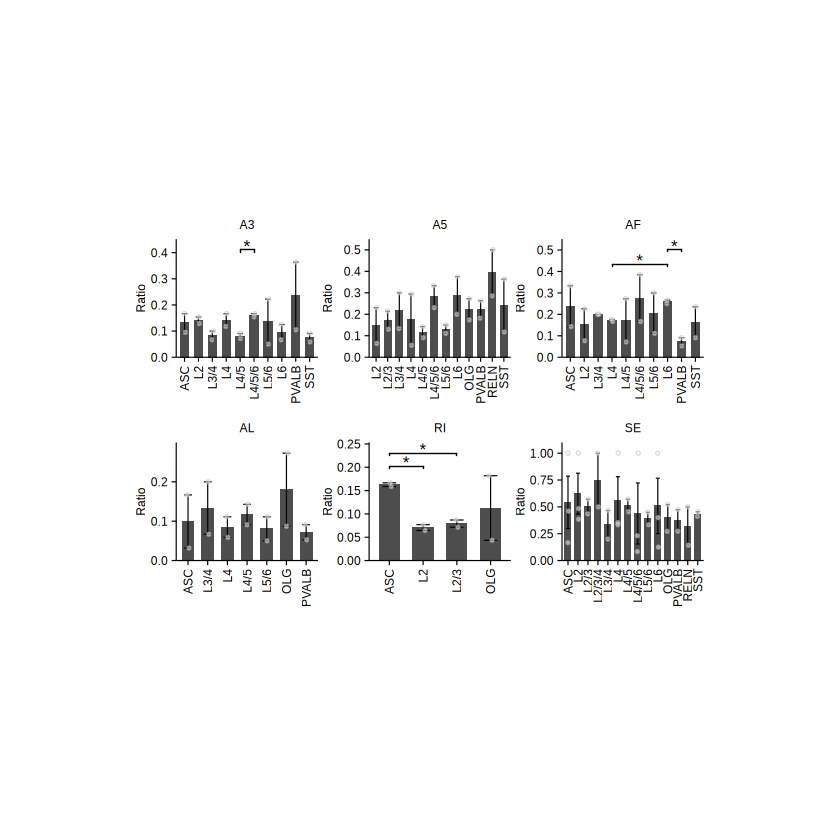

In [251]:
# 加载必要的包
library(tidyverse)
library(tidyplots)
library(ggpubr)
library(vegan)
isogroup.t44 = CalAStype(isosigls.t44$subclass)
isogroup.t42 = CalAStype(isosigls.t42$subclass)
isogroup.t47 = CalAStype(isosigls.t47$subclass)
isogroup.t44$mygroup = "T44"
isogroup.t42$mygroup = "T42"
isogroup.t47$mygroup = "T47"
isogroup = rbind(isogroup.t44,isogroup.t42,isogroup.t47)
isogroup = isogroup %>% group_by(areatr,mygroup) %>% mutate(ratio = count/sum(count))
# isogroup
isogroup.fil = isogroup[isogroup$group != "MX",] %>% group_by(areatr,group) %>% filter(n() > 1, )
p3 <- isogroup.fil |>
  tidyplot(x = areatr, y = ratio) |>
  add_mean_bar(alpha = 0.7) |>
  add_sem_errorbar() |>
  add_data_points_jitter(color = "grey", size = 0.5, alpha = 0.5,shape = 21,fill = "white") |> 
  add_test_asterisks(method = "t_test", hide.ns = TRUE, hide_info = TRUE) |>
  adjust_y_axis_title("Ratio") |>
  adjust_x_axis_title("") |>
  adjust_x_axis(rotate_labels = 90) |>
  remove_legend() |>
  adjust_colors(new_colors = "black") |> 
  split_plot(group)

print(p3)
ggexport(p3,filename = "result/figure_revision/AS_type_stat_between_replicates_subclass_25_12_16.pdf",width = 9,height = 6)

# ggexport(p,filename = "../analysis/VMHvl/Variable_group_stat_bar_total_with_pvalue_kw_q_25_12_15.pdf",width = 12,height = 16)


## SNP analysis

In [64]:
snpcount = qread("data/snp_analysis/pac-15_snpcount_total_filter_strand_switch_coverage_24_04_10.qs")
head(snpcount)
# coveread = qread(file = "data/snp_analysis/mismatch_red_pos_ref_coverage_st_24_04_10.qs")
# head(coveread)

readid,Flag,MAPQ,CHROM,READ-POS0,READ-BASE,READ-QUAL,REF-POS1,REF-BASE,CIGAR-OP,⋯,pos,poseditype,gstrand,postrand,alstrand,xid,yid,blockid,groupan,subcortical
<chr>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,⋯,<chr>,<chr>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
m84075_240302_105507_s3/100008022/ccs/1558_2446,0,60,NC_022290.1,615,C,I,48306852,T,X,⋯,NC_022290.1_48306852,NC_022290.1_48306852_T->C,+,NC_022290.1_48306852_+,+,43500,61500,43500_61500,cortex,Cortex
m84075_240302_105507_s3/100008022/ccs/1558_2446,0,60,NC_022290.1,649,C,I,48306887,T,X,⋯,NC_022290.1_48306887,NC_022290.1_48306887_T->C,+,NC_022290.1_48306887_+,+,43500,61500,43500_61500,cortex,Cortex
m84075_240302_105507_s3/100008022/ccs/1558_2446,0,60,NC_022290.1,741,C,I,48306979,T,X,⋯,NC_022290.1_48306979,NC_022290.1_48306979_T->C,+,NC_022290.1_48306979_+,+,43500,61500,43500_61500,cortex,Cortex
m84075_240302_105507_s3/100008022/ccs/1558_2446,0,60,NC_022290.1,749,C,I,48306987,T,X,⋯,NC_022290.1_48306987,NC_022290.1_48306987_T->C,+,NC_022290.1_48306987_+,+,43500,61500,43500_61500,cortex,Cortex
m84075_240302_105507_s3/100008111/ccs/8350_9479,16,60,NC_022290.1,602,C,I,18601176,T,X,⋯,NC_022290.1_18601176,NC_022290.1_18601176_A->G,-,NC_022290.1_18601176_-,-,42500,63500,42500_63500,cortex,Cortex
m84075_240302_105507_s3/100008634/ccs/409_1265,0,60,NC_022275.1,257,A,I,4823454,C,X,⋯,NC_022275.1_4823454,NC_022275.1_4823454_C->A,+,NC_022275.1_4823454_+,+,6500,56500,6500_56500,cortex,Cortex


In [97]:
snpcount.st = snpcount %>% group_by(gene_id) %>% summarise(readnum = length(unique(readid)))
snpcount.st[snpcount.st$gene_id == "ARPP19",]
snpcount.st = snpcount.st[snpcount.st$readnum > 100,]
snpcount.st[order(-snpcount.st$readnum),]$gene_id

gene_id,readnum
<chr>,<int>
ARPP19,67


[1] "B2M"             "CCNI"            "GPR37L1"         "NGEF"           
  [5] "ATP1A2"          "ATP5S"           "IGFBP7"          "IDS"            
  [9] "PPIB"            "LOC102131287"    "FXYD6"           "BambuGene11013" 
 [13] "PCYOX1"          "BambuGene11813"  "R3HDM2"          "NABP2"          
 [17] "GET4"            "SCAMP4"          "FAM213A"         "TRAF7"          
 [21] "IGSF8"           "RPL7L1"          "LOC102141037"    "LOC101865285"   
 [25] "PRRT3"           "FTO"             "MSMO1"           "ATP1B3"         
 [29] "UBC"             "SLC17A5"         "CDH22"           "SNRPD3"         
 [33] "PHAX"            "LOC102137470"    "PHF20"           "POLR1E"         
 [37] "CLCC1"           "PGC"             "SMIM19"          "KCNJ3"          
 [41] "LGALS8"          "ARL6IP4"         "COG7"            "ELAVL3"         
 [45] "ZNF791"          "BambuGene96170"  "KRIT1"           "BambuGene107931"
 [49] "PPP1R3E"         "TSR1"            "BambuGene48817"  "NME7"           
 [53] "CEP70"           "CABP1"           "GSR"             "DNAJC30"        
 [57] "UBE2G2"          "NOP14"           "PRMT2"           "MAVS"           
 [61] "SERINC1"         "OPTN"            "UFSP2"           "AKIRIN1"        
 [65] "ACSL6"           "TGOLN2"          "SOD2"            "FBXO27"         
 [69] "MCAM"            "ATP1B1"          "GINM1"           "LONRF2"         
 [73] "COPA"            "METTL7A"         "PSMD7"           "ZHX3"           
 [77] "RRP7A"           "EIF4A2"          "DDX19A"          "MDM4"           
 [81] "UBB"             "RFC2"            "MECR"            "WDR12"          
 [85] "DNM1L"           "KCNIP4"          "TMEM223"         "BambuGene22554" 
 [89] "LOC107128210"    "IFI6"            "PPM1K"           "KDM4B"          
 [93] "TUBA1A"          "GPATCH11"        "LOC107128653"    "RNF157"         
 [97] "CRCP"            "KIF5A"           "LOC107128652"    "PTPN2"          
[101] "CCDC152"         "SLC31A1"         "TUFM"            "LOC102115852"   
[105] "BambuGene136821" "BambuGene139851" "BambuGene76212"  "DNAJC5"         
[109] "TMED10"          "LOC102132330"    "BPHL"            "KPNA6"          
[113] "SLC12A6"         "SLC35E1"         "DUT"             "NDUFV3"         
[117] "IFNAR1"          "LOC102139152"    "COPG2"           "ZNF558"         
[121] "ARL8A"           "GAS7"            "GBA"             "HAUS2"          
[125] "LOC102131386"    "MIS18A"          "RFC4"            "KRBA2"          
[129] "RAD52"           "SPG7"            "TMEM50B"         "ACTG1"          
[133] "KLHL8"           "BambuGene134908" "BambuGene56792"  "HSP90AA1"       
[137] "SLC7A14"         "PPM1L"           "C7H15orf40"      "MRPS16"         
[141] "DNASE2"          "NAPG"            "STX1B"           "C15H9orf78"     
[145] "STX16"           "BambuGene37741"  "BambuGene93956"  "LOC101865633"   
[149] "LIAS"            "ADRBK2"          "LOC102137002"    "BambuGene104312"
[153] "BambuGene141371" "ABHD11"          "CDR1"            "TRMT2B"         
[157] "GPR155"          "GTF2F1"          "LOC102129412"    "BambuGene131044"
[161] "BambuGene87118"  "SUPT20H"         "LOC107128025"    "RMND1"          
[165] "CDC5L"           "LOC102145630"    "BBIP1"           "PINK1"          
[169] "RPS20"           "BambuGene78691"  "ALDH6A1"         "RPS15A"         
[173] "BambuGene39479"  "BambuGene140676" "IMP4"            "SWAP70"         
[177] "BambuGene66596"  "NMT2"            "SORBS1"          "FBXL16"         
[181] "SPCS3"           "TOR1A"           "FAM126B"         "KCTD20"         
[185] "LRRC57"          "LOC107126716"    "BambuGene5703"   "FAM63B"         
[189] "PMPCB"           "ADK"             "BambuGene117372" "TCP1"           
[193] "ABHD18"          "BambuGene1346"   "DYNLL1"          "IDH2"           
[197] "LOC107127847"    "MED29"           "USP14"

In [110]:
isosigi = isosigls$subcortical
isosigi = isosigi[isosigi$sig != "N",]
snpcount.st = snpcount.st[snpcount.st$readnum > 100,]
isosigi[isosigi$gene_id %in% snpcount.st$gene_id & abs(isosigi$dr) > 0.2,]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
11679,ELAVL3,ELAVL3-FS-1,Ventricle,82,147,0.5578231,0.1577292,0.09104687,0.4667763,Up,9.338494e-76,7.744989e-74
11686,ELAVL3,XM_005588047.2,Ventricle,65,147,0.4421769,0.8313272,0.89618564,-0.4540088,Down,9.338494e-76,7.744989e-74
13525,FBXO27,FBXO27-FS-1,Cerebellum,21,38,0.5526316,0.3726667,0.32767553,0.2249560,Up,9.603012e-03,2.235147e-02
13530,FBXO27,NM_001284024.1,Cerebellum,17,38,0.4473684,0.6273333,0.67232447,-0.2249560,Down,9.603012e-03,2.235147e-02
13534,FBXO27,NM_001284024.1,Ventricle,19,24,0.7916667,0.6273333,0.58624990,0.2054168,Up,9.603012e-03,2.235147e-02
18810,KRIT1,XM_005550245.2,Pons,12,23,0.5217391,0.1760152,0.10687039,0.4148687,Up,1.201319e-09,9.963283e-09


In [111]:
hubgene = "ARPP19"
seqi = "NC_022278.1"
starti = 29552895
endi = 29575091
snphub = snpcount[snpcount$CHROM == seqi & snpcount$`REF-POS1` > (starti - 1000) & snpcount$`REF-POS1` < (endi + 1000),]
nrow(snphub)
snphub = snpcount[snpcount$gene_id == "FBXO27",]
nrow(snphub)
covereadhub = coveread[coveread$refpos %in% snphub$pos,]
colnames(snphub)
covereadhub = unique(covereadhub[,c("refpos","blockid","readnum","subcortical")])
colnames(covereadhub) = c("pos","blockid","readnumt","subcortical")
covereadhub = covereadhub %>% group_by(subcortical,pos) %>% summarise(readnumt = sum(readnumt))

[1] 692

[1] 477

[1] "readid"           "Flag"             "MAPQ"             "CHROM"           
 [5] "READ-POS0"        "READ-BASE"        "READ-QUAL"        "REF-POS1"        
 [9] "REF-BASE"         "CIGAR-OP"         "cid"              "x"               
[13] "y"                "rx"               "ry"               "cell_label"      
[17] "gene_area"        "origin_name"      "global_region_id" "cell_id"         
[21] "cell_type_id"     "cell_type"        "subclass"         "class"           
[25] "layer"            "area"             "lobe"             "tranid"          
[29] "type"             "tranname"         "gene_id"          "editype"         
[33] "pos"              "poseditype"       "gstrand"          "postrand"        
[37] "alstrand"         "xid"              "yid"              "blockid"         
[41] "groupan"          "subcortical"

`summarise()` has grouped output by 'subcortical'. You can override using the
`.groups` argument.


In [112]:
snphub.st = snphub %>% group_by(subcortical,pos) %>% summarise(readnum = length(unique(readid)))
snphub.st = snphub.st %>% group_by(pos) %>% filter(sum(readnum) > 20)
# snphub.st
snphub.st = merge(snphub.st,covereadhub[covereadhub$pos %in% snphub.st$pos,],by = c("pos","subcortical"),all = TRUE)
snphub.st[is.na(snphub.st$readnum),]$readnum = 0
snphub.st$relative = snphub.st$readnum/snphub.st$readnumt
snphub.st

`summarise()` has grouped output by 'subcortical'. You can override using the
`.groups` argument.


pos,subcortical,readnum,readnumt,relative
<chr>,<chr>,<dbl>,<int>,<dbl>
NC_022290.1_39504645,cerebellum,3,5,0.6000000
NC_022290.1_39504645,Cortex,186,207,0.8985507
NC_022290.1_39504645,Hippocampus,5,5,1.0000000
NC_022290.1_39504645,Midbrain,7,9,0.7777778
NC_022290.1_39504645,Pons,3,3,1.0000000
NC_022290.1_39504645,Striatum,1,2,0.5000000
NC_022290.1_39504645,Ventricle,4,4,1.0000000
NC_022290.1_39504786,cerebellum,0,2,0.0000000
NC_022290.1_39504786,Cortex,40,115,0.3478261


### Summary data

In [ ]:
library(writexl)
write_xlsx(data6s,"result/figure6_other_cmp/table_s6_disease_calculation.xlsx")